#Three Way Model
$h_t=\sigma(h_{t-1}^{T}\cdot𝓦\cdot h_{t-1} + I\cdot u_t)$

#imports

In [ ]:
!pip install -U tensorly
!pip install slicetca

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.7/229.7 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for slicetca: filename=slicetca-0.1.10-py3-none-any.whl size=20533 sha256=011c52eebd46edfa59dbe5d1f8a347753a8221e7eed67292f4ca624cac66bdde
  Stored in directory: /root/.cache/pip/wheels/9f/95/66/58dc67b20a34a233878a93797cb796dd518acb29ec6c85ea95
Successfully built slicetca


In [ ]:
import torch
import random
from torch import nn
from torch.utils.data import TensorDataset, DataLoader
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
%matplotlib inline
import time
from sklearn.decomposition import PCA

import utils
import sin_task
import K_Bit_Flipflop_task
import PIN_task
import low_rank_procedures
from Models import *

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [ ]:
##############################################################
def mount_colab():
  from google.colab import drive
  drive.mount('/content/drive')

  drive_path = '/content/drive/MyDrive'
  colab_path = '.'

  !cp -r {drive_path} {colab_path}

In [ ]:
SEED = 3150
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

#Experiments

##Sinus prediction task

###Train

In [ ]:
T=100

# decide on hyperparameters
input_size=1
output_size=1
hidden_dim=30

# instantiate an double_body_RNN
sin_three_bodies_rnn = Three_Bodies_RNN(input_size, output_size, hidden_dim,torch.sigmoid, task = "Sin").to(DEVICE)

# MSE loss and SGD optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(sin_three_bodies_rnn.parameters(), lr=1e-04)

# train the rnn and monitor results
n_steps = 300
n_batch = 1000
batch_size = 128

Inputs , Targets = gen_data(n_batch,T)

losses = sin_three_bodies_rnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size,T)

  0%|          | 0/3000 [00:00<?, ?it/s]

0 /10 --- loss = 0.262650
Loss:  0.2626495361328125


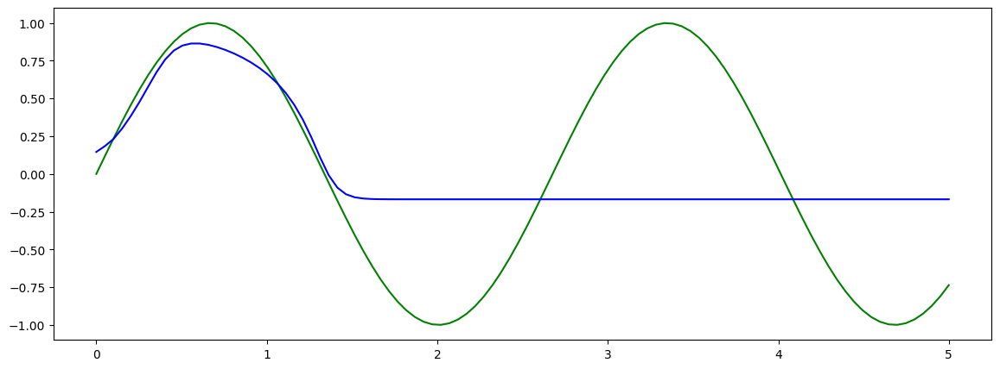

 10%|█         | 300/3000 [03:58<35:04,  1.28it/s]

1 /10 --- loss = 0.249427
Loss:  0.24942682683467865


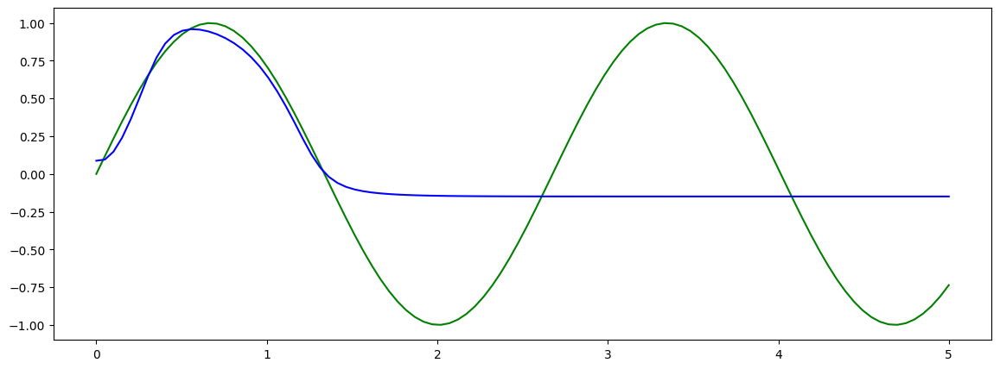

 20%|██        | 600/3000 [07:57<32:27,  1.23it/s]

2 /10 --- loss = 0.463555
Loss:  0.4635545313358307


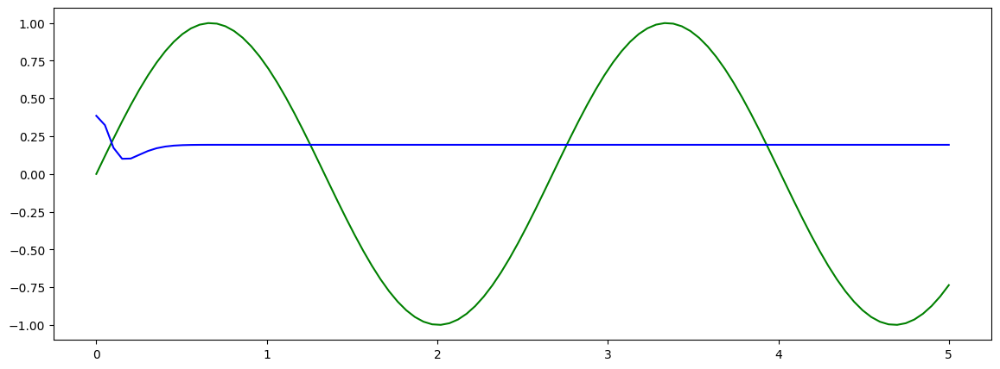

 30%|███       | 900/3000 [11:56<27:58,  1.25it/s]

3 /10 --- loss = 0.444676
Loss:  0.4446755051612854


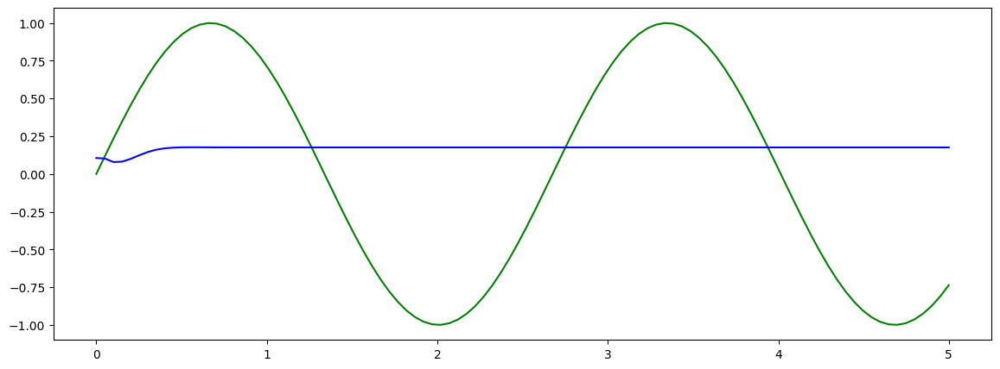

 40%|████      | 1200/3000 [16:01<24:36,  1.22it/s]

4 /10 --- loss = 0.148452
Loss:  0.14845243096351624


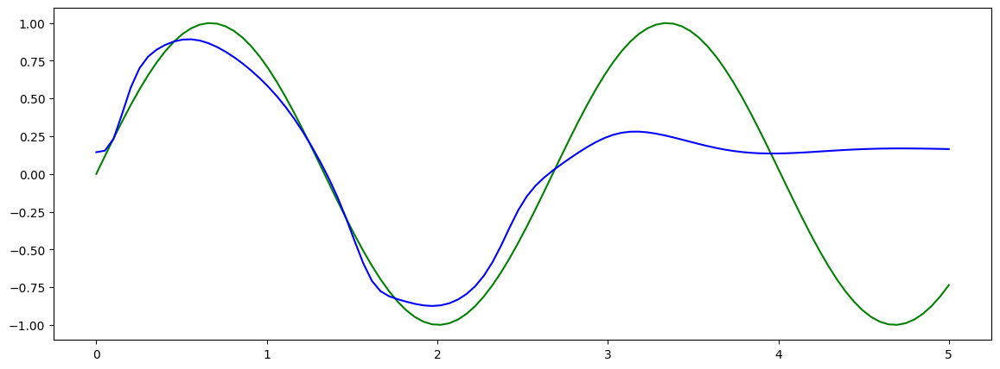

 50%|█████     | 1500/3000 [20:04<19:27,  1.29it/s]

5 /10 --- loss = 0.018555
Loss:  0.018554899841547012


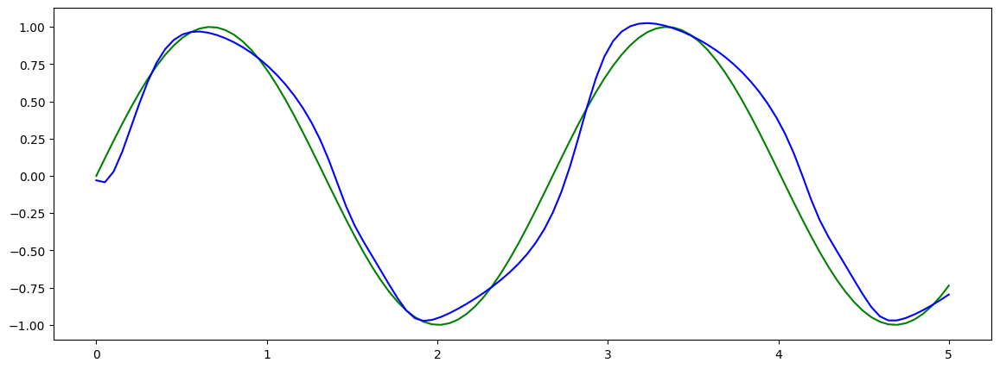

 60%|██████    | 1800/3000 [24:00<15:46,  1.27it/s]

6 /10 --- loss = 0.003949
Loss:  0.003948632162064314


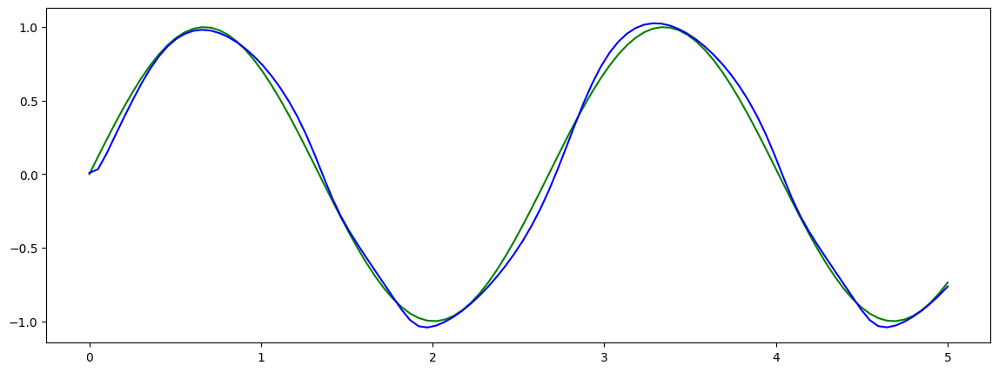

 70%|███████   | 2100/3000 [27:59<12:00,  1.25it/s]

7 /10 --- loss = 0.005597
Loss:  0.005596766248345375


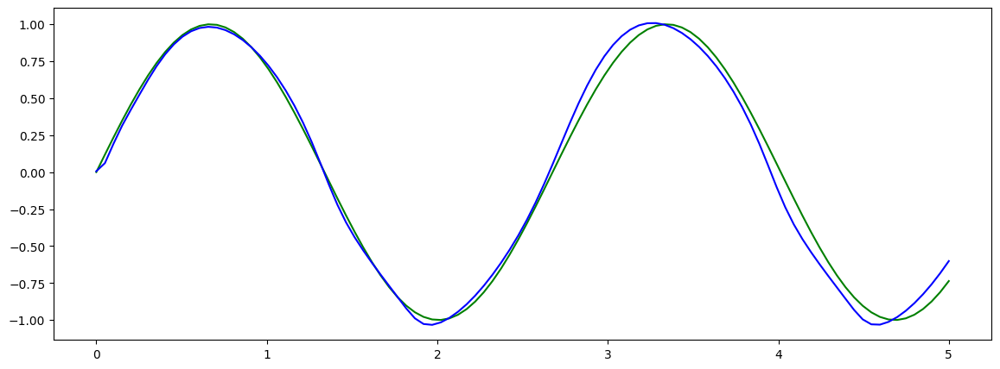

 80%|████████  | 2400/3000 [31:58<08:04,  1.24it/s]

8 /10 --- loss = 0.009513
Loss:  0.009512779302895069


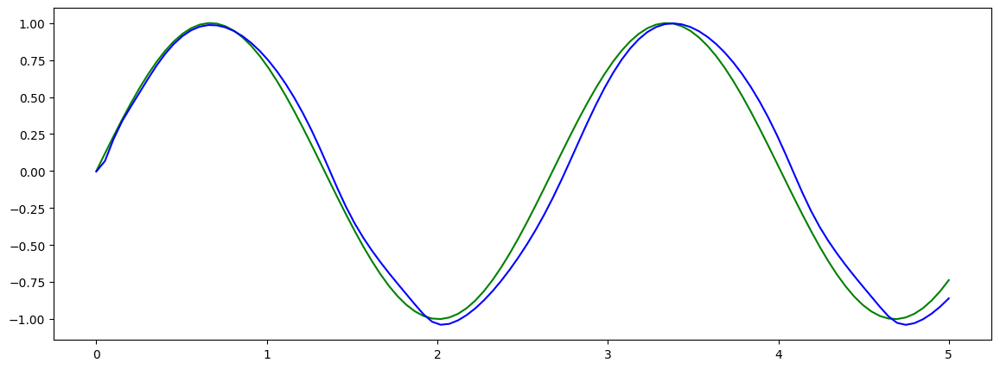

 90%|█████████ | 2700/3000 [35:57<04:00,  1.25it/s]

9 /10 --- loss = 0.001313
Loss:  0.001312607666477561


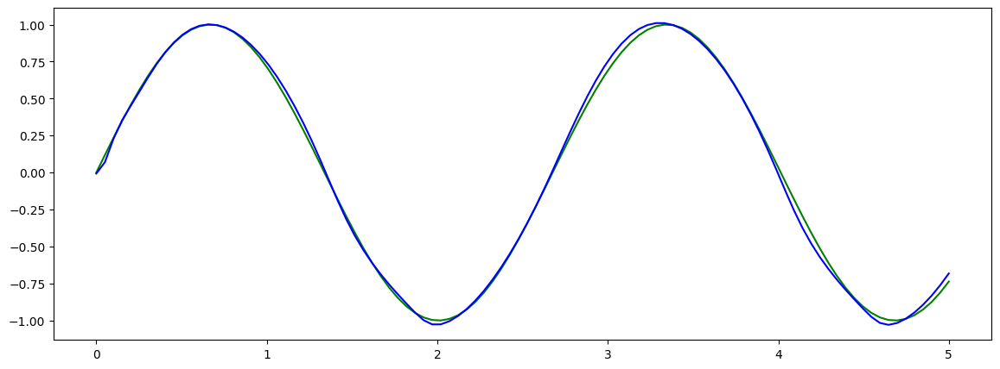

100%|██████████| 3000/3000 [39:54<00:00,  1.25it/s]

Loss:  0.0020816230680793524


In [ ]:
n_steps = 3000
losses = sin_three_bodies_rnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size,T)

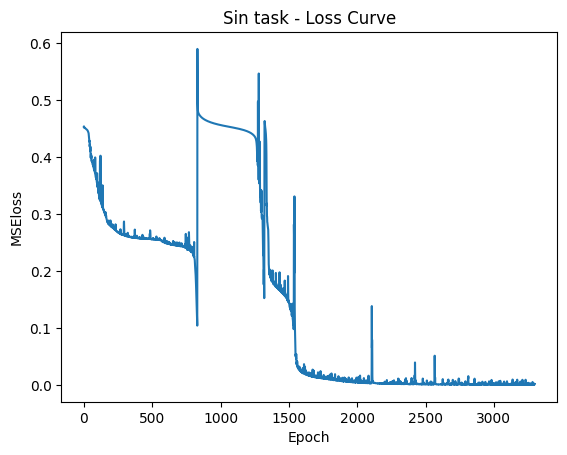

In [ ]:
_=plt.xlabel("Epoch")
_=plt.ylabel("MSEloss")
_=plt.title("Sin task - Loss Curve")
_=plt.plot(losses)

In [ ]:
with torch.no_grad():
  prediction = sin_three_bodies_rnn(Inputs,None)[0]

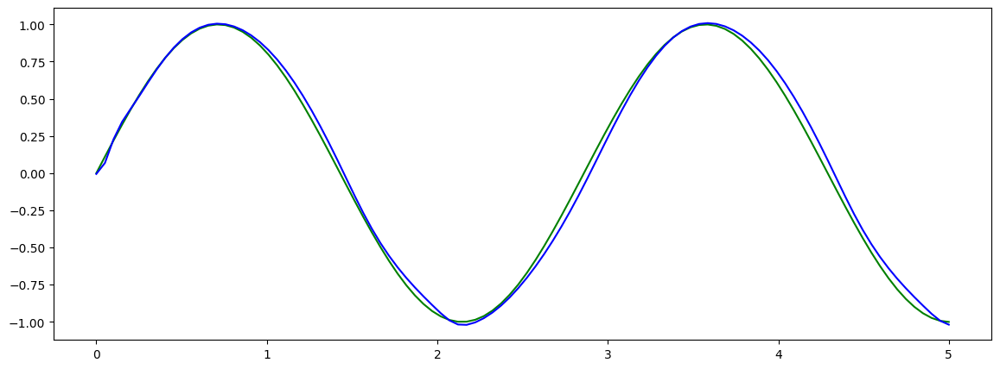

In [ ]:
plot_sin(T,Targets.cpu(),prediction.cpu(),loss=None,idx=30)

test results

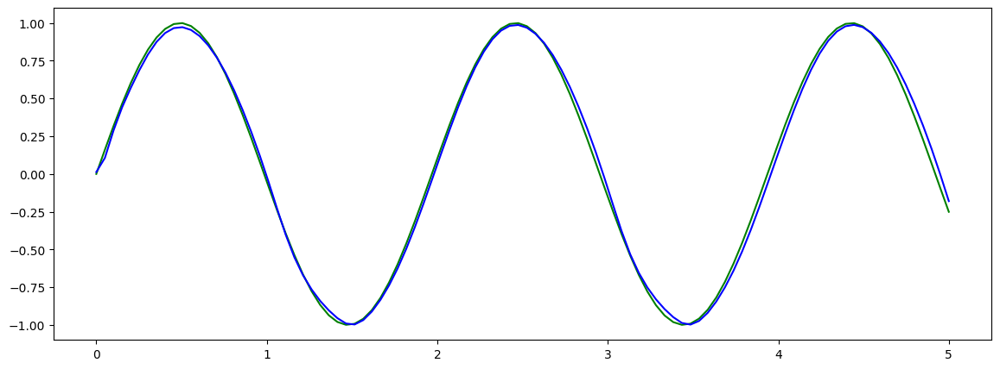

In [ ]:
test_inputs, test_targets = gen_data(10,T)
with torch.no_grad():
  test_prediction = sin_three_bodies_rnn(test_inputs,None)[0]
plot_sin(T,test_targets.cpu(),test_prediction.cpu(),loss=None,idx=9)

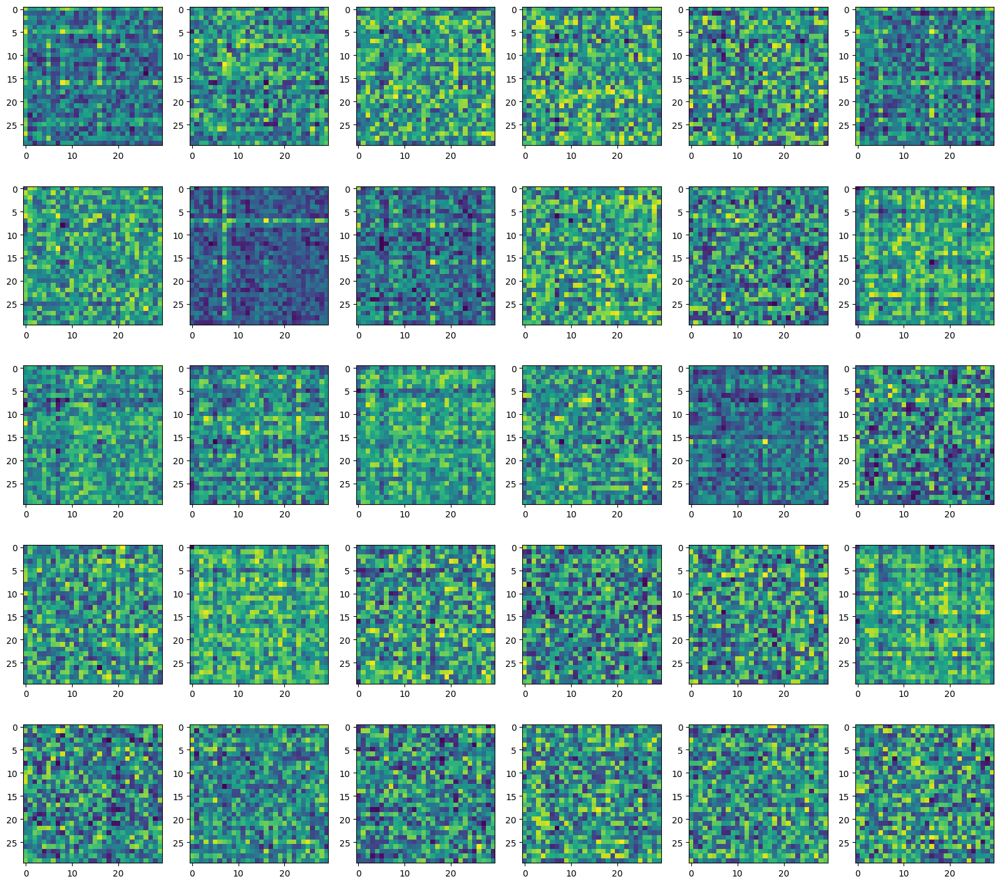

In [ ]:
utils.show_connectivity(sin_three_bodies_rnn,hidden_dim)

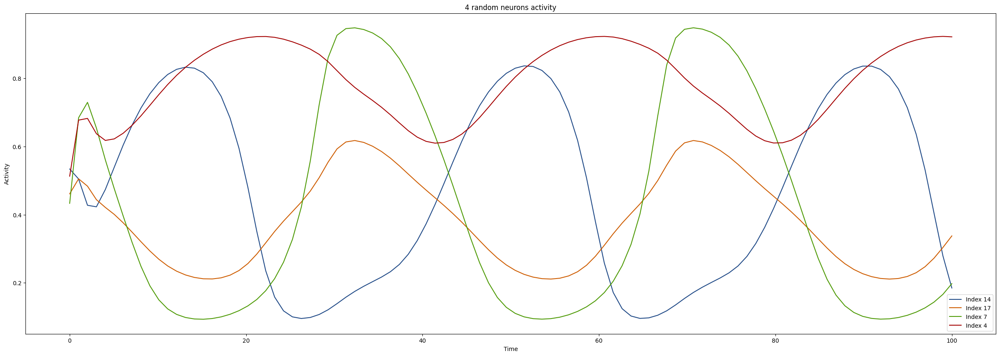

In [ ]:
utils.print_rand_neurons(sin_three_bodies_rnn,4,hidden_dim,T,test_inputs)

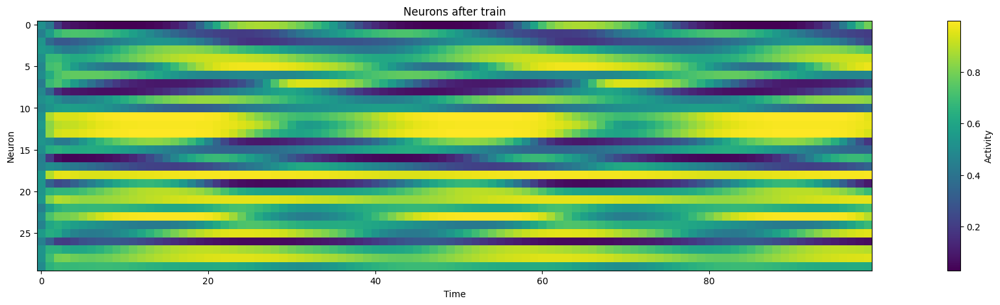

In [ ]:
utils.show_neurons(sin_three_bodies_rnn,test_inputs,T)

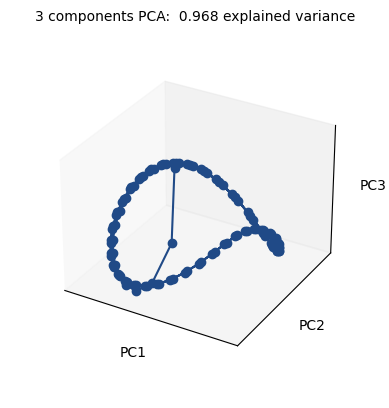

In [ ]:
utils.show_pca(sin_three_bodies_rnn,test_inputs,0)

###low rank evaluation

In [ ]:
T = 100

# decide on hyperparameters
input_size=1
output_size=1
hidden_dim=30

sin_three_bodies_rnn = Three_Bodies_RNN(input_size, output_size, hidden_dim,torch.sigmoid, task = "Sin").to(DEVICE)
sin_three_bodies_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/tb_Sinus.pth"))

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 6000
n_batch = 128
batch_size = 128

Inputs, Targets = sin_task.generate_sin_data(n_batch,T)

ranks = 10
r_losses = []

lr = 1e-04

for rank in range(1,ranks+1):
  # instantiate an low rank RNN
  low_rank_rnn = Low_Rank_Three_Way_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.sigmoid, task = "Sin").to(DEVICE)
  optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
  losses = low_rank_rnn.lr_train(Inputs,Targets,sin_three_bodies_rnn,n_steps,optimizer,criterion,batch_size,T)
  r_losses.append(losses)
  torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Three_Way_Rank_{rank}_RNN_Sinus.pth')

Output hidden; open in https://colab.research.google.com to view.

  0%|          | 0/6000 [00:00<?, ?it/s]

0 /10 --- loss = 0.109508, best = 0.109508
Loss:  0.10950790345668793


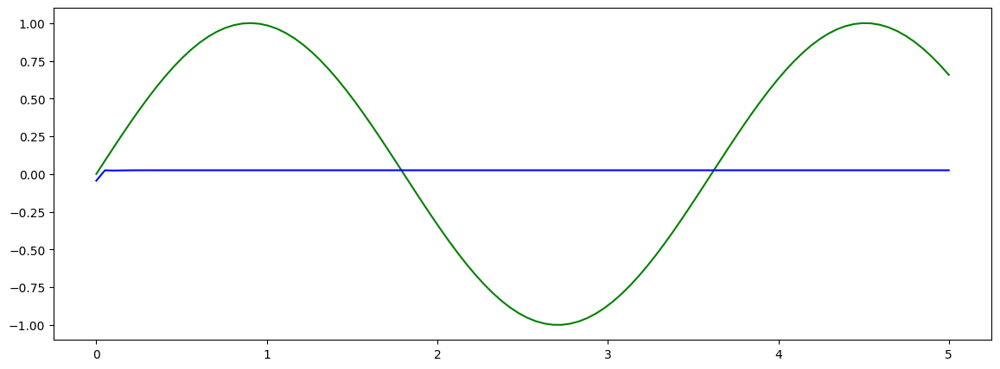

 10%|▉         | 599/6000 [00:43<06:15, 14.39it/s]

1 /10 --- loss = 0.061121, best = 0.061121
Loss:  0.06112121045589447


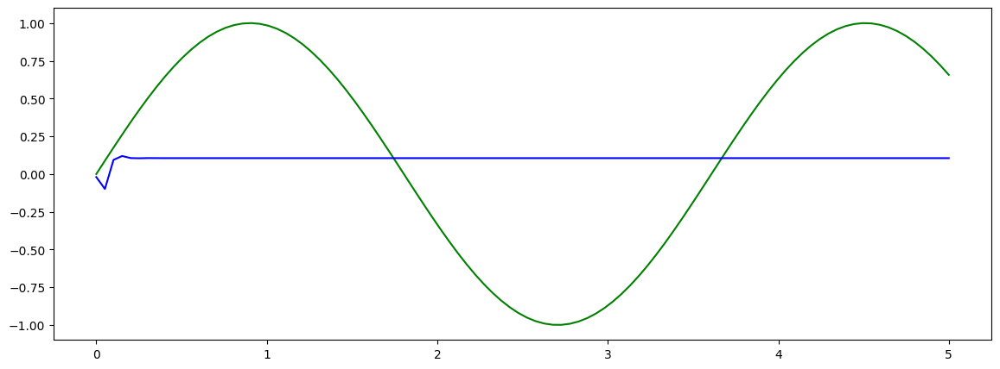

 20%|█▉        | 1199/6000 [01:27<05:49, 13.72it/s]

2 /10 --- loss = 0.050537, best = 0.050537
Loss:  0.05053731054067612


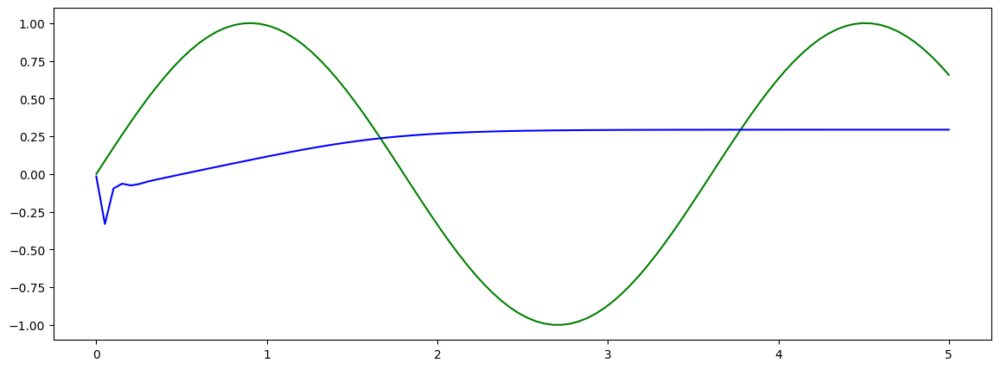

 30%|██▉       | 1799/6000 [02:11<05:01, 13.94it/s]

3 /10 --- loss = 0.033198, best = 0.033198
Loss:  0.03319811075925827


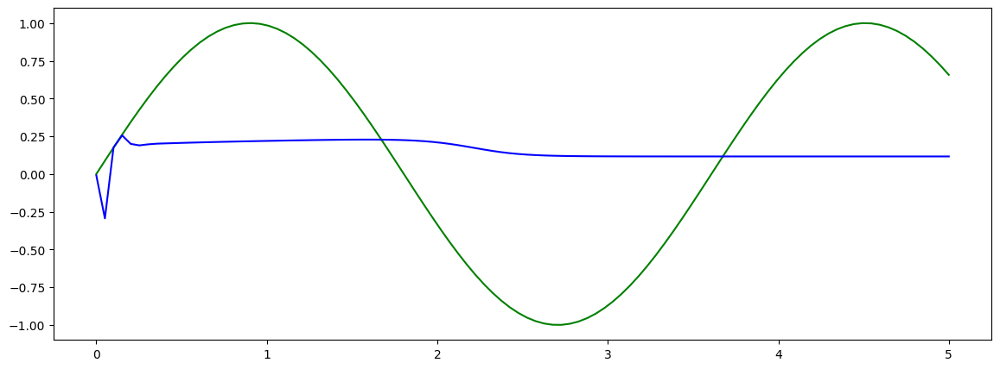

 40%|███▉      | 2399/6000 [02:54<04:12, 14.24it/s]

4 /10 --- loss = 0.028395, best = 0.028395
Loss:  0.028395209461450577


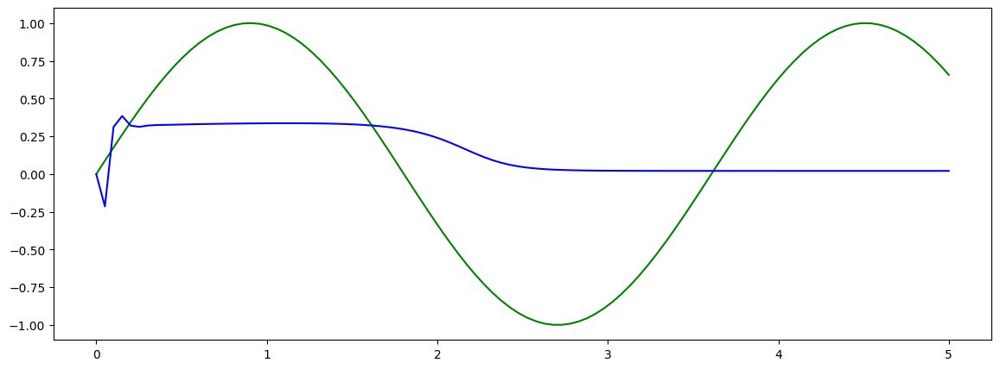

 50%|████▉     | 2999/6000 [03:39<03:40, 13.61it/s]

5 /10 --- loss = 0.024971, best = 0.024971
Loss:  0.02497139759361744


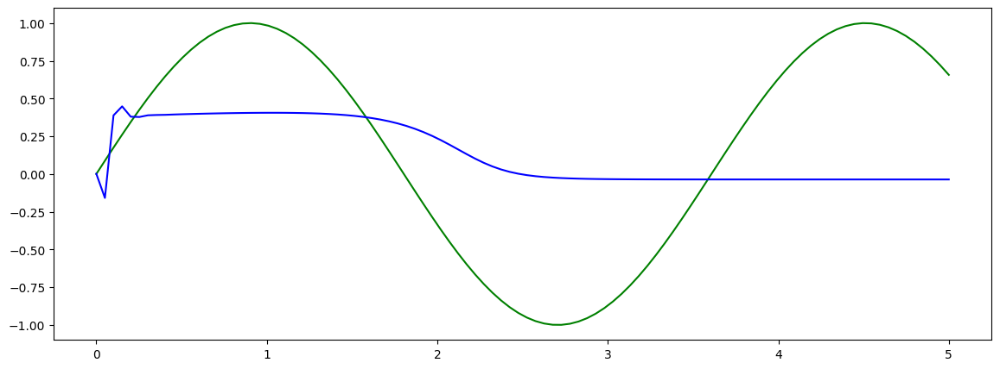

 60%|█████▉    | 3599/6000 [04:23<03:02, 13.15it/s]

6 /10 --- loss = 0.021996, best = 0.021996
Loss:  0.021995915099978447


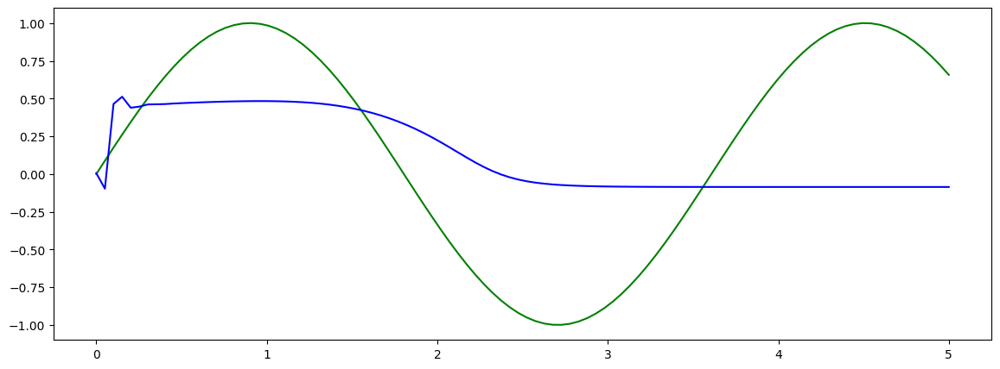

 70%|██████▉   | 4199/6000 [05:07<02:07, 14.17it/s]

7 /10 --- loss = 0.019377, best = 0.019377
Loss:  0.019376827403903008


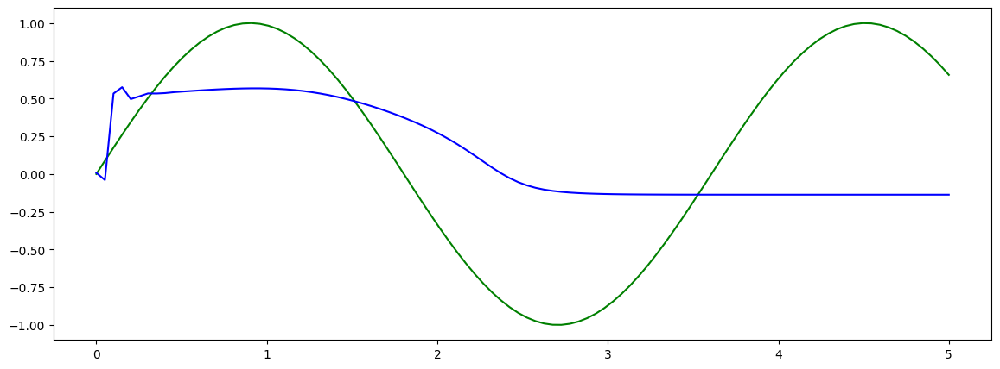

 80%|███████▉  | 4799/6000 [05:51<01:29, 13.48it/s]

8 /10 --- loss = 0.017820, best = 0.017805
Loss:  0.017820170149207115


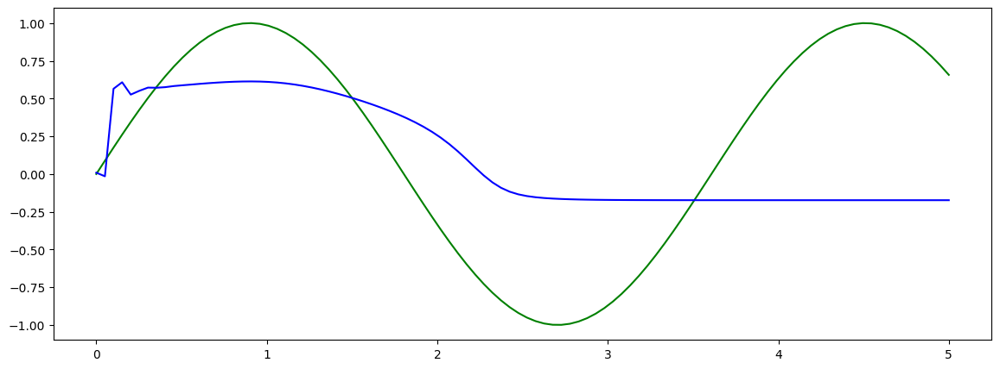

 90%|████████▉ | 5399/6000 [06:36<00:45, 13.08it/s]

9 /10 --- loss = 0.016944, best = 0.016944
Loss:  0.01694384030997753


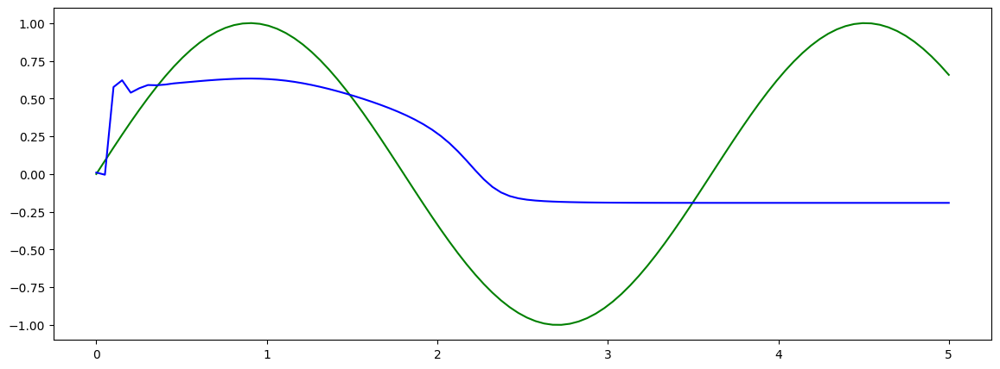

100%|██████████| 6000/6000 [07:19<00:00, 13.65it/s]

Loss:  0.01640365645289421


In [ ]:
rank=15
low_rank_rnn = Low_Rank_Three_Way_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.sigmoid, task = "Sin").to(DEVICE)
optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
losses = low_rank_rnn.lr_train(Inputs,Targets,sin_three_bodies_rnn,n_steps,optimizer,criterion,batch_size,T)
r_losses.append(losses)
torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Three_Way_Rank_{rank}_RNN_Sinus.pth')

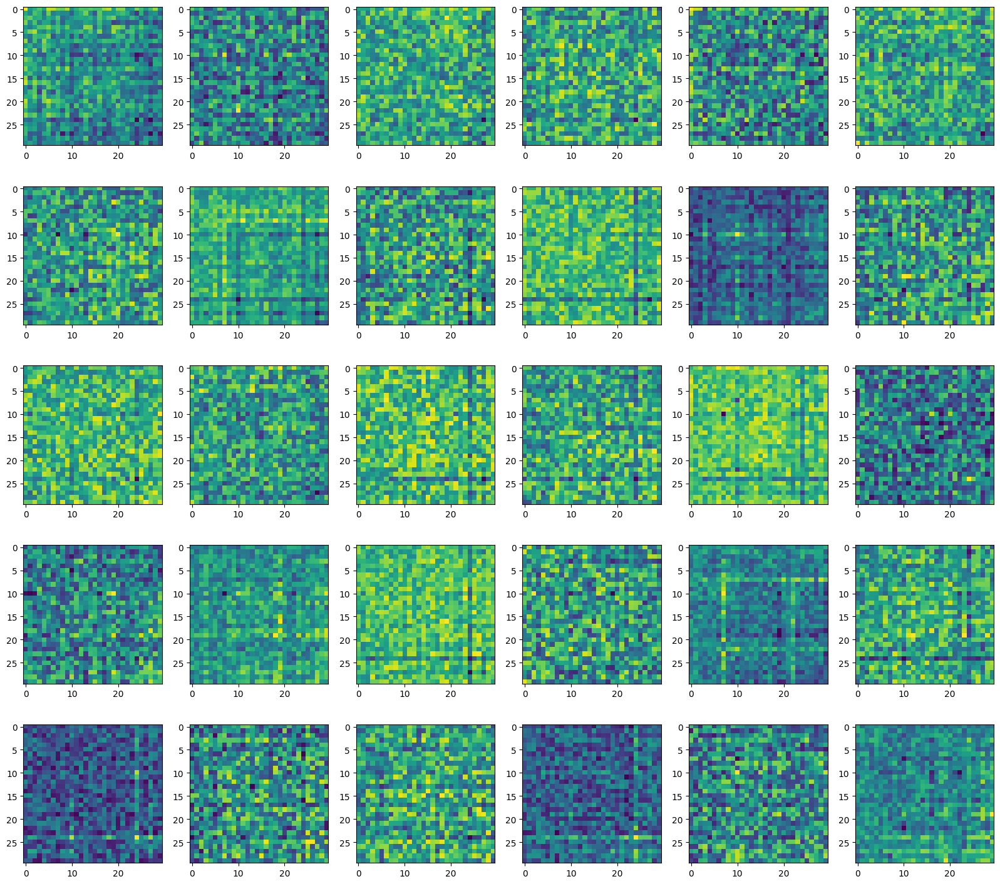

In [ ]:
utils.show_connectivity(sin_three_bodies_rnn,30)

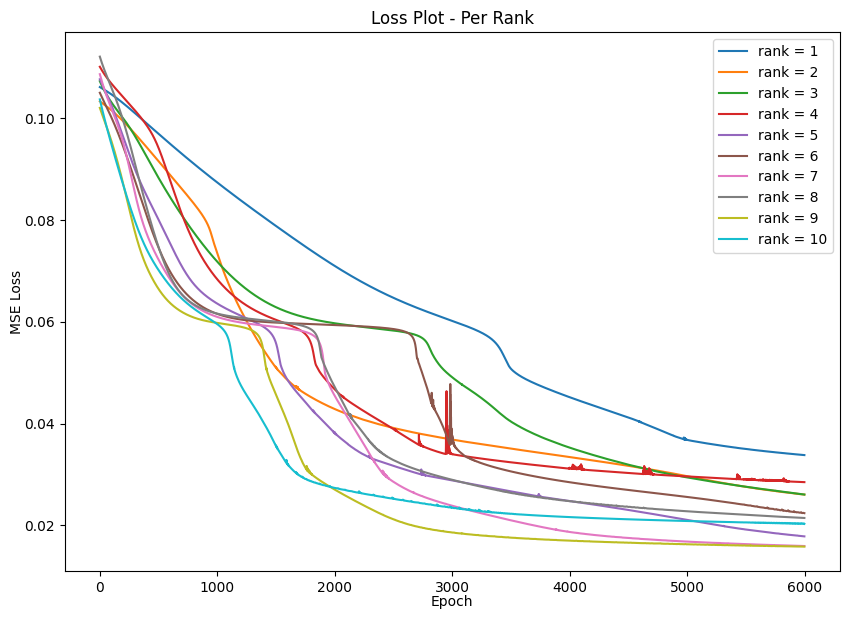

In [ ]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(1,1,1)
for rank in range(ranks):
  _=ax.plot(r_losses[rank],label = f'rank = {rank+1}')
_=ax.set_title("Loss Plot - Per Rank")
_=ax.set_xlabel("Epoch")
_=ax.set_ylabel("MSE Loss")
_=ax.legend()

  0%|          | 0/6000 [00:00<?, ?it/s]

0 /10 --- loss = 0.148161, best = 0.148161
Loss:  0.14816099405288696


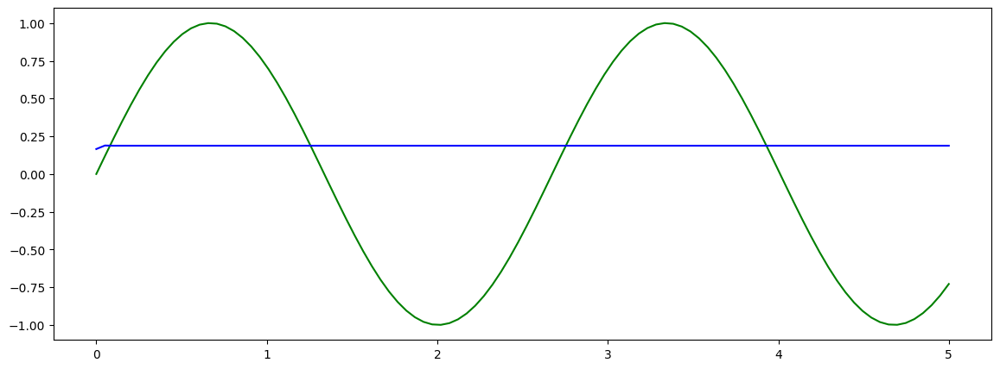

 10%|▉         | 599/6000 [00:35<05:19, 16.90it/s]

1 /10 --- loss = 0.125496, best = 0.125496
Loss:  0.1254955381155014


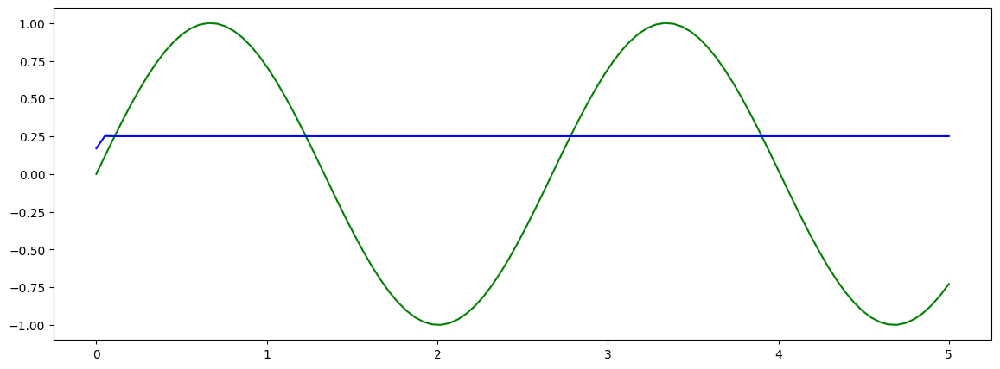

 20%|█▉        | 1199/6000 [01:10<04:40, 17.11it/s]

2 /10 --- loss = 0.101566, best = 0.101566
Loss:  0.10156556218862534


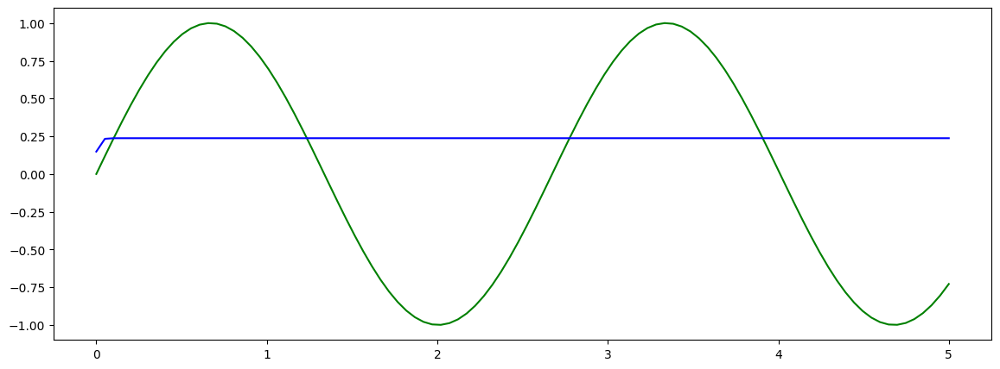

 30%|██▉       | 1799/6000 [01:47<04:41, 14.91it/s]

3 /10 --- loss = 0.085374, best = 0.085374
Loss:  0.08537446707487106


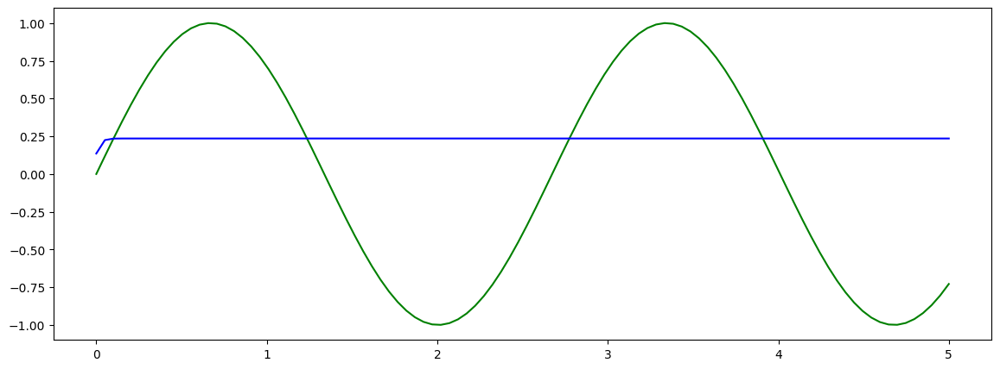

 40%|███▉      | 2399/6000 [02:23<03:30, 17.11it/s]

4 /10 --- loss = 0.074773, best = 0.074773
Loss:  0.07477300614118576


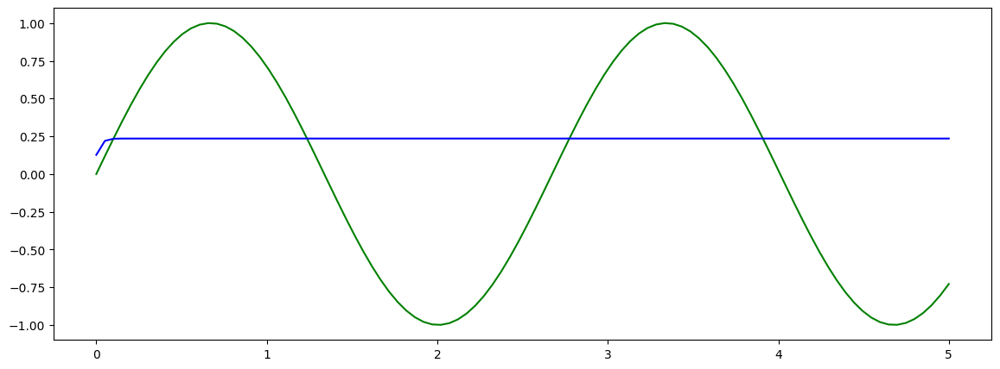

 50%|████▉     | 2999/6000 [02:58<03:06, 16.05it/s]

5 /10 --- loss = 0.067676, best = 0.067676
Loss:  0.06767597794532776


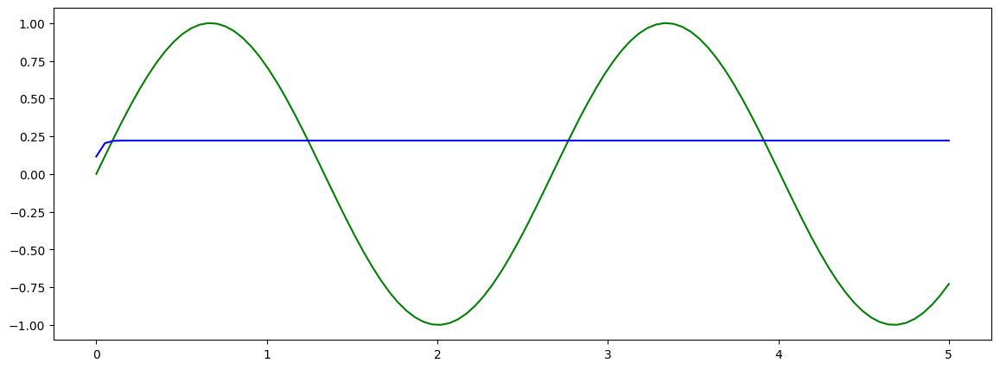

 60%|█████▉    | 3599/6000 [03:33<02:34, 15.59it/s]

6 /10 --- loss = 0.063080, best = 0.063080
Loss:  0.06308027356863022


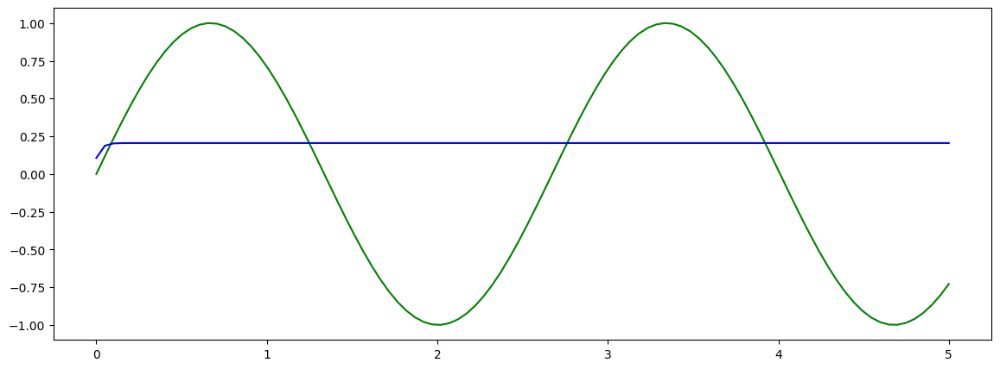

 70%|██████▉   | 4199/6000 [04:09<01:45, 17.03it/s]

7 /10 --- loss = 0.060310, best = 0.060310
Loss:  0.06031031161546707


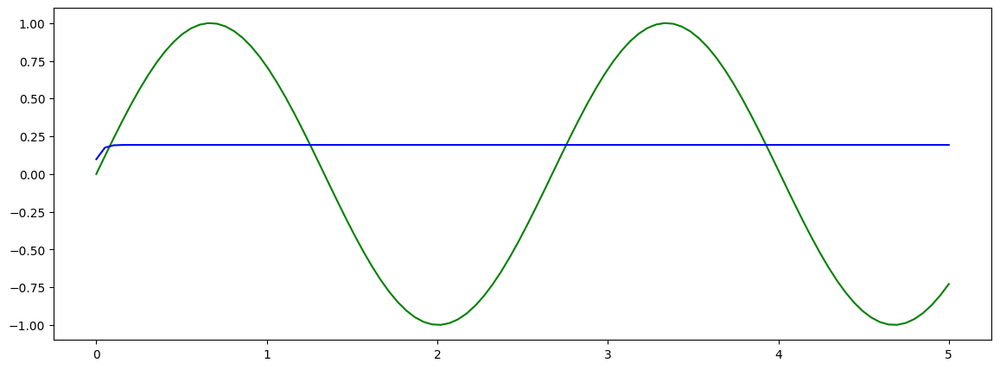

 80%|███████▉  | 4786/6000 [04:44<01:12, 16.83it/s]


KeyboardInterrupt: ignored

In [ ]:
T = 100

# decide on hyperparameters
input_size=1
output_size=1
hidden_dim=30

sin_three_bodies_rnn = Three_Bodies_RNN(input_size, output_size, hidden_dim,torch.sigmoid, task = "Sin").to(DEVICE)
sin_three_bodies_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/tb_Sinus.pth"))

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 6000
n_batch = 128
batch_size = 128

Inputs, Targets = sin_task.generate_sin_data(n_batch,T)

ranks = 10
r_losses = []

lr = 1e-04

for rank in range(1,ranks+1):
  # instantiate an low rank RNN
  low_rank_rnn = Low_Rank_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.sigmoid, task = "Sin").to(DEVICE)
  optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
  losses = low_rank_rnn.lr_train(Inputs,Targets,sin_three_bodies_rnn,n_steps,optimizer,criterion,batch_size,T)
  r_losses.append(losses)
  torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Low_Rank_{rank}_RNN_Sinus.pth')

  0%|          | 0/10000 [00:00<?, ?it/s]

0 /10 --- loss = 0.144055, best = 0.144055
Loss:  0.14405511319637299


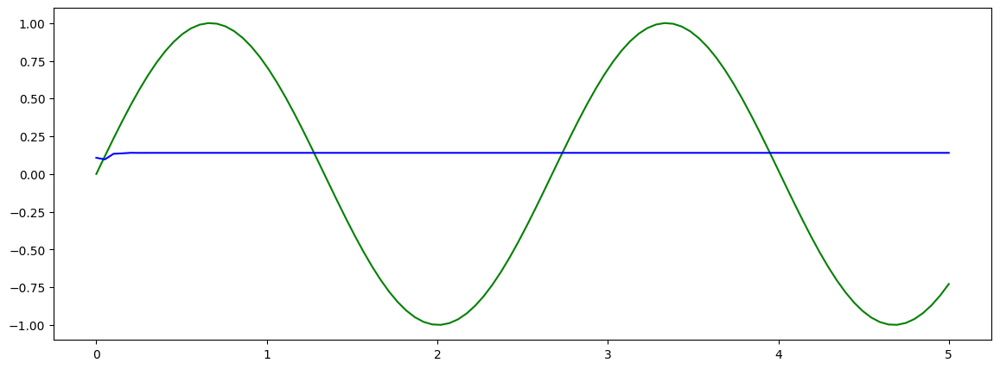

 10%|▉         | 999/10000 [01:00<09:00, 16.64it/s]

1 /10 --- loss = 0.061083, best = 0.061083
Loss:  0.06108328327536583


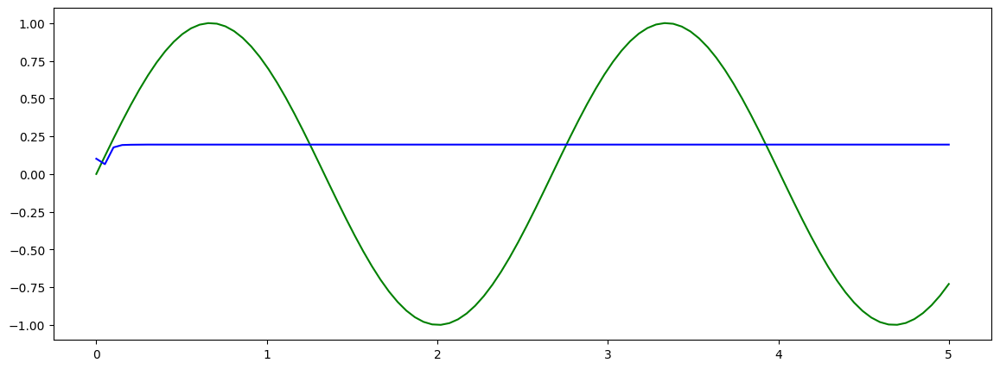

 20%|█▉        | 1999/10000 [02:02<07:45, 17.19it/s]

2 /10 --- loss = 0.026255, best = 0.026255
Loss:  0.02625528909265995


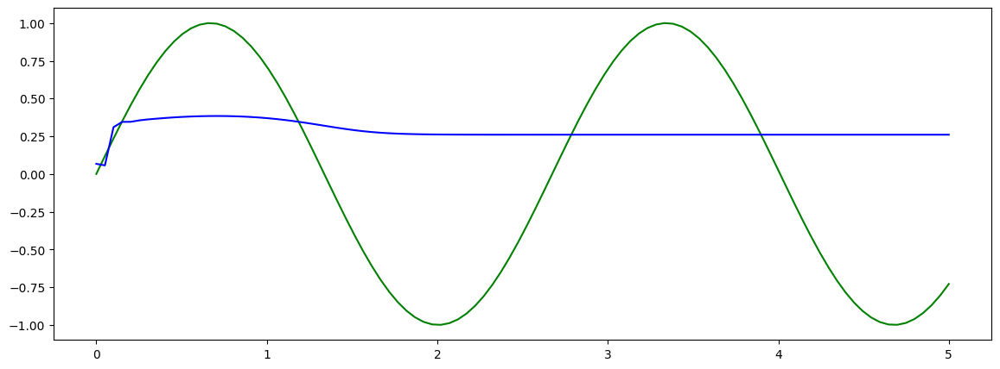

 30%|██▉       | 2999/10000 [03:03<07:04, 16.50it/s]

3 /10 --- loss = 0.019689, best = 0.019689
Loss:  0.019688500091433525


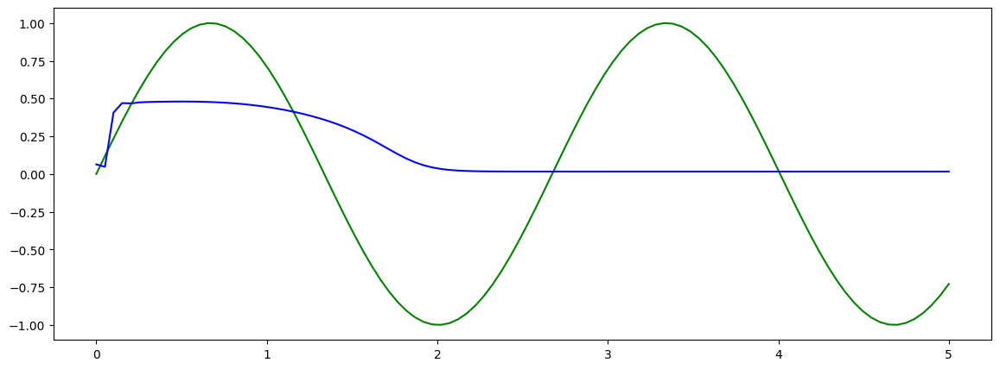

 40%|███▉      | 3999/10000 [04:03<05:55, 16.87it/s]

4 /10 --- loss = 0.017880, best = 0.017880
Loss:  0.01787981204688549


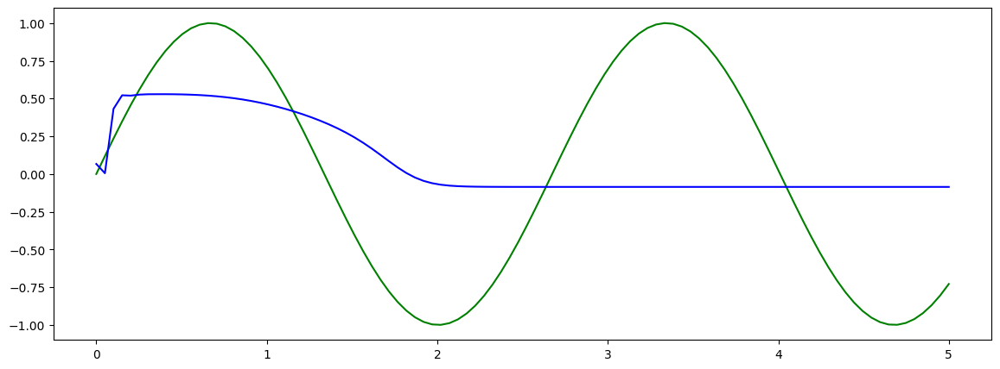

 50%|████▉     | 4999/10000 [05:03<04:57, 16.81it/s]

5 /10 --- loss = 0.016896, best = 0.016896
Loss:  0.016896480694413185


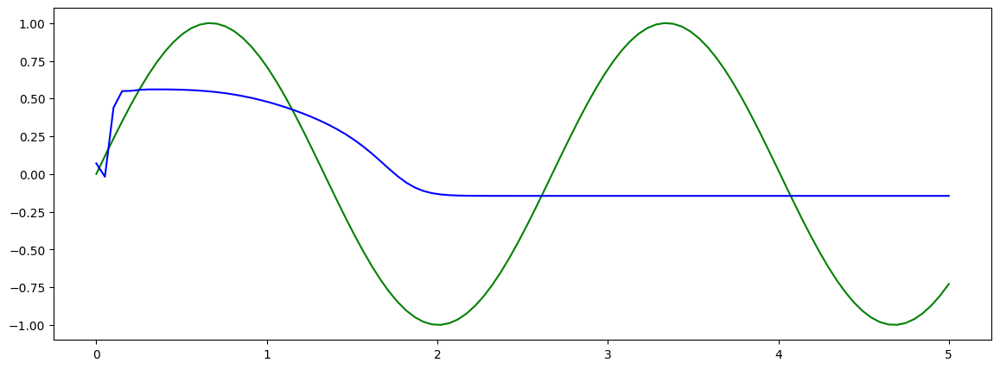

 60%|█████▉    | 5999/10000 [06:03<03:52, 17.24it/s]

6 /10 --- loss = 0.016273, best = 0.016272
Loss:  0.016273194923996925


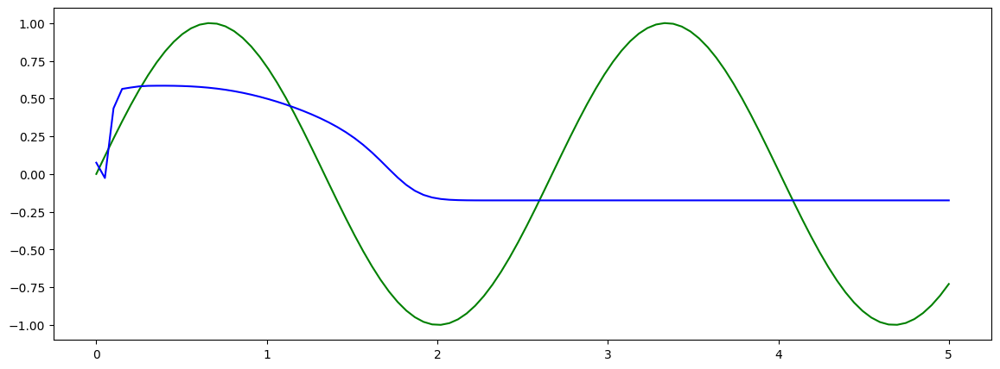

 70%|██████▉   | 6999/10000 [07:04<03:08, 15.91it/s]

7 /10 --- loss = 0.015770, best = 0.015770
Loss:  0.015770485624670982


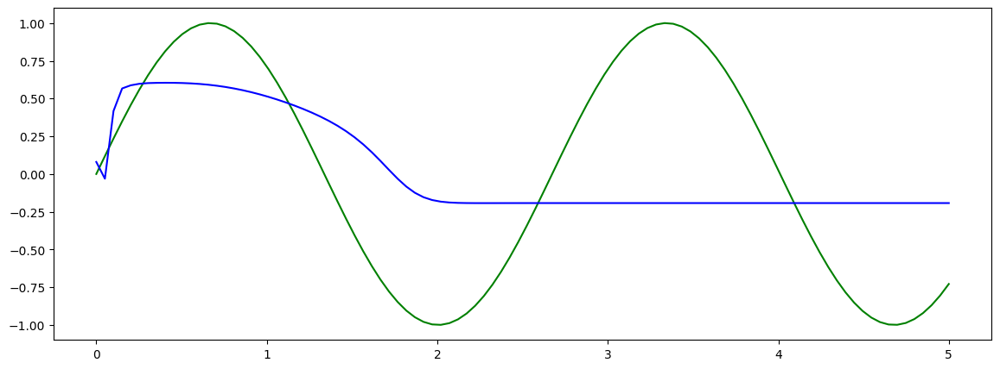

 80%|███████▉  | 7999/10000 [08:05<01:59, 16.69it/s]

8 /10 --- loss = 0.015339, best = 0.015339
Loss:  0.015338883735239506


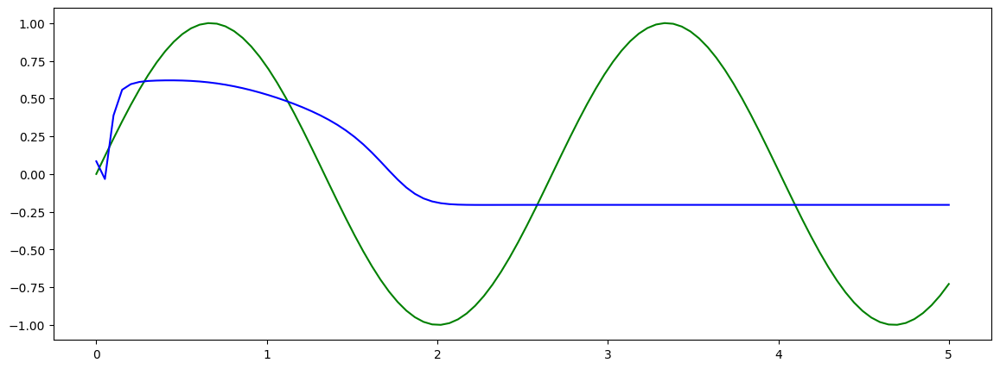

 90%|████████▉ | 8999/10000 [09:05<01:00, 16.58it/s]

9 /10 --- loss = 0.014955, best = 0.014953
Loss:  0.01495504379272461


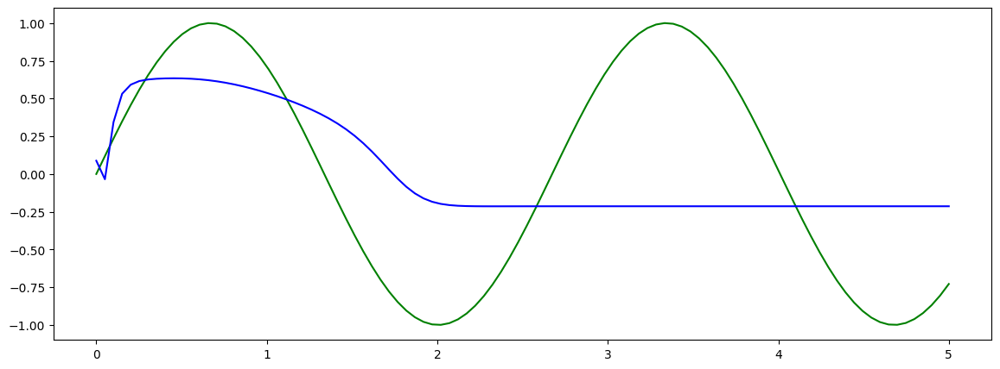

100%|██████████| 10000/10000 [10:08<00:00, 16.44it/s]


Loss:  0.01454521156847477


In [ ]:
rank=30
low_rank_rnn = Low_Rank_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.sigmoid, task = "Sin").to(DEVICE)
optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
losses = low_rank_rnn.lr_train(Inputs,Targets,sin_three_bodies_rnn,10000,optimizer,criterion,batch_size,T)
r_losses.append(losses)
torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Low_Rank_{rank}_RNN_Sinus.pth')

##K Bit Flip Flop task

### Experiment with tanh

<ipython-input-14-feba2fe119f0>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)
  0%|          | 0/3000 [00:00<?, ?it/s]

0 /10 --- loss = 0.993166


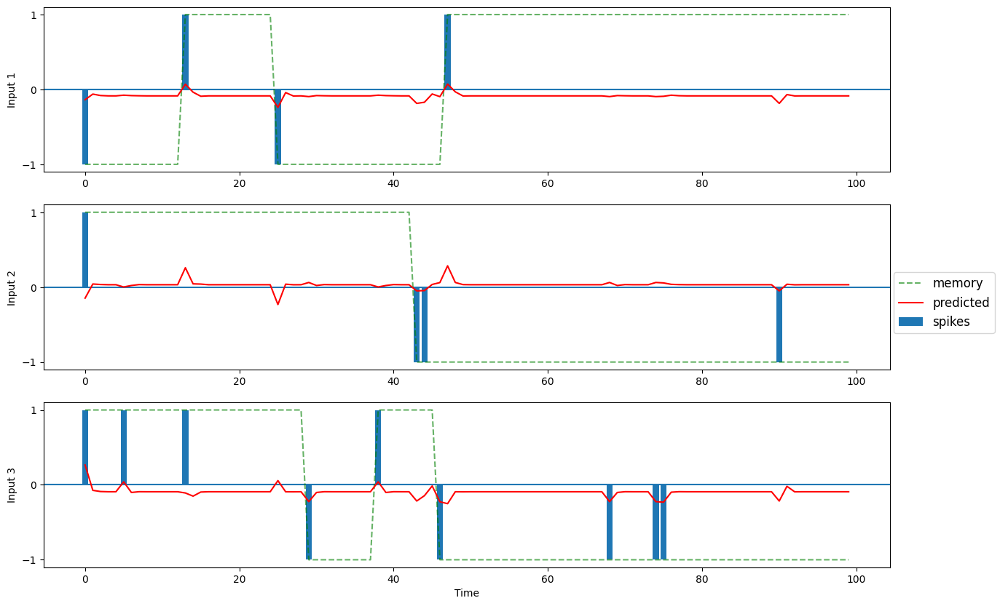

 10%|█         | 300/3000 [03:40<33:43,  1.33it/s]

1 /10 --- loss = 0.620774


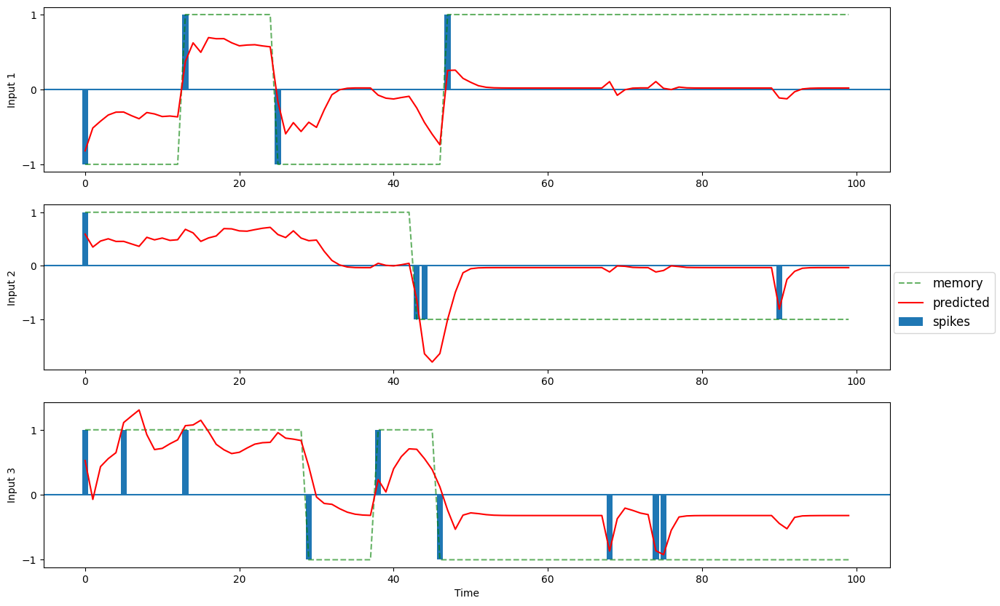

 20%|██        | 600/3000 [07:20<28:57,  1.38it/s]

2 /10 --- loss = 0.134335


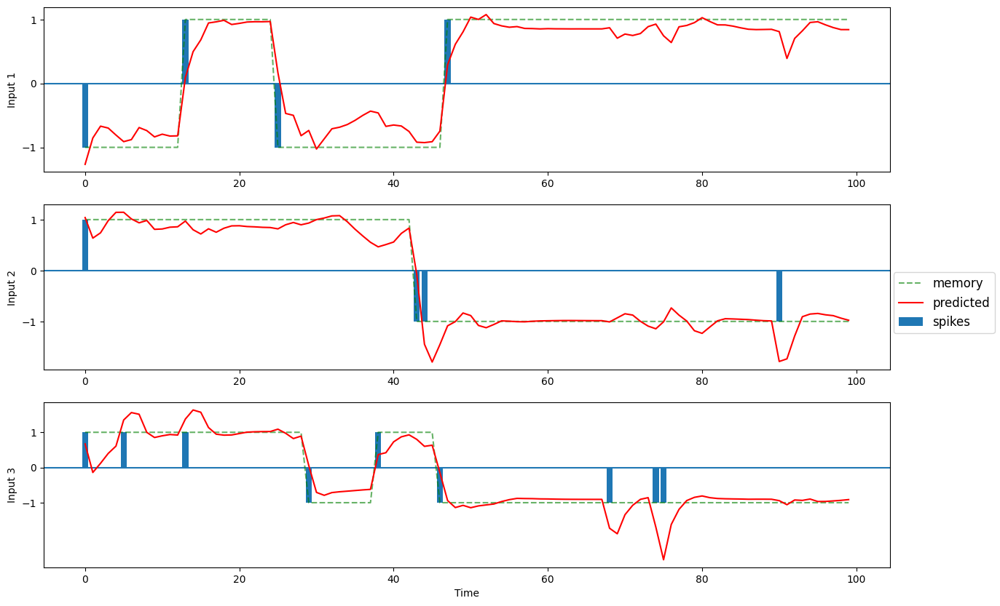

 30%|███       | 900/3000 [11:01<24:52,  1.41it/s]

3 /10 --- loss = 0.061447


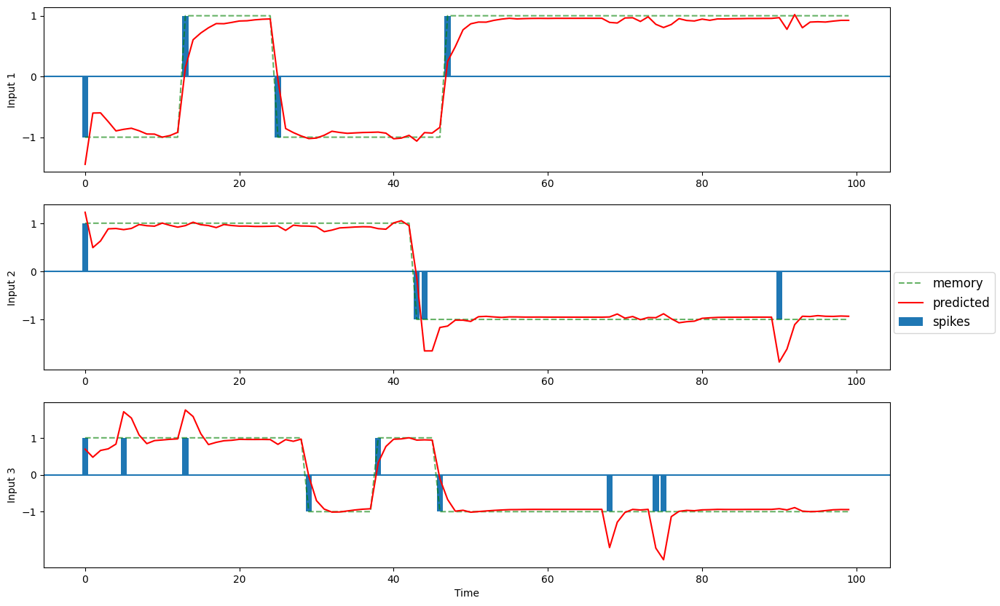

 40%|████      | 1200/3000 [14:43<21:27,  1.40it/s]

4 /10 --- loss = 0.045346


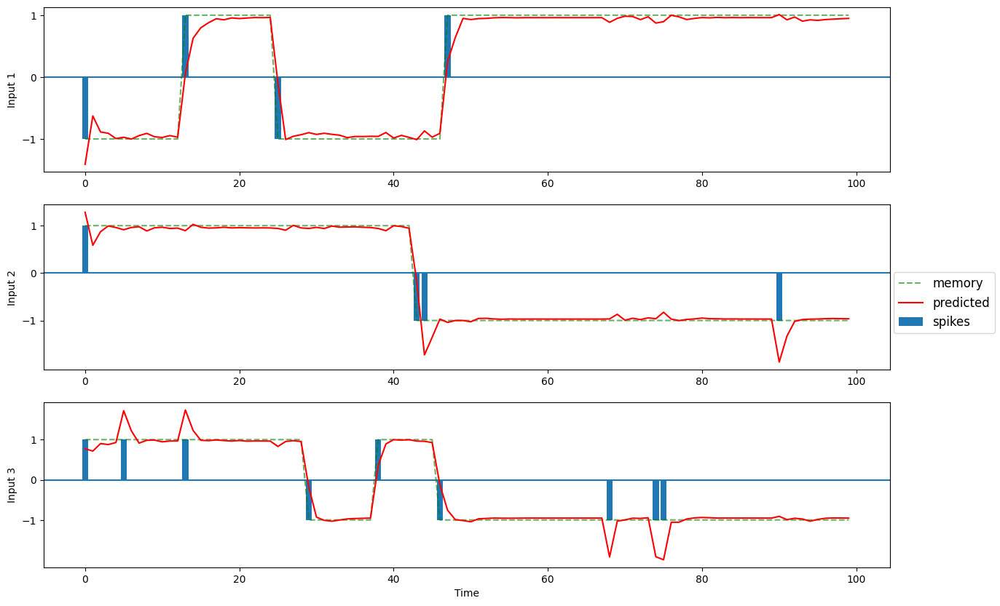

 50%|█████     | 1500/3000 [18:20<18:11,  1.37it/s]

5 /10 --- loss = 0.029316


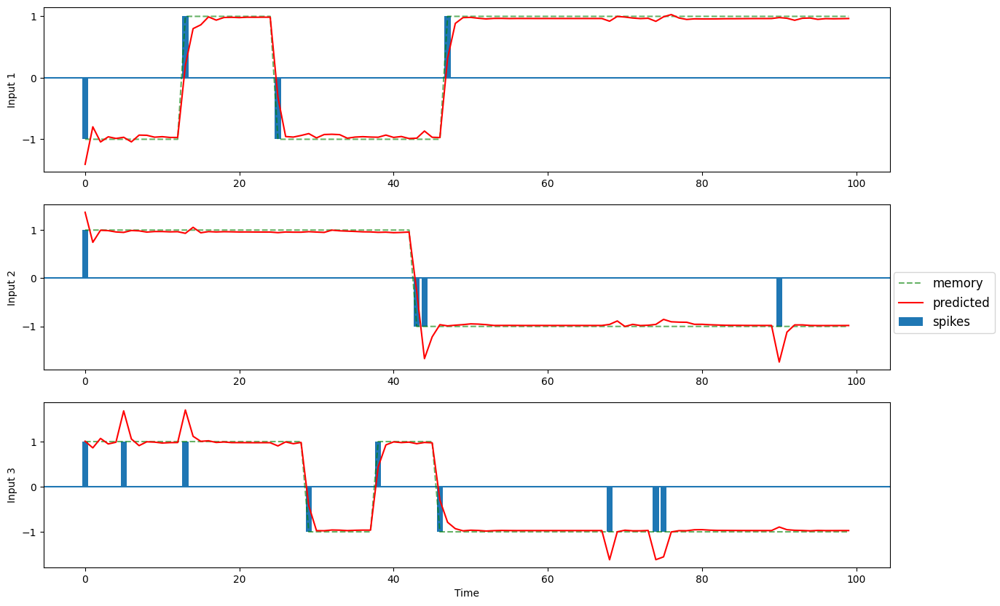

 60%|██████    | 1800/3000 [22:05<15:01,  1.33it/s]

6 /10 --- loss = 0.013221


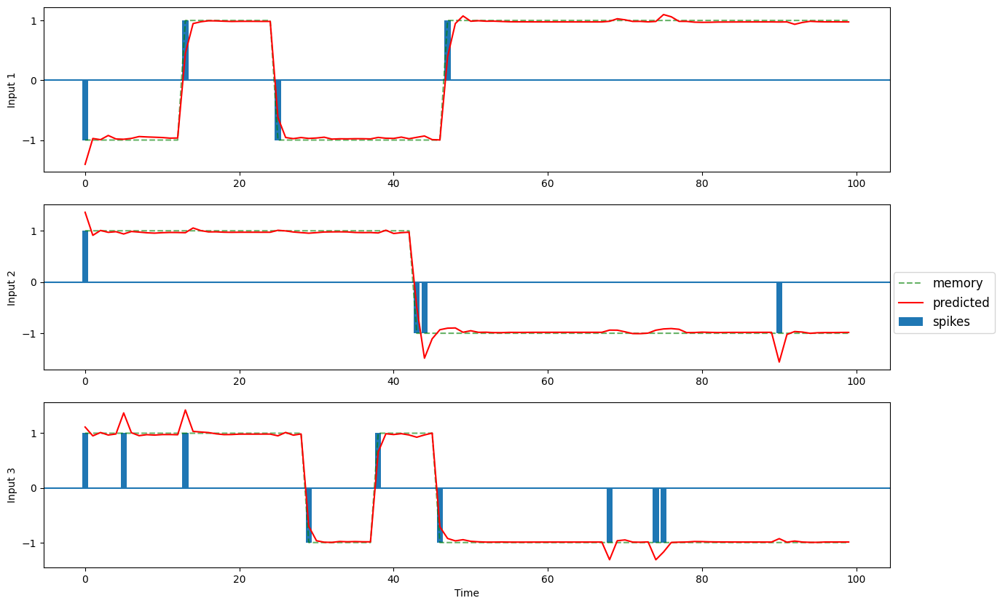

 70%|███████   | 2100/3000 [25:49<11:00,  1.36it/s]

7 /10 --- loss = 0.003422


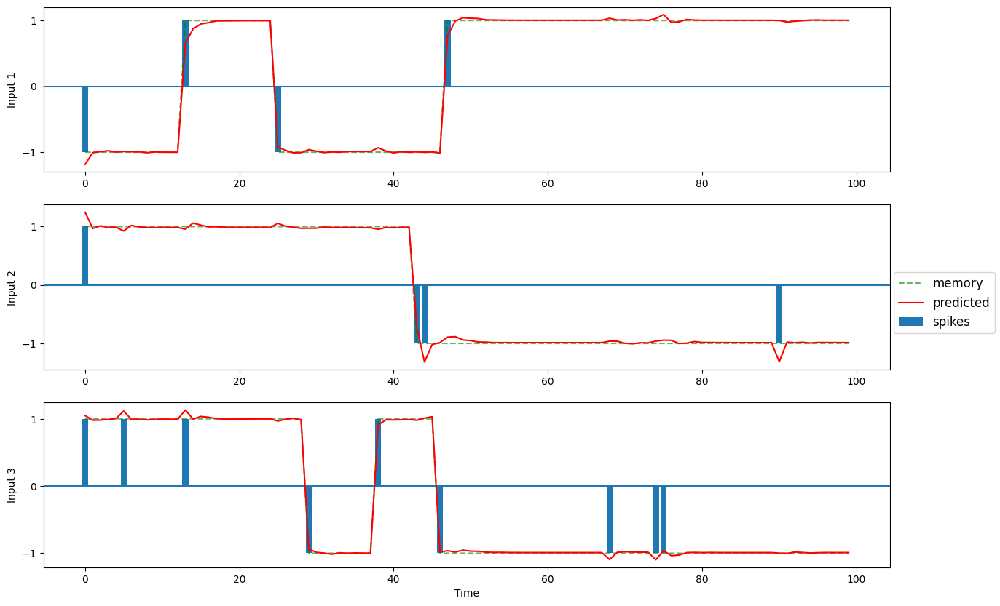

 80%|████████  | 2400/3000 [29:32<07:15,  1.38it/s]

8 /10 --- loss = 0.000568


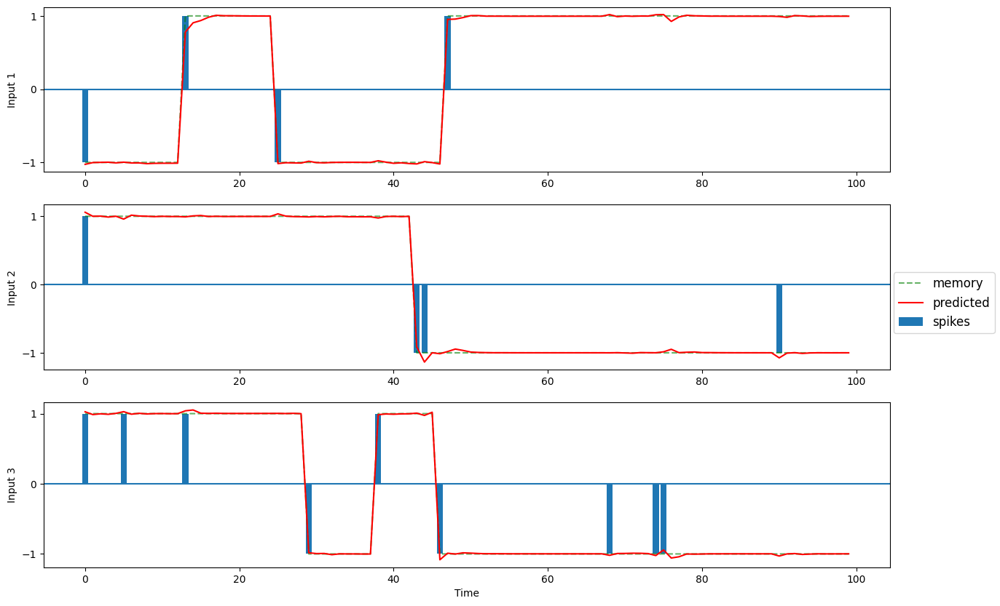

 90%|█████████ | 2700/3000 [33:14<03:37,  1.38it/s]

9 /10 --- loss = 0.000183


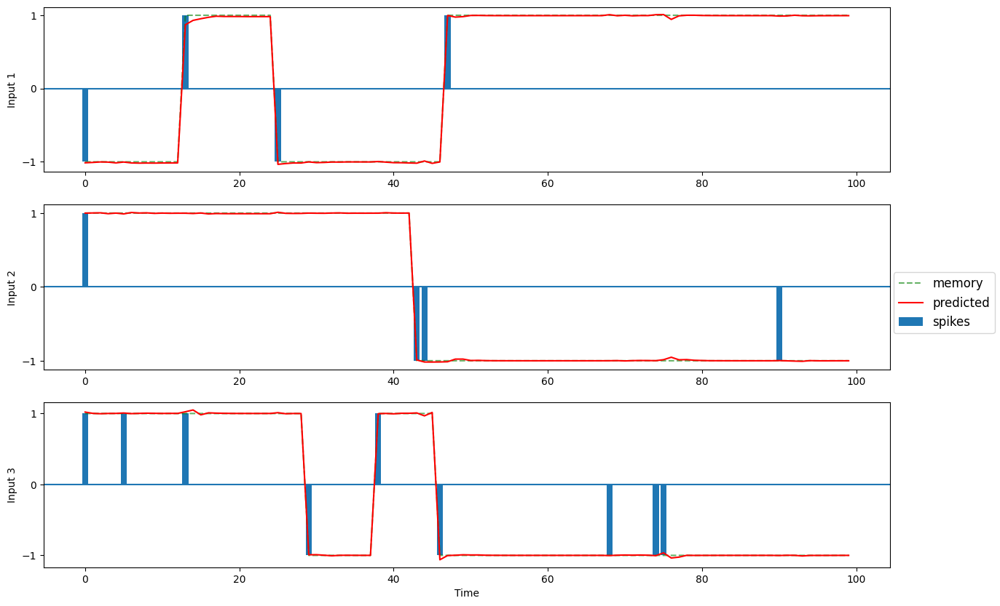

100%|██████████| 3000/3000 [36:55<00:00,  1.35it/s]

Loss:  7.068771083140746e-05


In [ ]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)

# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

tb_rnn = Three_Bodies_RNN(input_size, output_size, hidden_dim).to(DEVICE)

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(tb_rnn.parameters(), lr=1e-04)

# train parameters
n_steps = 3000
n_batch = 1000

# T time steps
time_steps = np.arange(T)

# generate new data
Inputs, Targets = generate_data(n_batch,T,K)

losses = tb_rnn.train(Inputs,Targets,n_steps,n_batch,optimizer,criterion,T)

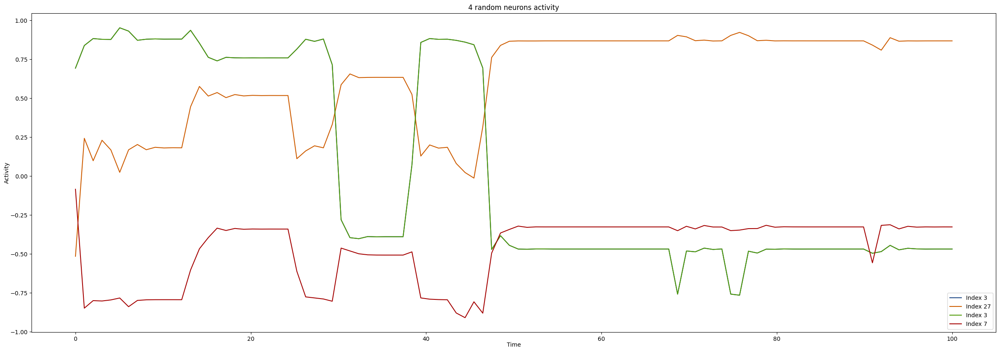

In [ ]:
print_rand_neurons(tb_rnn,4,hidden_dim,100,Inputs)

<ipython-input-68-3290ac170135>:19: MatplotlibDeprecationWarning: The dist attribute was deprecated in Matplotlib 3.6 and will be removed two minor releases later.
  ax.dist = 12


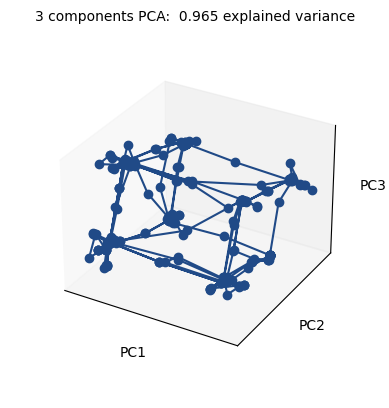

In [ ]:
idx=8
R = tb_rnn(Inputs2,None)[2][idx].cpu().transpose(0,1)

pca=PCA(n_components=30)
pca.fit(R.detach().numpy().T)

variance = pca.explained_variance_ratio_.cumsum()

V=pca.transform(R.detach().numpy().T)

fig = plt.figure()
ax = plt.axes(projection='3d')

# Plot every int_t = 10 steps
int_t = 1
ax.plot(V[::int_t,0],V[::int_t,1],V[::int_t,2], '-o',color = colors[0])

plt.rcParams['axes.labelpad'] = 0.1
ax.dist = 12

ax.grid('off')

ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

ax.set_title("3 components PCA: {var: .3g} explained variance".format(var = variance[2]),fontsize=10)

plt.show()

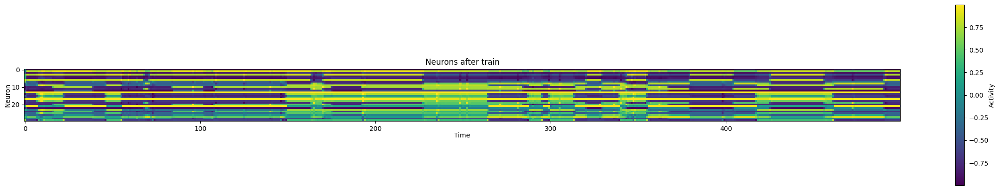

In [ ]:
show_neurons(model,Inputs2,T=1000)

In [ ]:
torch.save(tb_rnn.state_dict(),"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth")

In [ ]:
model = Three_Bodies_RNN(input_size, output_size, hidden_dim).to(DEVICE)
model.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth"))

<All keys matched successfully>

  0%|          | 0/1000 [00:00<?, ?it/s]

0 /10 --- loss = 0.000069


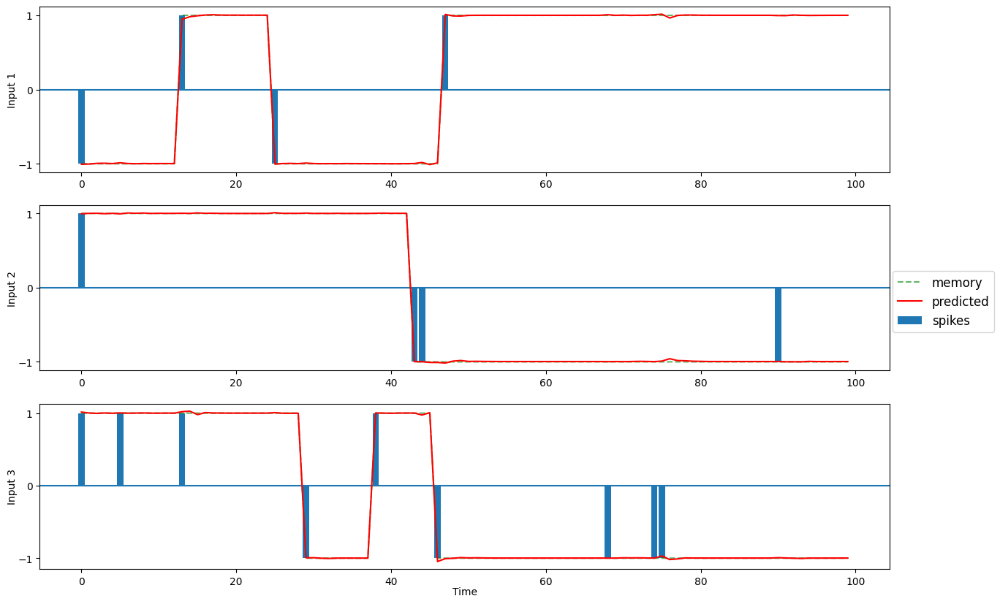

 10%|█         | 100/1000 [01:17<11:39,  1.29it/s]

1 /10 --- loss = 0.000064


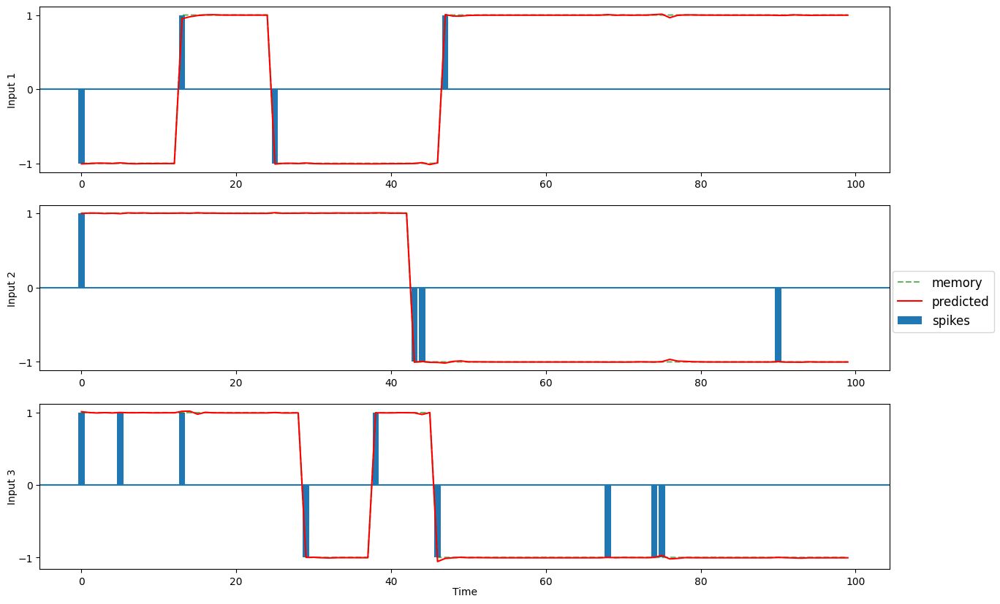

 20%|██        | 200/1000 [02:34<10:10,  1.31it/s]

2 /10 --- loss = 0.000061


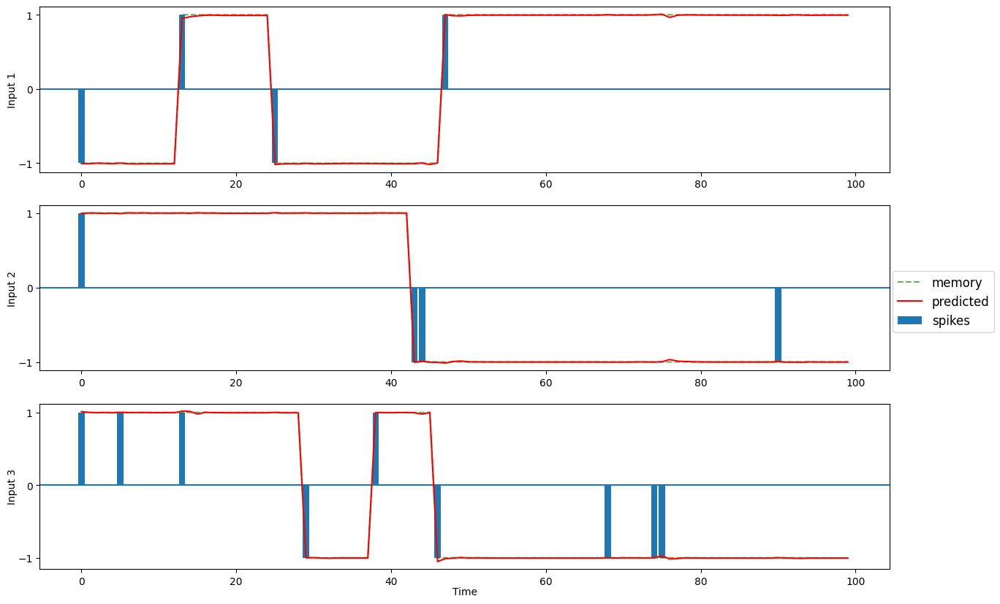

 30%|███       | 300/1000 [03:52<08:44,  1.34it/s]

3 /10 --- loss = 0.000065


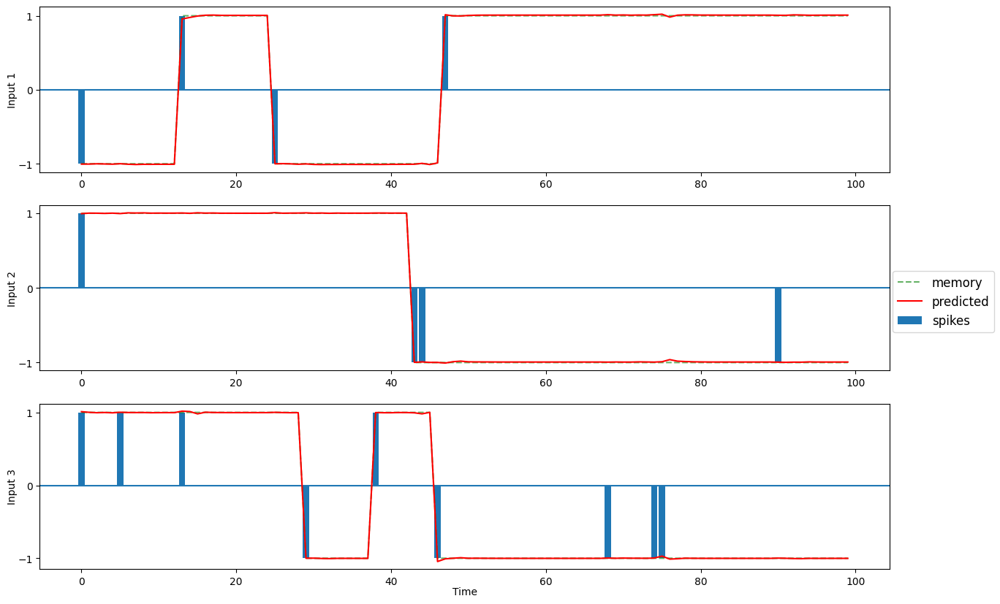

 40%|████      | 400/1000 [05:10<07:37,  1.31it/s]

4 /10 --- loss = 0.000038


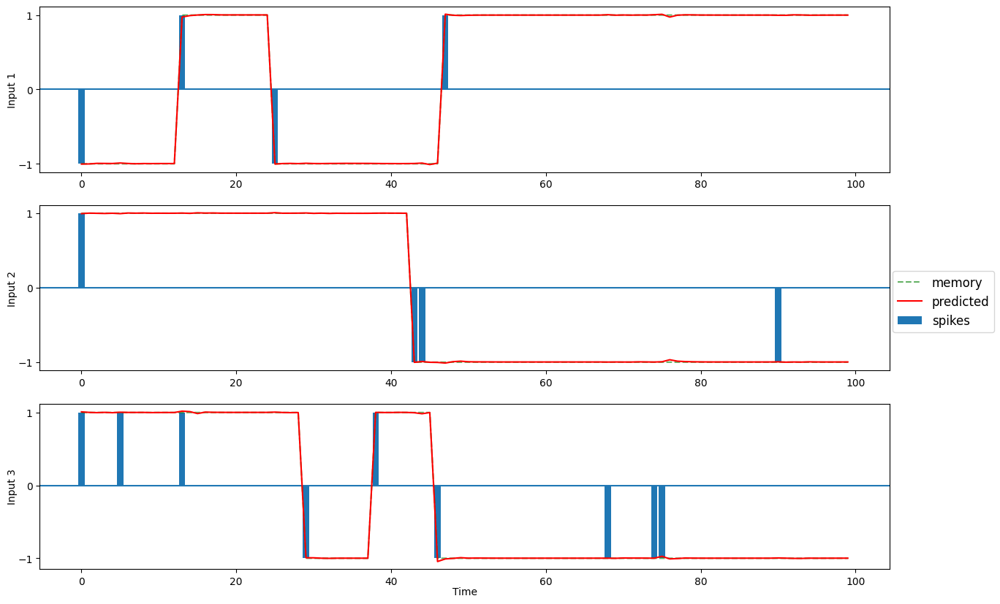

 50%|█████     | 500/1000 [06:28<06:16,  1.33it/s]

5 /10 --- loss = 0.000030


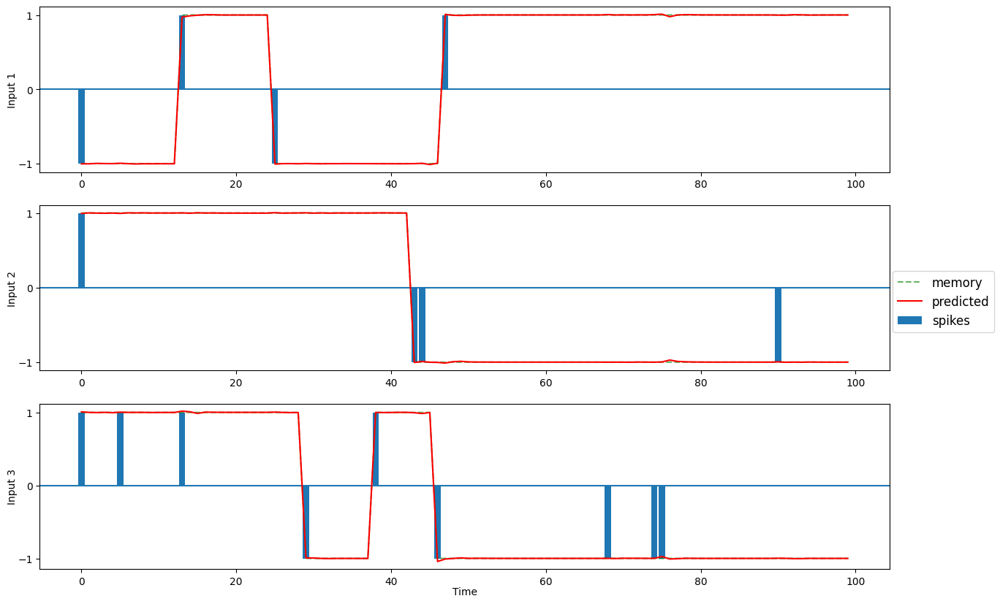

 60%|██████    | 600/1000 [07:45<05:06,  1.30it/s]

6 /10 --- loss = 0.000049


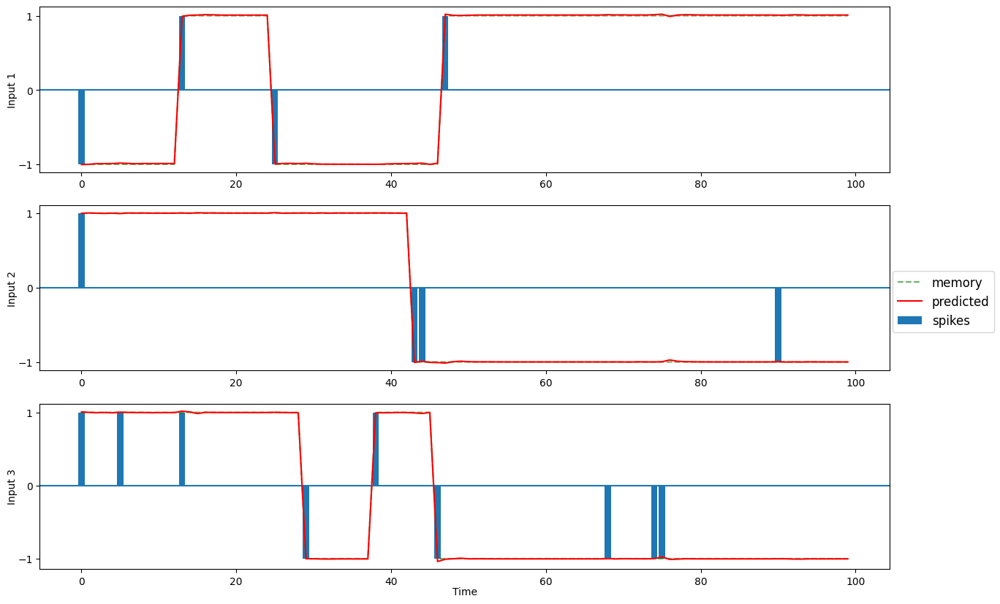

 70%|███████   | 700/1000 [09:03<03:53,  1.28it/s]

7 /10 --- loss = 0.000026


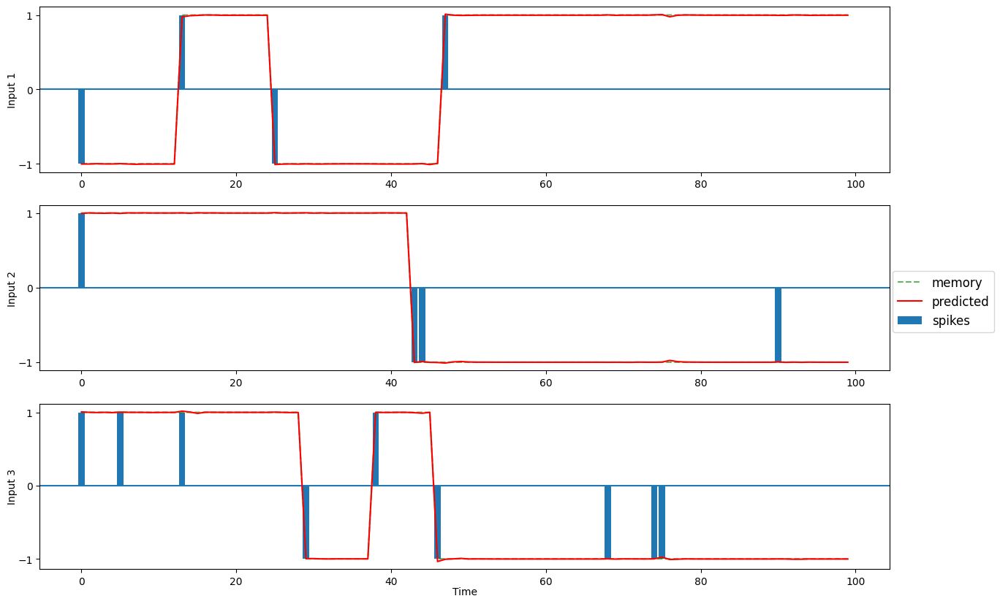

 80%|████████  | 800/1000 [10:21<02:35,  1.29it/s]

8 /10 --- loss = 0.000022


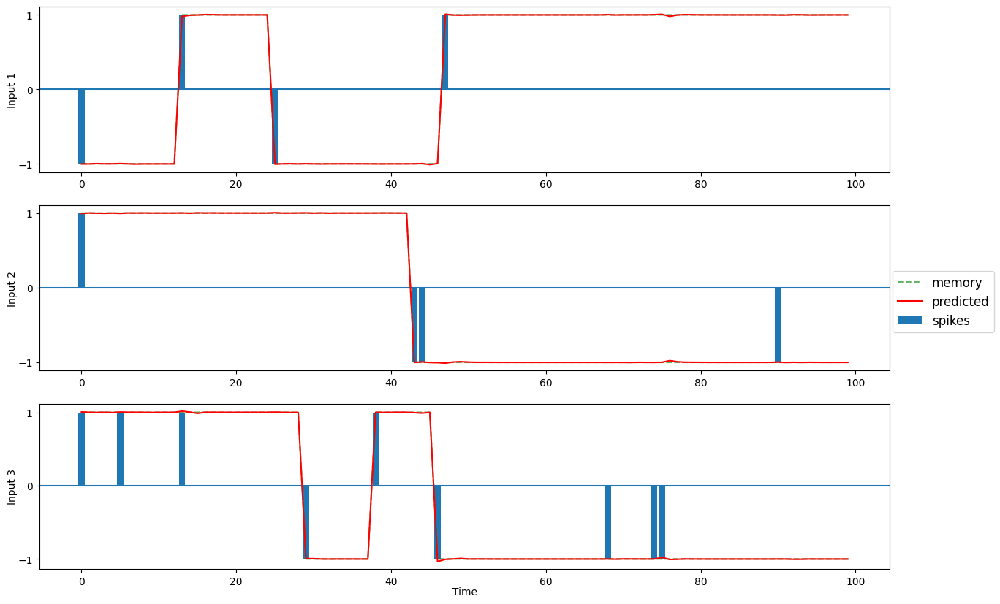

 90%|█████████ | 900/1000 [11:39<01:15,  1.32it/s]

9 /10 --- loss = 0.000026


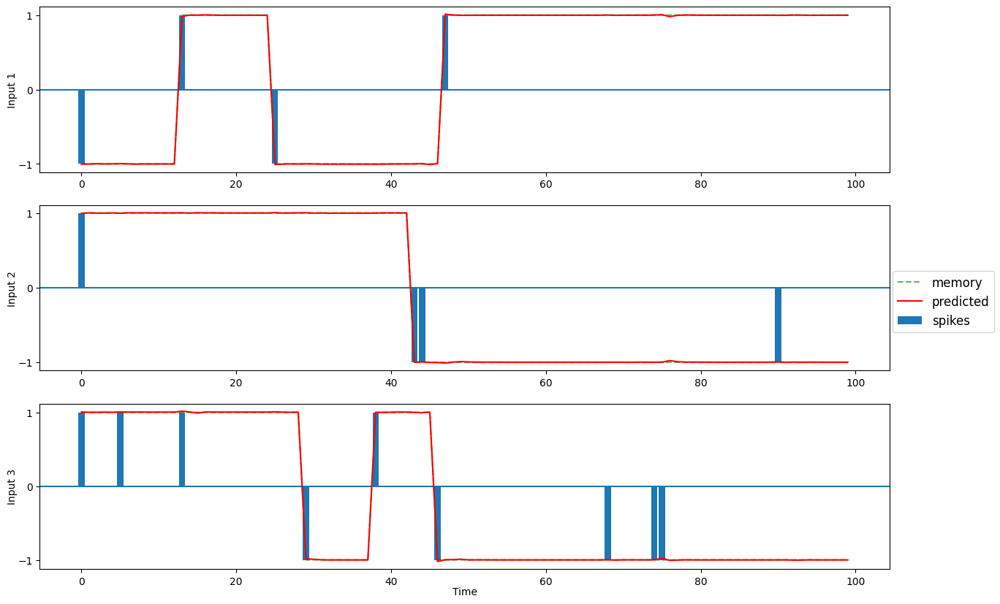

100%|██████████| 1000/1000 [12:57<00:00,  1.29it/s]

Loss:  2.2873357011121698e-05


[6.929301889613271e-05,
 6.397507968358696e-05,
 6.129971006885171e-05,
 6.532994302688166e-05,
 3.757911690627225e-05,
 3.0432656785706058e-05,
 4.922883817926049e-05,
 2.551798206695821e-05,
 2.1809701138408855e-05,
 2.5698884201119654e-05]

In [ ]:
tb_rnn.train(Inputs,Targets,1000,n_batch,optimizer,criterion,T)

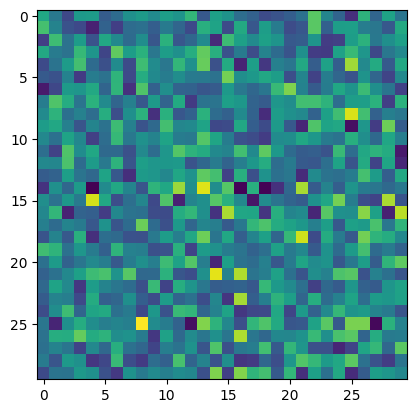

In [ ]:
plt.imshow(tb_rnn.three_way_tensor[16].cpu().detach().numpy())

In [ ]:
mount_colab()
model = load_model(3,30,"Tb_Rnn_K3_Tanh")[0]

Mounted at /content/drive
cp: cannot open '/content/drive/MyDrive/בקשה-ללמוד-קורס-במוסד-אחר (1).gdoc' for reading: Operation not supported
cp: cannot open '/content/drive/MyDrive/בקשה-ללמוד-קורס-במוסד-אחר.gdoc' for reading: Operation not supported


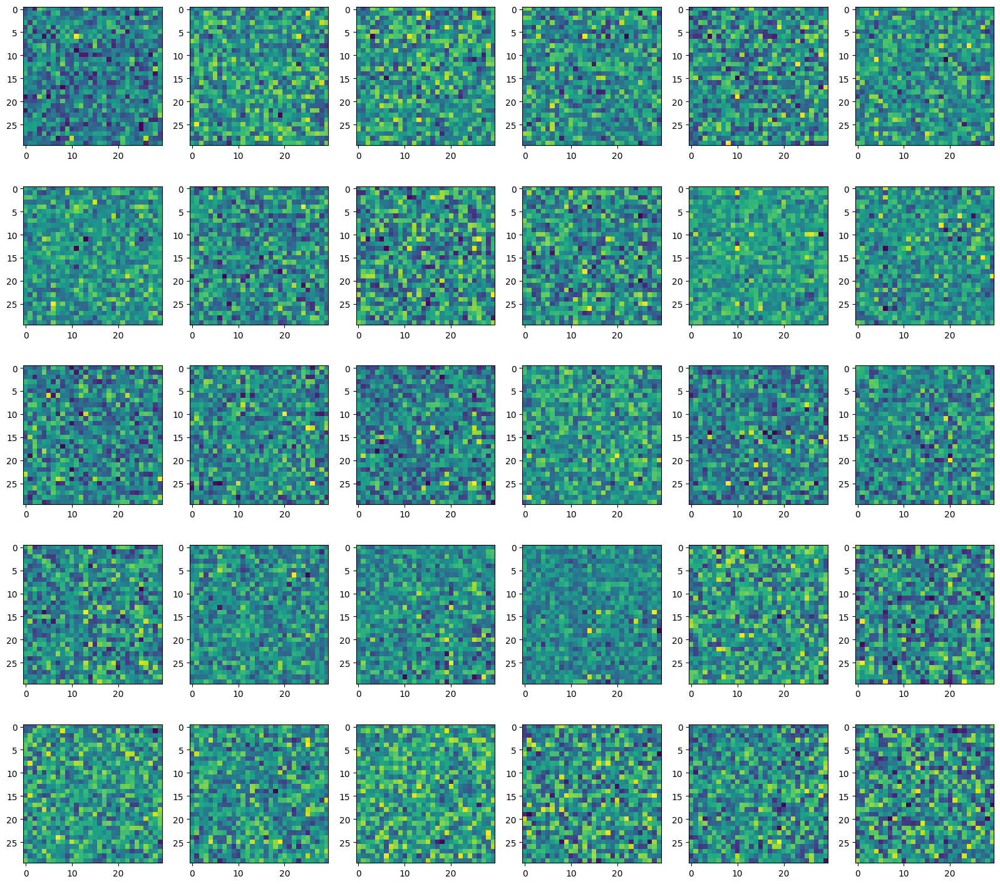

In [ ]:
utils.show_connectivity(model,30,dim=0)

###Low rank RNN to mimic Full rank RNN

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30
n_layers=1

full_rank_rnn = Full_Rank_RNN(input_size,output_size,hidden_dim,nonlinearity = 'tanh',task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Full_Rank_RNN.pth"))

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 3000
n_batch = 128
batch_size=128

Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

ranks = 5
r_losses = []

lr = 1e-03

for rank in range(1,ranks+1):
  # instantiate an low rank RNN
  low_rank_rnn = Low_Rank_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.tanh, task = "FF").to(DEVICE)
  optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
  losses = low_rank_rnn.lr_train(Inputs,Targets,full_rank_rnn,n_steps,optimizer,criterion,batch_size,T)
  r_losses.append(losses)
  torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Rank_{rank}_RNN_new.pth')

Output hidden; open in https://colab.research.google.com to view.

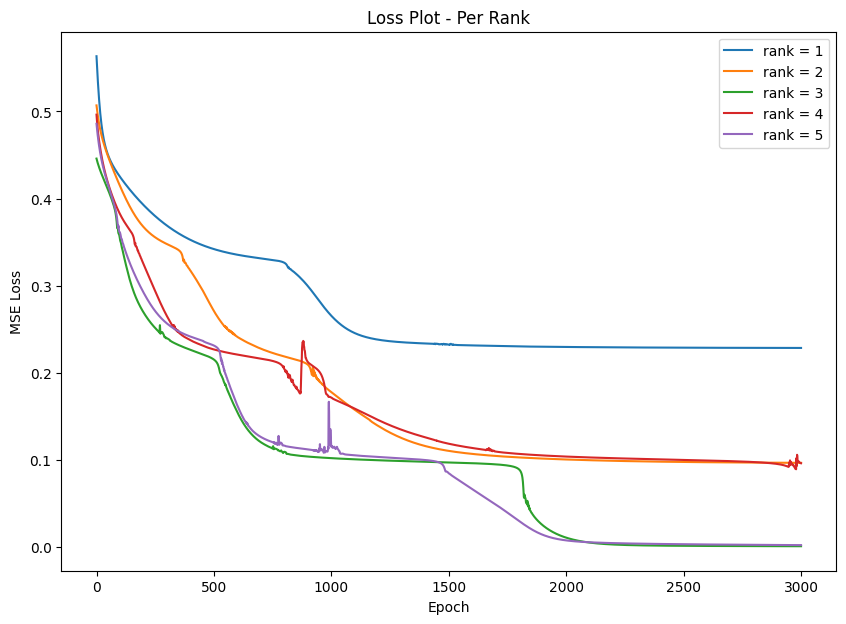

In [ ]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(1,1,1)
for rank in range(ranks):
  _=ax.plot(r_losses[rank],label = f'rank = {rank+1}')
_=ax.set_title("Loss Plot - Per Rank")
_=ax.set_xlabel("Epoch")
_=ax.set_ylabel("MSE Loss")
_=ax.legend()

### Low Rank Three Bodies RNN to mimic Full Rank Three Bodies RNN

####sigmoid, K=3, rank 1-10

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.sigmoid,task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/three_body_RNN_K3.pth"))

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 6000
n_batch = 128
batch_size=128

Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

ranks = 10
r_losses = []

lr = 1e-03

for rank in range(1,ranks+1):
  # instantiate an low rank RNN
  low_rank_rnn = Low_Rank_Three_Way_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.sigmoid, task = "FF").to(DEVICE)
  optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
  losses = low_rank_rnn.lr_train(Inputs,Targets,full_rank_rnn,n_steps,optimizer,criterion,batch_size,T)
  r_losses.append(losses)
  torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Three_Way_Rank_{rank}_RNN_new.pth')

Output hidden; open in https://colab.research.google.com to view.

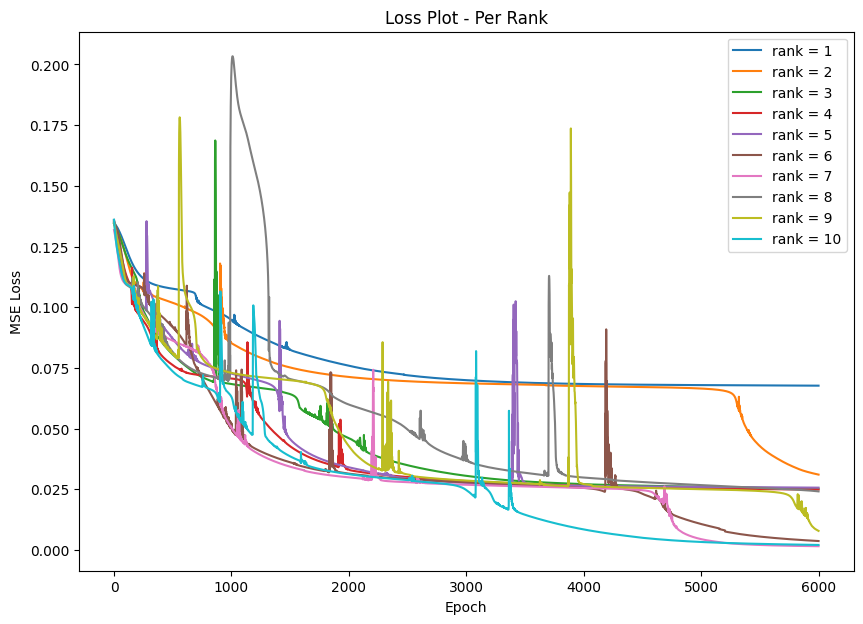

In [ ]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(1,1,1)
for rank in range(ranks):
  _=ax.plot(r_losses[rank],label = f'rank = {rank+1}')
_=ax.set_title("Loss Plot - Per Rank")
_=ax.set_xlabel("Epoch")
_=ax.set_ylabel("MSE Loss")
_=ax.legend()

####Tanh, K=3, Rank 1-10

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.tanh,task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth"))

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 10000
n_batch = 128
batch_size = 128

Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

ranks = 6
# r_losses = []

lr = 1e-03

for rank in range(3,ranks+1):
  # instantiate an low rank RNN
  low_rank_rnn = Low_Rank_Three_Way_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.tanh, task = "FF").to(DEVICE)
  optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
  losses = low_rank_rnn.lr_train(Inputs,Targets,full_rank_rnn,n_steps,optimizer,criterion,batch_size,T)
  r_losses.append(losses)
  torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Three_Way_Rank_{rank}_Mimic_Tanh_RNN.pth')

Output hidden; open in https://colab.research.google.com to view.

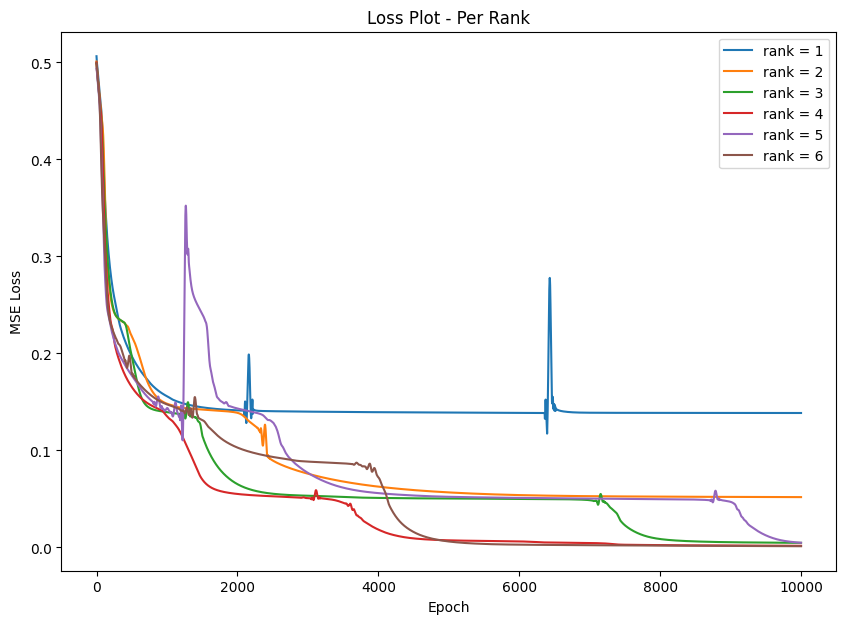

In [ ]:
from scipy.signal import savgol_filter
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(1,1,1)
for rank in range(ranks):
  _=ax.plot(np.array(savgol_filter(r_losses[rank], 120, 7)),label = f'rank = {rank+1}')
_=ax.set_title("Loss Plot - Per Rank")
_=ax.set_xlabel("Epoch")
_=ax.set_ylabel("MSE Loss")
_=ax.legend()

### Low Rank RNN to mimic Full Rank Three Bodies RNN

####K=2, sigmoid

In [ ]:
# k - flip-flop
K = 2
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.sigmoid,task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/three_body_RNN_K2.pth"))

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 6000
n_batch = 128
batch_size=128

Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

ranks = 10
r_losses = []

lr = 1e-03

for rank in range(1,ranks+1):
  # instantiate an low rank RNN
  low_rank_rnn = Low_Rank_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.sigmoid, task = "FF").to(DEVICE)
  optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
  losses = low_rank_rnn.lr_train(Inputs,Targets,full_rank_rnn,n_steps,optimizer,criterion,batch_size,T)
  r_losses.append(losses)
  torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Three_Way_Rank_{rank}_RNN_new.pth')

Output hidden; open in https://colab.research.google.com to view.

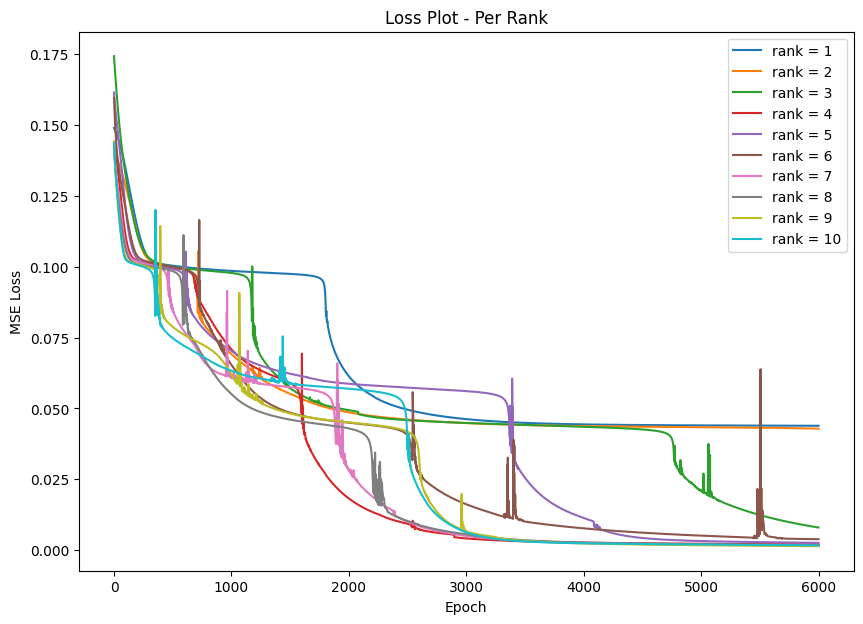

In [ ]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(1,1,1)
for rank in range(ranks):
  _=ax.plot(r_losses[rank],label = f'rank = {rank+1}')


_=ax.set_title("Loss Plot - Per Rank")
_=ax.set_xlabel("Epoch")
_=ax.set_ylabel("MSE Loss")
_=ax.legend()

####K=3, tanh

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.tanh,task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth"))

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 6000
n_batch = 128
batch_size=128

Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

ranks = 10
r_losses = []

lr = 1e-03

for rank in range(1,ranks+1):
  # instantiate an low rank RNN
  low_rank_rnn = Low_Rank_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.tanh, task = "FF").to(DEVICE)
  optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
  losses = low_rank_rnn.lr_train(Inputs,Targets,full_rank_rnn,n_steps,optimizer,criterion,batch_size,T)
  r_losses.append(losses)
  torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Three_Way_Rank_{rank}_RNN_new.pth')

Output hidden; open in https://colab.research.google.com to view.

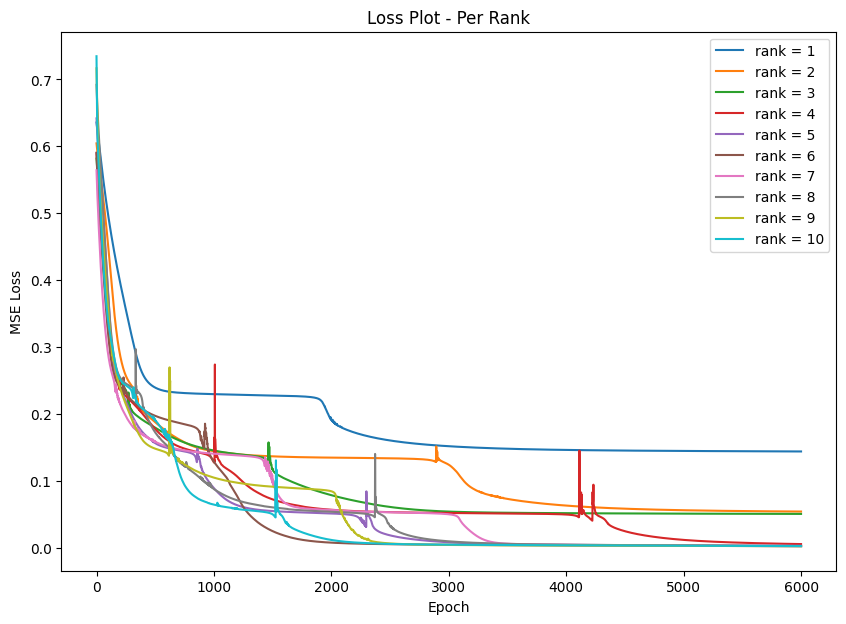

In [ ]:
fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(1,1,1)
for rank in range(ranks):
  _=ax.plot(r_losses[rank],label = f'rank = {rank+1}')


_=ax.set_title("Loss Plot - Per Rank")
_=ax.set_xlabel("Epoch")
_=ax.set_ylabel("MSE Loss")
_=ax.legend()

# Protein Interaction Network (PIN)

In [ ]:
T = 300
delta = 0.01 # for ode timescale
N = 8  # number of proteins

### K1,K-1,K2 definitions ###

K1 = np.zeros((N,N))
K1[0,2] = 0.2
K1[0,1] = 5
K1[6,5] = 0.1
K1[5,3] = 0.0009
K1[1,0] = 0.1
K1[7,4] = 0.1

Km1 = np.zeros((N,N))
Km1[0,2] = 0.02
Km1[0,1] = 10.6
Km1[6,5] = 0.1
Km1[5,3] = 0.005
Km1[1,0] = 0.05
Km1[7,4] = 0.01

K2 = np.zeros((N,N,N))
K2[0,2,5] = 0.4
K2[0,1,4] = 0.4
K2[6,5,2] = 20
K2[5,3,0] = 0.085
K2[1,0,3] = 0.05
K2[7,4,1] = 2

In [ ]:
random.seed(0)
np.random.seed(0)
torch.manual_seed(0)

T = 300
N = 8
delta = 0.01

# decide on hyperparameters
input_size = N
output_size = N
# hidden_dim = N
hidden_dim = 30

tb_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity=torch.sigmoid,task="PIN").to(DEVICE)

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(tb_rnn.parameters(), lr=1e-04)

# train parameters
n_steps = 3000
n_batch = 1000
batch_size=128

# generate new data
Inputs, Targets = PIN_task.generate_PIN_data(n_batch,T,delta,K1,Km1,K2)

losses = tb_rnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size,T,pin_task=False)

Output hidden; open in https://colab.research.google.com to view.

#Tensor reduction analysis

In [ ]:
mount_colab()

Mounted at /content/drive


###Train some TBRNN

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

# tb_rnn = Three_Bodies_RNN(input_size, output_size, hidden_dim).to(DEVICE)

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(tb_rnn.parameters(), lr=1e-03)

# train parameters
n_steps = 500
n_batch = 1000

# Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

losses = tb_rnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch)

Output hidden; open in https://colab.research.google.com to view.

  0%|          | 0/1000 [00:00<?, ?it/s]

0 /10 --- loss = 0.000214, best = 0.000214


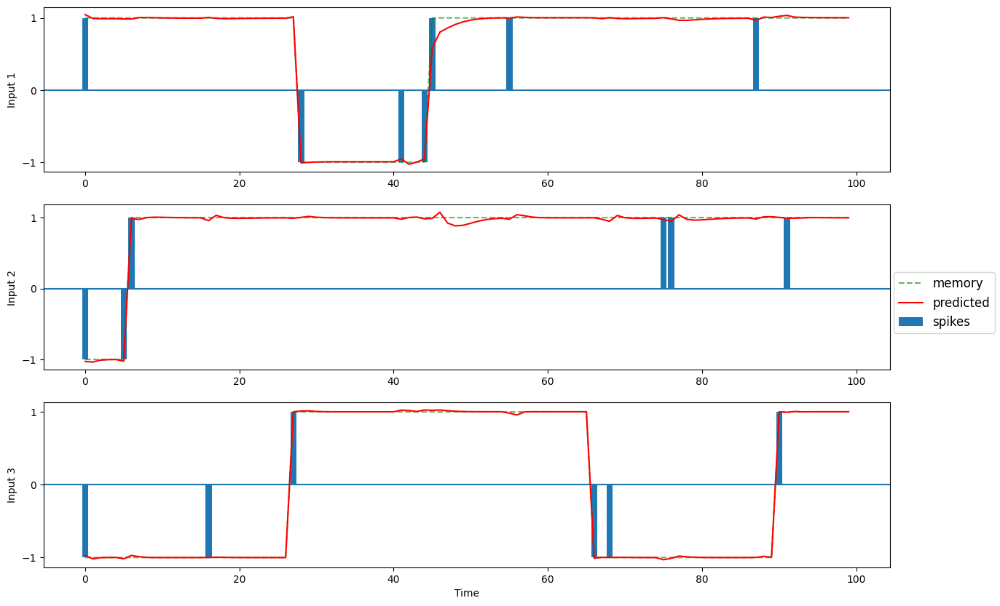

 10%|▉         | 99/1000 [00:11<01:24, 10.61it/s]

1 /10 --- loss = 0.000158, best = 0.000158


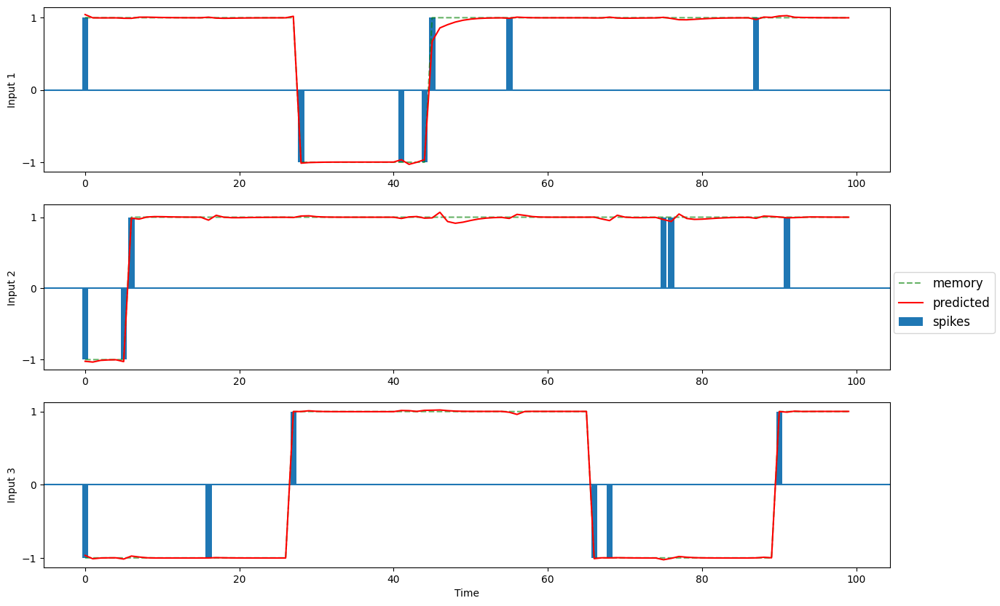

 20%|██        | 200/1000 [00:22<01:18, 10.23it/s]

2 /10 --- loss = 0.000122, best = 0.000122


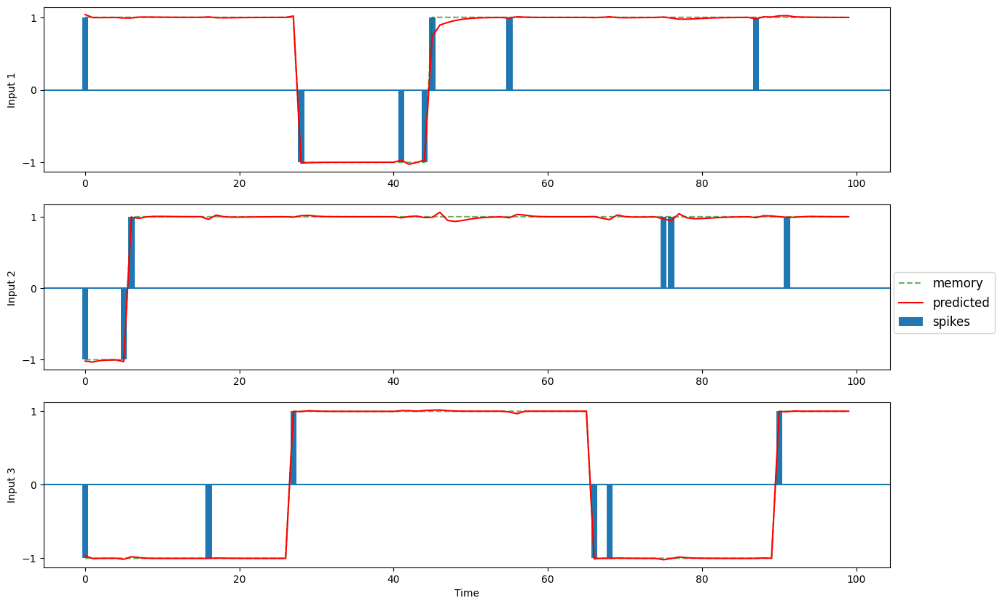

 30%|███       | 300/1000 [00:34<01:38,  7.10it/s]

3 /10 --- loss = 0.000096, best = 0.000096


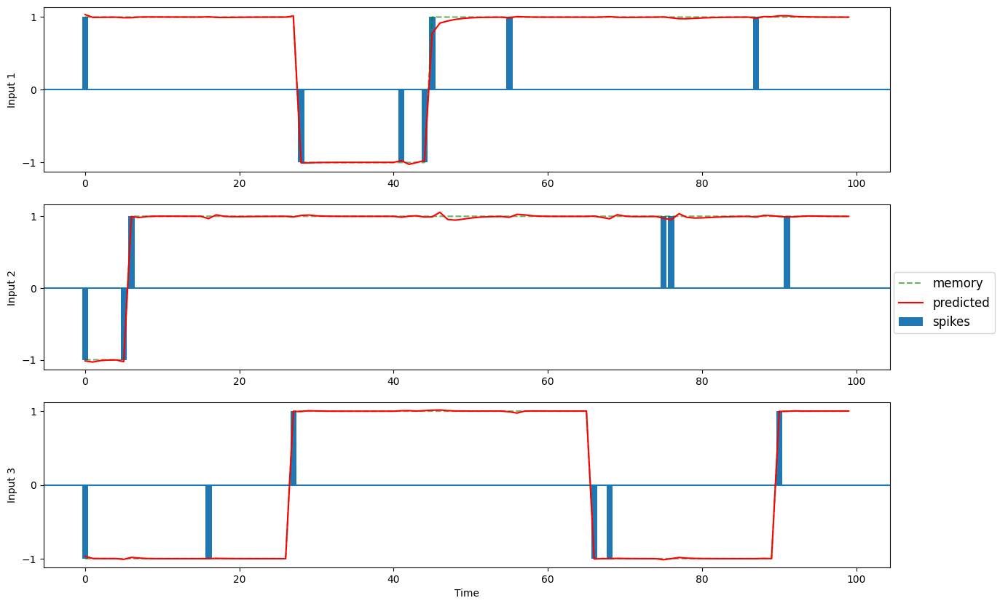

 40%|████      | 400/1000 [00:45<01:13,  8.21it/s]

4 /10 --- loss = 0.000076, best = 0.000076


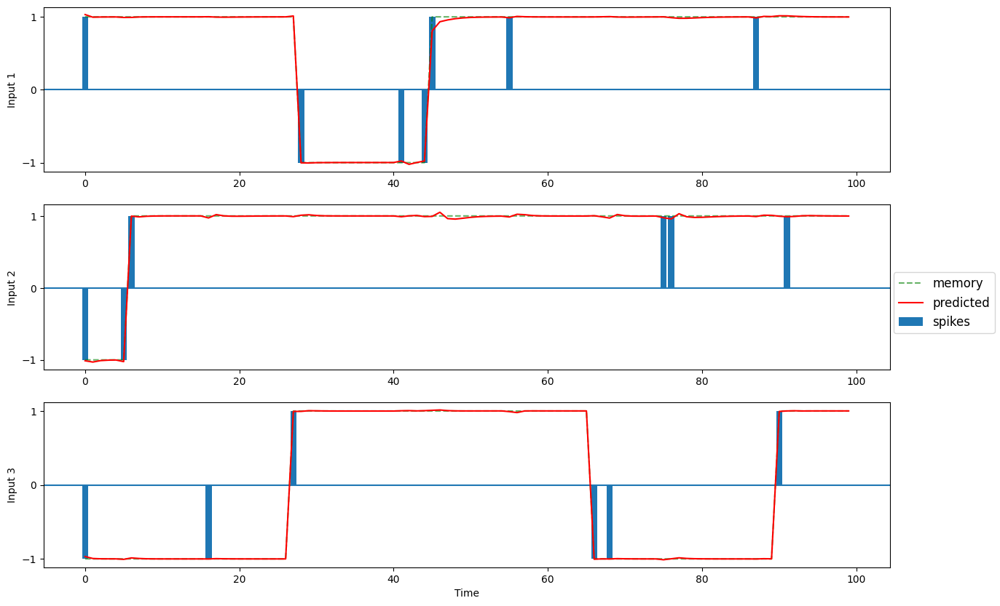

 50%|████▉     | 499/1000 [00:56<00:48, 10.36it/s]

5 /10 --- loss = 0.000062, best = 0.000062


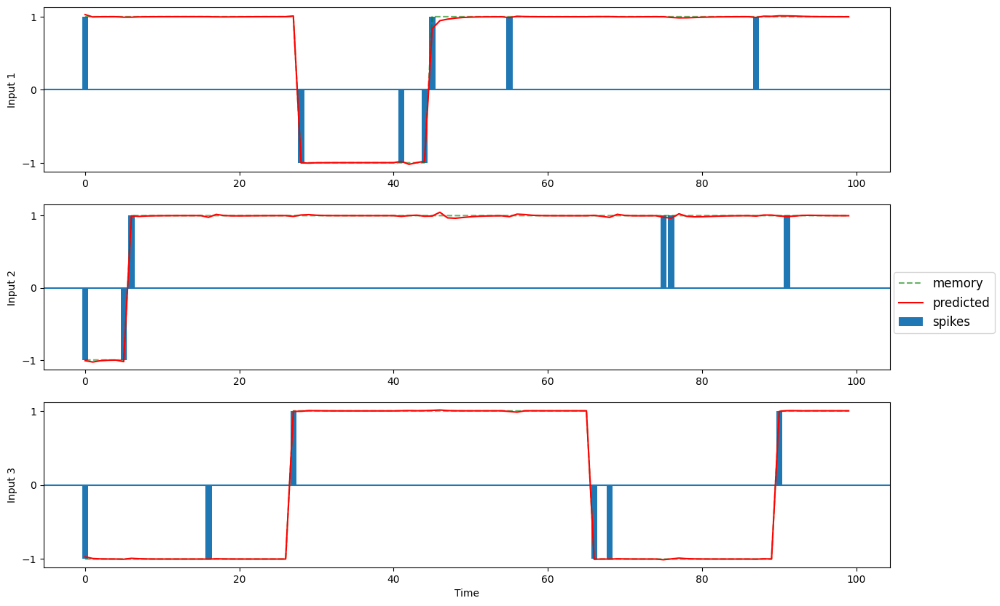

 60%|█████▉    | 599/1000 [01:08<00:36, 10.84it/s]

6 /10 --- loss = 0.000051, best = 0.000051


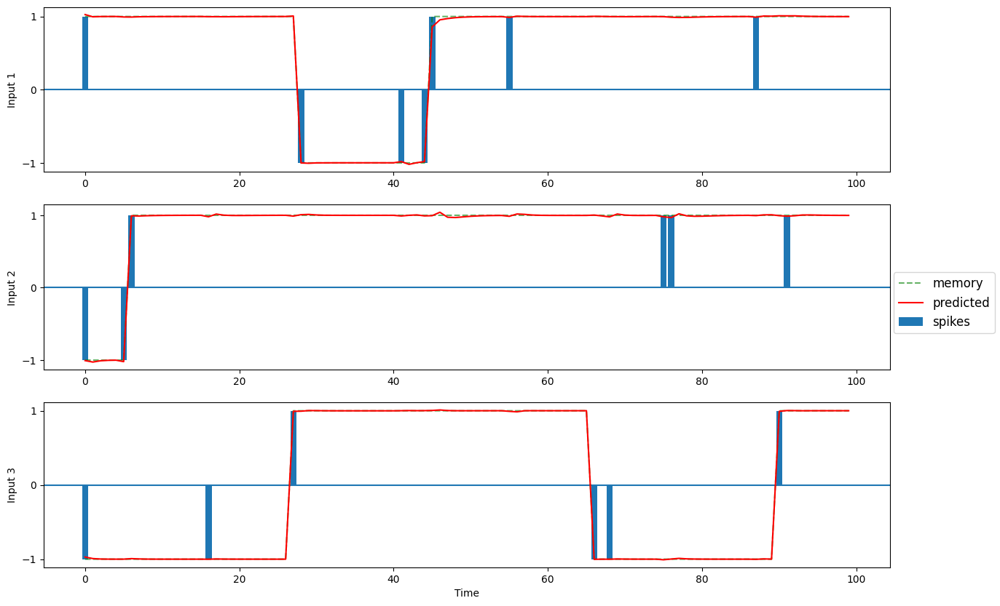

 70%|███████   | 700/1000 [01:19<00:28, 10.48it/s]

7 /10 --- loss = 0.000043, best = 0.000043


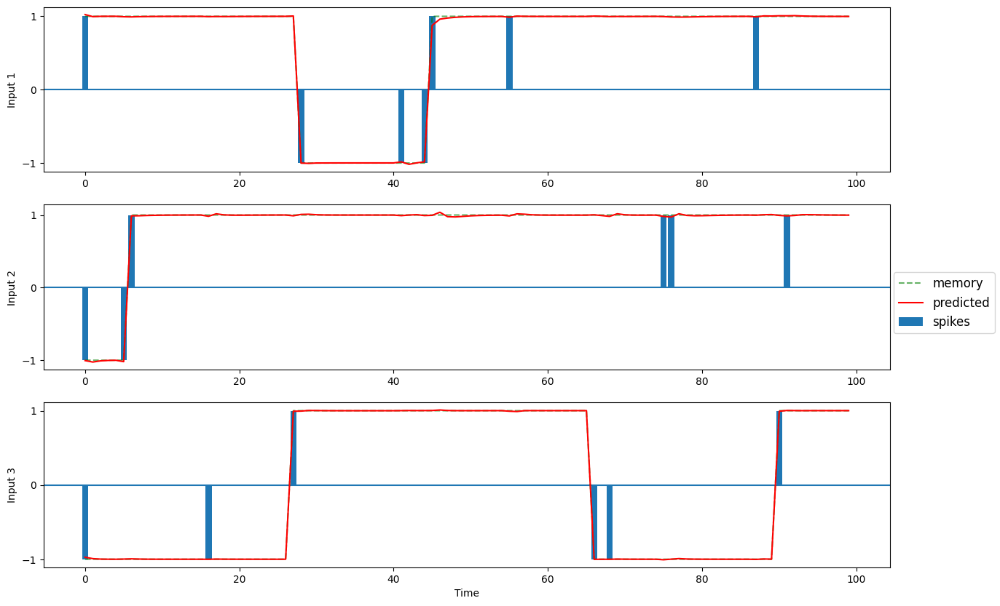

 80%|████████  | 800/1000 [01:31<00:19, 10.42it/s]

8 /10 --- loss = 0.000037, best = 0.000037


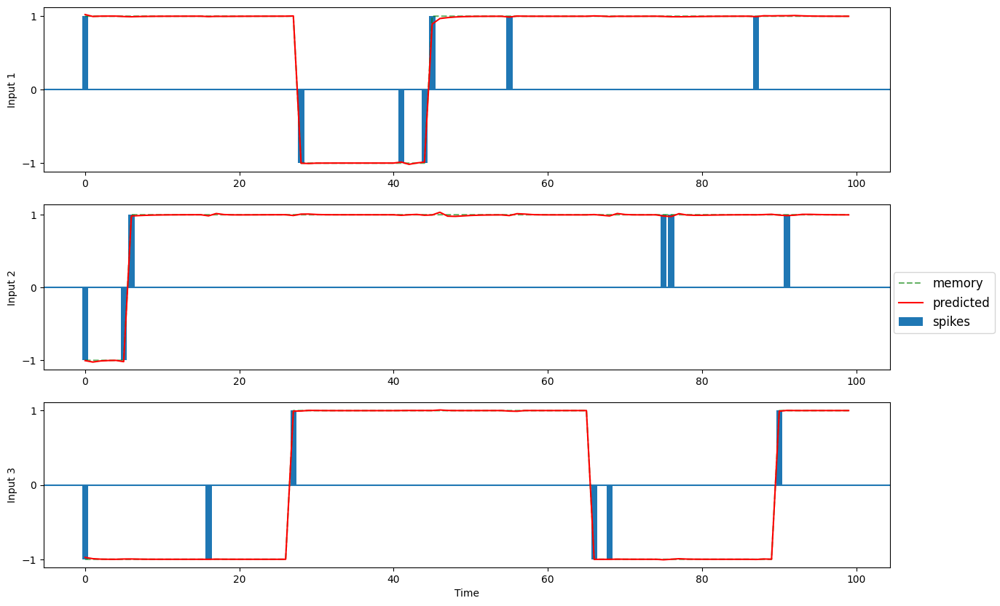

 90%|█████████ | 900/1000 [01:43<00:09, 10.37it/s]

9 /10 --- loss = 0.000032, best = 0.000032


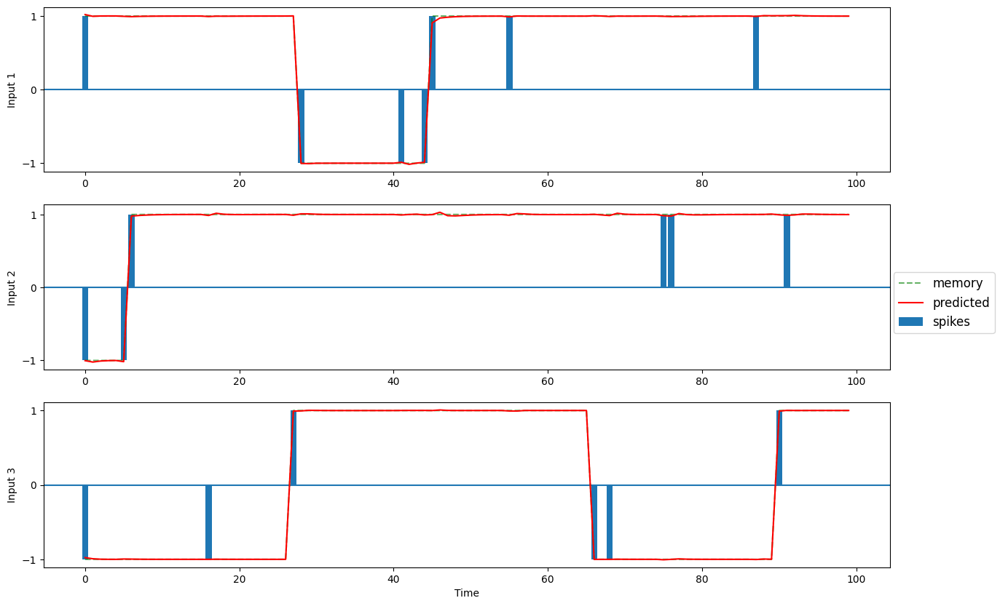

100%|██████████| 1000/1000 [01:54<00:00,  8.72it/s]

Loss:  2.730522828642279e-05


In [ ]:
rank = 3
#lr_rnn = Low_Rank_Three_Way_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.tanh, task = "FF").to(DEVICE)
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_rnn.parameters(), lr=1e-03)
losses = lr_rnn.train(Inputs,Targets,1000,optimizer,criterion,batch_size=n_batch)

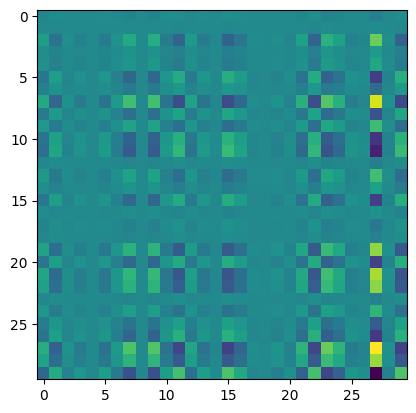

In [ ]:
plt.imshow((lr_rnn.U[:,[0]].unsqueeze(2) * (lr_rnn.V[:,[0]] @ lr_rnn.W[:,[0]].T)).cpu().detach().numpy()[1])

###PARAFAC

In [ ]:
from tensorly.decomposition import parafac
import tensorly as tl

# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 6000
n_batch = 128
batch_size=128
test_size = 1000

Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
Test_Inputs, Test_Targets = K_Bit_Flipflop_task.generate_mem_data(1000,T,K)

ranks = 10
r_losses = []
lr_losses = []
tca_losses = []

# learning rate
lr = 1e-03

for rank in range(1,ranks+1):
  full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.tanh,task = "FF").to(DEVICE)
  full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth"))

  # instantiate an low rank RNN
  low_rank_rnn = Low_Rank_Three_Way_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.tanh, task = "FF").to(DEVICE)
  optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
  losses = low_rank_rnn.lr_train(Inputs,Targets,full_rank_rnn,n_steps,optimizer,criterion,batch_size,T)
  r_losses.append(losses)
  torch.save(low_rank_rnn.state_dict(), f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Three_Way_Rank_{rank}_Mimic_Tanh_RNN.pth')

  # calculate task lr inferred accuracy
  prediction = low_rank_rnn(Test_Inputs,None)[0]
  K_Bit_Flipflop_task.draw_mem_charts(Test_Inputs.cpu(),Test_Targets.cpu(),Prediction=prediction.cpu(),idx=0,K=K,T=T)
  lr_losses.append(criterion(prediction, Test_Targets).cpu().data)

  # calculate TCA truncated accuracy
  factors = parafac(full_rank_rnn.three_way_tensor.cpu().detach().numpy(), rank=rank)
  full_rank_rnn.three_way_tensor = torch.nn.Parameter(torch.tensor(tl.cp_to_tensor(factors),device=DEVICE))
  tca_losses.append(criterion(full_rank_rnn(Test_Inputs,None)[0], Test_Targets).cpu().data)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
print(lr_losses)
print(tca_losses)

[tensor(0.6363), tensor(0.3222), tensor(0.3187), tensor(0.0074), tensor(0.0091), tensor(0.0196), tensor(0.0062), tensor(0.0071), tensor(0.0048), tensor(0.0075)]
[tensor(1.8916), tensor(1.8027), tensor(2.1571), tensor(1.5193), tensor(1.2822), tensor(2.0491), tensor(1.0159), tensor(1.2391), tensor(1.5362), tensor(1.1924)]


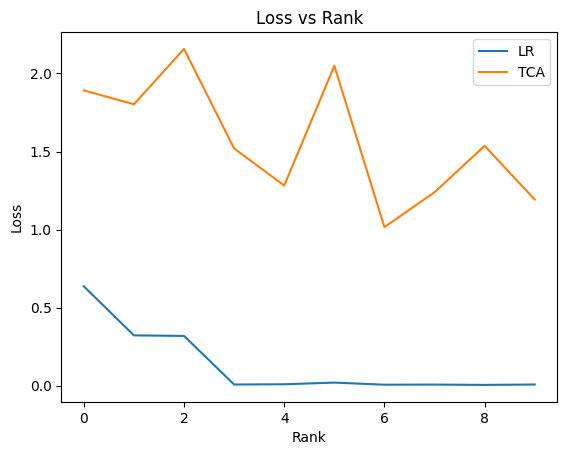

In [ ]:
plt.plot(lr_losses,label="LR")
plt.plot(tca_losses,label="TCA")
plt.legend()
plt.xlabel("Rank")
plt.ylabel("Loss")
plt.title("Loss vs Rank")
plt.show()

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)
  0%|          | 0/10000 [00:00<?, ?it/s]

0 /10 --- loss = 0.500520, best = 0.500520


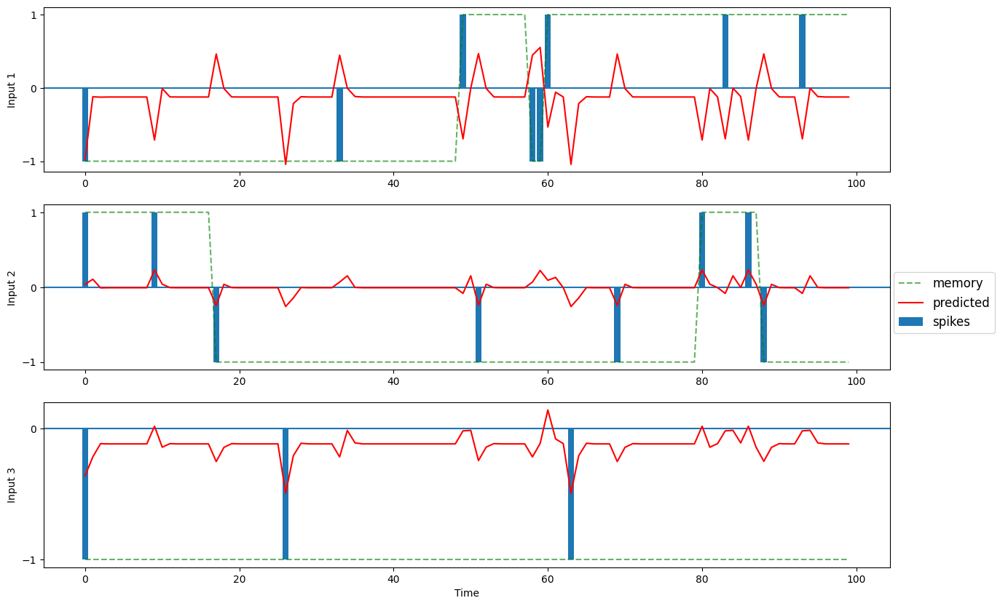

 10%|▉         | 999/10000 [01:25<12:55, 11.60it/s]

1 /10 --- loss = 0.177917, best = 0.177917


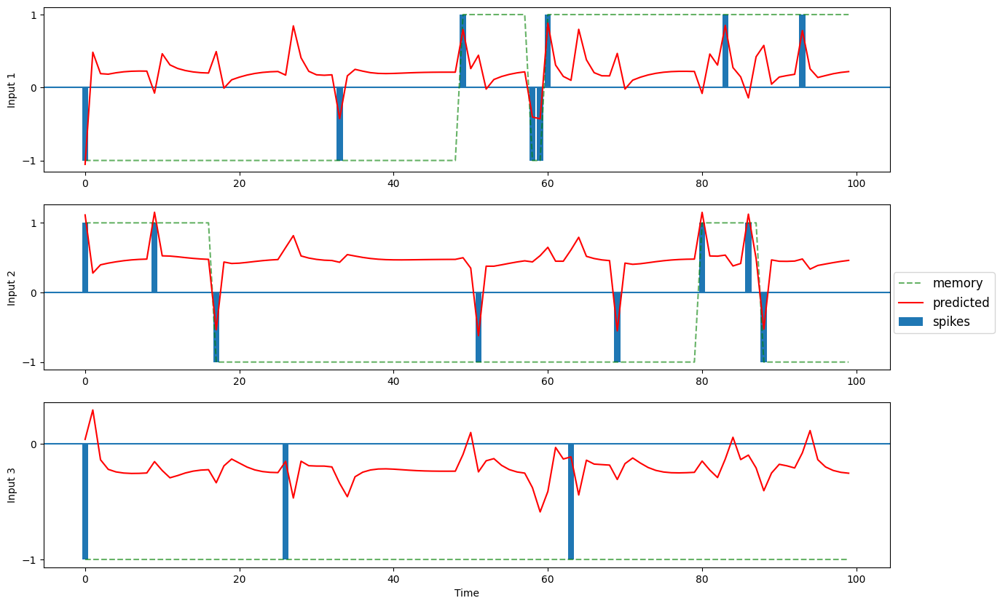

 20%|█▉        | 1999/10000 [02:52<11:23, 11.70it/s]

2 /10 --- loss = 0.143885, best = 0.143885


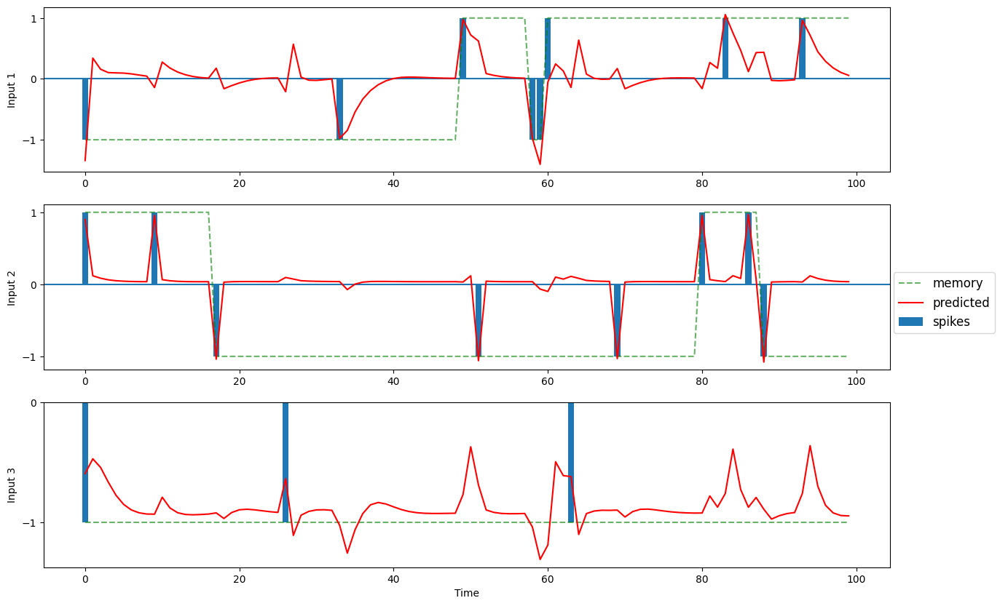

 30%|██▉       | 2999/10000 [04:18<09:53, 11.80it/s]

3 /10 --- loss = 0.060119, best = 0.060119


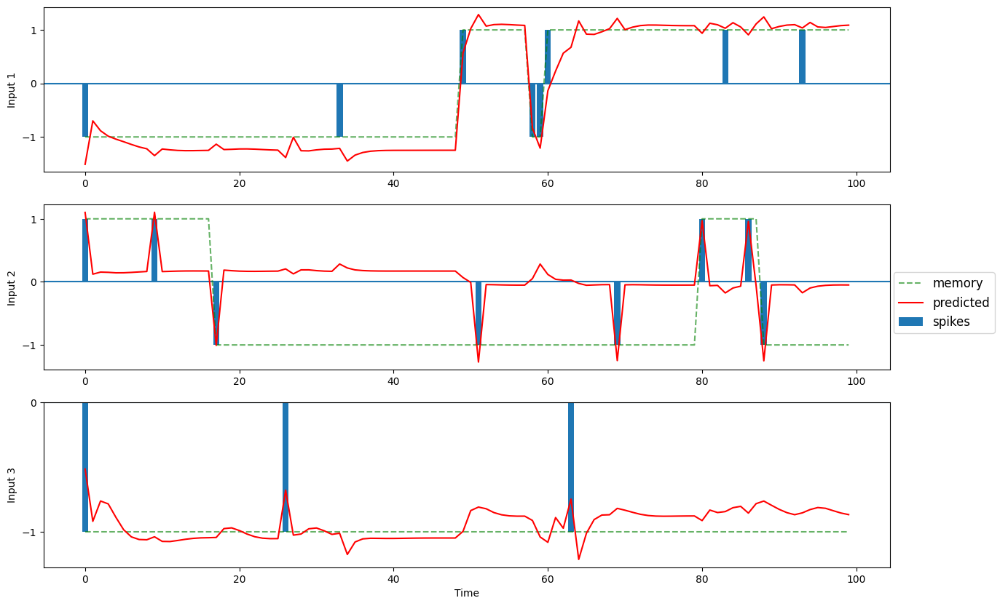

 40%|███▉      | 3999/10000 [05:45<08:23, 11.92it/s]

4 /10 --- loss = 0.053799, best = 0.053799


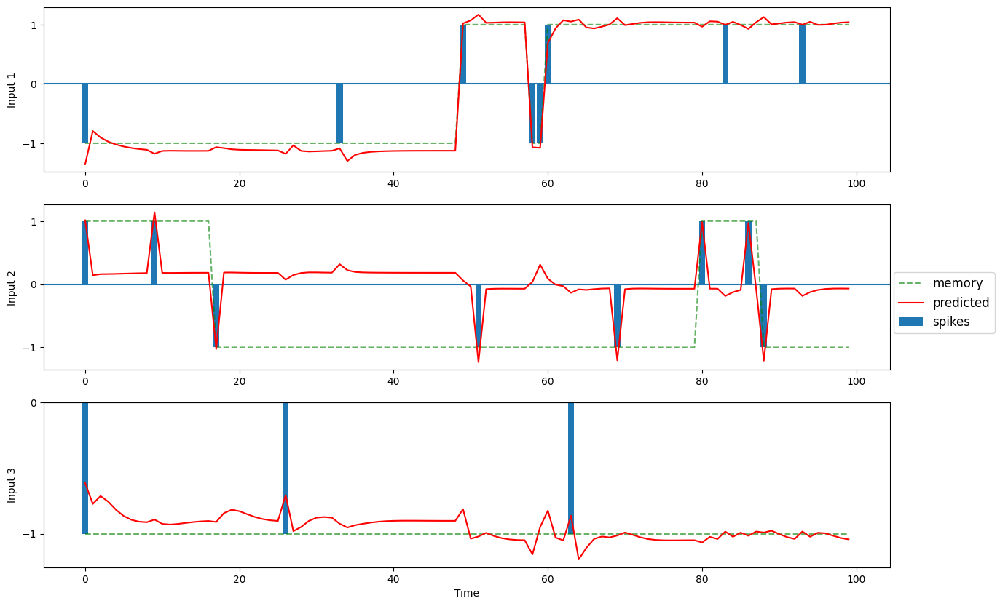

 50%|████▉     | 4999/10000 [07:12<07:09, 11.65it/s]

5 /10 --- loss = 0.052476, best = 0.052476


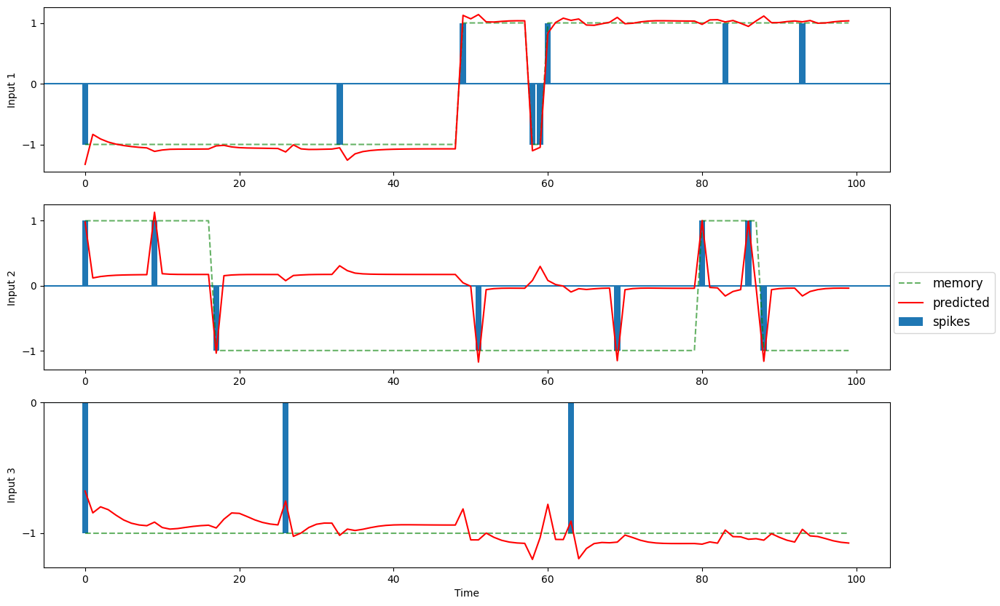

 60%|█████▉    | 5999/10000 [08:38<05:43, 11.65it/s]

6 /10 --- loss = 0.050579, best = 0.050579


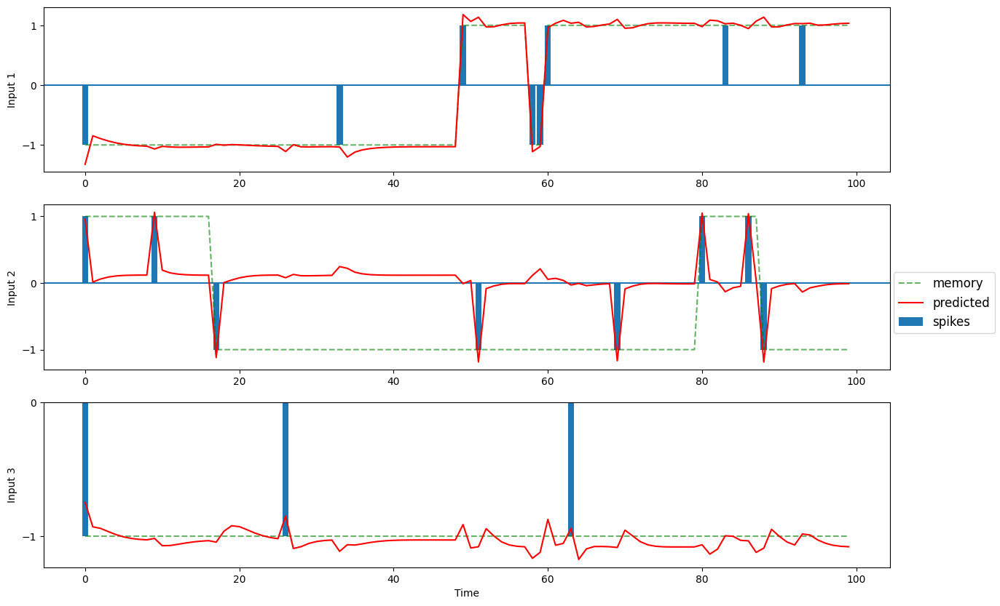

 70%|██████▉   | 6999/10000 [10:04<04:16, 11.71it/s]

7 /10 --- loss = 0.047167, best = 0.047167


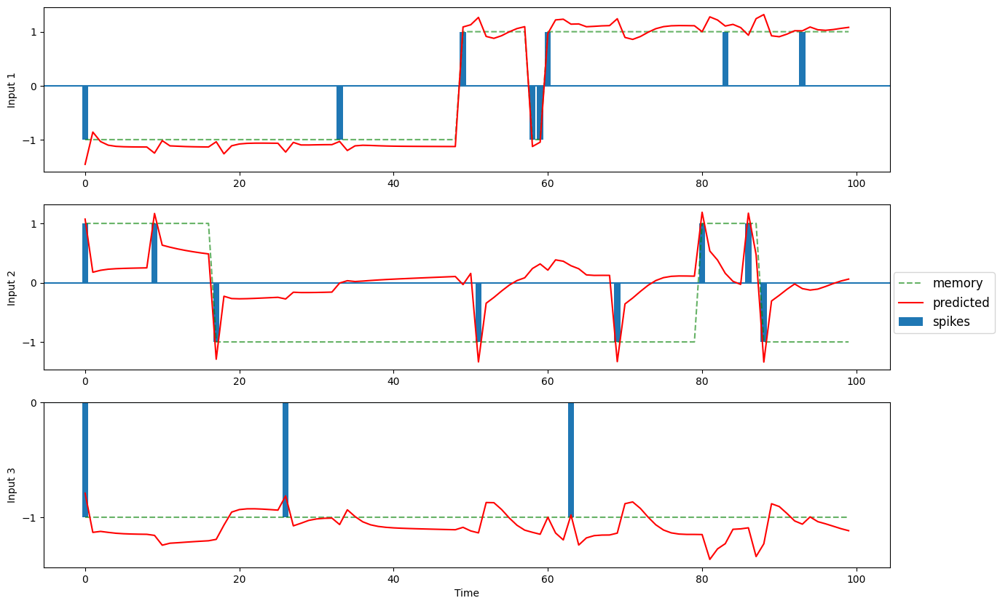

 80%|███████▉  | 7999/10000 [11:29<02:53, 11.55it/s]

8 /10 --- loss = 0.024543, best = 0.024543


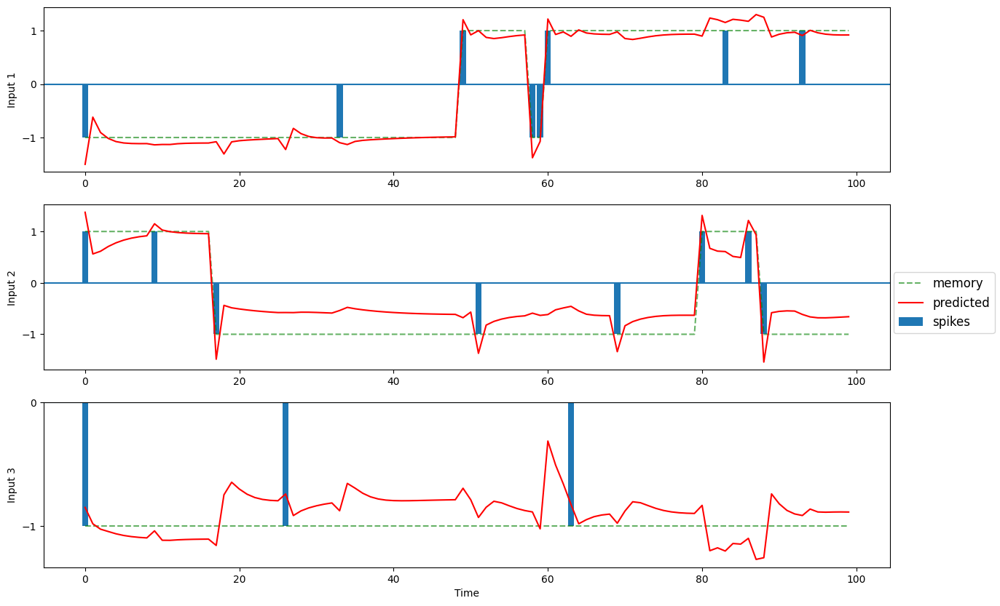

 90%|████████▉ | 8999/10000 [12:56<01:24, 11.81it/s]

9 /10 --- loss = 0.014281, best = 0.014281


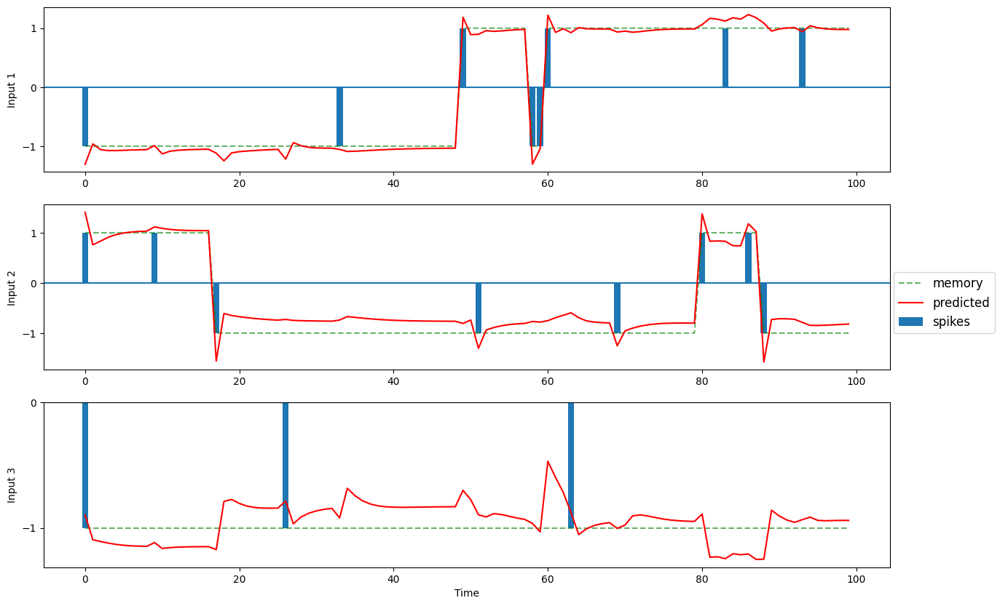

100%|██████████| 10000/10000 [14:21<00:00, 11.60it/s]


Loss:  0.008570552803575993


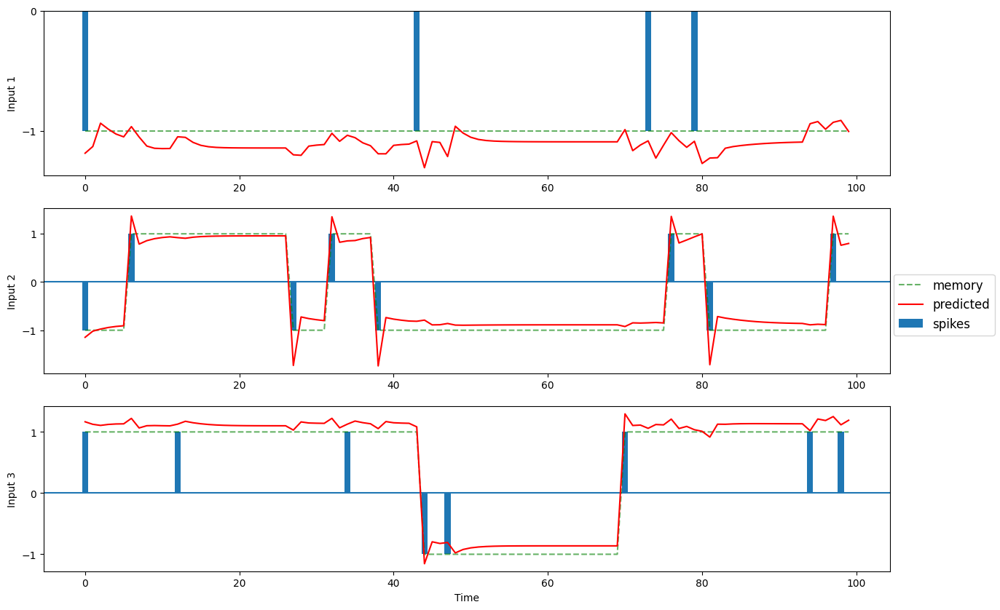

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 10000
n_batch = 128
batch_size=128
test_size = 1000

Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
Test_Inputs, Test_Targets = K_Bit_Flipflop_task.generate_mem_data(1000,T,K)

ranks = 10

# learning rate
lr = 1e-03

rank = 3
full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.tanh,task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth"))

# instantiate an low rank RNN
low_rank_rnn = Low_Rank_Three_Way_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.tanh, task = "FF").to(DEVICE)
optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
losses = low_rank_rnn.lr_train(Inputs,Targets,full_rank_rnn,n_steps,optimizer,criterion,batch_size,T)

# calculate task lr inferred accuracy
prediction = low_rank_rnn(Test_Inputs,None)[0]
K_Bit_Flipflop_task.draw_mem_charts(Test_Inputs.cpu(),Test_Targets.cpu(),Prediction=prediction.cpu(),idx=0,K=K,T=T)

In [ ]:
low_rank_rnn.U

Parameter containing:
tensor([[ 0.2194, -0.0936,  0.4714],
        [ 0.0781, -0.2291, -0.1285],
        [ 0.0864, -0.5330,  0.1186],
        [ 0.4812,  0.0766,  0.3144],
        [ 0.1402, -0.1456,  0.5500],
        [-0.4764, -0.3671,  0.3065],
        [-0.3587,  0.2223, -0.1583],
        [-0.2836,  0.0932,  0.3988],
        [ 0.2310,  0.0080, -0.5271],
        [ 0.1635,  0.0202, -0.3723],
        [-0.3335,  0.0167,  0.5864],
        [-0.6840,  0.0055,  0.0573],
        [-0.2483,  0.2990, -0.1526],
        [ 0.1239,  0.4550, -0.0345],
        [ 0.7399,  0.4845,  0.2057],
        [-0.1798, -0.6464, -0.2551],
        [ 0.5430,  0.0423,  0.5292],
        [ 0.2613,  0.2392, -0.1874],
        [-0.3516,  0.3082, -0.2540],
        [-0.1678,  0.2341,  0.4020],
        [-0.4021,  0.0097,  0.0290],
        [-0.0160,  0.3685, -0.3035],
        [-0.0458, -0.9078,  0.3220],
        [ 0.0132, -0.1059,  0.4957],
        [-0.6047, -0.0392, -0.2216],
        [ 0.1912,  0.3571, -0.5043],
        [ 0.6380

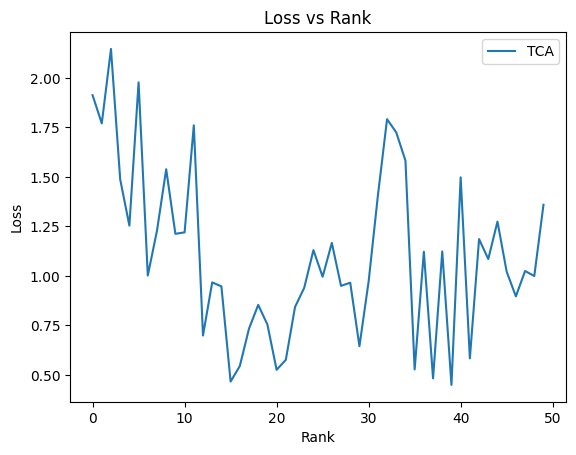

In [ ]:
plt.plot(tca_losses,label="TCA")
plt.legend()
plt.xlabel("Rank")
plt.ylabel("Loss")
plt.title("Loss vs Rank")
plt.show()

In [ ]:
from tensorly.decomposition import parafac
import tensorly as tl

ranks = 20
tca_losses = []
tca_accs = []
# learning rate
lr = 1e-03

twt = tb_rnn.three_way_tensor.detach().clone()
for rank in range(1,ranks+1):
  with torch.no_grad():
    # calculate TCA truncated accuracy
    factors = parafac(twt.cpu().numpy(), rank=rank)
    tb_rnn.three_way_tensor = torch.nn.Parameter(torch.tensor(tl.cp_to_tensor(factors),device=DEVICE))
    tca_losses.append(criterion(tb_rnn(Test_Inputs,None)[0], Test_Targets).cpu().data)
    tca_accs.append(tb_rnn.evaluate(Test_Inputs,Test_Targets))

tb_rnn.three_way_tensor = torch.nn.Parameter(twt)

In [ ]:
tca_accs

[tensor(0.5271, device='cuda:0'),
 tensor(0.5357, device='cuda:0'),
 tensor(0.6653, device='cuda:0'),
 tensor(0.7916, device='cuda:0'),
 tensor(0.7855, device='cuda:0'),
 tensor(0.7441, device='cuda:0'),
 tensor(0.8632, device='cuda:0'),
 tensor(0.8696, device='cuda:0'),
 tensor(0.8482, device='cuda:0'),
 tensor(0.8572, device='cuda:0'),
 tensor(0.8471, device='cuda:0'),
 tensor(0.8455, device='cuda:0'),
 tensor(0.8042, device='cuda:0'),
 tensor(0.8273, device='cuda:0'),
 tensor(0.7717, device='cuda:0'),
 tensor(0.8640, device='cuda:0'),
 tensor(0.8712, device='cuda:0'),
 tensor(0.8376, device='cuda:0'),
 tensor(0.8235, device='cuda:0'),
 tensor(0.8218, device='cuda:0')]

###TT form

In [ ]:
from tensorly.decomposition import matrix_product_state
import tensorly as tl
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 6000
n_batch = 128
batch_size=128
test_size = 1000
full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.tanh,task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth"))
tensor = tl.tensor(full_rank_rnn.three_way_tensor.cpu().detach().numpy())

In [ ]:
factors = matrix_product_state(tensor, rank=[1,4,30,1])

In [ ]:
a = (factors[0] @ (factors[1] @ factors[2].squeeze()).transpose(1,0,2)).transpose(1,0,2)

In [ ]:
from tensorly.decomposition import matrix_product_state
import tensorly as tl
tt_accs = []
ranks = 20
for rank in range(1,ranks+1):
  tensor = tl.tensor(twt.cpu().detach().numpy())
  factors = matrix_product_state(tensor, rank=[1,rank,30,1])
  tb_rnn.three_way_tensor = torch.nn.Parameter(torch.tensor(tl.tt_to_tensor(factors),device=DEVICE))
  tt_accs.append(tb_rnn.evaluate(Test_Inputs,Test_Targets).cpu().data)
tb_rnn.three_way_tensor = torch.nn.Parameter(twt)

###slice TCA

In [ ]:
!pip install slicetca

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)

# train parameters
n_steps = 6000
n_batch = 128
batch_size=128
test_size = 1000

Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
Test_Inputs, Test_Targets = K_Bit_Flipflop_task.generate_mem_data(1000,T,K)
full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.tanh,task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth"))

temp = full_rank_rnn.three_way_tensor.detach().clone() * 10

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


Loss: 0.5265747308731079 : 100%|██████████| 10000/10000 [01:22<00:00, 121.06it/s]
The invariance converged. Invariance loss: 0.41268813610076904 :   5%|▌         | 500/10000 [00:04<01:27, 108.86it/s]


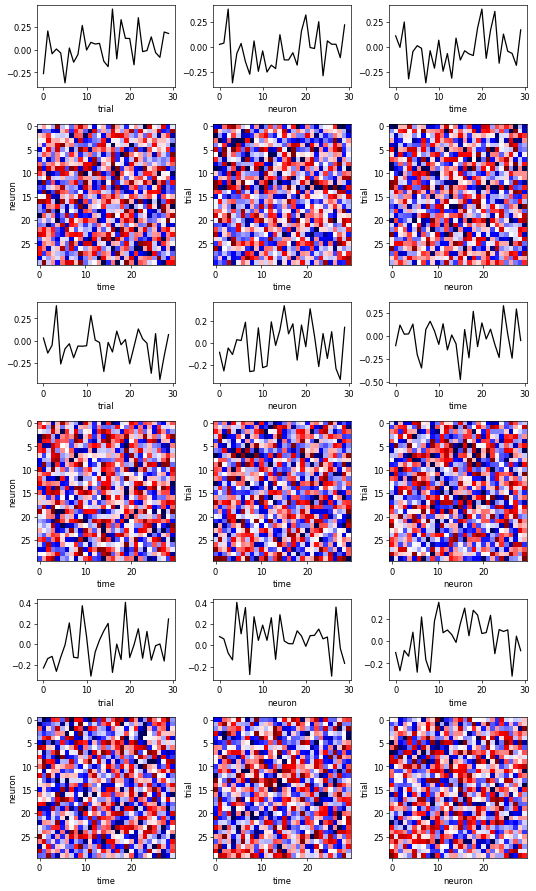

In [ ]:
import slicetca
# The tensor is decomposed into 2 trial-, 0 neuron- and 3 time-slicing components.
full_rank_rnn = Three_Bodies_RNN(input_size,output_size,hidden_dim,nonlinearity = torch.tanh,task = "FF").to(DEVICE)
full_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/models/Tb_Rnn_K3_Tanh.pth"))



Loss: 0.7542756199836731 : 100%|██████████| 10000/10000 [00:56<00:00, 176.59it/s]
The invariance converged. Invariance loss: 0.23001770675182343 :   4%|▍         | 417/10000 [00:02<01:07, 141.51it/s]


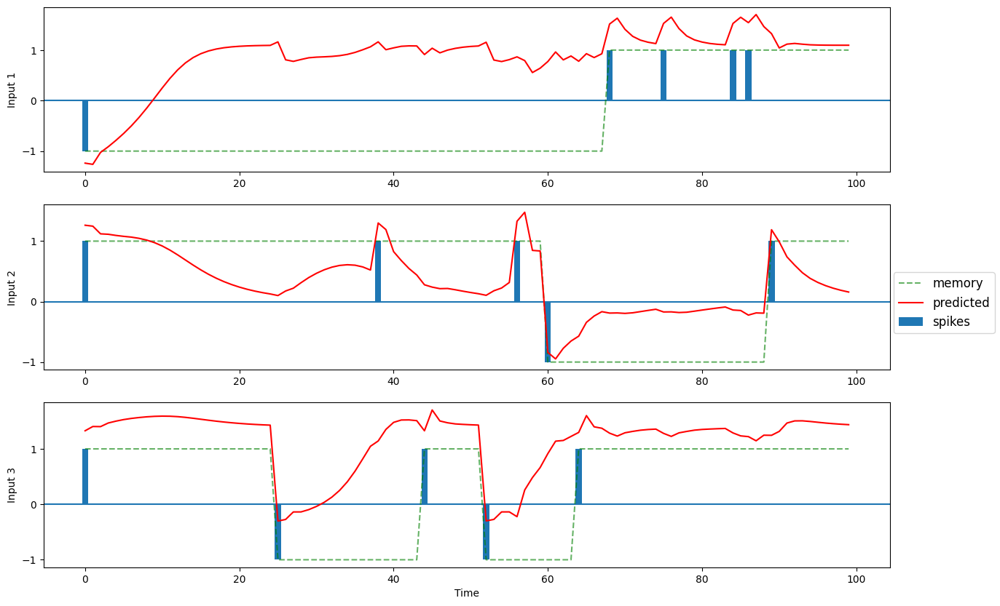

Loss: 0.6253576278686523 : 100%|██████████| 10000/10000 [01:09<00:00, 144.25it/s]
The invariance converged. Invariance loss: 0.3369447886943817 :   4%|▍         | 428/10000 [00:03<01:29, 107.05it/s]


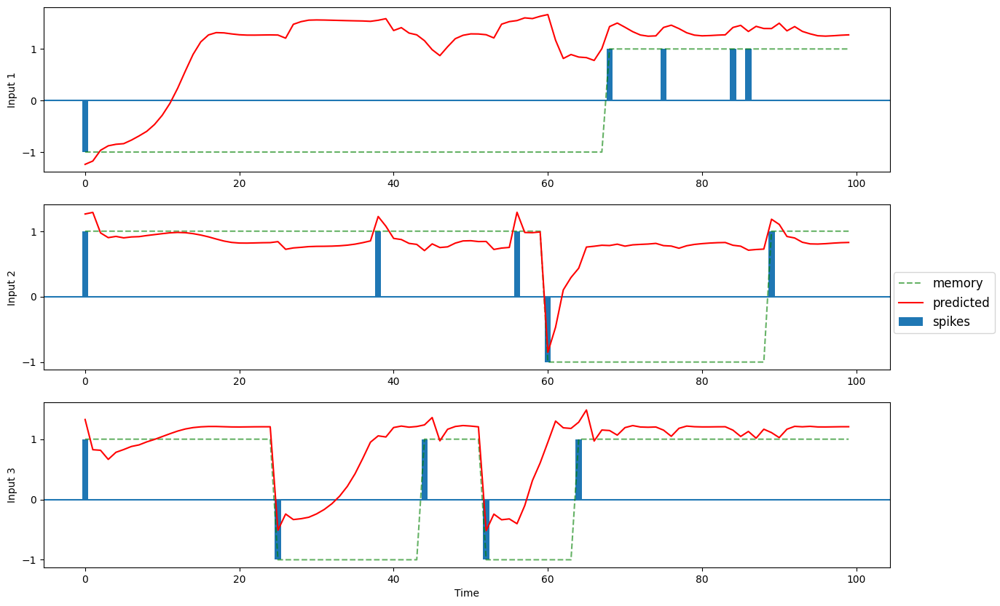

Loss: 0.5265747308731079 : 100%|██████████| 10000/10000 [01:24<00:00, 117.68it/s]
The invariance converged. Invariance loss: 0.41268813610076904 :   5%|▌         | 500/10000 [00:05<01:49, 86.54it/s]


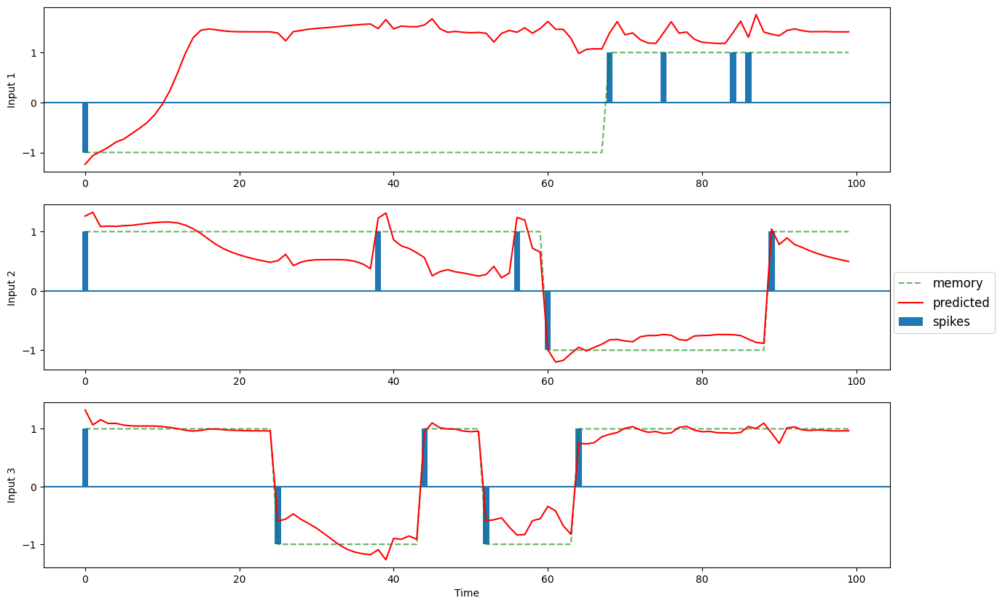

Loss: 0.4449918270111084 : 100%|██████████| 10000/10000 [01:40<00:00, 99.77it/s]
The invariance converged. Invariance loss: 0.47180527448654175 :   5%|▍         | 480/10000 [00:05<01:46, 89.50it/s]


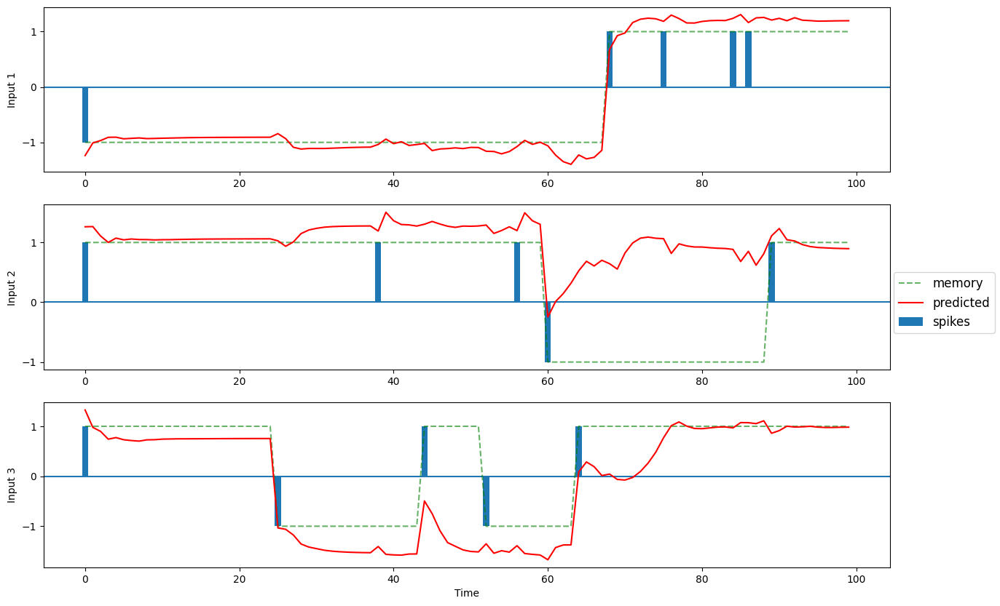

Loss: 0.37650439143180847 : 100%|██████████| 10000/10000 [01:52<00:00, 88.83it/s]
The invariance converged. Invariance loss: 0.5245629549026489 :   5%|▍         | 484/10000 [00:05<01:54, 83.22it/s]


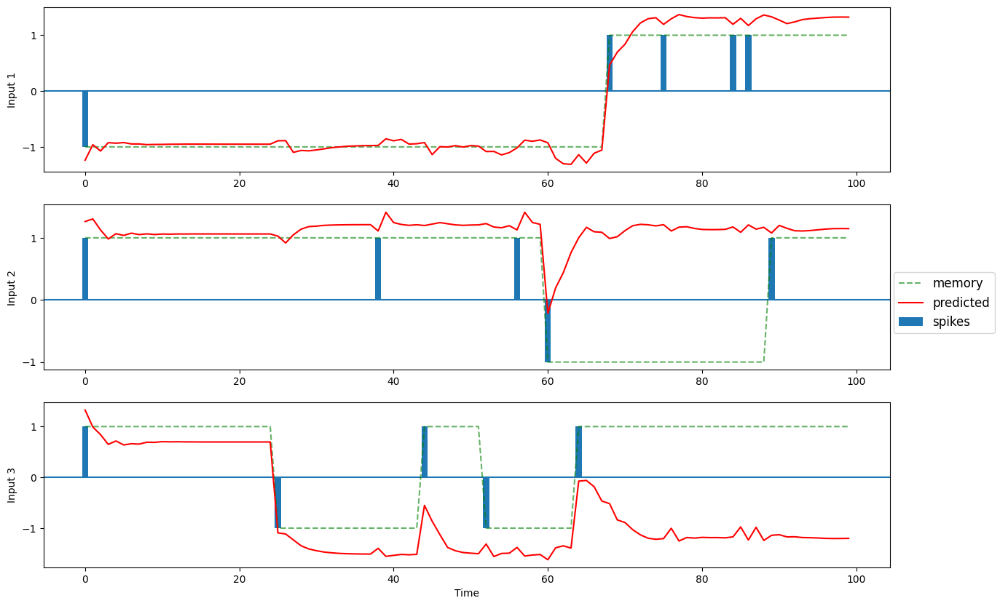

Loss: 0.3133390545845032 : 100%|██████████| 10000/10000 [02:03<00:00, 80.72it/s]
The invariance converged. Invariance loss: 0.5725646018981934 :   5%|▍         | 487/10000 [00:06<02:04, 76.33it/s]


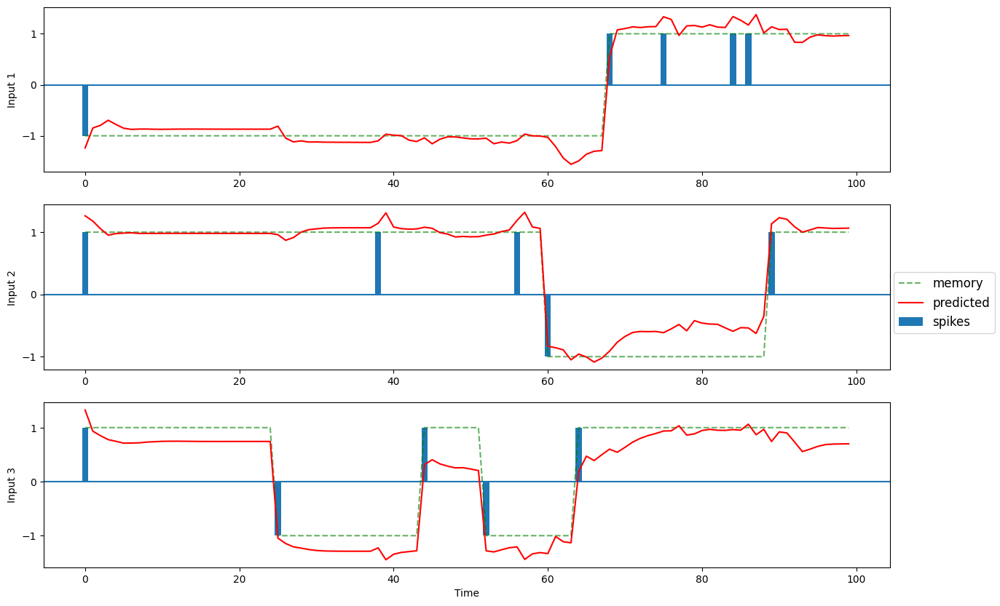

Loss: 0.2588263750076294 : 100%|██████████| 10000/10000 [02:20<00:00, 71.35it/s]
The invariance converged. Invariance loss: 0.606256365776062 :   5%|▍         | 497/10000 [00:06<02:10, 72.78it/s]


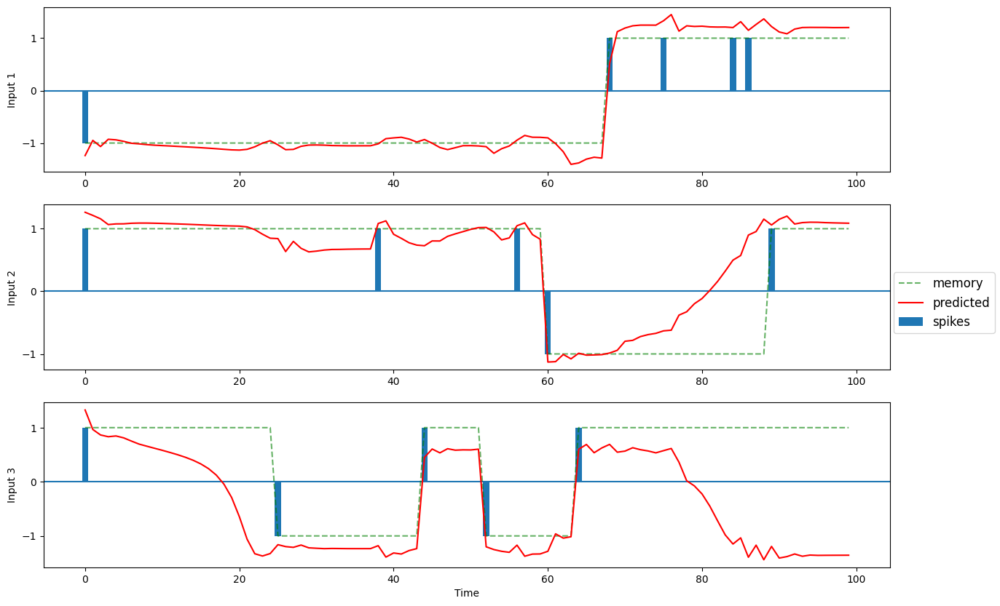

Loss: 0.21269580721855164 : 100%|██████████| 10000/10000 [02:30<00:00, 66.56it/s]
The invariance converged. Invariance loss: 0.6325279474258423 :   5%|▌         | 511/10000 [00:07<02:14, 70.60it/s]


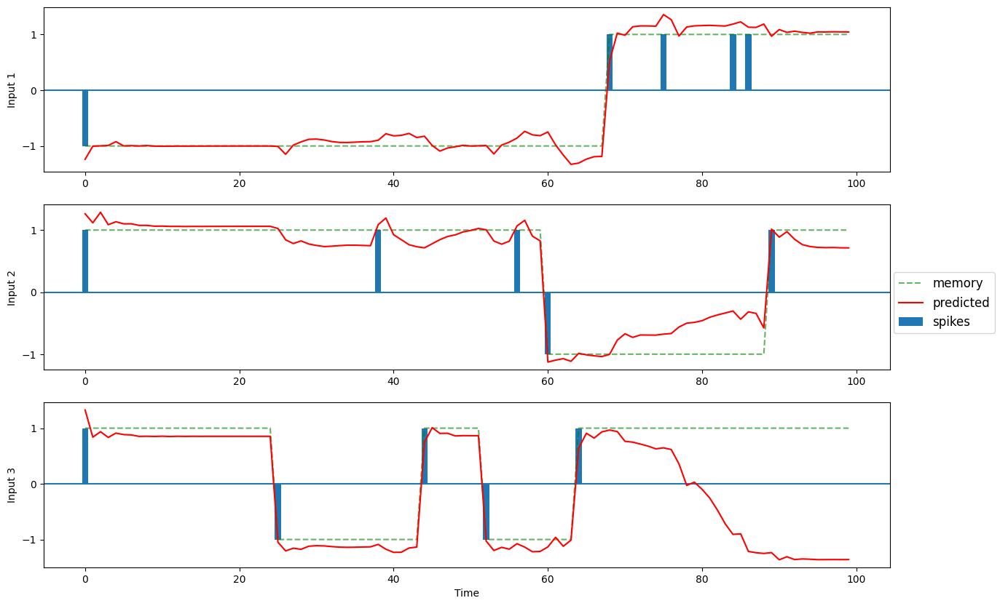

Loss: 0.1733141392469406 : 100%|██████████| 10000/10000 [02:42<00:00, 61.66it/s]
The invariance converged. Invariance loss: 0.6512517333030701 :   5%|▌         | 506/10000 [00:07<02:12, 71.71it/s]


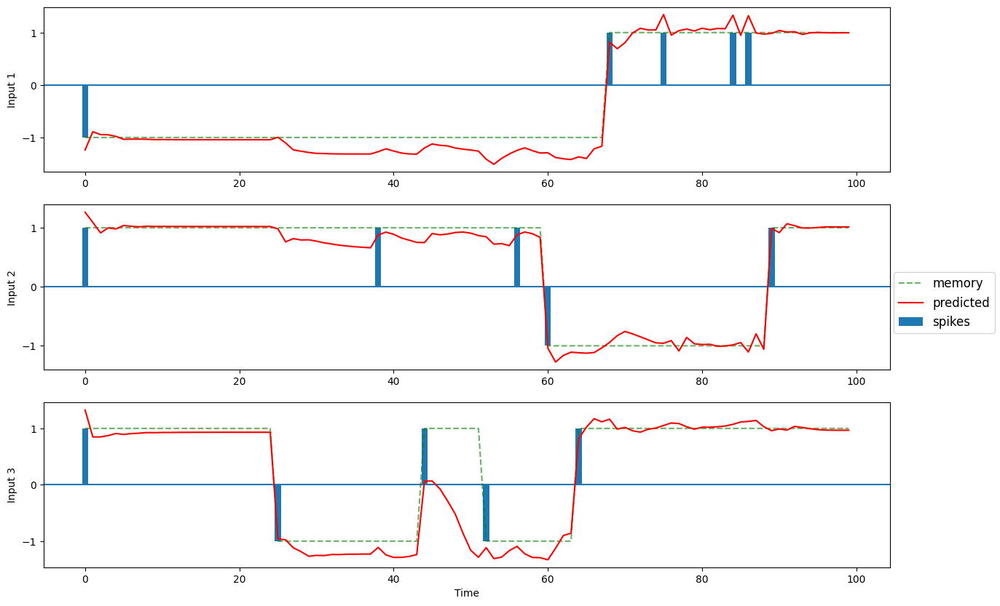

In [ ]:
slice_accs = []
for rank in range(1,10):
  std = twt.std()
  twt = twt / std
  components, model = slicetca.decompose(twt,number_components=(rank,rank,rank))
  twt = twt * std

  # For a not positive decomposition, we apply uniqueness constraints
  model = slicetca.invariance(model)
  reconstruction_full = model.construct().detach() * std
  tb_rnn.three_way_tensor = torch.nn.Parameter(reconstruction_full)
  with torch.no_grad():
    prediction = tb_rnn(Test_Inputs,None)[0]
    slice_accs.append(tb_rnn.evaluate(Test_Inputs,Test_Targets))

    K_Bit_Flipflop_task.draw_mem_charts(Test_Inputs.cpu(),Test_Targets.cpu(),Prediction=prediction.cpu(),idx=0,K=K,T=T)
    torch.cuda.empty_cache()

  tb_rnn.three_way_tensor = torch.nn.Parameter(twt)

In [ ]:
lr_accs = []
for rank in range(1,7):
  low_rank_rnn = Low_Rank_Three_Way_RNN(input_size, output_size, hidden_dim, rank,nonlinearity = torch.tanh, task = "FF").to(DEVICE)
  low_rank_rnn.load_state_dict(torch.load(f'/content/drive/MyDrive/Three_Bodies_Network/Low_Rank_Rnn/Three_Way_Rank_{rank}_Mimic_Tanh_RNN.pth'))
  # calculate task lr inferred accuracy
  lr_accs.append(low_rank_rnn.evaluate(Test_Inputs, Test_Targets).cpu().data)
for rank in range(7,21):
  lr_accs.append(1.0)

In [ ]:
slice_accs

[tensor(0.8026),
 tensor(0.7516),
 tensor(0.8654),
 tensor(0.9205),
 tensor(0.8976),
 tensor(0.9723),
 tensor(0.9405),
 tensor(0.9784),
 tensor(0.9810)]

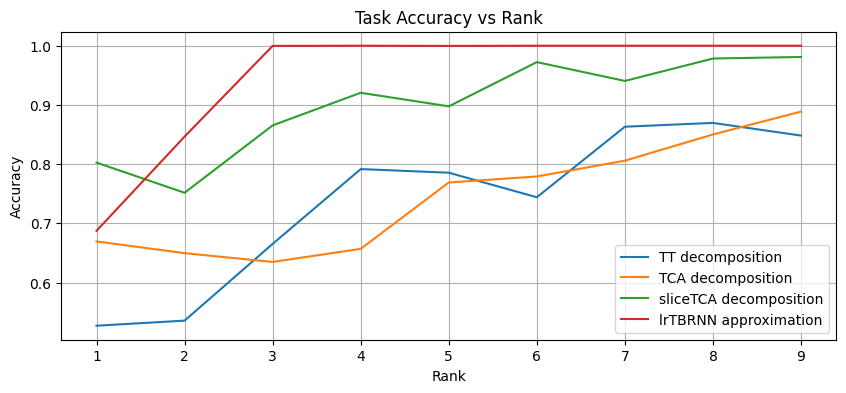

In [ ]:
ranks = 9
figure = plt.figure(figsize=(10,4))
ax = figure.add_subplot(111)
ax.plot(tca_accs[:9],label="TT decomposition")
ax.plot(tt_accs[:9],label="TCA decomposition")
ax.plot(slice_accs,label="sliceTCA decomposition")
ax.plot(lr_accs[:9],label="lrTBRNN approximation")
ax.set_xticks(ticks = range(0,ranks), labels = range(1,ranks+1))
ax.set_xlabel("Rank")
ax.set_ylabel("Accuracy")
ax.set_title("Task Accuracy vs Rank")
ax.legend()
ax.grid()

# dynamical TBRNN, for theory purposes

##Train TBRNN, tanh, K=1

In [ ]:
# k - flip-flop
K = 1
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

tb_rnn = Three_Bodies_RNN_Dynamics(input_size, output_size, hidden_dim).to(DEVICE)

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(tb_rnn.parameters(), lr=1e-03)

# train parameters
n_steps = 3000
n_batch = 500

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
losses = tb_rnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T)


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
optimizer = torch.optim.Adam(tb_rnn.parameters(), lr=5e-04)
losses = tb_rnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T)
tb_rnn.evaluate(Inputs,Targets)

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
mount_colab()

Mounted at /content/drive


In [ ]:
# k - flip-flop
K = 1
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

tb_rnn = Three_Bodies_RNN_Dynamics(input_size, output_size, hidden_dim).to(DEVICE)
tb_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/Three_Way_RNN_Tanh_1FF.pth"))
# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(tb_rnn.parameters(), lr=1e-03)

# train parameters
n_steps = 3000
n_batch = 500

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


In [ ]:
tb_rnn.clone().evaluate(Inputs,Targets)

tensor(0.9997, device='cuda:0')

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)
  0%|          | 0/15000 [00:00<?, ?it/s]

0 /10 --- loss = 0.642861, best = 0.642861


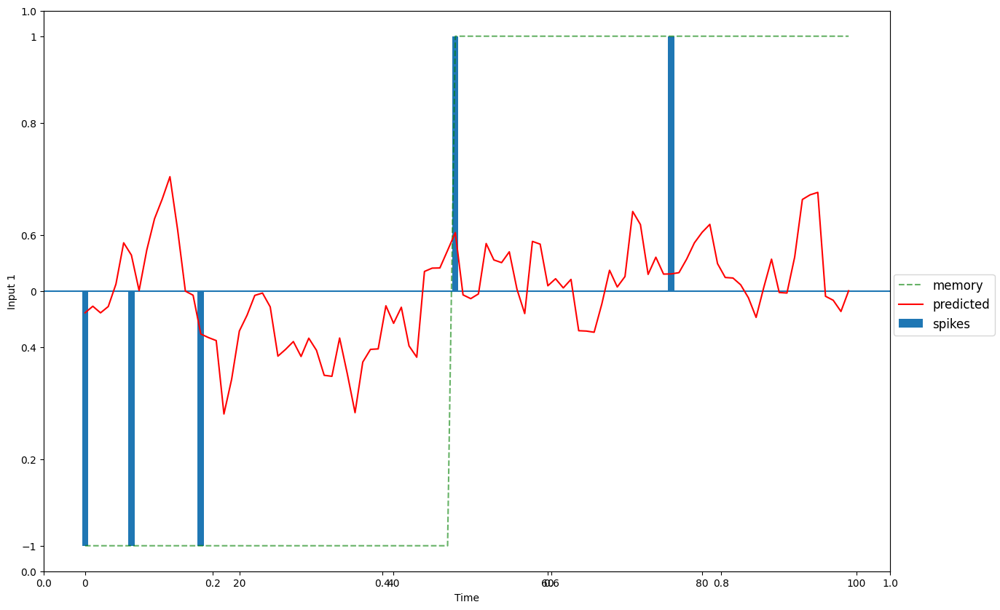

 10%|█         | 1500/15000 [02:38<23:13,  9.69it/s]

1 /10 --- loss = 0.352746, best = 0.352669


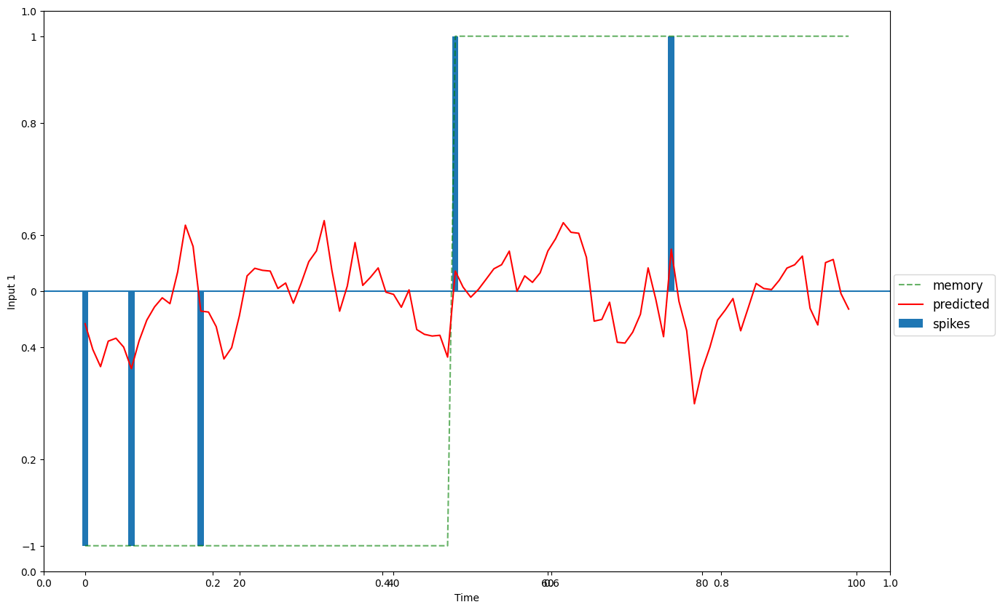

 20%|██        | 3000/15000 [05:17<20:44,  9.64it/s]

2 /10 --- loss = 0.324346, best = 0.324346


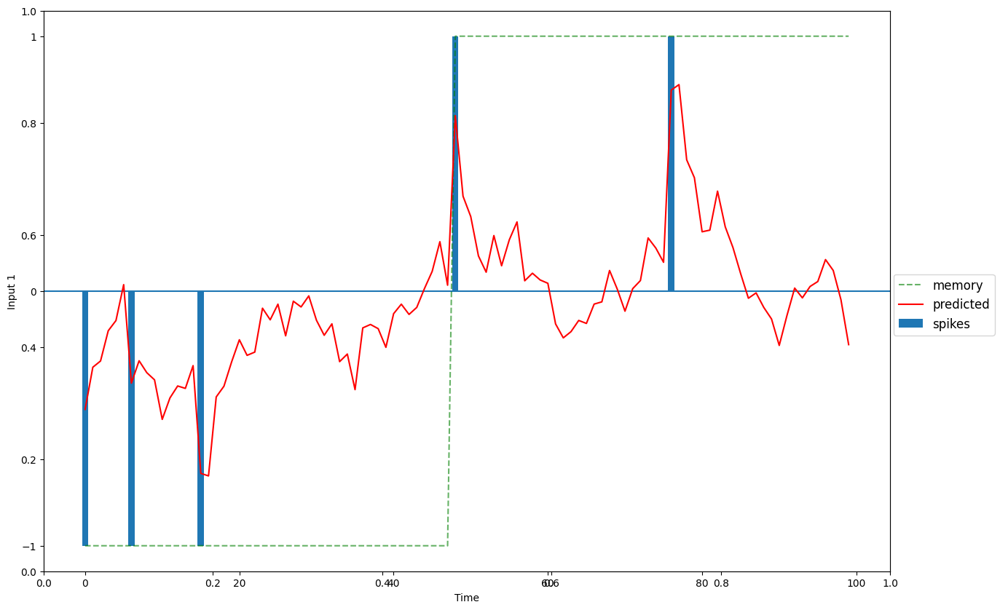

 30%|███       | 4500/15000 [07:57<18:47,  9.31it/s]

3 /10 --- loss = 0.308829, best = 0.308725


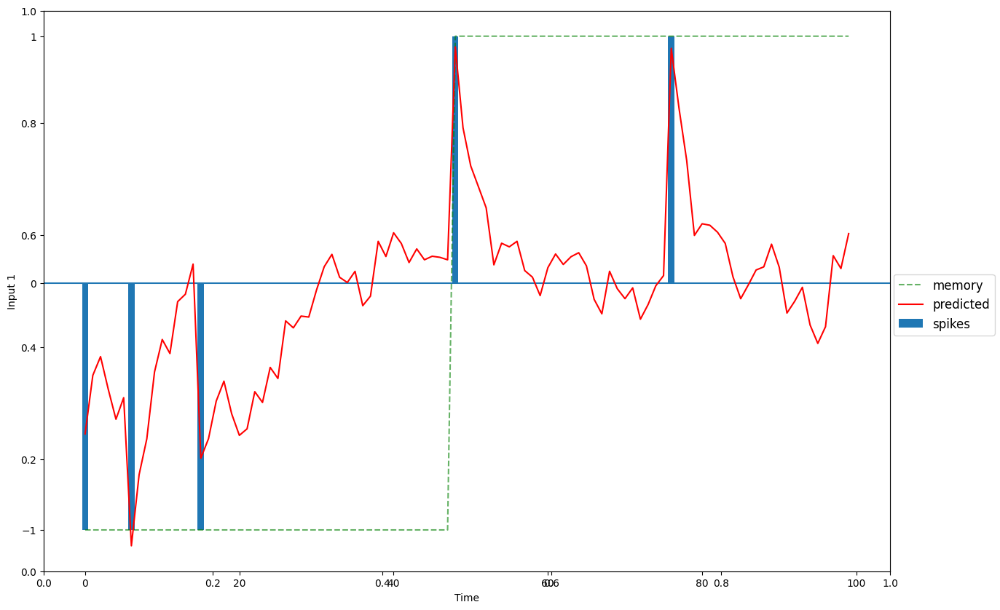

 40%|████      | 6000/15000 [10:37<16:13,  9.24it/s]

4 /10 --- loss = 0.296532, best = 0.296195


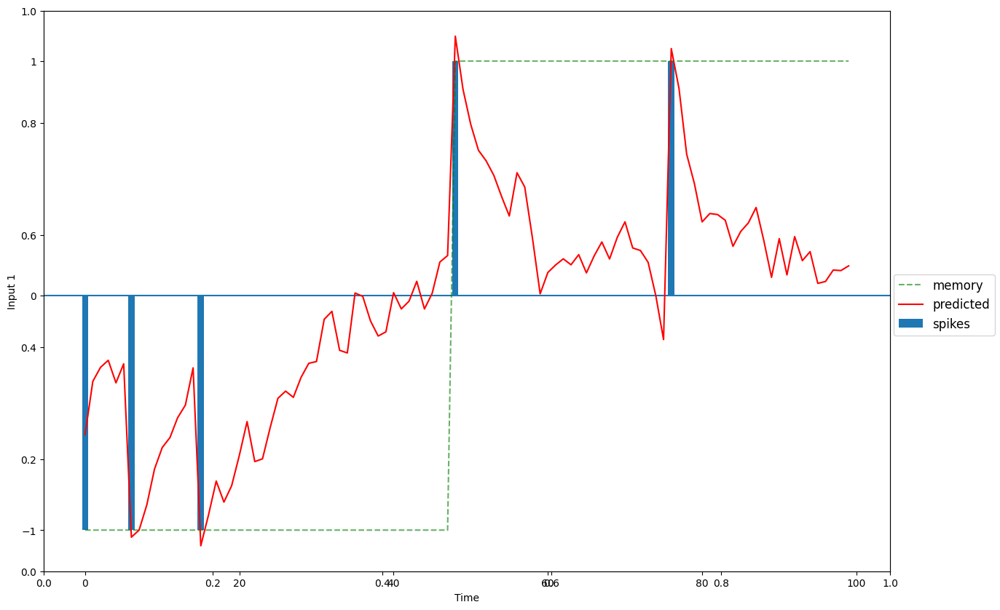

 50%|█████     | 7500/15000 [13:17<13:00,  9.61it/s]

5 /10 --- loss = 0.285514, best = 0.285450


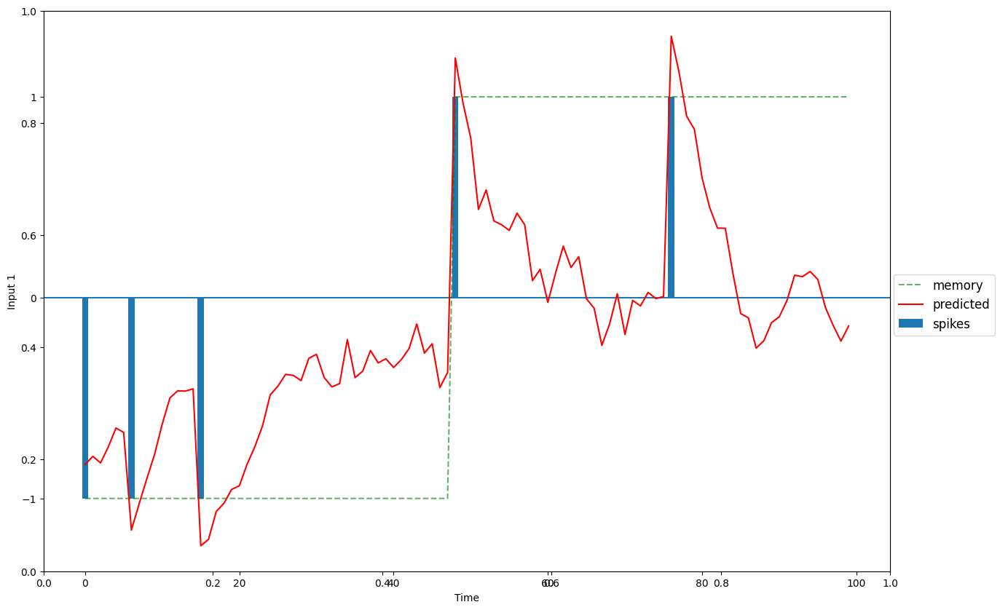

 60%|██████    | 9000/15000 [15:57<11:20,  8.82it/s]

6 /10 --- loss = 0.251781, best = 0.251529


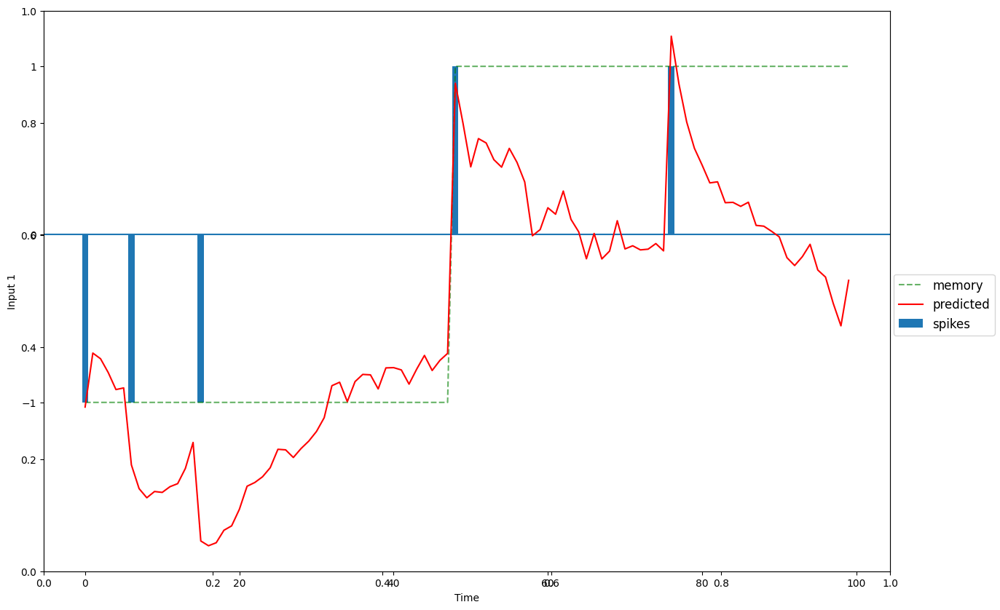

 70%|███████   | 10500/15000 [18:37<08:11,  9.15it/s]

7 /10 --- loss = 0.226062, best = 0.225066


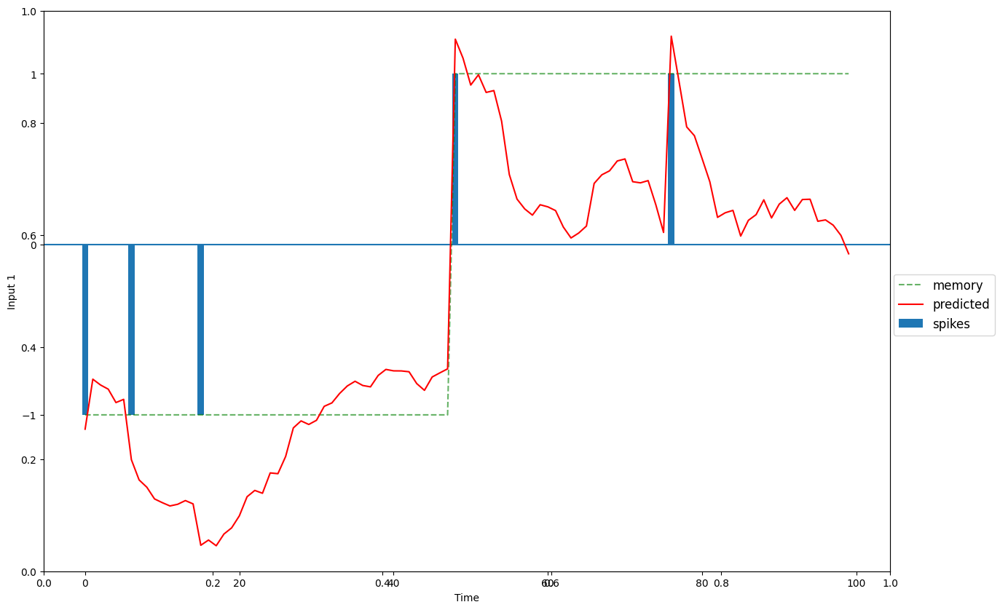

 80%|████████  | 12000/15000 [21:20<05:22,  9.29it/s]

8 /10 --- loss = 0.212380, best = 0.210838


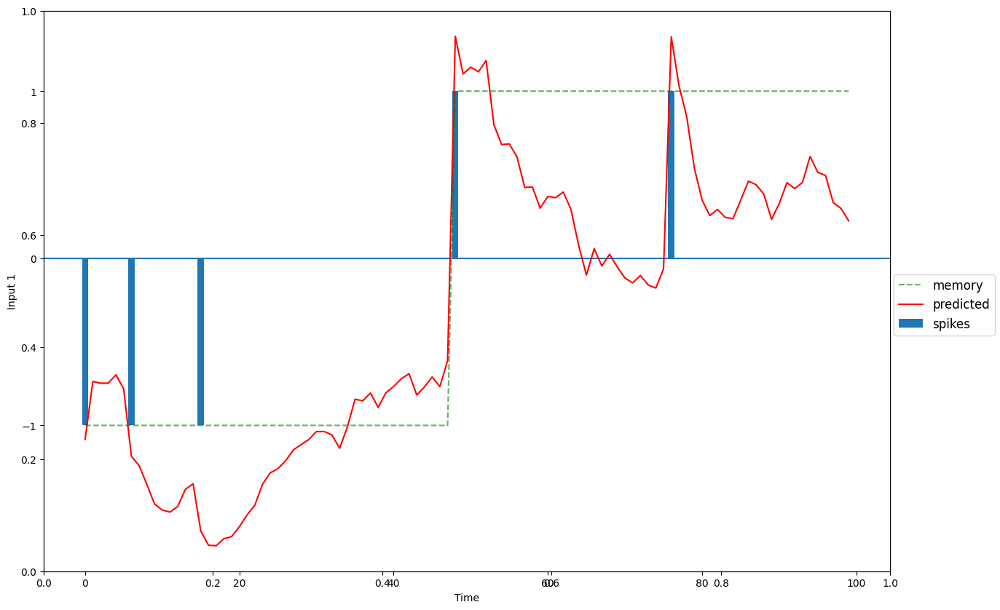

 90%|█████████ | 13500/15000 [24:04<02:40,  9.35it/s]

9 /10 --- loss = 0.200898, best = 0.199816


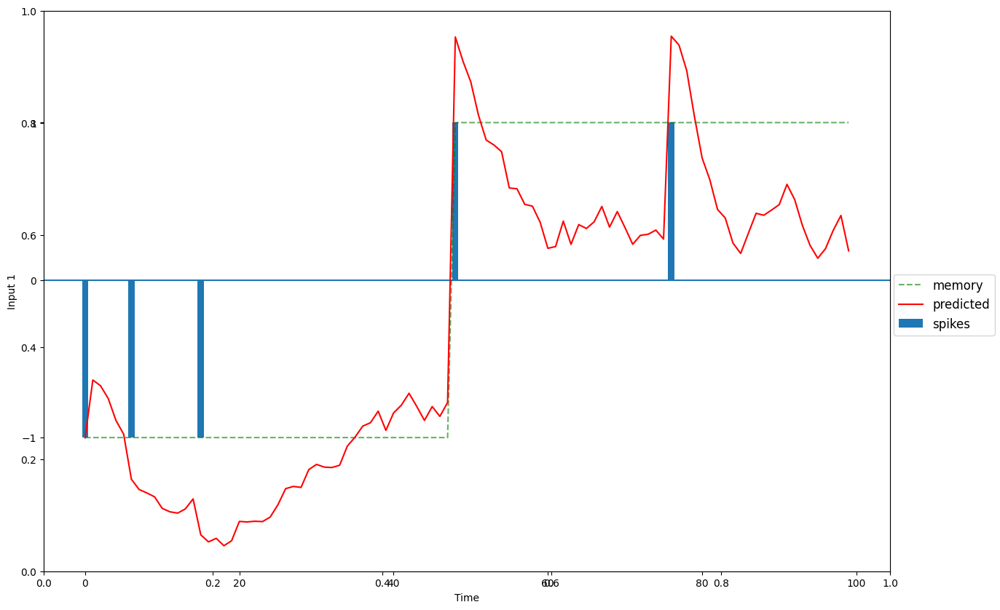

100%|██████████| 15000/15000 [26:45<00:00,  9.35it/s]

Loss:  0.19270822405815125


[tensor(0.9677, device='cuda:0')]

In [ ]:
to_save = f'/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/Three_Way_Rank_1_Mimic_K1_Tanh_TBRNN.pth'
low_rank_procedures.LINT_procedure(tb_rnn,
                                   Low_Rank_Three_Way_RNN_Dynamics,
                                   Inputs,
                                   Targets,
                                   start_rank=1,
                                   ranks=1,
                                   K=K,
                                   T=T,
                                   n_steps=15000,
                                   batch_size = 256,
                                   train_size = 256,
                                   lr = 5e-04,
                                   to_save=to_save)

In [ ]:
low_rank_rnn = Low_Rank_Three_Way_RNN_Dynamics(input_size,output_size,hidden_dim,1).to(DEVICE)
low_rank_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/Three_Way_Rank_1_Mimic_K1_Tanh_TBRNN.pth"))

<All keys matched successfully>

In [ ]:
newInputs, newTargets = K_Bit_Flipflop_task.generate_mem_data(256,T,K)

  0%|          | 0/10000 [00:00<?, ?it/s]

0 /10 --- loss = 0.172626, best = 0.172626


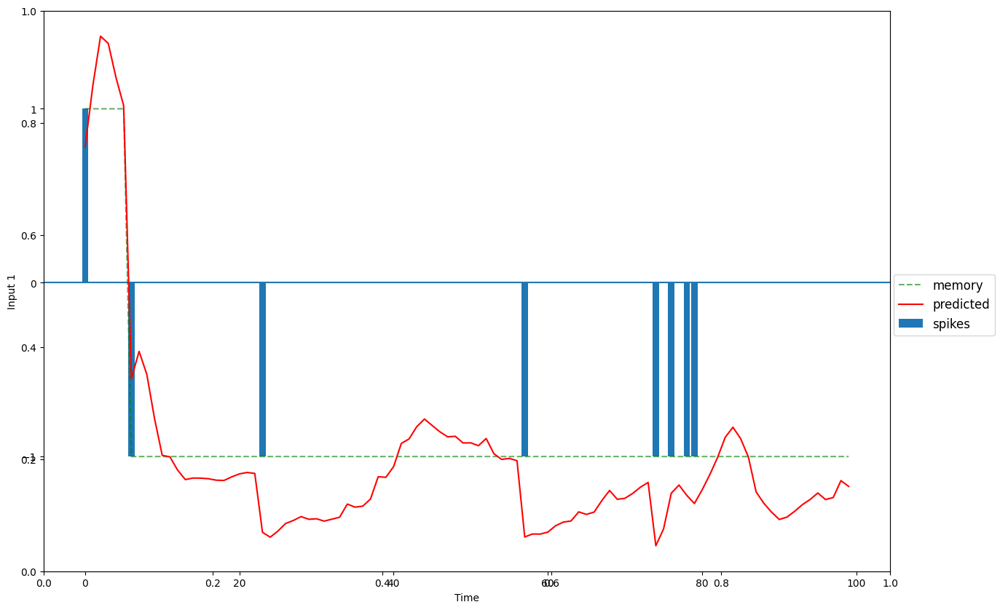

 10%|█         | 1000/10000 [01:49<16:06,  9.31it/s]

1 /10 --- loss = 0.172479, best = 0.171306


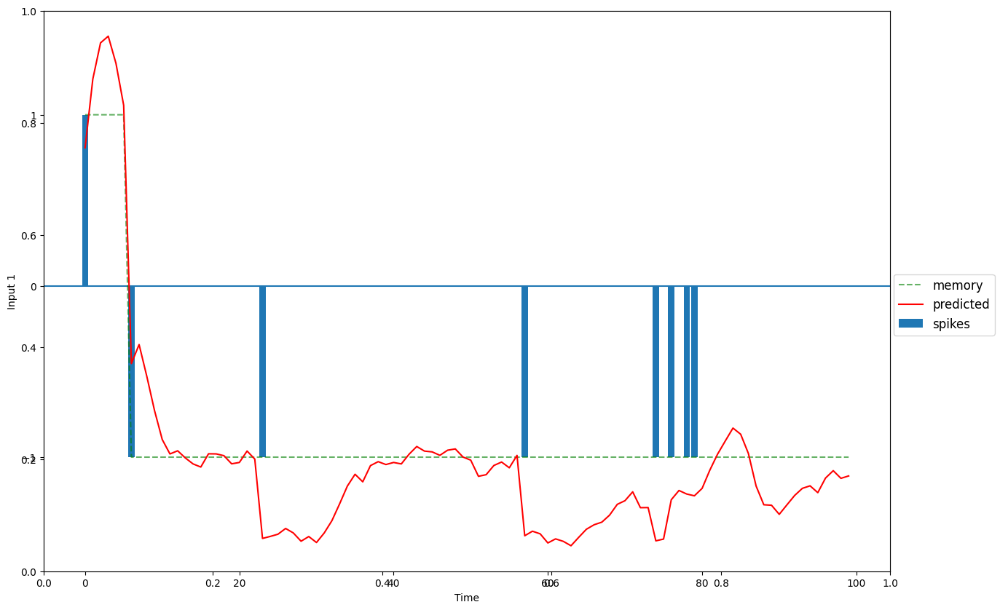

 20%|██        | 2000/10000 [03:39<15:03,  8.85it/s]

2 /10 --- loss = 0.171783, best = 0.171222


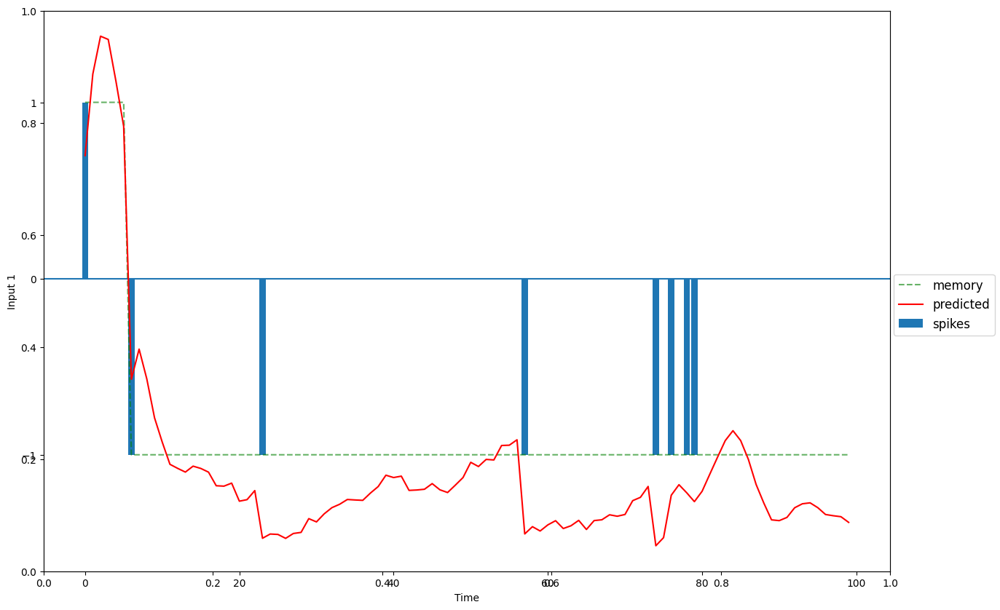

 30%|███       | 3000/10000 [05:30<12:51,  9.07it/s]

3 /10 --- loss = 0.171323, best = 0.171005


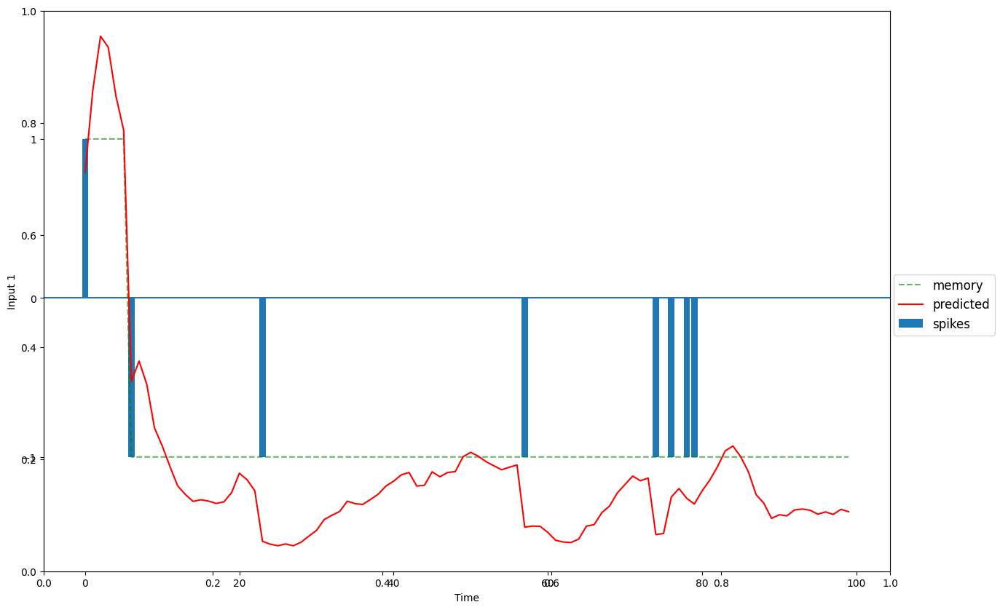

 40%|████      | 4000/10000 [07:19<10:52,  9.20it/s]

4 /10 --- loss = 0.170955, best = 0.170551


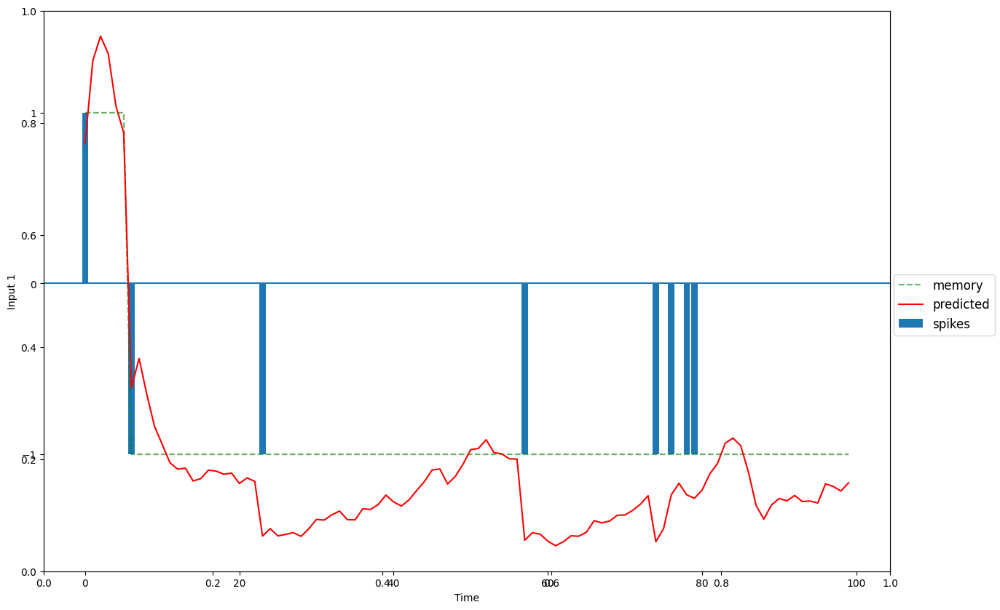

 50%|█████     | 5000/10000 [09:09<08:58,  9.28it/s]

5 /10 --- loss = 0.170762, best = 0.170361


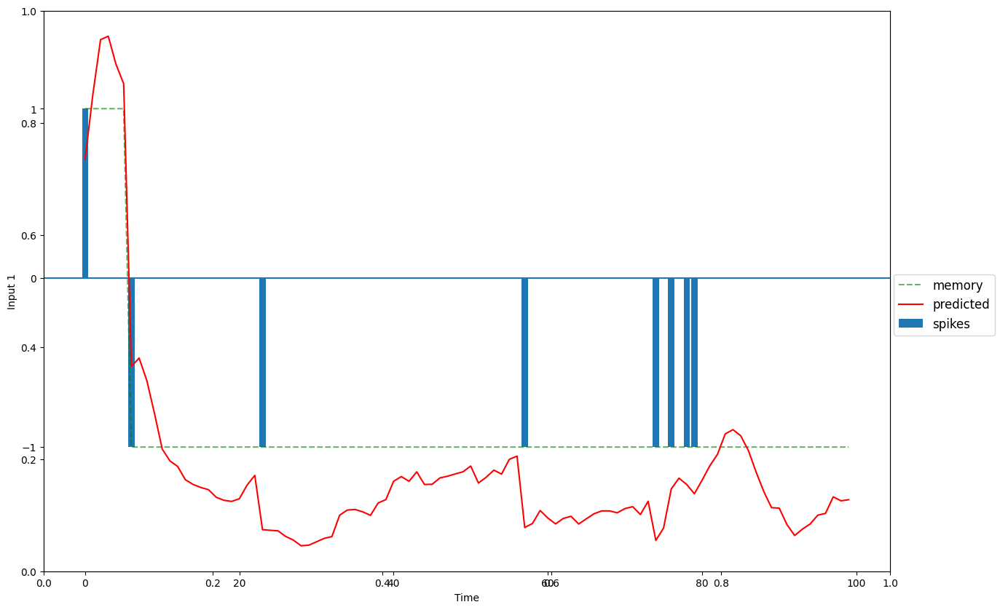

 60%|██████    | 6000/10000 [10:58<07:06,  9.38it/s]

6 /10 --- loss = 0.170552, best = 0.170124


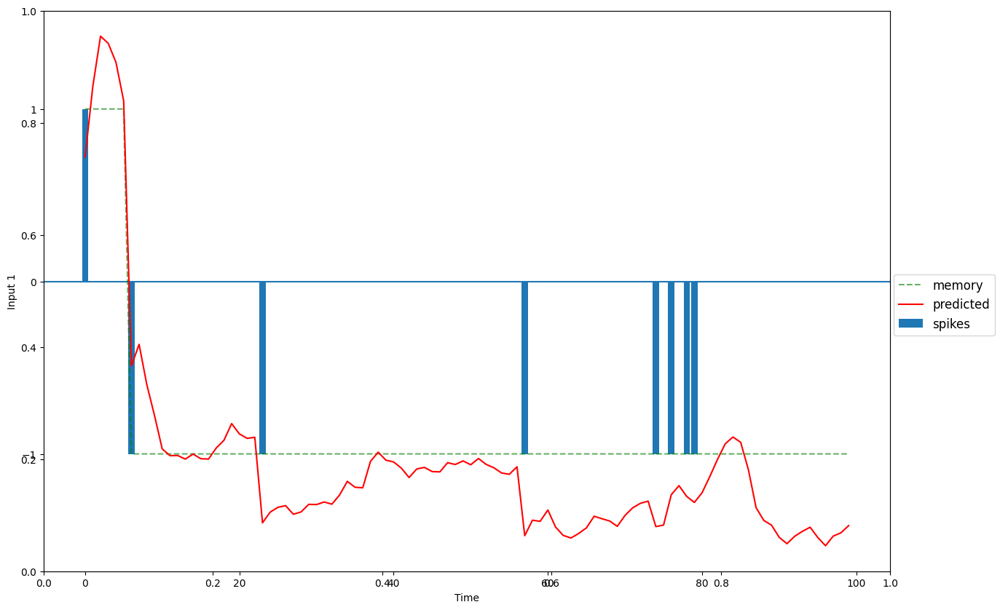

 70%|███████   | 7000/10000 [12:49<05:30,  9.07it/s]

7 /10 --- loss = 0.170127, best = 0.169841


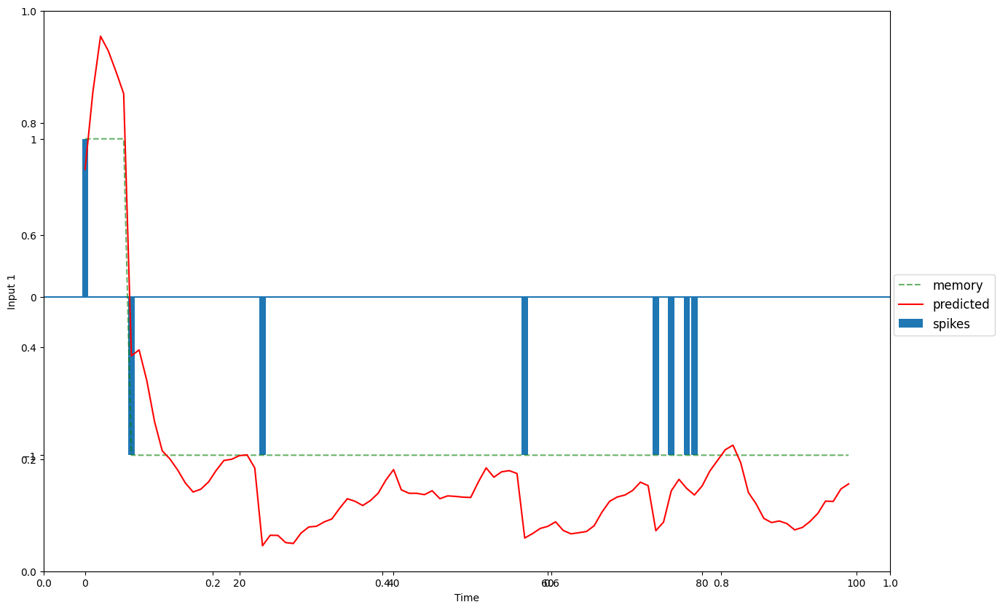

 80%|████████  | 8000/10000 [14:39<03:37,  9.19it/s]

8 /10 --- loss = 0.169895, best = 0.169460


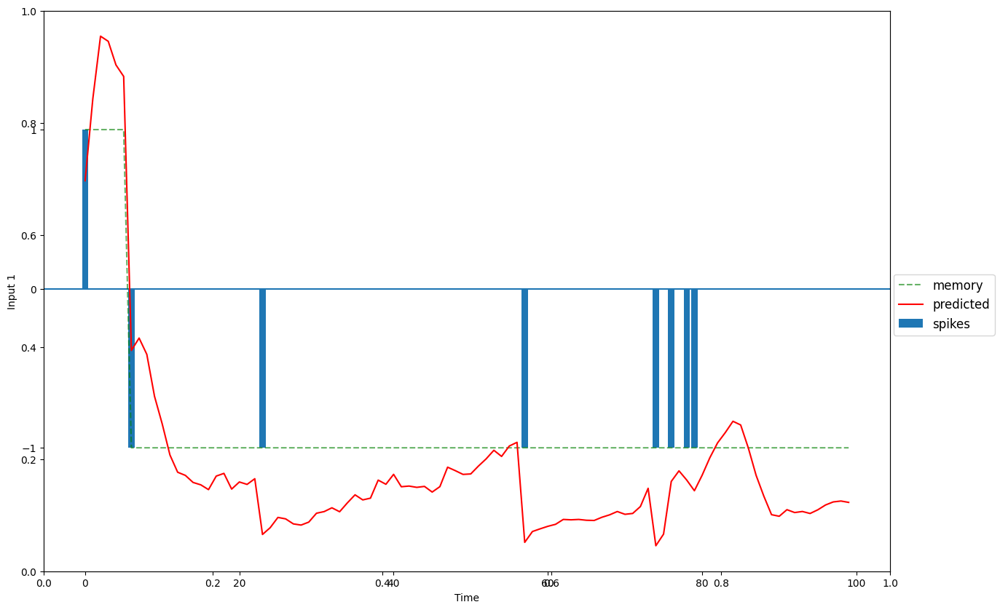

 90%|█████████ | 9000/10000 [16:28<01:40,  9.94it/s]

9 /10 --- loss = 0.170004, best = 0.169268


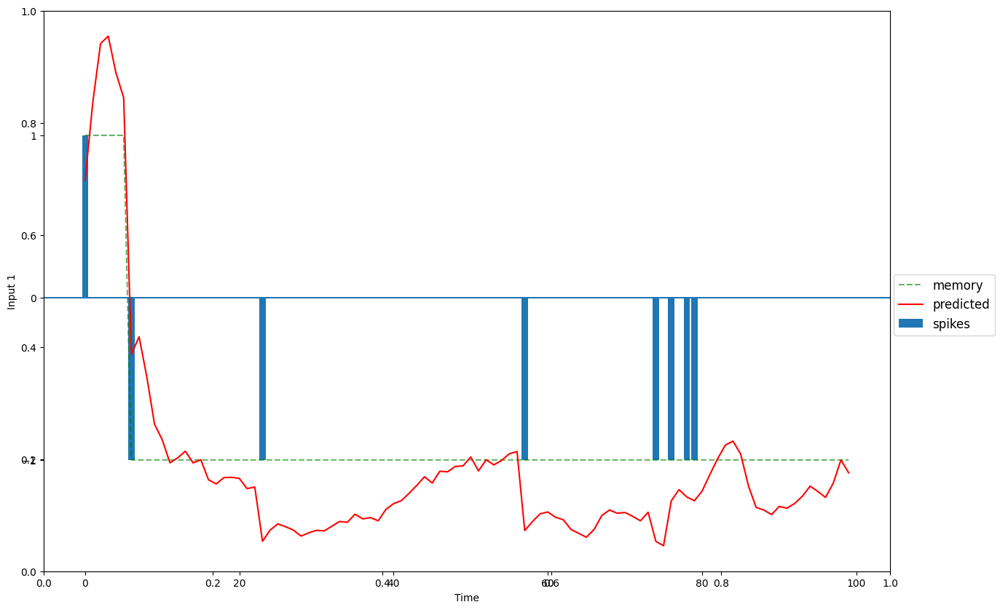

100%|██████████| 10000/10000 [18:16<00:00,  9.12it/s]

Loss:  0.1698896884918213
tensor(0.9822, device='cuda:0')


In [ ]:
lr = 1e-04
optimizer = torch.optim.Adam(low_rank_rnn.parameters(), lr=lr)
losses = low_rank_rnn.lr_train(newInputs, newTargets, tb_rnn, 10000, optimizer, criterion,
                                256, T)
print(low_rank_rnn.evaluate(Inputs, Targets))

In [ ]:
traj = low_rank_rnn(newInputs, None)[2]


In [ ]:
l = low_rank_rnn.L

In [ ]:
(l.T @ low_rank_rnn.input_fc.weight).item()

17.941692352294922

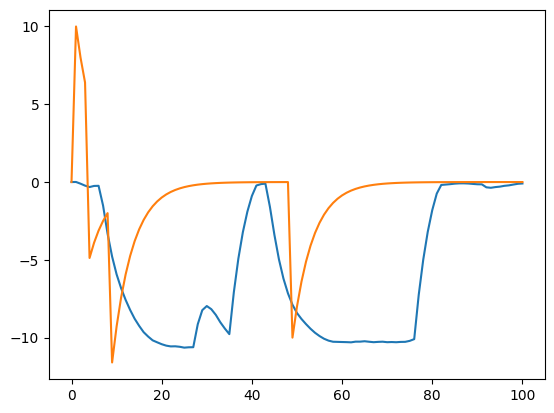

In [ ]:
for i in range(1,2):
  plt.plot(((traj @ low_rank_rnn.L)[i,:,0] / ((l.norm())**2)).cpu().detach().numpy())
  ks = [0]
  for j in range(T):
    ks.append(ks[-1] + 0.2*(-ks[-1] + Inputs[i,j,0].item()))
  plt.plot([k*50 for k in ks])

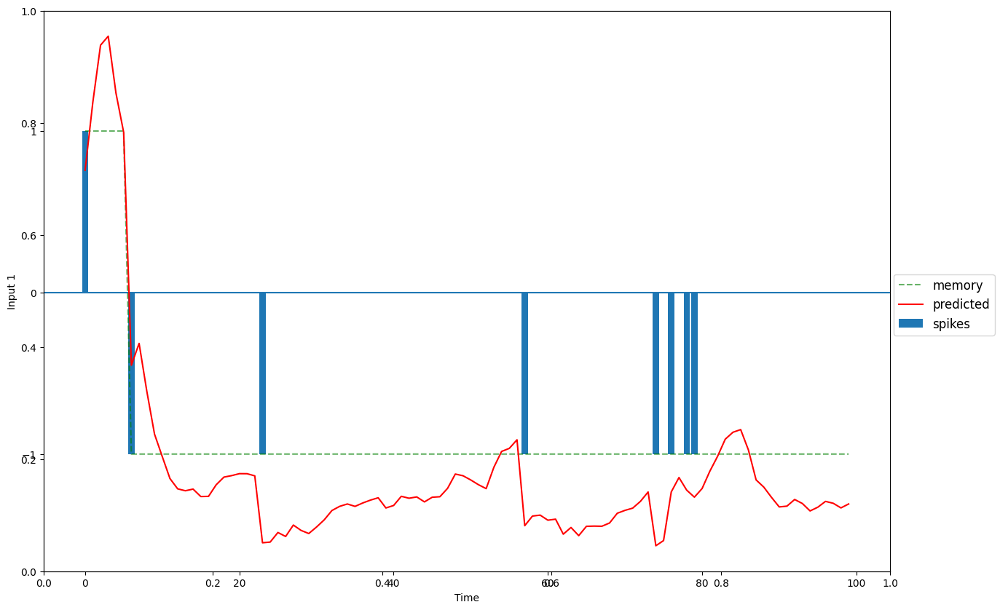

In [ ]:
K_Bit_Flipflop_task.draw_mem_charts(newInputs.cpu(),newTargets.cpu(),low_rank_rnn(newInputs,None)[0].cpu(),idx=0,K=K,T=T)

##Train TBRNN, tanh, K=3

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

tb_rnn = Three_Bodies_RNN_Dynamics(input_size, output_size, hidden_dim).to(DEVICE)

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(tb_rnn.parameters(), lr=1e-03)

# train parameters
n_steps = 3000
n_batch = 1000

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
losses = tb_rnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T)

Output hidden; open in https://colab.research.google.com to view.

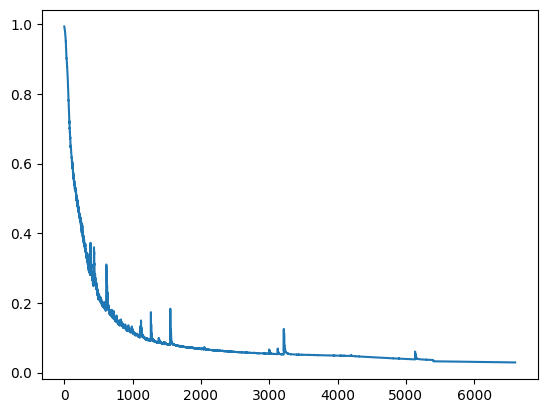

In [ ]:
plt.plot(losses)

##Low rank procedures

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

tb_rnn = Three_Bodies_RNN_Dynamics(input_size, output_size, hidden_dim).to(DEVICE)
tb_rnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/Three_Way_RNN_Tanh_3FF.pth"))
# train parameters
n_steps = 3000
n_batch = 128

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


In [ ]:
TCA_accs = low_rank_procedures.TCA_procedure(tb_rnn,Inputs,Targets,ranks=10)
TT_accs = low_rank_procedures.TT_procedure(tb_rnn,Inputs,Targets,ranks=10)
sliceTCA_accs = low_rank_procedures.sliceTCA_procedure(tb_rnn,Inputs,Targets,ranks=4)

The model converged. Loss: 0.505572497844696 :  24%|██▎       | 2357/10000 [00:09<00:30, 247.71it/s]
The invariance converged. Invariance loss: 0.4817284941673279 :   5%|▌         | 503/10000 [00:02<00:50, 186.23it/s]
Loss: 0.27135923504829407 : 100%|██████████| 10000/10000 [00:44<00:00, 225.99it/s]
The invariance converged. Invariance loss: 0.6840329766273499 :   6%|▌         | 582/10000 [00:03<00:53, 176.02it/s]
Loss: 0.18439973890781403 : 100%|██████████| 10000/10000 [00:51<00:00, 195.64it/s]
The invariance converged. Invariance loss: 0.695443868637085 :   6%|▌         | 552/10000 [00:03<00:58, 160.97it/s]
Loss: 0.13357695937156677 : 100%|██████████| 10000/10000 [00:58<00:00, 169.99it/s]
The invariance converged. Invariance loss: 0.6197106838226318 :   5%|▌         | 539/10000 [00:03<01:03, 149.80it/s]


  0%|          | 0/15000 [00:00<?, ?it/s]

0 /10 --- loss = 0.414303, best = 0.414303


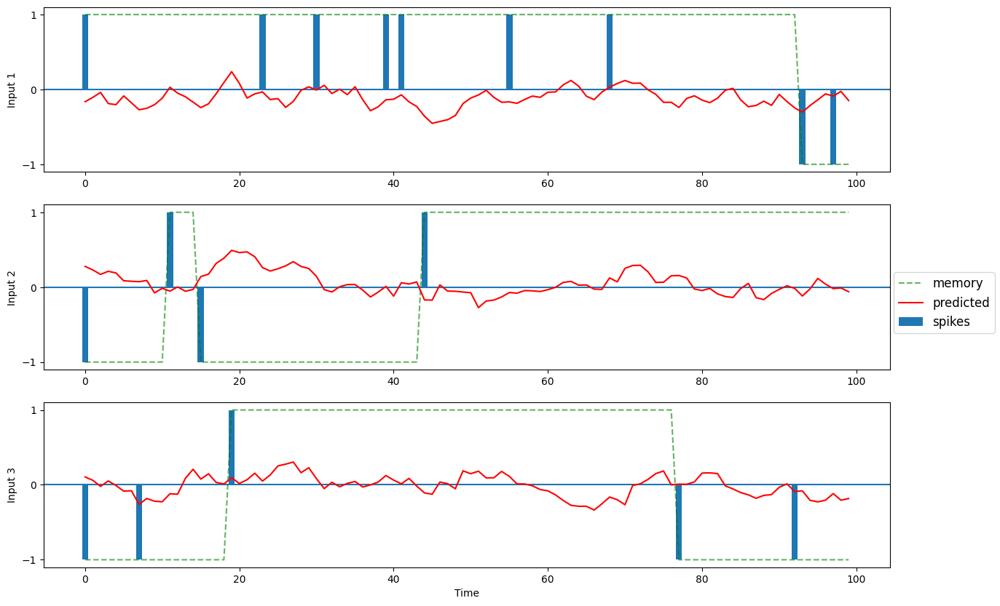

 10%|█         | 1500/15000 [02:37<22:40,  9.92it/s]

1 /10 --- loss = 0.273631, best = 0.273346


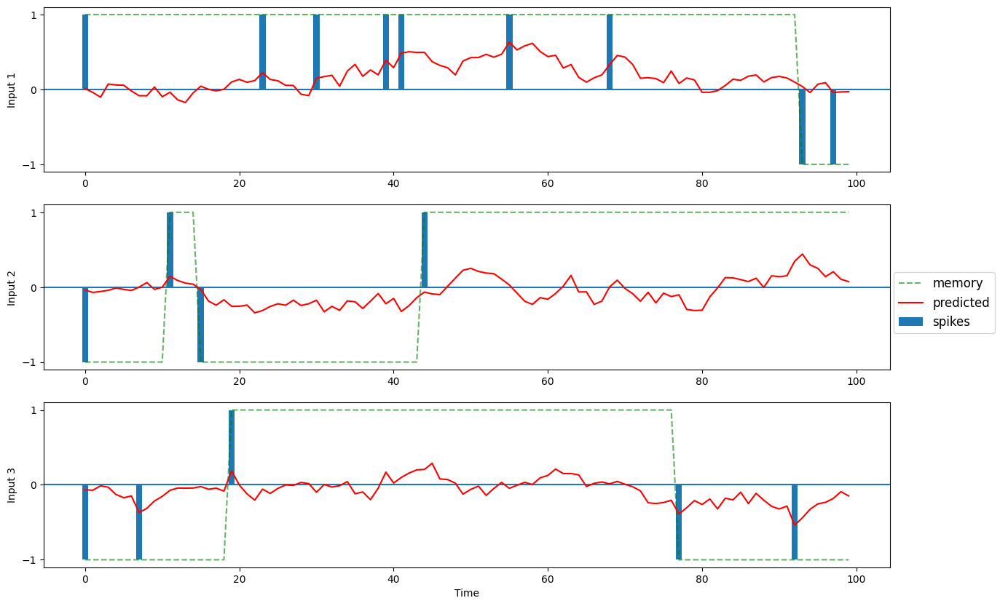

 20%|██        | 3000/15000 [05:12<20:44,  9.64it/s]

2 /10 --- loss = 0.250126, best = 0.250090


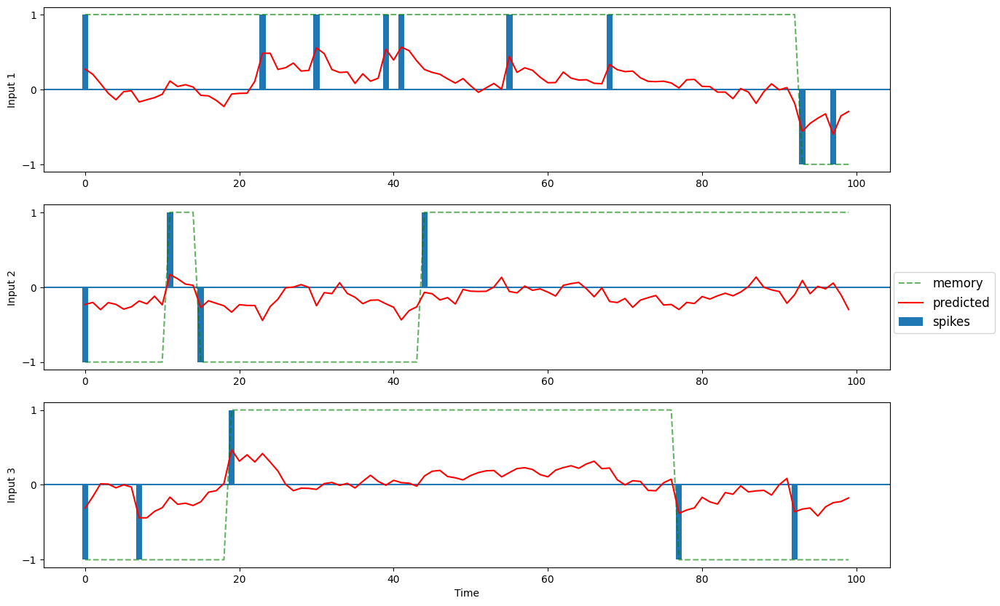

 30%|██▉       | 4499/15000 [07:48<17:20, 10.09it/s]

3 /10 --- loss = 0.165348, best = 0.164716


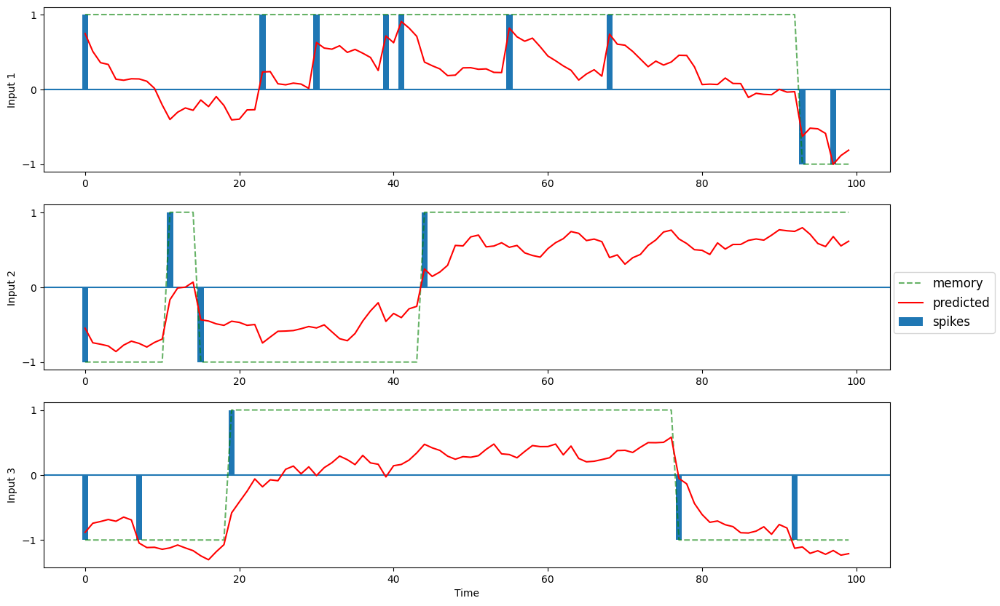

 40%|████      | 6000/15000 [10:23<15:03,  9.96it/s]

4 /10 --- loss = 0.145787, best = 0.144953


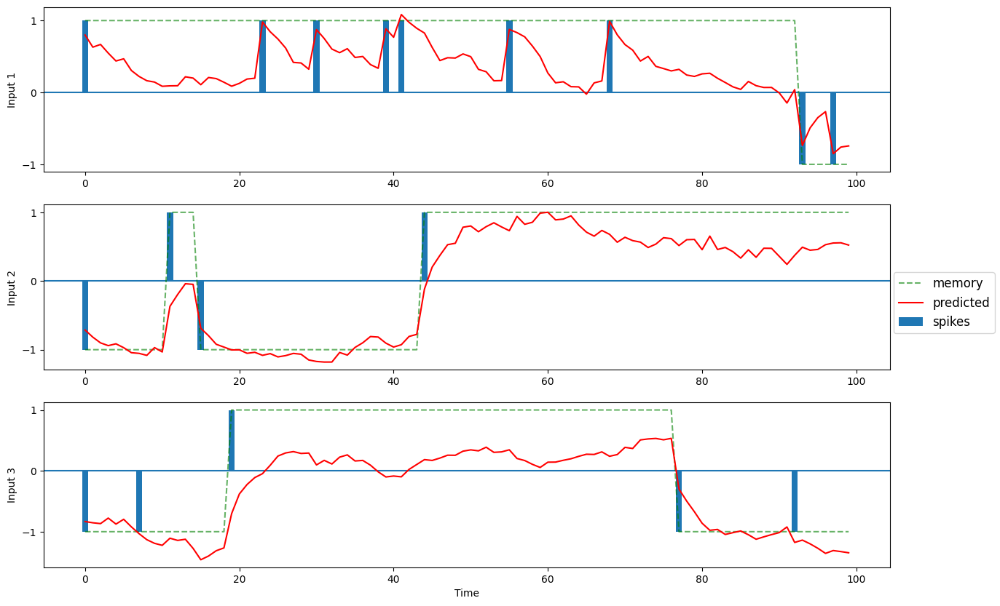

 50%|█████     | 7500/15000 [13:00<13:44,  9.09it/s]

5 /10 --- loss = 0.136642, best = 0.134033


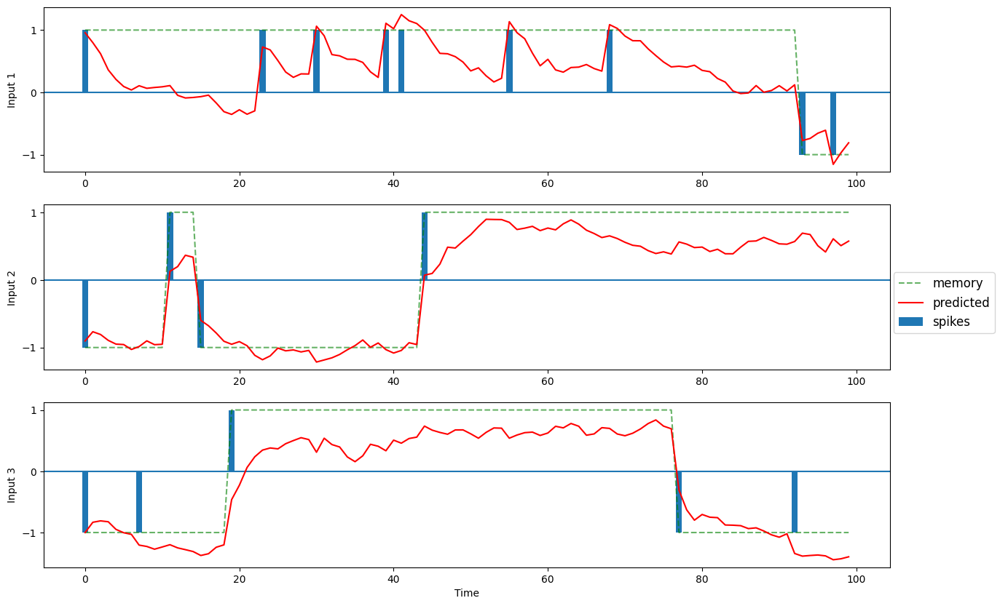

 60%|██████    | 9000/15000 [15:37<10:33,  9.47it/s]

6 /10 --- loss = 0.127499, best = 0.126741


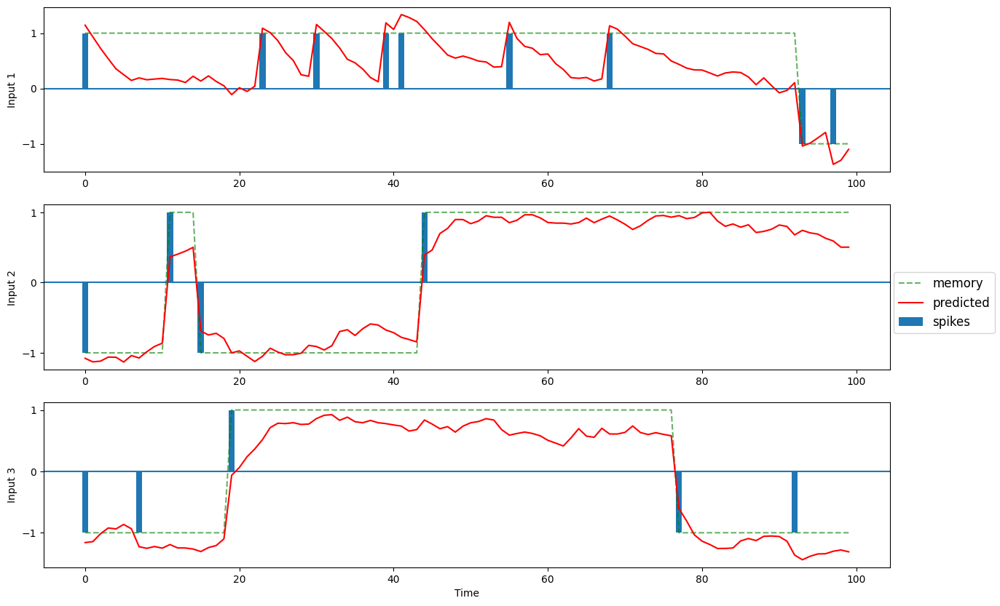

 70%|███████   | 10500/15000 [18:14<08:04,  9.29it/s]

7 /10 --- loss = 0.121803, best = 0.120957


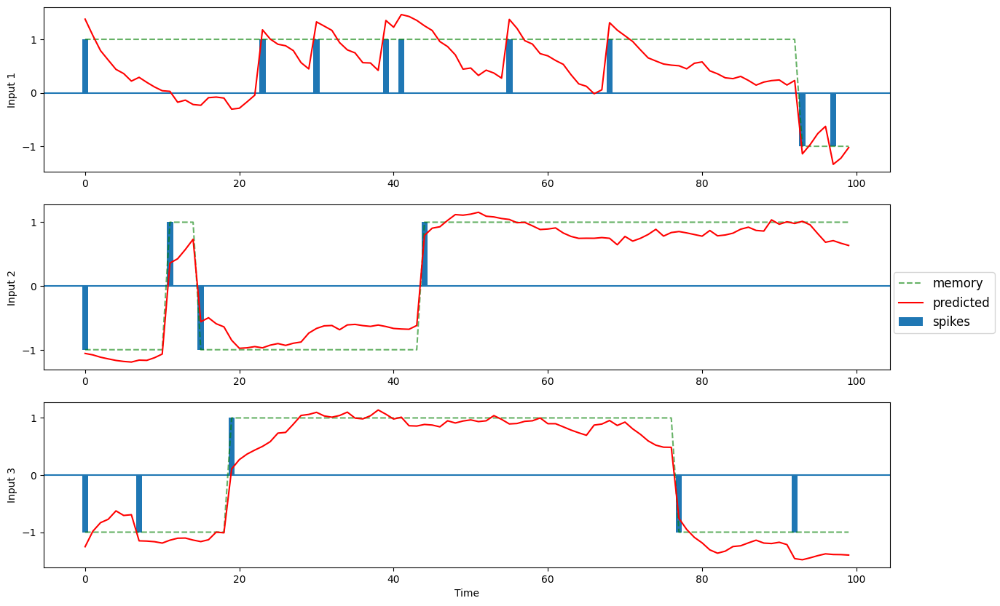

 80%|████████  | 12000/15000 [20:53<05:17,  9.46it/s]

8 /10 --- loss = 0.118498, best = 0.117198


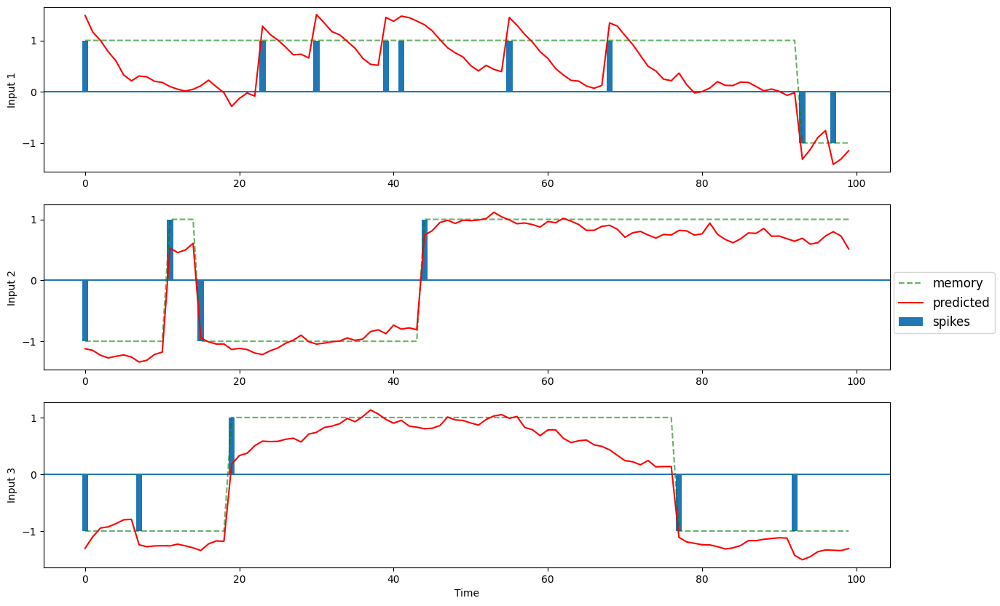

 90%|█████████ | 13500/15000 [23:30<02:43,  9.18it/s]

9 /10 --- loss = 0.115136, best = 0.114128


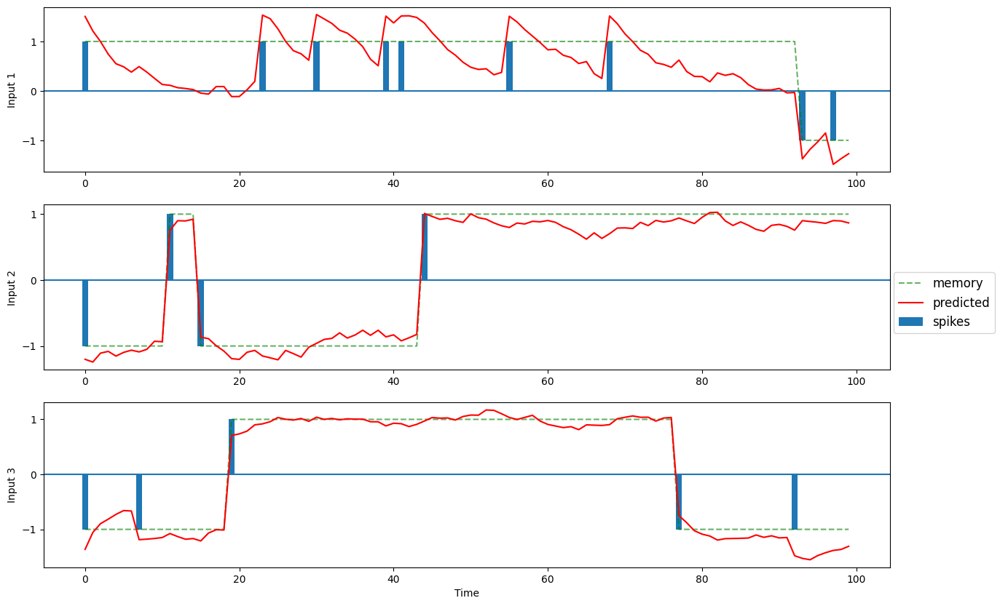

100%|██████████| 15000/15000 [26:06<00:00,  9.57it/s]


Loss:  0.1127094179391861


[tensor(0.9119, device='cuda:0')]

In [ ]:
to_save = f'/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/Three_Way_Rank_3_Mimic_K3_Tanh_TBRNN.pth'
low_rank_procedures.LINT_procedure(tb_rnn,
                                   Low_Rank_Three_Way_RNN_Dynamics,
                                   Inputs,
                                   Targets,
                                   start_rank=3,
                                   ranks=3,
                                   n_steps=15000,
                                   batch_size = 256,
                                   train_size = 256,
                                   lr = 5e-04,
                                   to_save=to_save)

##Low rank validation

In [ ]:
mount_colab()

Mounted at /content/drive


In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

lr_tbrnn = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,3).to(DEVICE)
lr_tbrnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_3_K3_Tanh"))

# MSE loss and Adam optimizer with a learning rate
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_tbrnn.parameters(), lr=1e-03)

# train parameters
n_steps = 3000
n_batch = 1000

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
# losses = lr_tbrnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


In [ ]:
torch.save(lr_tbrnn.state_dict(),f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_3_K3_Tanh")

lrTBRNN to mimic trajectories of another trained lrTBRNN (validation)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)
  0%|          | 0/25000 [00:00<?, ?it/s]

0 /10 --- loss = 0.453522, best = 0.453522


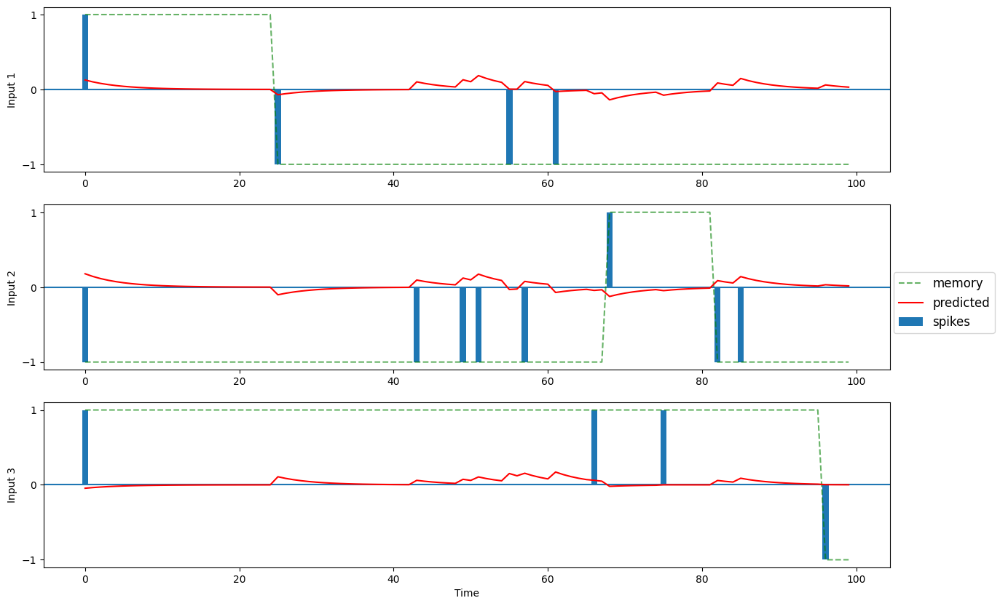

 10%|█         | 2500/25000 [04:49<40:51,  9.18it/s]

1 /10 --- loss = 0.148374, best = 0.148374


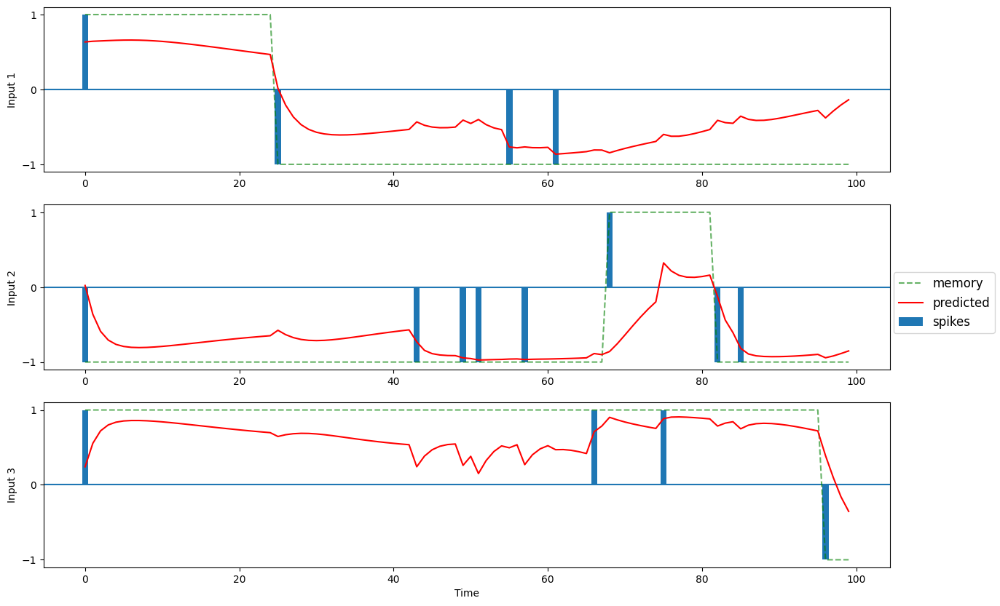

 20%|██        | 5000/25000 [09:33<43:19,  7.69it/s]

2 /10 --- loss = 0.064607, best = 0.064607


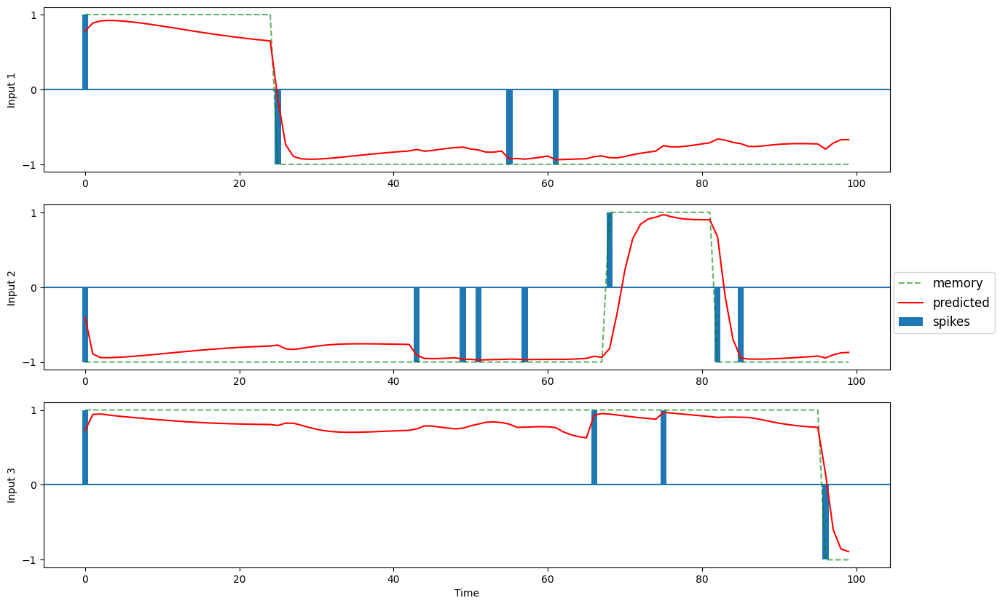

 30%|███       | 7500/25000 [14:30<32:39,  8.93it/s]

3 /10 --- loss = 0.030616, best = 0.029376


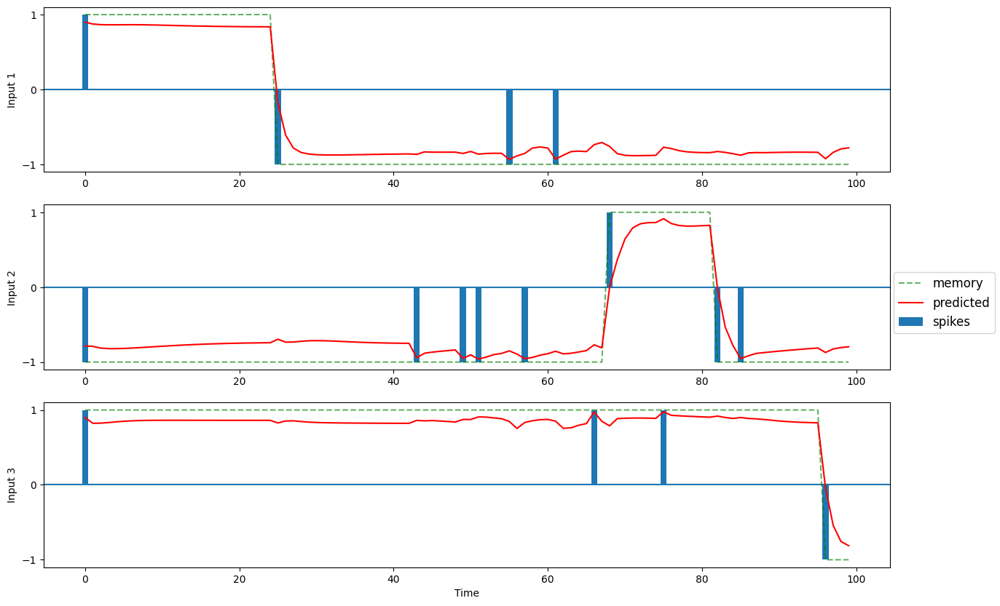

 40%|████      | 10000/25000 [19:24<26:52,  9.30it/s]

4 /10 --- loss = 0.014444, best = 0.014444


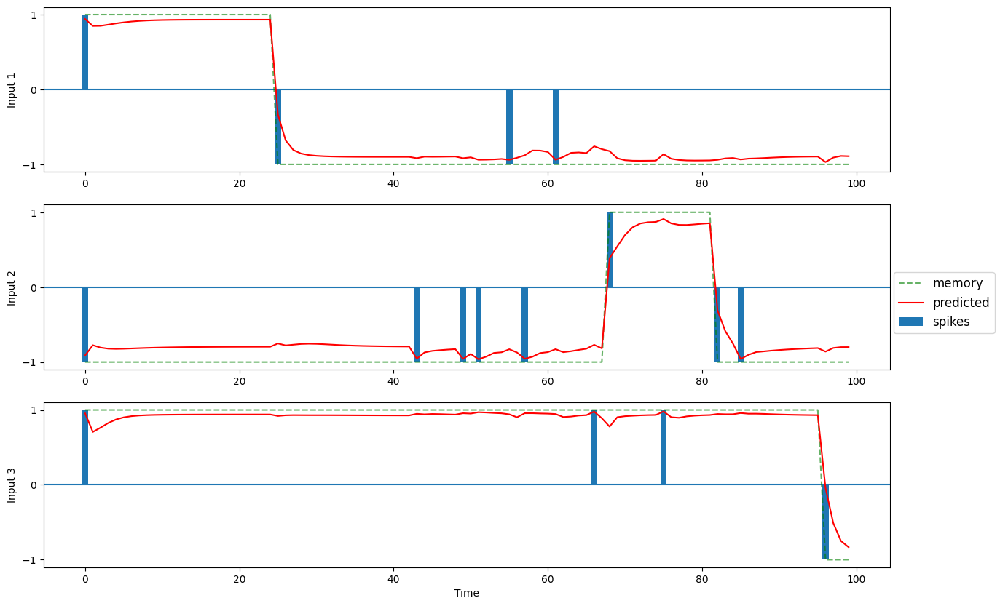

 50%|█████     | 12500/25000 [24:17<22:37,  9.21it/s]

5 /10 --- loss = 0.008802, best = 0.008802


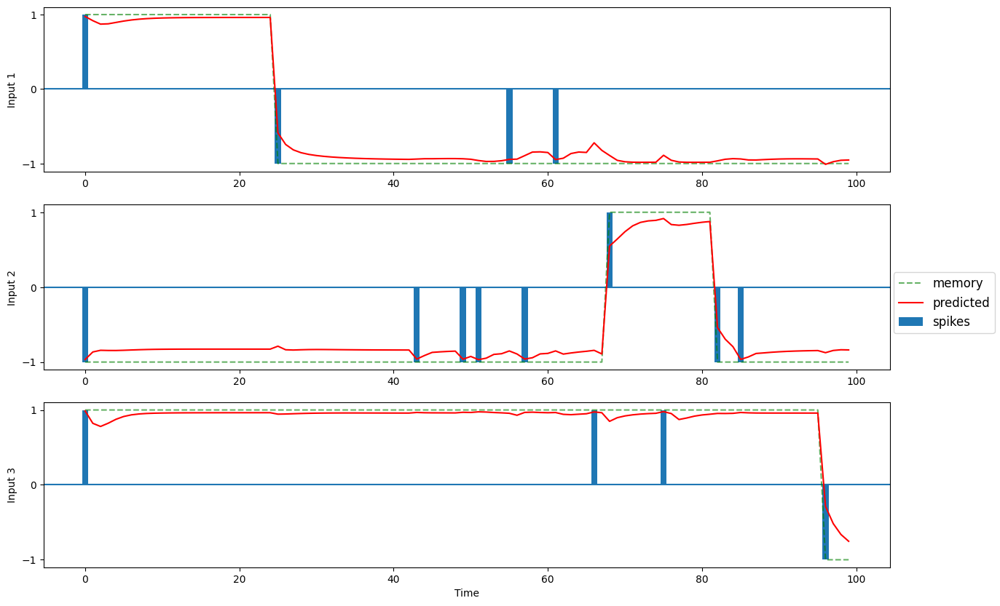

 60%|██████    | 15000/25000 [29:13<18:25,  9.04it/s]

6 /10 --- loss = 0.005606, best = 0.005606


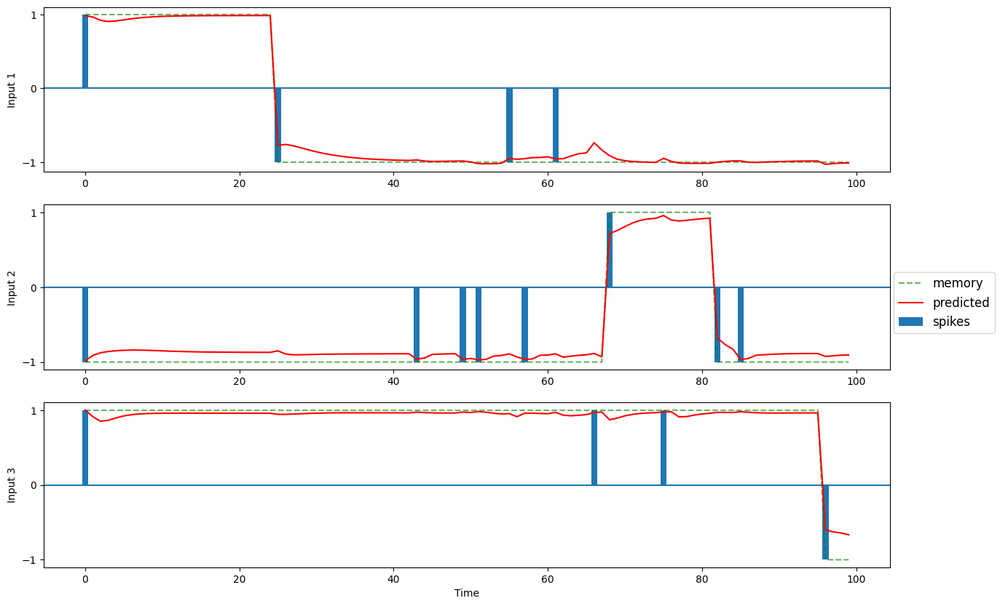

 70%|███████   | 17500/25000 [34:13<13:33,  9.22it/s]

7 /10 --- loss = 0.004403, best = 0.004403


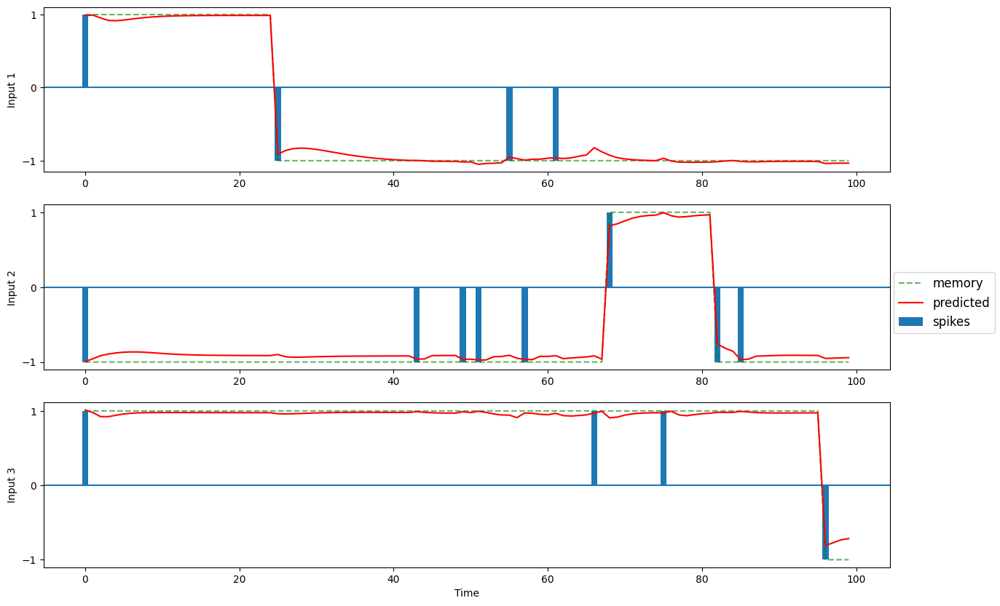

 80%|████████  | 20000/25000 [39:09<09:04,  9.19it/s]

8 /10 --- loss = 0.003921, best = 0.003921


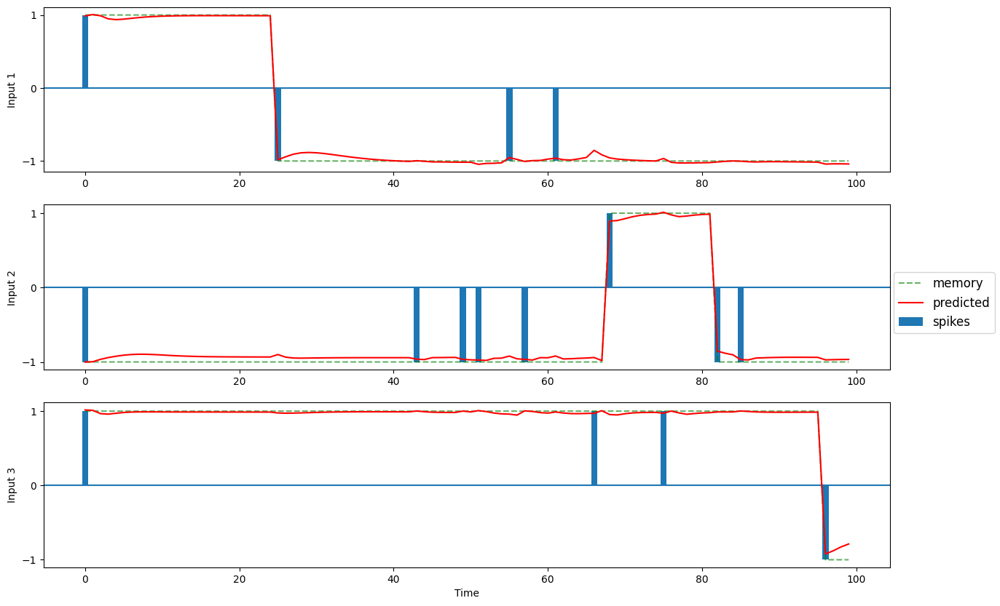

 90%|█████████ | 22500/25000 [44:09<06:43,  6.20it/s]

9 /10 --- loss = 0.003708, best = 0.003708


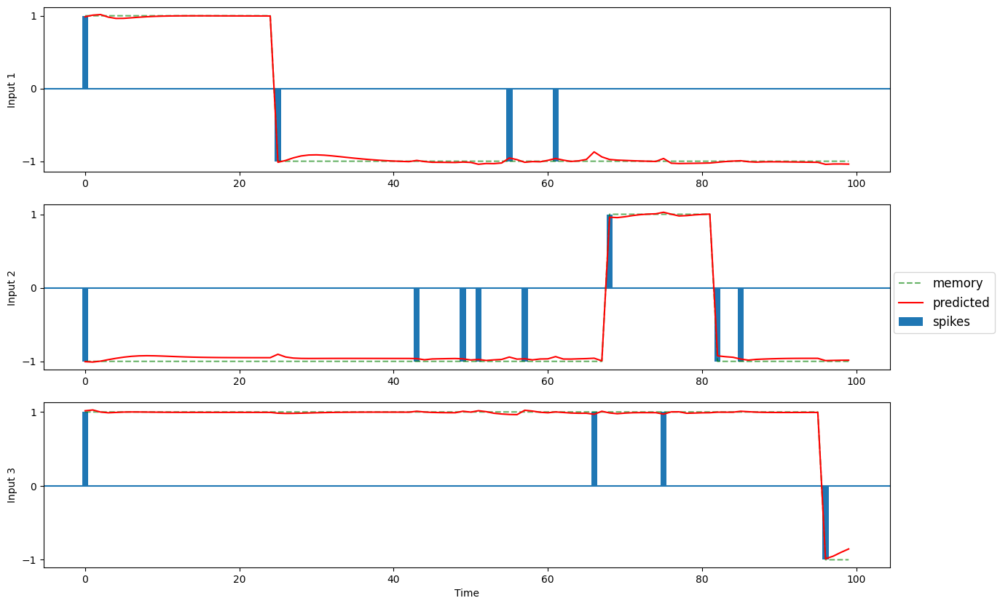

100%|██████████| 25000/25000 [49:05<00:00,  8.49it/s]


Loss:  0.003600330790504813


[tensor(0.9982, device='cuda:0')]

In [ ]:
to_save = f'/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/Three_Way_Rank_3_Mimic_Three_Way_Rank_3_K3_Tanh_TBRNN.pth'
low_rank_procedures.LINT_procedure(lr_tbrnn,
                                   Low_Rank_Three_Way_RNN_Dynamics,
                                   Inputs,
                                   Targets,
                                   start_rank=3,
                                   ranks=3,
                                   n_steps=25000,
                                   batch_size = 512,
                                   train_size = 512,
                                   lr = 1e-03,
                                   to_save=to_save,
                                   noise_std = 0,
                                   tau=0.2)

In [ ]:
# k - flip-flop
K = 3
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

# train parameters
n_steps = 3000
n_batch = 1000

# generate new data
# Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

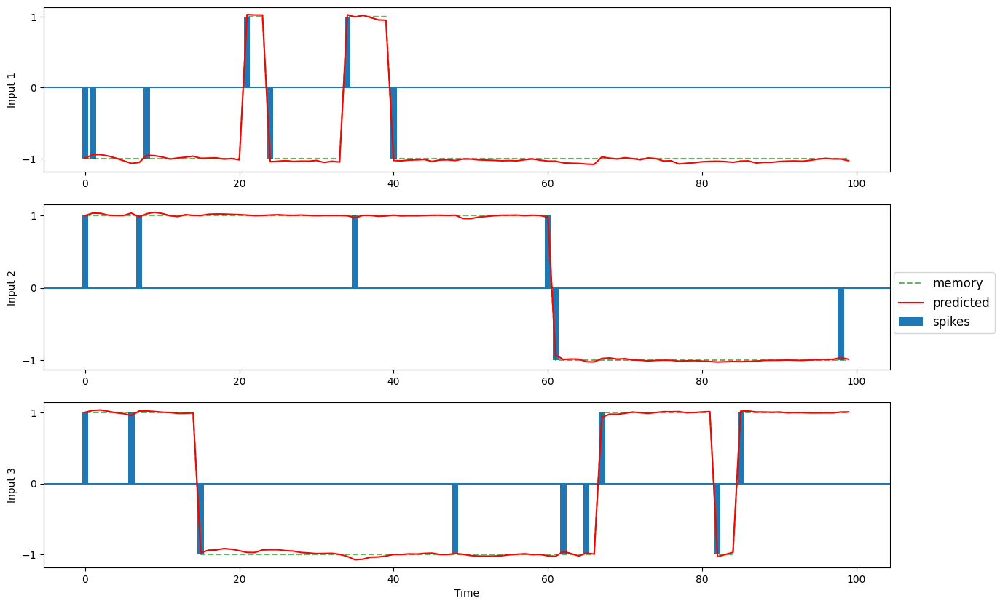

In [ ]:
K_Bit_Flipflop_task.draw_mem_charts(Inputs.cpu(),Targets.cpu(),lr_tbrnn(Inputs,None)[0].cpu(),idx=0,K=K)

In [ ]:
lr_tbrnn = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,3).to(DEVICE)
lr_tbrnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_3_K3_Tanh"))

lr_tbrnn_mimic = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,3).to(DEVICE)
lr_tbrnn_mimic.load_state_dict(torch.load(f'/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/Three_Way_Rank_3_Mimic_Three_Way_Rank_3_K3_Tanh_TBRNN.pth'))

# normalize both tensors
L,M,N = lr_tbrnn.normalize_tensor()
L_mimic,M_mimic,N_mimic = lr_tbrnn_mimic.normalize_tensor()

# # normalize both tensors
# L,M,N = lr_tbrnn.L,lr_tbrnn.M,lr_tbrnn.N
# L_mimic,M_mimic,N_mimic = lr_tbrnn_mimic.L,lr_tbrnn_mimic.M,lr_tbrnn_mimic.N

L,M,N = L.cpu().detach().numpy(),M.cpu().detach().numpy(),N.cpu().detach().numpy()
L_mimic,M_mimic,N_mimic = L_mimic.cpu().detach().numpy(),M_mimic.cpu().detach().numpy(),N_mimic.cpu().detach().numpy()

# compute the tensor W from L,M,N
W = utils.lr_to_tensor_W(L,M,N)
W_mimic = utils.lr_to_tensor_W(L_mimic,M_mimic,N_mimic)

# Check correlation without projection
corr = utils.corrvecs(W.ravel(), W_mimic.ravel())

In [ ]:
I = lr_tbrnn.input_fc.weight.cpu().detach().numpy()
I_mimic = lr_tbrnn_mimic.input_fc.weight.cpu().detach().numpy()

LI = np.concatenate((L,I),axis=1).T
LI_mimic = np.concatenate((L_mimic,I_mimic),axis=1).T

In [ ]:
Mp = np.stack(utils.project(M.T,LI)).T
Np = np.stack(utils.project(N.T,LI)).T
Mp_mimic = np.stack(utils.project(M_mimic.T,LI_mimic)).T
Np_mimic = np.stack(utils.project(N_mimic.T,LI_mimic)).T

W_eff = utils.lr_to_tensor_W(L,Mp,Np)
W_eff_mimic = utils.lr_to_tensor_W(L_mimic,Mp_mimic,Np_mimic)

corr_eff = utils.corrvecs(W_eff.ravel(), W_eff_mimic.ravel())

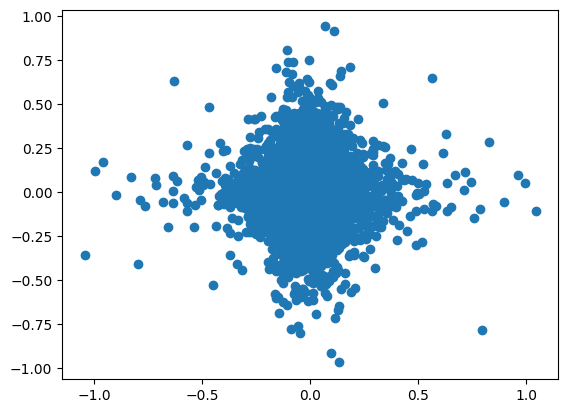

In [ ]:
plt.scatter(W.ravel(), W_mimic.ravel())

##Validate rank 1 TBRNN

###Train rank1 lrTBRNN

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)
  0%|          | 0/9000 [00:00<?, ?it/s]

0 /10 --- loss = 1.018385, best = 1.018385


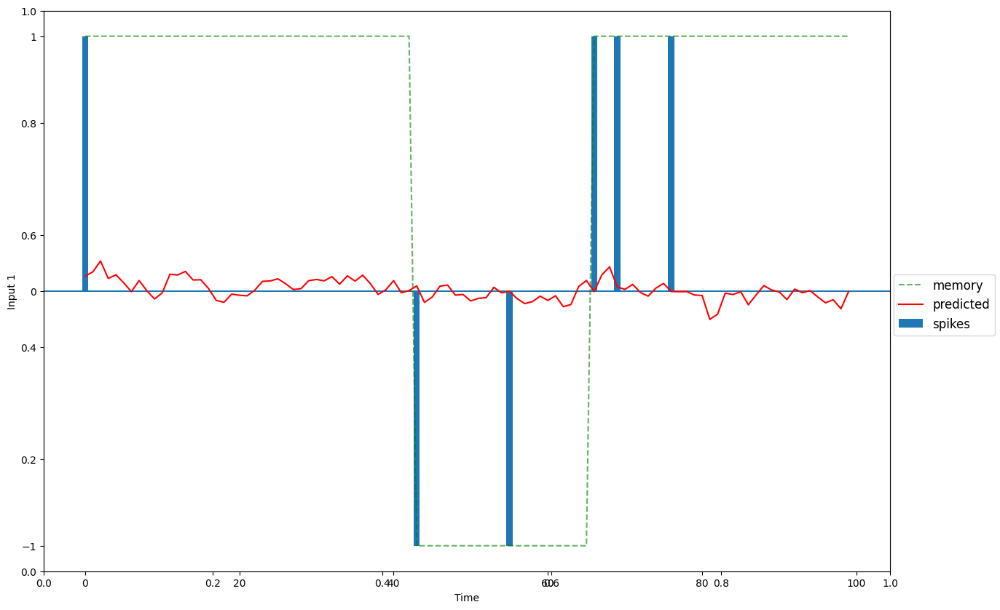

 10%|█         | 900/9000 [01:42<15:10,  8.90it/s]

1 /10 --- loss = 0.462455, best = 0.457142


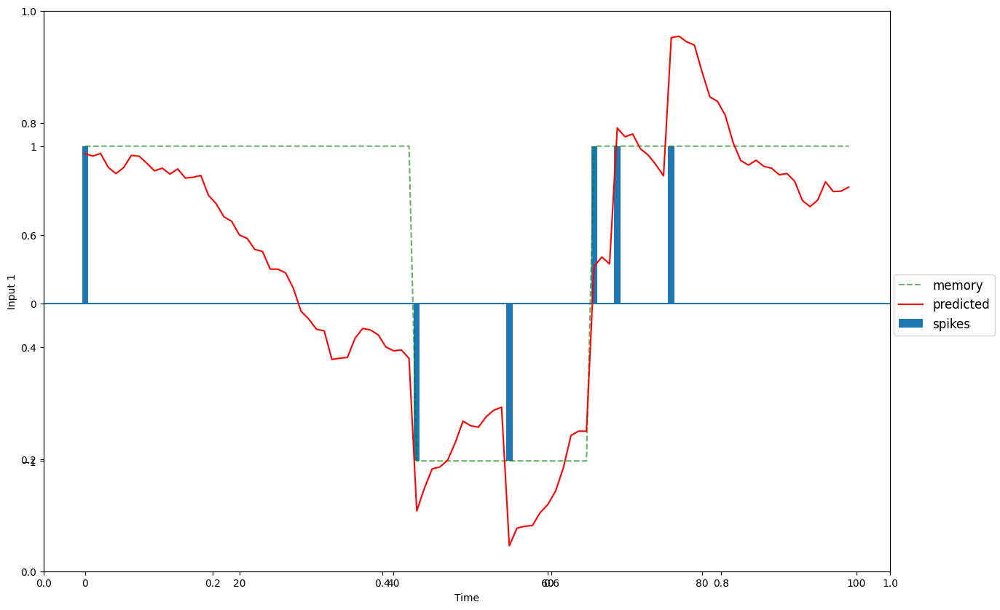

 20%|██        | 1800/9000 [03:23<13:51,  8.66it/s]

2 /10 --- loss = 0.388797, best = 0.384485


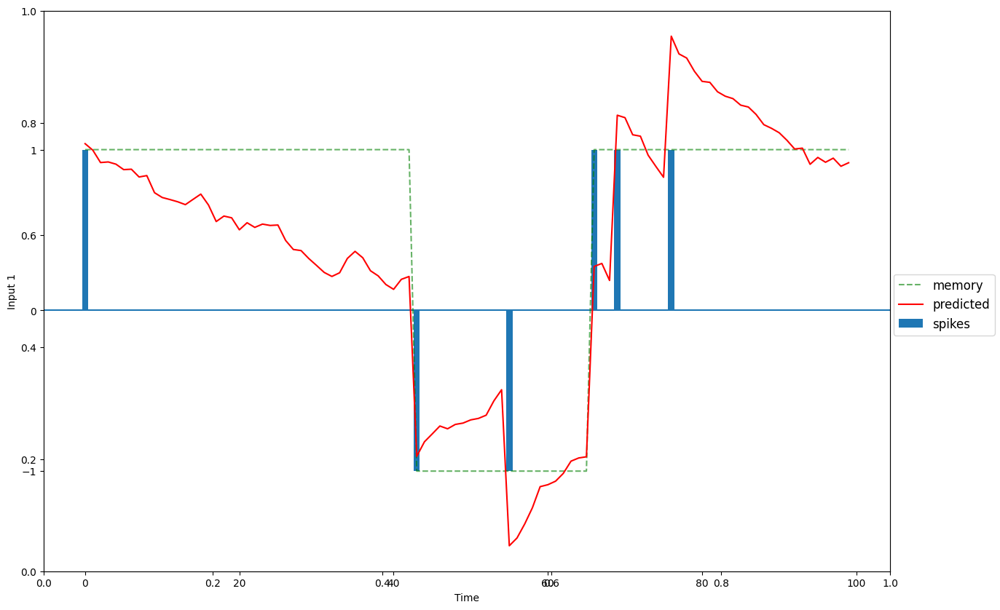

 30%|███       | 2700/9000 [05:06<11:57,  8.78it/s]

3 /10 --- loss = 0.239808, best = 0.235399


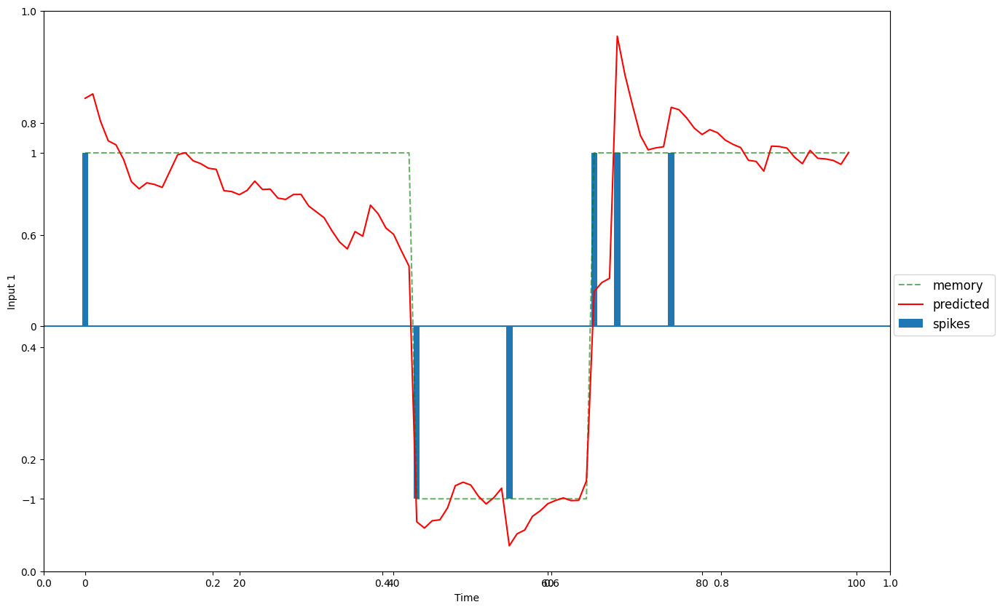

 40%|████      | 3600/9000 [06:48<10:17,  8.75it/s]

4 /10 --- loss = 0.167992, best = 0.161789


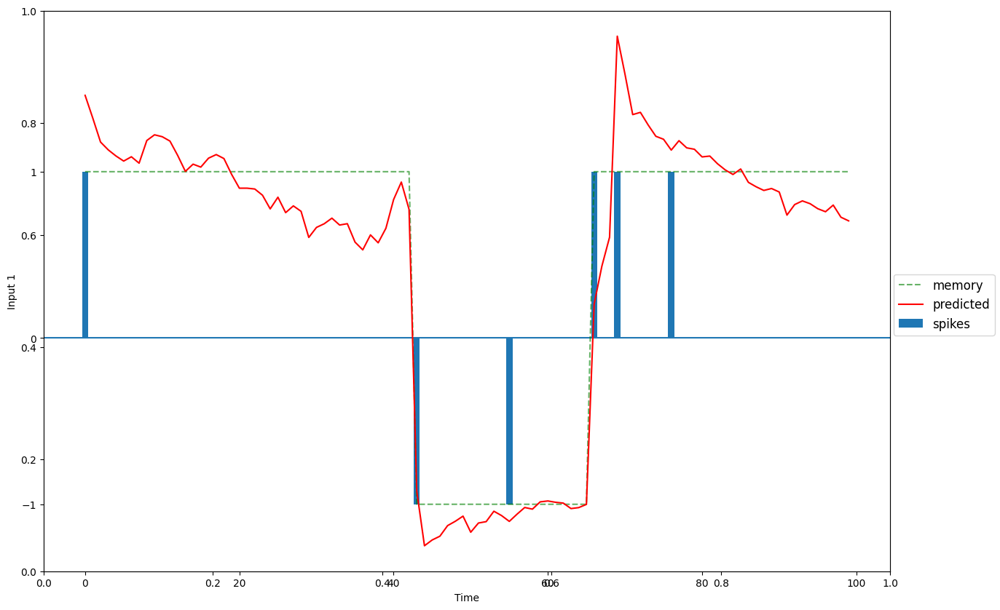

 50%|█████     | 4500/9000 [08:30<08:11,  9.15it/s]

5 /10 --- loss = 0.134811, best = 0.122424


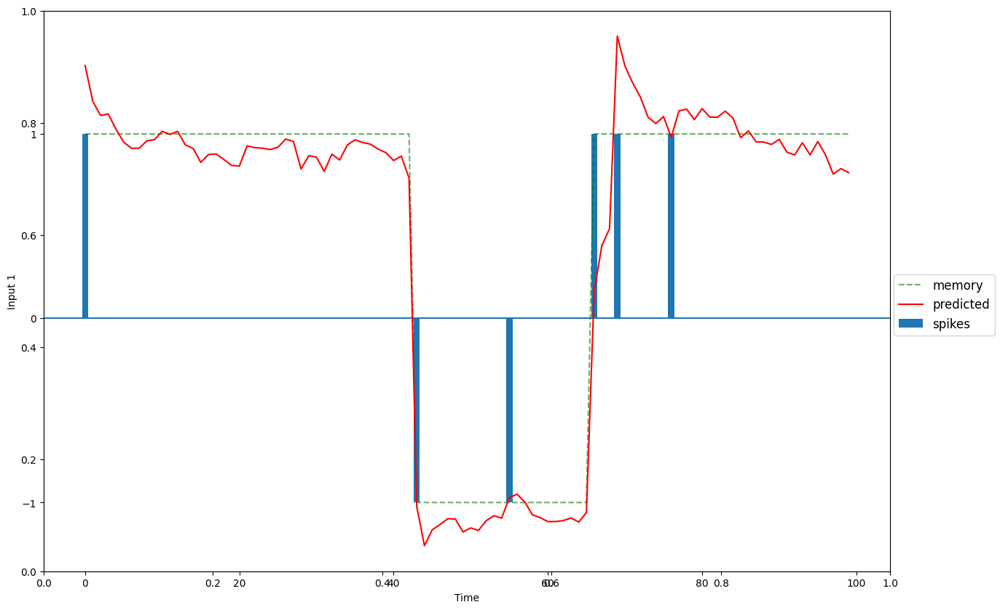

 60%|██████    | 5400/9000 [10:13<06:43,  8.92it/s]

6 /10 --- loss = 0.109175, best = 0.101409


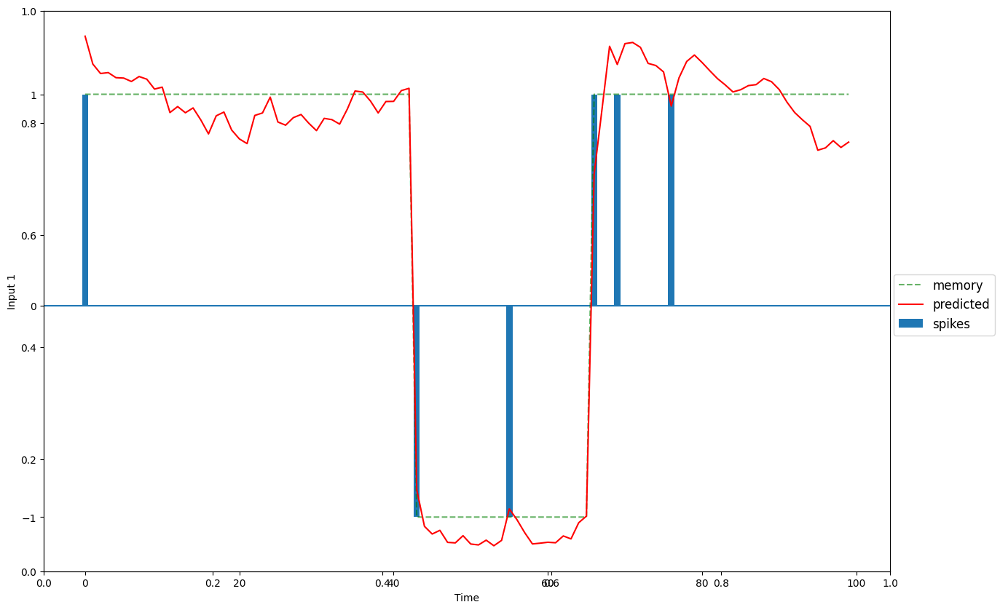

 70%|███████   | 6300/9000 [11:55<05:02,  8.92it/s]

7 /10 --- loss = 0.072836, best = 0.070471


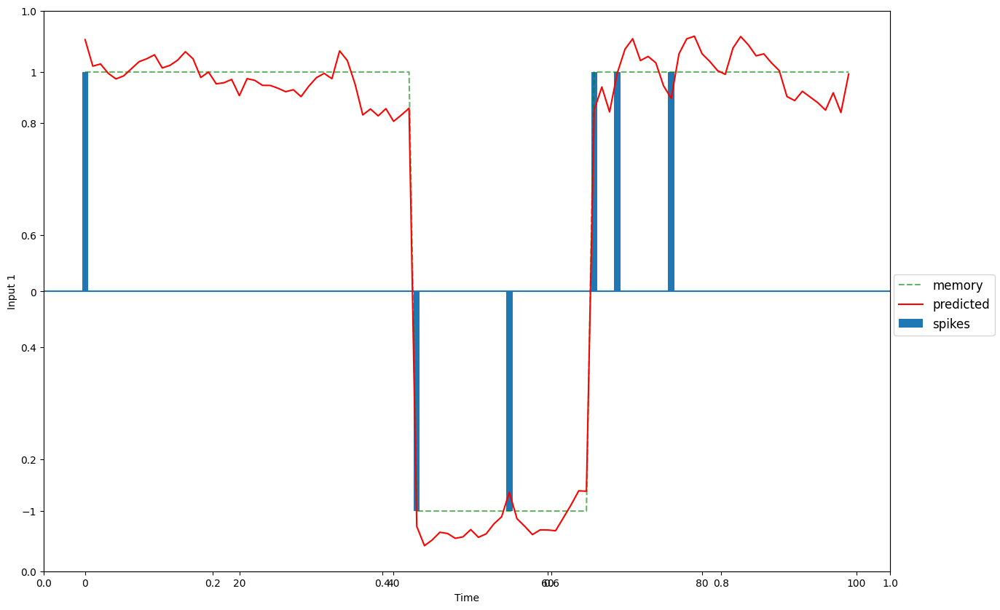

 80%|████████  | 7200/9000 [13:37<03:16,  9.14it/s]

8 /10 --- loss = 0.018157, best = 0.016512


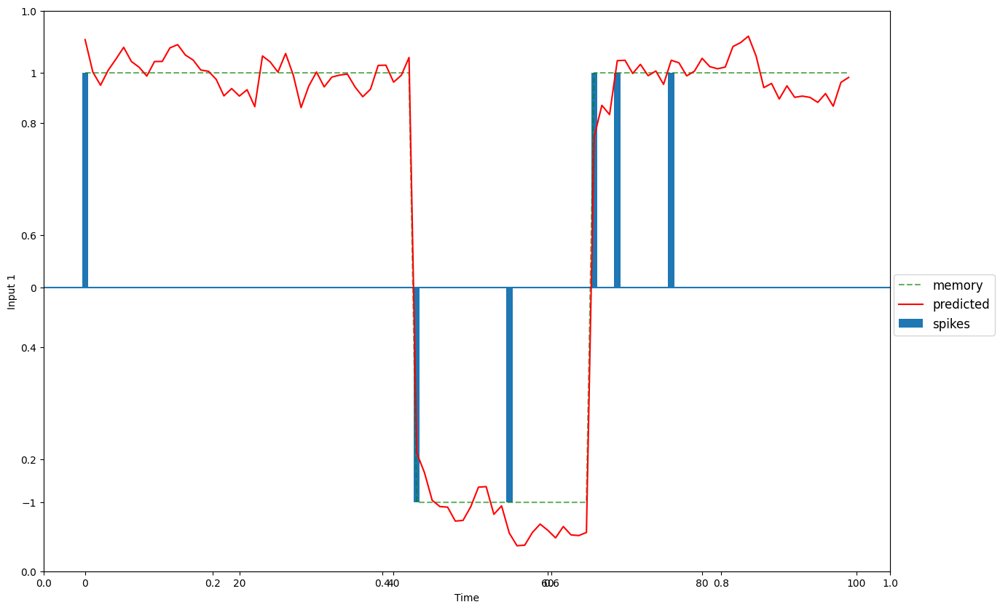

 90%|█████████ | 8100/9000 [15:19<01:43,  8.69it/s]

9 /10 --- loss = 0.006369, best = 0.006249


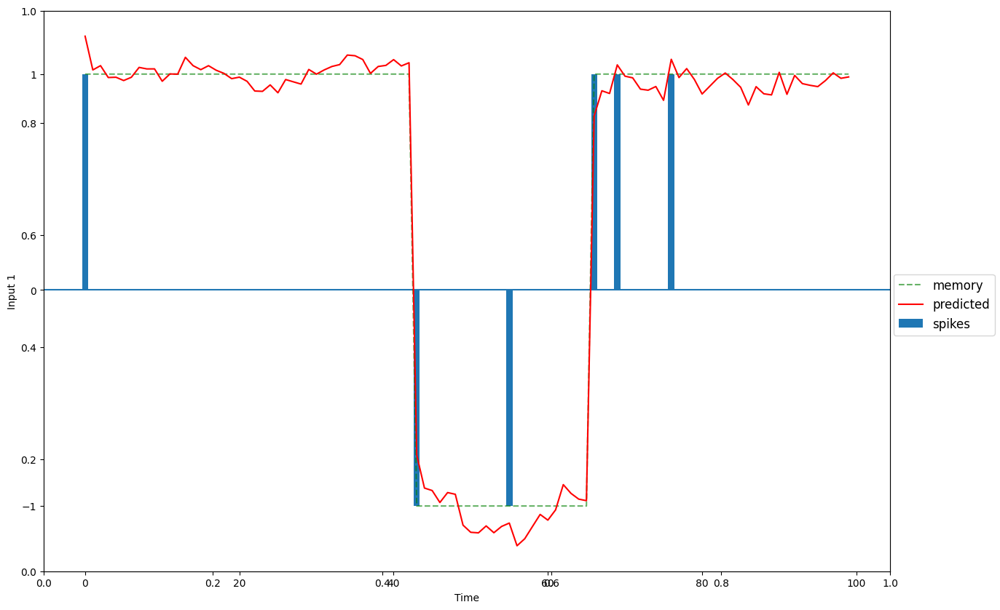

100%|██████████| 9000/9000 [17:01<00:00,  8.81it/s]

Loss:  0.004720711149275303


In [ ]:
# k - flip-flop
K = 1
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

lr_tbrnn = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,K).to(DEVICE)
lr_tbrnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_1_K1_Tanh"))

# MSE loss and Adam optimizer with a learning rate
lr=1e-03
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_tbrnn.parameters(), lr=lr)

# train parameters
n_steps = 9000
n_batch = 512

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
# losses = lr_tbrnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)
  0%|          | 0/3000 [00:00<?, ?it/s]

0 /10 --- loss = 0.005971, best = 0.005971


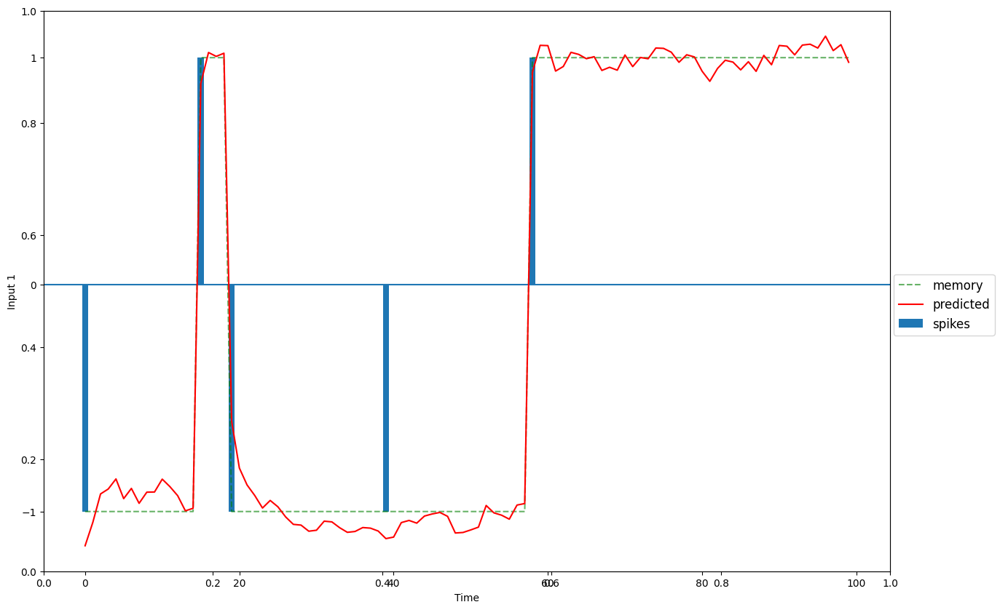

 10%|█         | 300/3000 [00:38<05:41,  7.90it/s]

1 /10 --- loss = 0.005278, best = 0.005070


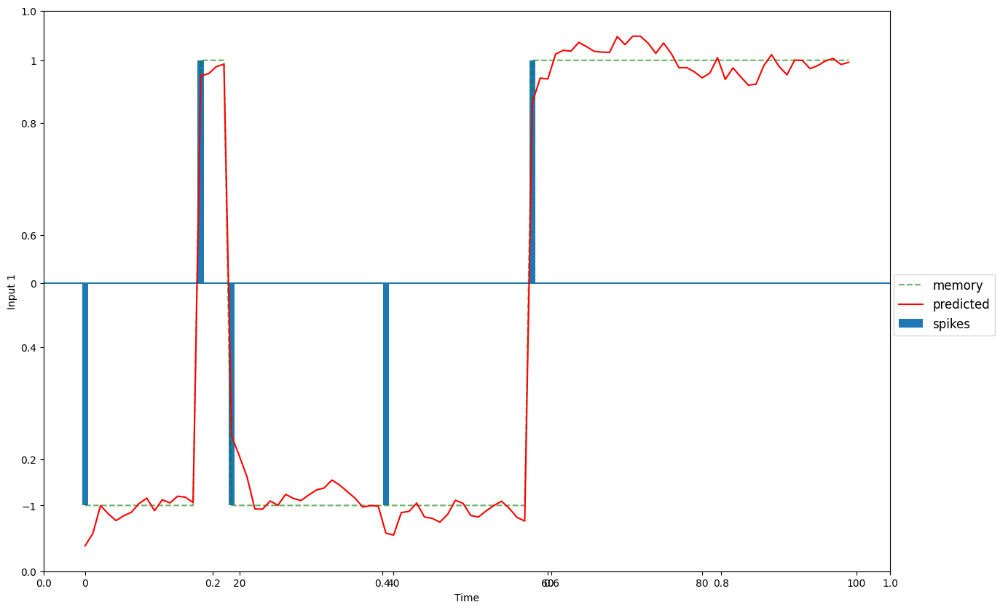

 20%|██        | 600/3000 [01:15<04:53,  8.18it/s]

2 /10 --- loss = 0.005038, best = 0.004892


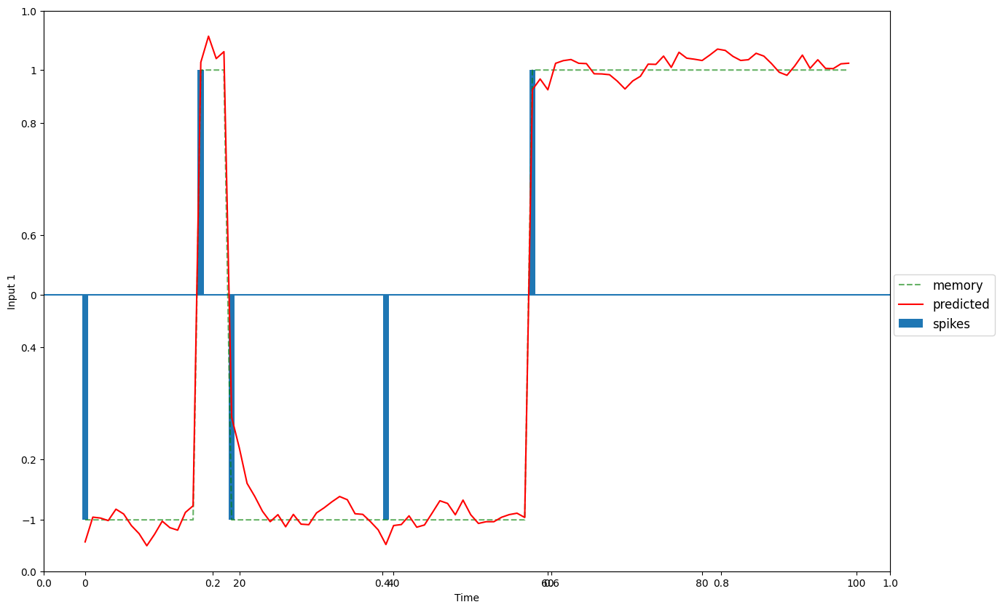

 30%|███       | 900/3000 [01:52<04:14,  8.26it/s]

3 /10 --- loss = 0.004944, best = 0.004853


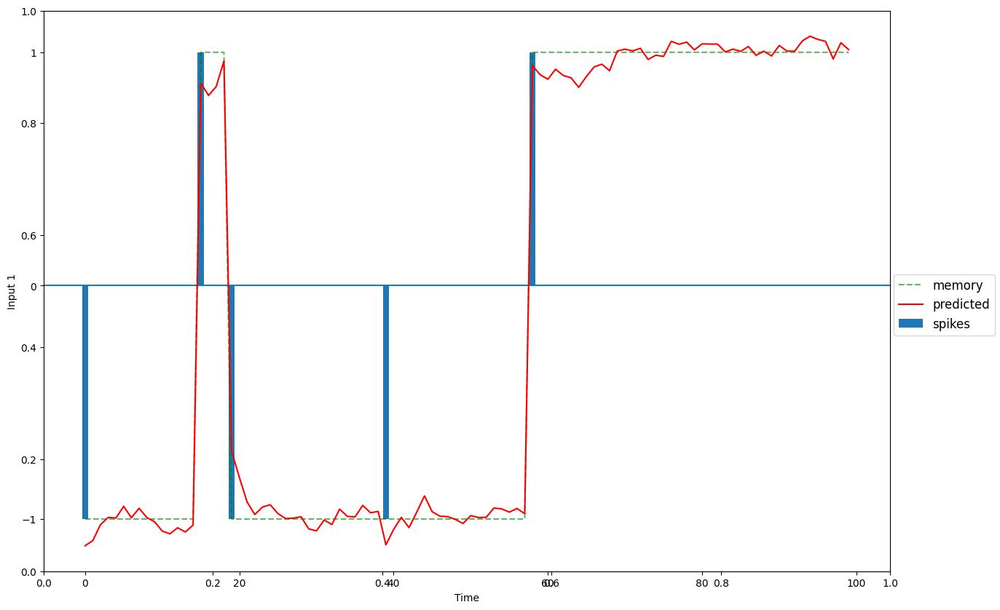

 40%|████      | 1200/3000 [02:29<03:34,  8.38it/s]

4 /10 --- loss = 0.004853, best = 0.004742


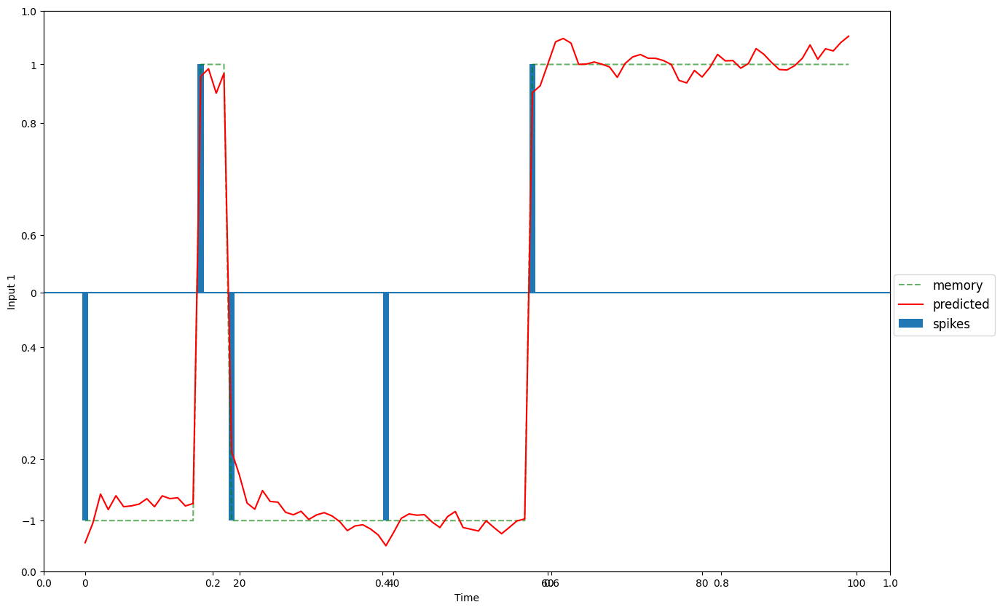

 50%|█████     | 1500/3000 [03:07<03:07,  8.00it/s]

5 /10 --- loss = 0.004744, best = 0.004577


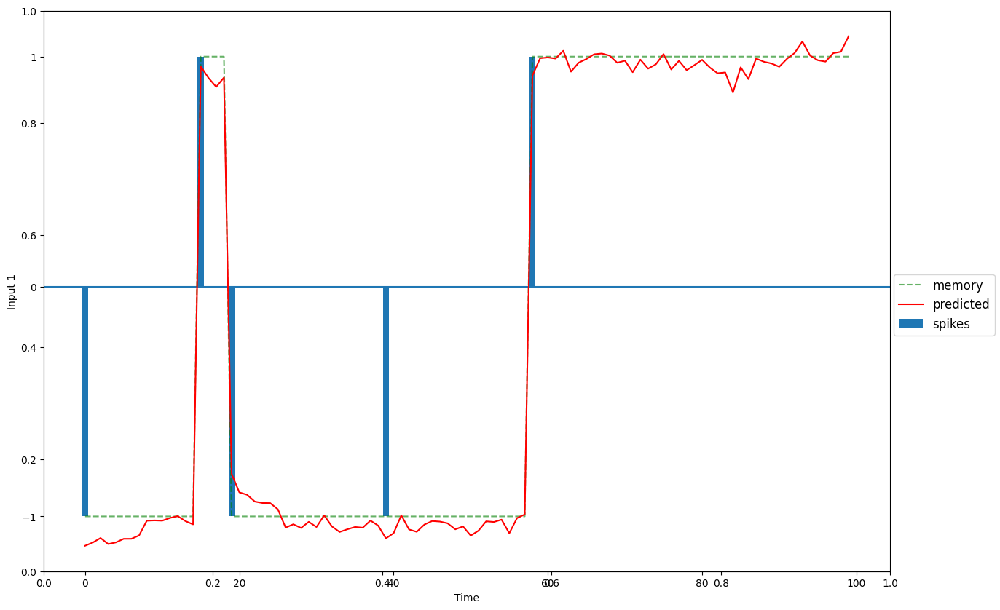

 60%|██████    | 1800/3000 [03:45<02:29,  8.02it/s]

6 /10 --- loss = 0.004660, best = 0.004568


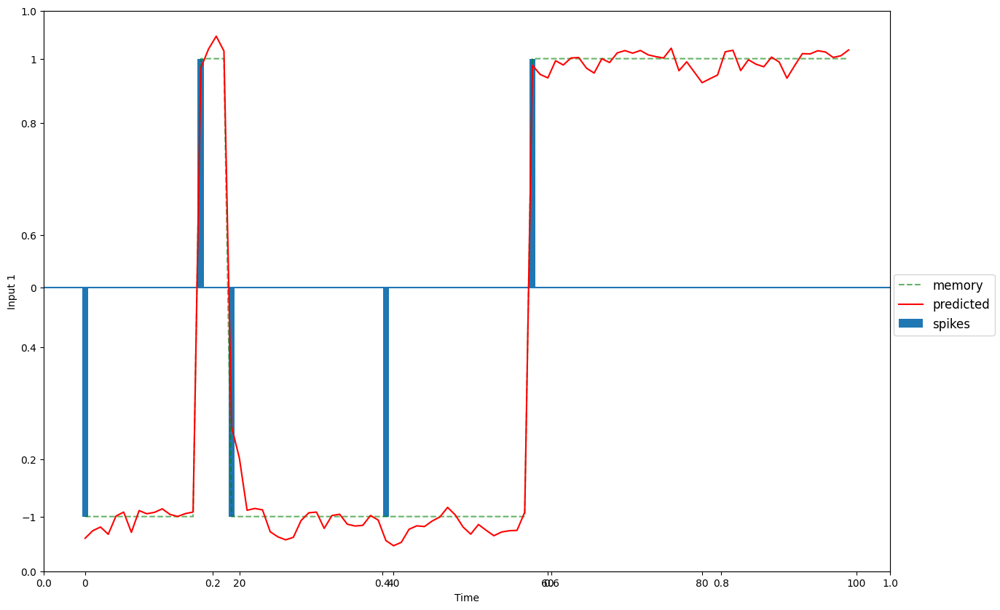

 70%|███████   | 2100/3000 [04:22<01:53,  7.93it/s]

7 /10 --- loss = 0.004563, best = 0.004513


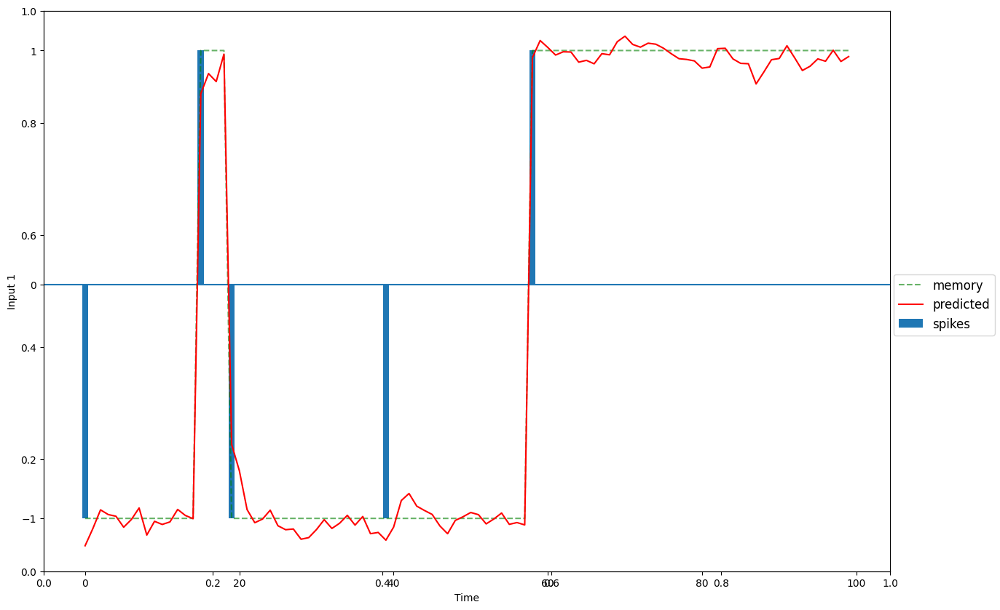

 80%|████████  | 2400/3000 [05:00<01:14,  8.07it/s]

8 /10 --- loss = 0.004573, best = 0.004428


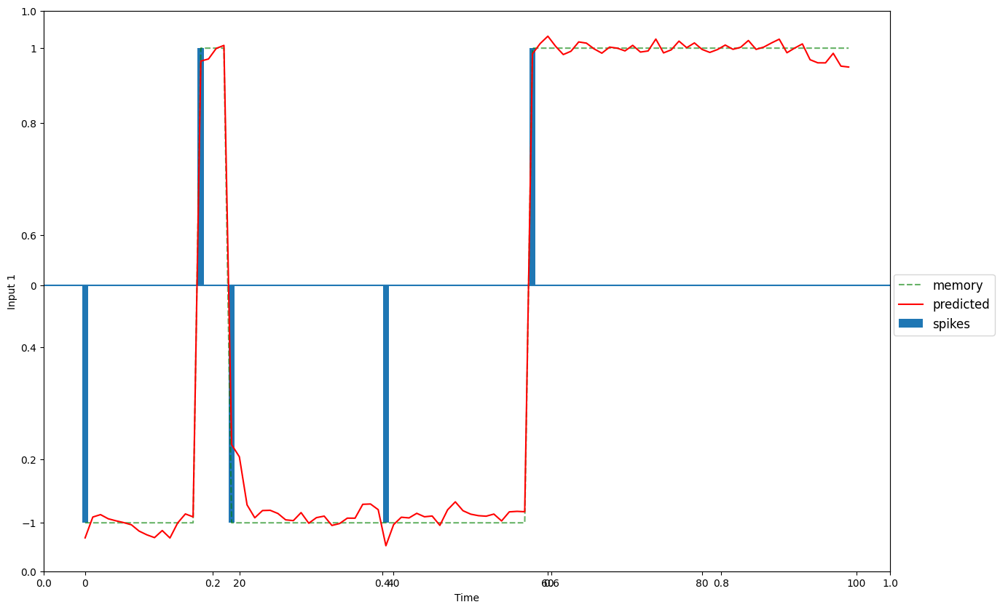

 90%|█████████ | 2700/3000 [05:38<00:37,  8.04it/s]

9 /10 --- loss = 0.004466, best = 0.004338


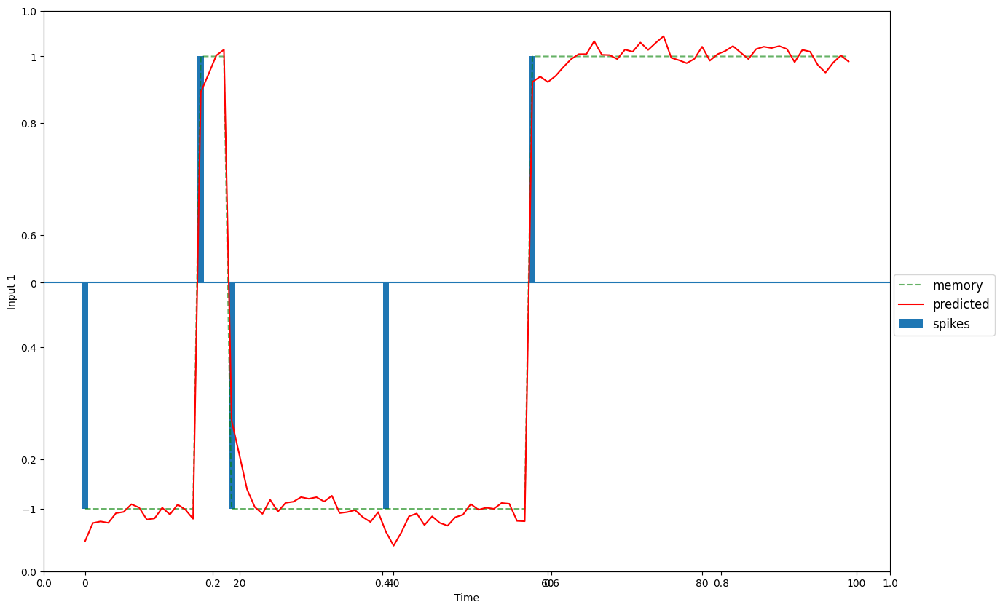

100%|██████████| 3000/3000 [06:16<00:00,  7.97it/s]

Loss:  0.004412710666656494


In [ ]:
# k - flip-flop
K = 1
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

lr_tbrnn = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,K).to(DEVICE)
lr_tbrnn.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_1_K1_Tanh_withReg"))

# MSE loss and Adam optimizer with a learning rate
lr=5e-04
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_tbrnn.parameters(), lr=lr)

# train parameters
n_steps = 3000
n_batch = 512

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
losses = lr_tbrnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T,reg=True)

In [ ]:
def correlation_regulation(V1,V2):
    if (V1==0).all() or (V2==0).all():
      return 0
    corr_matrix = (V1.t() @ V2).abs() / (V1.norm(dim=0,keepdim=True).t() @ V2.norm(dim=0,keepdim=True))
    return corr_matrix.mean()



In [ ]:
lr_tbrnn.evaluate(Inputs,Targets)

tensor(1., device='cuda:0')

In [ ]:
n_batch = 1
T=1000
K=1

nInputs, nTargets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
L = lr_tbrnn.L
_,_,traj = lr_tbrnn(nInputs,None)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


In [ ]:
kappa = (traj @ L)[:,:,0] / (L.norm()**2)

In [ ]:
tau = 0.2
kappaI = np.zeros((n_batch,T))
kappaI[:,0] = nInputs[:,0,0].cpu().detach().numpy()
for t in range(1,T):
  kappaI[:,t] = kappaI[:,t-1] + tau * (-kappaI[:,t-1] + nInputs[:,t,0].cpu().detach().numpy())

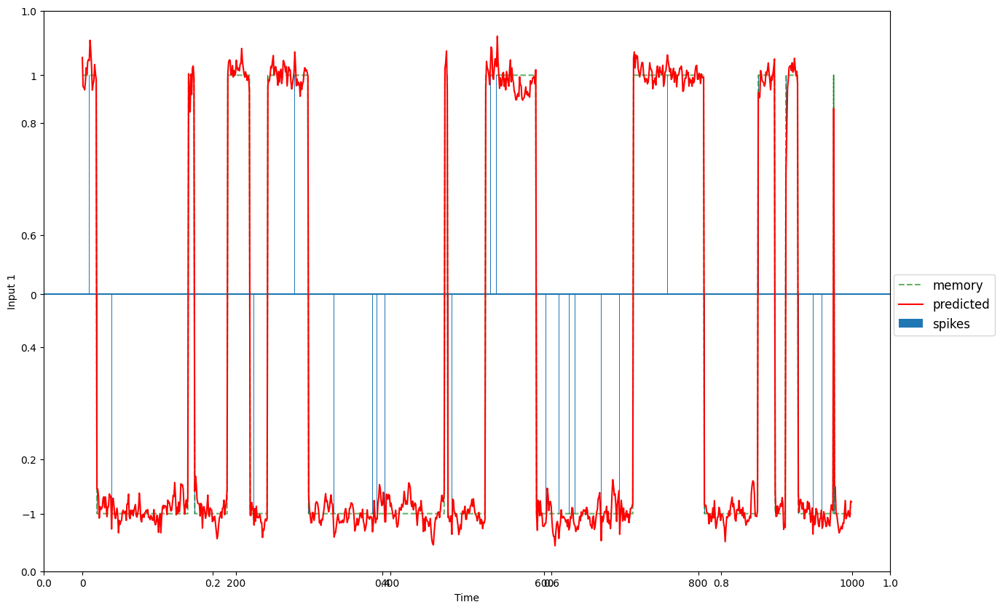

In [ ]:
K_Bit_Flipflop_task.draw_mem_charts(nInputs.cpu(),nTargets.cpu(),lr_tbrnn(nInputs,None)[0].cpu(),0,K,T)

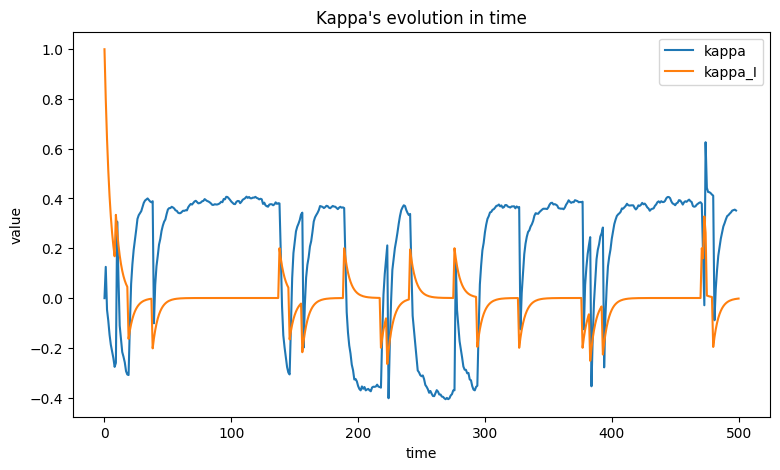

In [ ]:
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(111)
ax.plot(kappa[0][1:500].cpu().detach().numpy(),label="kappa")
ax.plot(kappaI[0][:501],label="kappa_I")
_=ax.legend()
_=ax.set_xlabel("time")
_=ax.set_ylabel("value")
_=ax.set_title("Kappa's evolution in time")
_=plt.show()

###Train rank 1 lrTBRNN mimic rank 1 TBRNN traj

In [ ]:
mount_colab()

Mounted at /content/drive


In [ ]:
# k - flip-flop
K = 1
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

lr_tbrnn1 = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,K).to(DEVICE)
lr_tbrnn1.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_1_K1_Tanh_withReg"))

lr_tbrnn2 = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,K,noise_std = 0).to(DEVICE)
lr_tbrnn2.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_1_mimic_TBRNN_Rank_1_K1_Tanh_withReg"))

# MSE loss and Adam optimizer with a learning rate
lr=1e-03
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_tbrnn1.parameters(), lr=lr)

# train parameters
n_steps = 3000
n_batch = 512

# generate new data
# Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
# losses = lr_tbrnn1.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T,reg=True)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)
  0%|          | 0/3000 [00:00<?, ?it/s]

0 /10 --- loss = 0.008365,reg = 0.000783 best = 0.008365


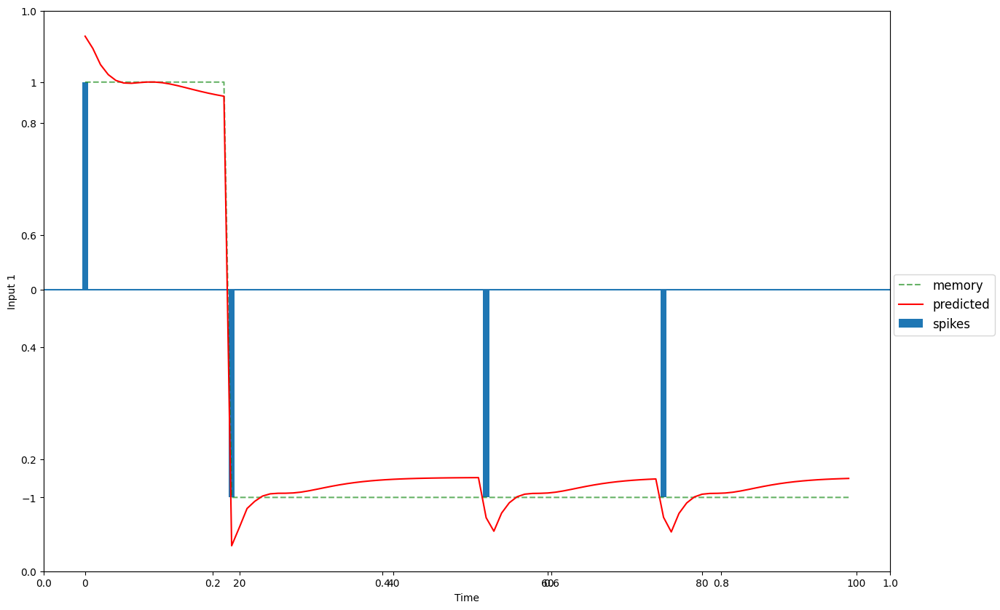

 10%|█         | 300/3000 [00:33<04:54,  9.18it/s]

1 /10 --- loss = 0.008223,reg = 0.000165 best = 0.008218


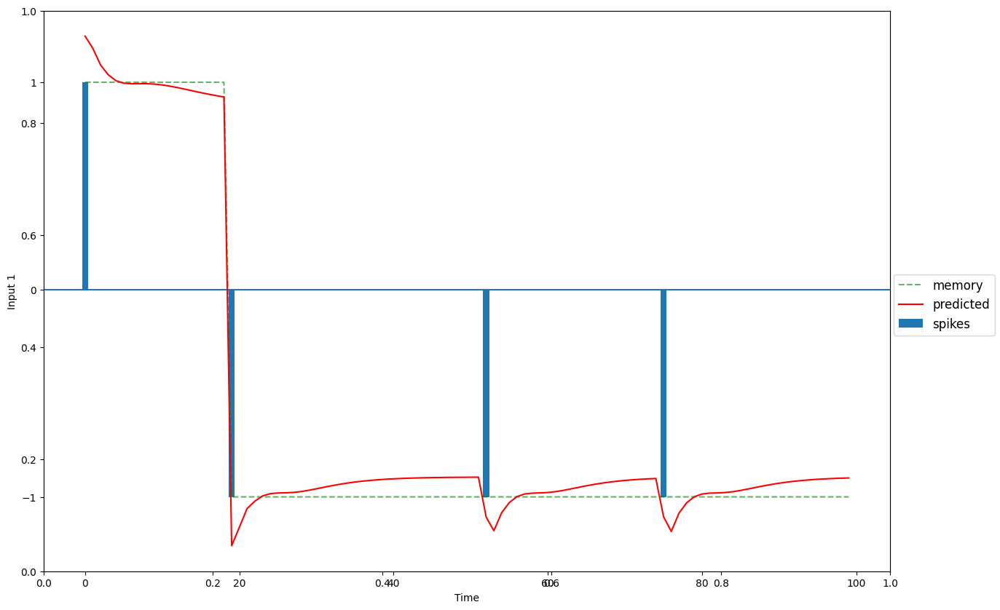

 20%|██        | 600/3000 [01:07<04:27,  8.96it/s]

2 /10 --- loss = 0.008127,reg = 0.000126 best = 0.008124


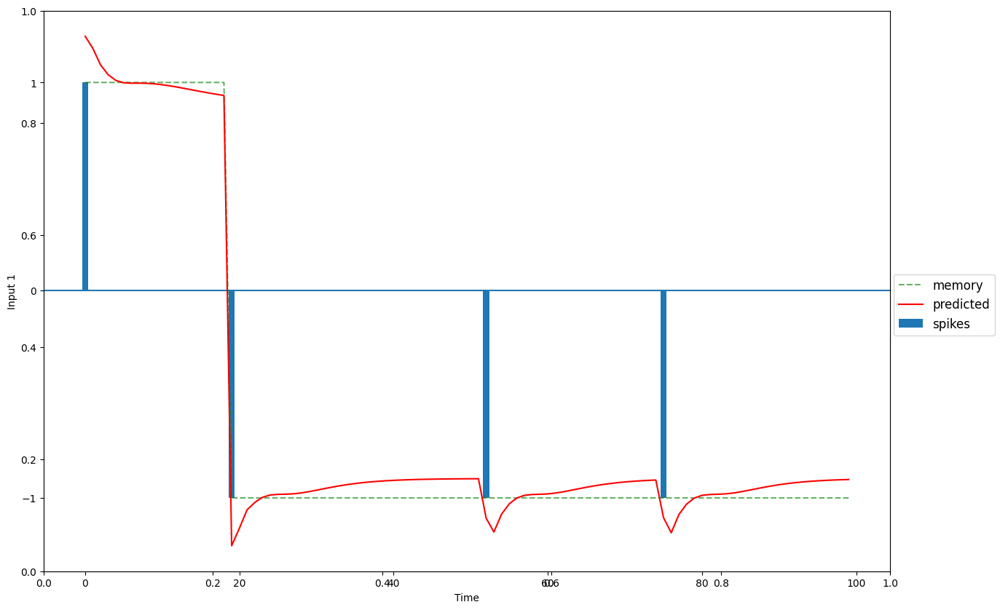

 30%|███       | 900/3000 [01:40<04:01,  8.71it/s]

3 /10 --- loss = 0.008044,reg = 0.000116 best = 0.008044


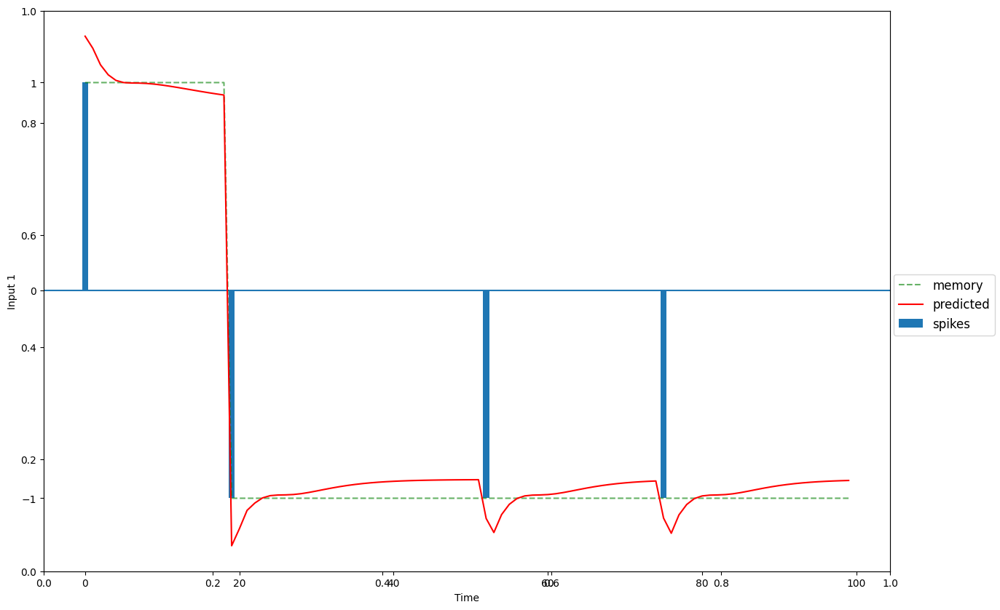

 40%|████      | 1200/3000 [02:14<03:21,  8.94it/s]

4 /10 --- loss = 0.007977,reg = 0.000119 best = 0.007973


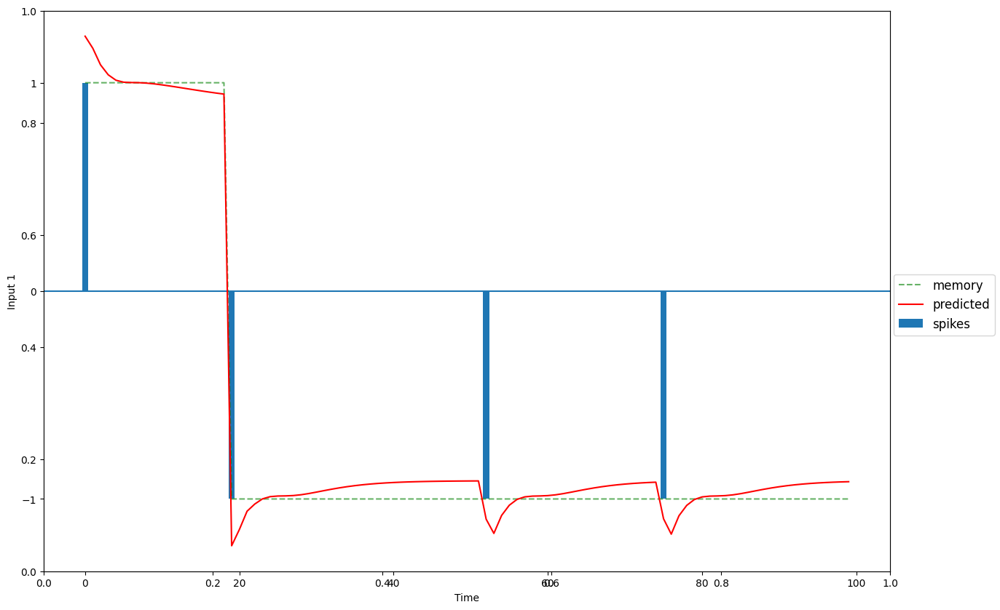

 50%|█████     | 1500/3000 [02:48<02:46,  9.01it/s]

5 /10 --- loss = 0.007911,reg = 0.000102 best = 0.007909


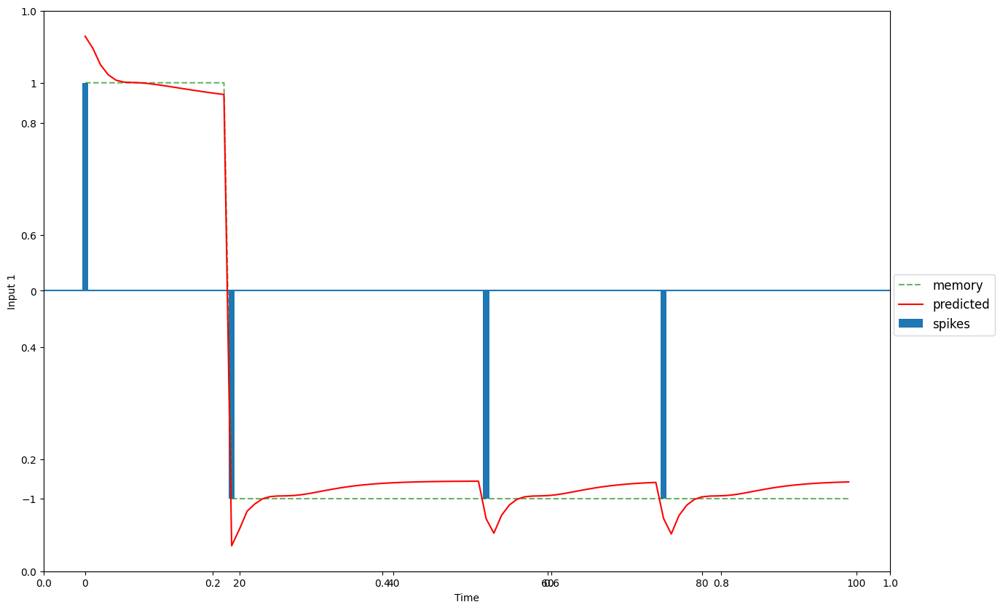

 60%|██████    | 1800/3000 [03:22<02:14,  8.92it/s]

6 /10 --- loss = 0.007850,reg = 0.000017 best = 0.007849


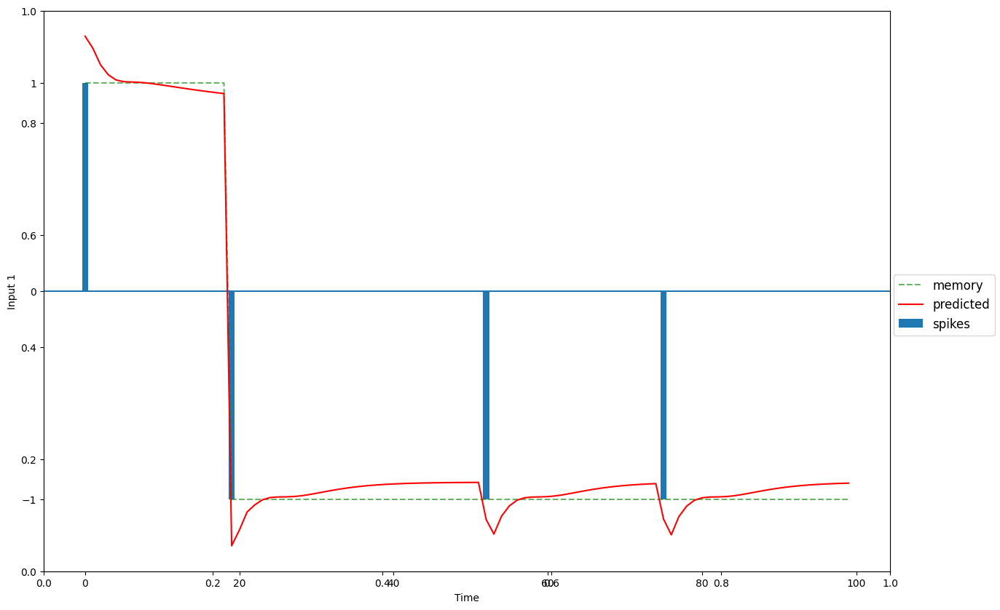

 70%|███████   | 2100/3000 [03:56<01:39,  9.09it/s]

7 /10 --- loss = 0.007794,reg = 0.000018 best = 0.007794


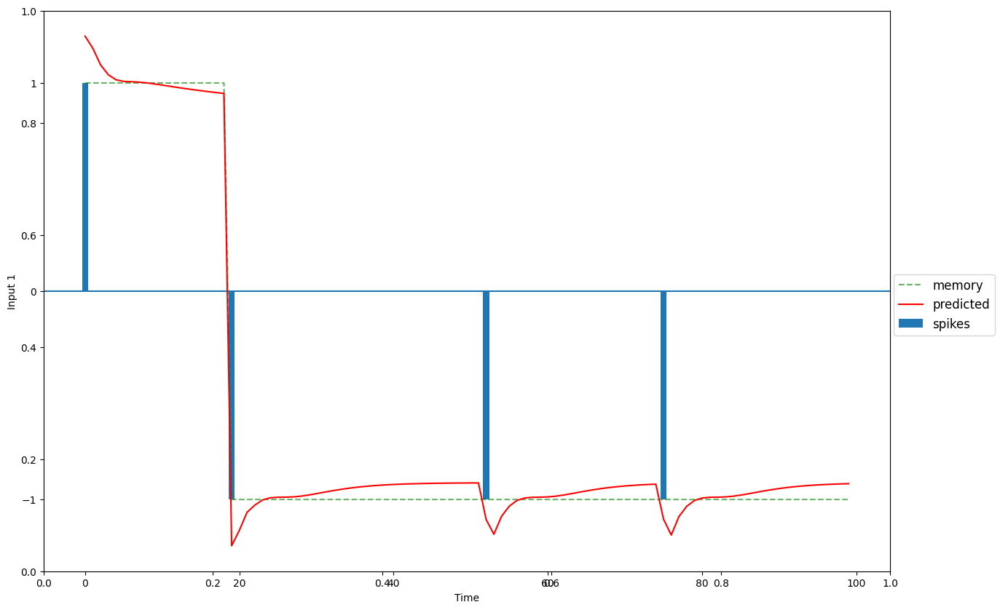

 80%|████████  | 2400/3000 [04:30<01:07,  8.91it/s]

8 /10 --- loss = 0.007742,reg = 0.000220 best = 0.007742


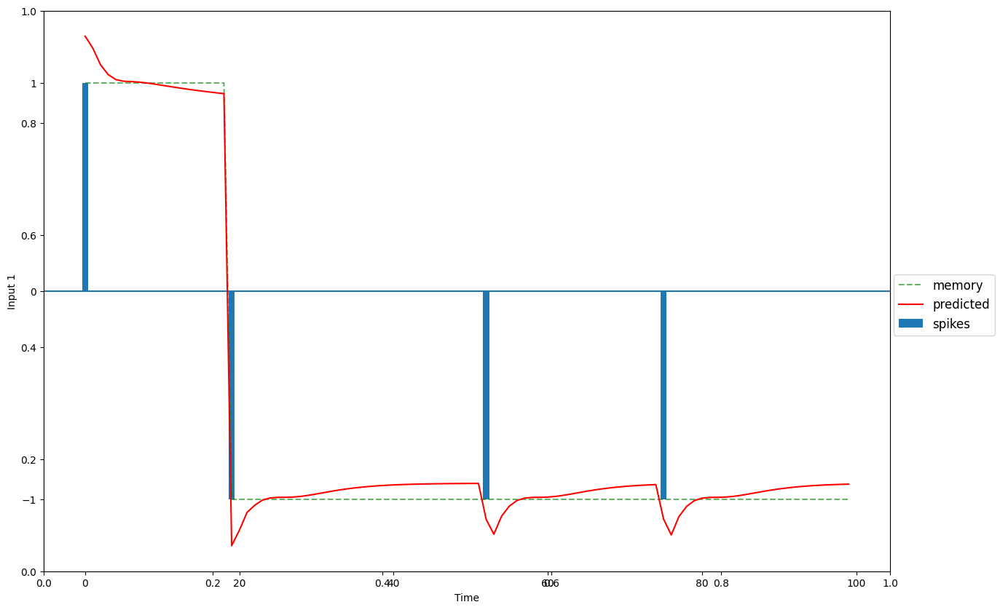

 90%|█████████ | 2700/3000 [05:04<00:33,  9.02it/s]

9 /10 --- loss = 0.007693,reg = 0.000110 best = 0.007693


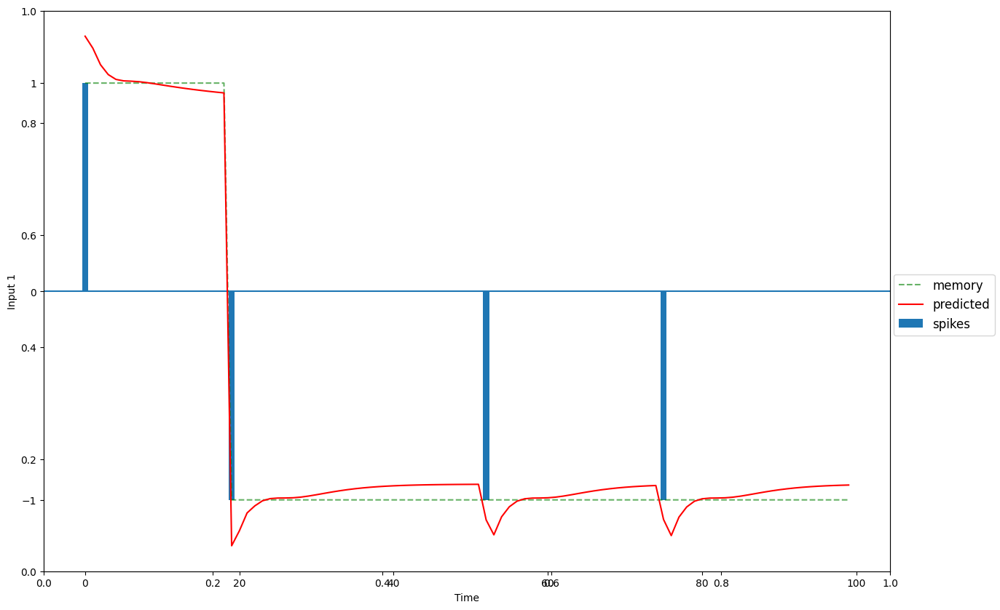

100%|██████████| 3000/3000 [05:39<00:00,  8.84it/s]

Loss:  0.00769155565649271


In [ ]:
# lr_tbrnn2 = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,K,noise_std = 0).to(DEVICE)
# lr_tbrnn2.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_1_mimic_TBRNN_Rank_1_K1_Tanh_withReg"))


# MSE loss and Adam optimizer with a learning rate
lr=1e-03
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_tbrnn2.parameters(), lr=lr)

# train parameters
n_steps = 3000
n_batch = 256

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
losses = lr_tbrnn2.lr_train(Inputs,Targets,lr_tbrnn1,n_steps,optimizer,criterion,batch_size=n_batch,T=T,reg=True)

In [ ]:
correlation_regulation(lr_tbrnn2.M,lr_tbrnn2.N)

tensor(2.8763e-05, device='cuda:0', grad_fn=<MeanBackward0>)

In [ ]:
mount_colab()

Mounted at /content/drive


In [ ]:
# k - flip-flop
K = 1
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

lr_tbrnn1 = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,K).to(DEVICE)
lr_tbrnn1.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_1_K1_Tanh_withReg",map_location=DEVICE))

lr_tbrnn2 = Low_Rank_Three_Way_RNN_Dynamics(input_size, output_size, hidden_dim,K,noise_std = 0).to(DEVICE)
lr_tbrnn2.load_state_dict(torch.load(f"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_1_mimic_TBRNN_Rank_1_K1_Tanh_withReg",map_location=DEVICE))

# MSE loss and Adam optimizer with a learning rate
lr=1e-03
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_tbrnn1.parameters(), lr=lr)

# train parameters
n_steps = 3000
n_batch = 512

# generate new data
# Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
# losses = lr_tbrnn1.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T,reg=True)

  0%|          | 0/3000 [00:00<?, ?it/s]

0 /10 --- loss = 0.013431,reg = 1.340010 best = 0.013431


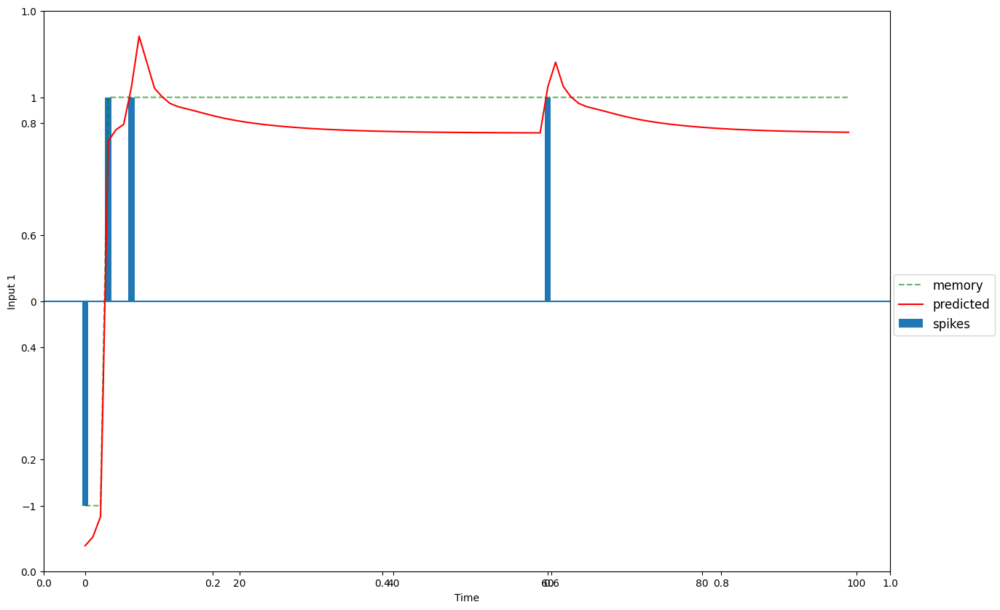

 10%|█         | 300/3000 [00:44<04:55,  9.14it/s]

1 /10 --- loss = 0.009323,reg = 0.771356 best = 0.009323


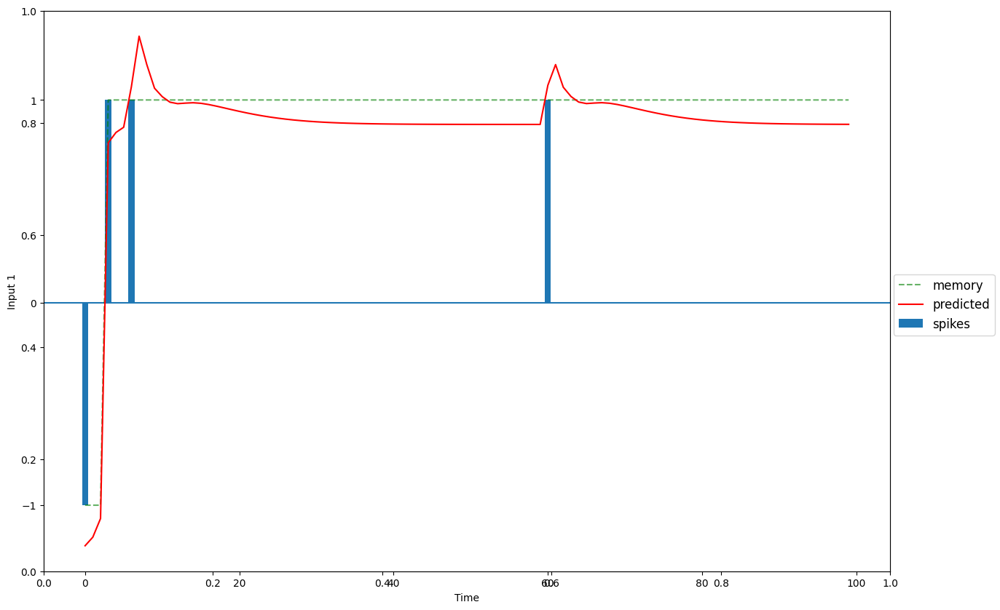

 20%|██        | 600/3000 [01:20<04:52,  8.21it/s]

2 /10 --- loss = 0.008142,reg = 0.432340 best = 0.008142


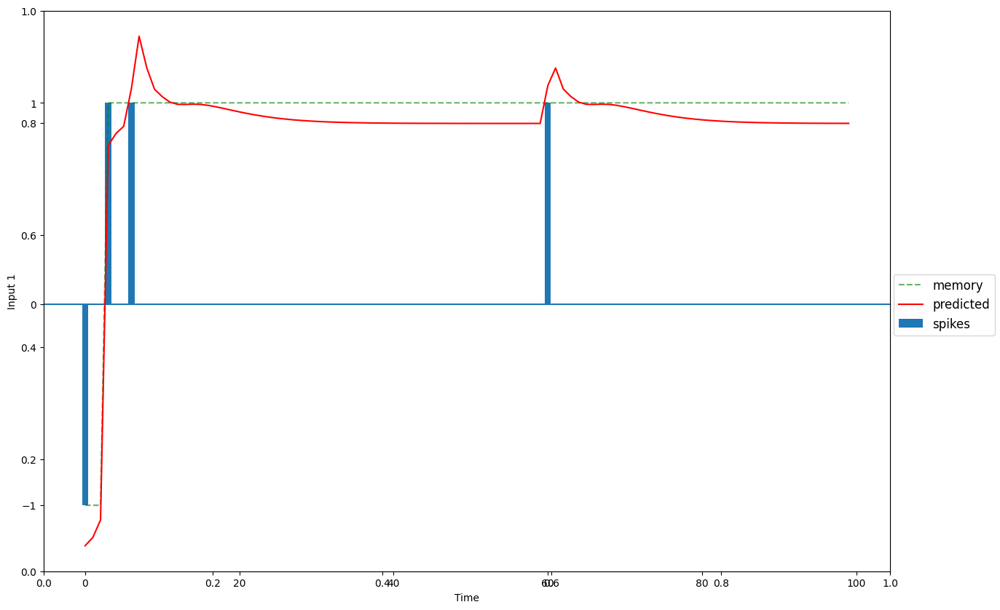

 30%|███       | 900/3000 [01:58<03:50,  9.13it/s]

3 /10 --- loss = 0.008081,reg = 0.282299 best = 0.008081


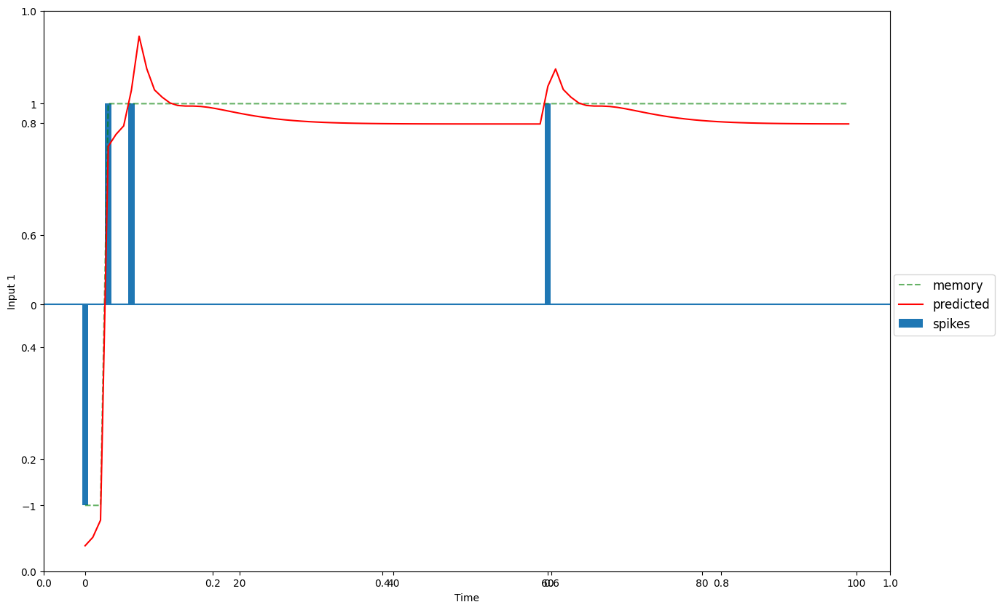

 40%|████      | 1200/3000 [02:34<03:15,  9.19it/s]

4 /10 --- loss = 0.008047,reg = 0.132183 best = 0.008047


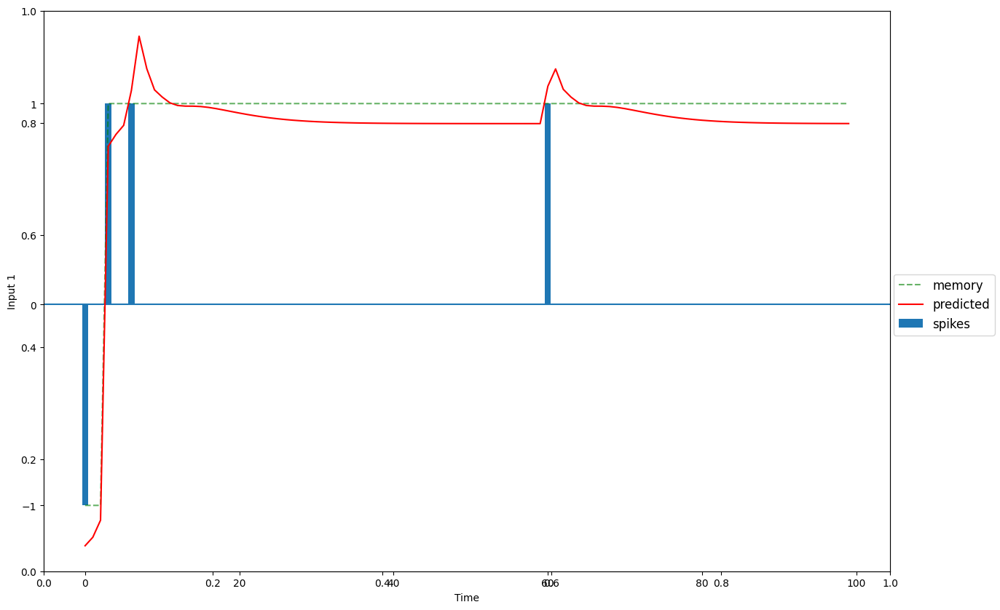

 50%|█████     | 1500/3000 [03:09<03:47,  6.60it/s]

5 /10 --- loss = 0.008011,reg = 0.000155 best = 0.008011


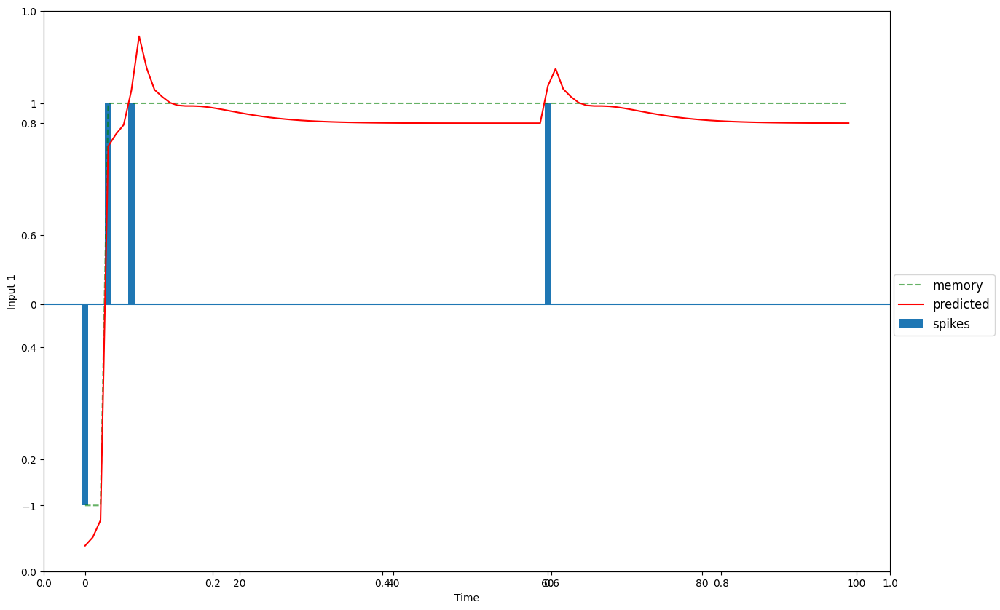

 60%|██████    | 1800/3000 [03:46<02:17,  8.71it/s]

6 /10 --- loss = 0.007931,reg = 0.000498 best = 0.007931


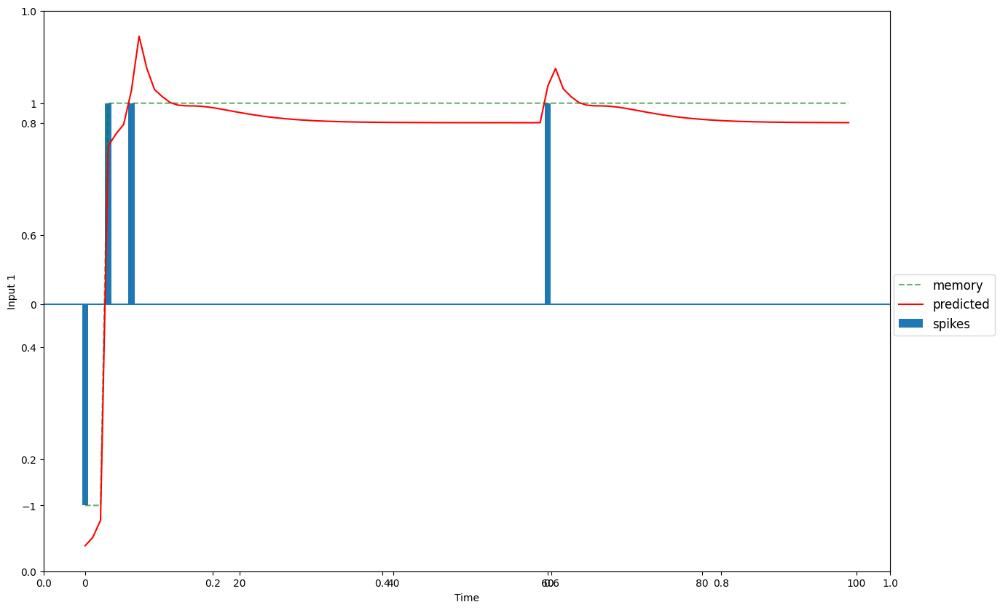

 70%|███████   | 2100/3000 [04:23<01:43,  8.72it/s]

7 /10 --- loss = 0.007846,reg = 0.000238 best = 0.007846


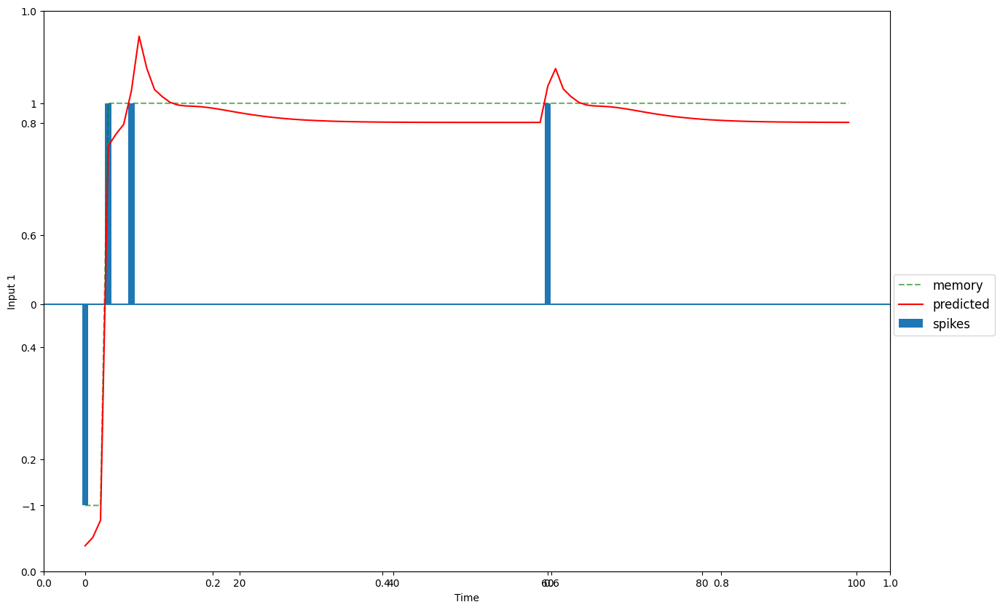

 80%|████████  | 2400/3000 [04:59<01:05,  9.12it/s]

8 /10 --- loss = 0.007760,reg = 0.000241 best = 0.007760


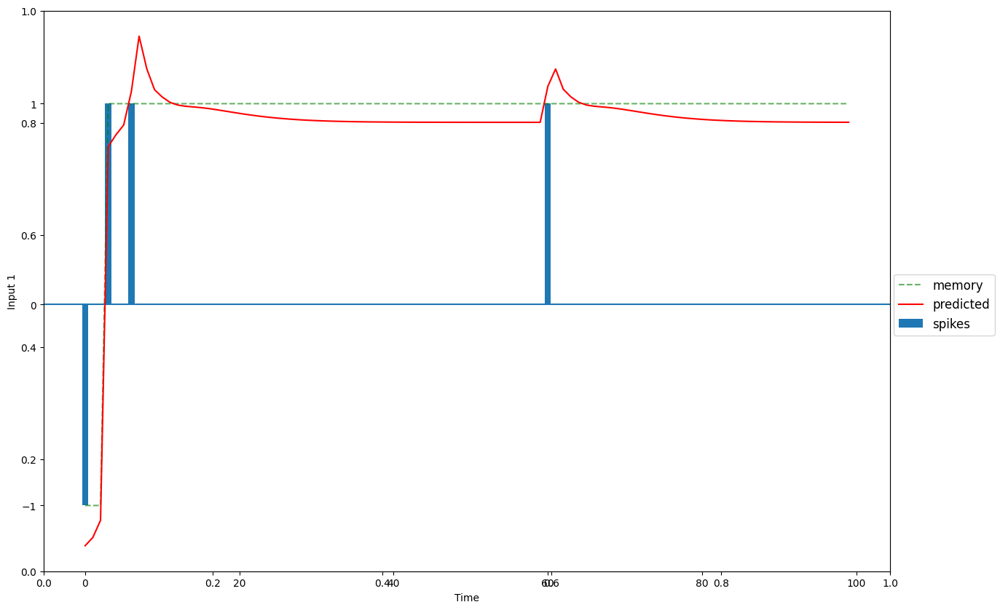

 90%|█████████ | 2700/3000 [05:40<00:32,  9.37it/s]

9 /10 --- loss = 0.007686,reg = 0.000091 best = 0.007686


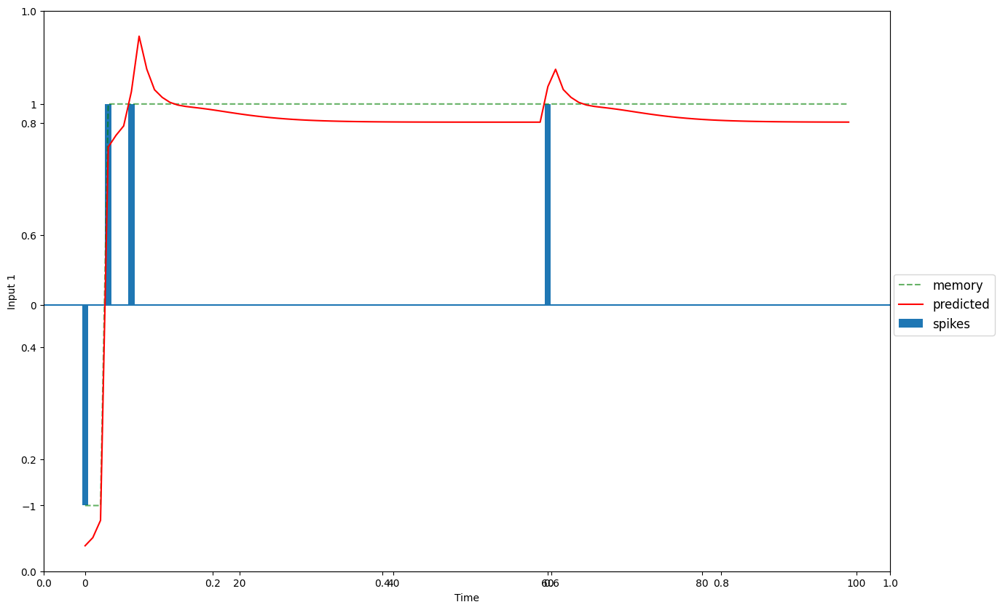

100%|██████████| 3000/3000 [06:19<00:00,  7.90it/s]

Loss:  0.007870921865105629


In [ ]:
optimizer = torch.optim.Adam(lr_tbrnn2.parameters(), lr=lr)
losses = lr_tbrnn2.lr_train(Inputs,Targets,lr_tbrnn1,n_steps,optimizer,criterion,batch_size=n_batch,T=T,reg=True)

In [ ]:
# normalize both tensors
L,M,N = lr_tbrnn1.normalize_tensor()
L_mimic,M_mimic,N_mimic = lr_tbrnn2.normalize_tensor()

# # normalize both tensors
# L,M,N = lr_tbrnn1.L,lr_tbrnn1.M,lr_tbrnn1.N
# L_mimic,M_mimic,N_mimic = lr_tbrnn2.L,lr_tbrnn2.M,lr_tbrnn2.N

L,M,N = L.cpu().detach().numpy(),M.cpu().detach().numpy(),N.cpu().detach().numpy()
L_mimic,M_mimic,N_mimic = L_mimic.cpu().detach().numpy(),M_mimic.cpu().detach().numpy(),N_mimic.cpu().detach().numpy()

# compute the tensor W from L,M,N
W = utils.lr_to_tensor_W(L,M,N)
W_mimic = utils.lr_to_tensor_W(L_mimic,M_mimic,N_mimic)

# Check correlation without projection
corr = utils.corrvecs(W.ravel(), W_mimic.ravel())

In [ ]:
I = lr_tbrnn1.input_fc.weight.cpu().detach().numpy()
I_mimic = lr_tbrnn2.input_fc.weight.cpu().detach().numpy()

LI = np.concatenate((L,I),axis=1).T
LI_mimic = np.concatenate((L_mimic,I_mimic),axis=1).T

In [ ]:
Mp = np.stack(utils.project(M.T,LI)).T
Np = np.stack(utils.project(N.T,LI)).T
Mp_mimic = np.stack(utils.project(M_mimic.T,LI_mimic)).T
Np_mimic = np.stack(utils.project(N_mimic.T,LI_mimic)).T

W_eff = utils.lr_to_tensor_W(L,Mp,Np)
W_eff_mimic = utils.lr_to_tensor_W(L_mimic,Mp_mimic,Np_mimic)

corr_eff = utils.corrvecs(W_eff.ravel(),-W_eff_mimic.transpose(0,2,1).ravel())

In [ ]:
corr , corr_eff

(0.0056689268131307246, 0.8211227013421218)

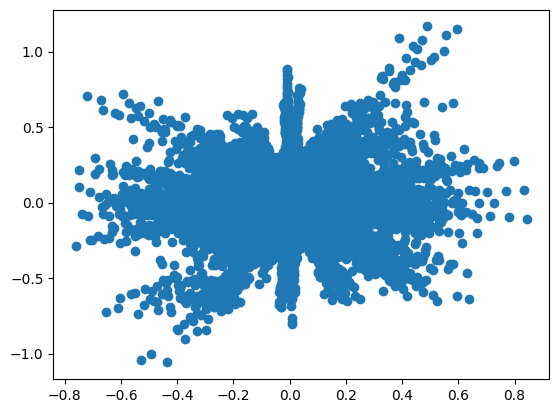

In [ ]:
_=plt.scatter(W.ravel(), W_mimic.transpose(0,2,1).ravel())

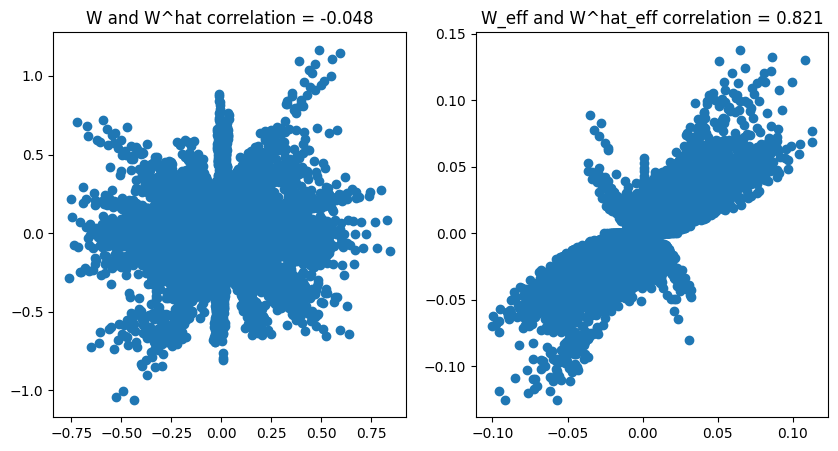

In [ ]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(121)
_=ax.scatter(W.ravel(), W_mimic.transpose(0,2,1).ravel())
_=ax.set_title("W and W^hat correlation = {:.3f}".format(corr))
ax = fig.add_subplot(122)
_=ax.scatter(W_eff.ravel(), -W_eff_mimic.transpose(0,2,1).ravel())
_=ax.set_title("W_eff and W^hat_eff correlation = {:.3f}".format(corr_eff))

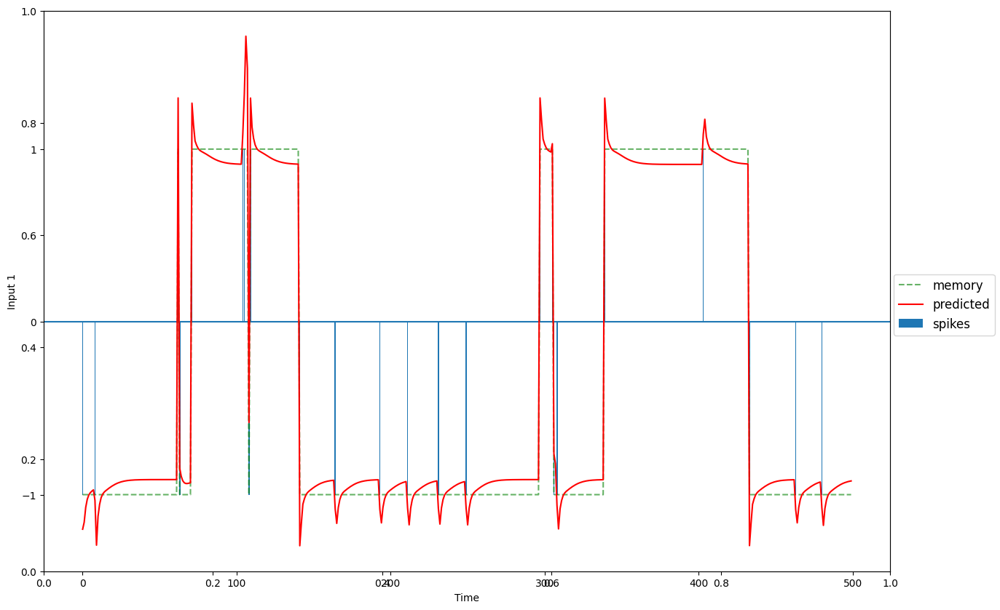

In [ ]:
K_Bit_Flipflop_task.draw_mem_charts(nInputs.cpu(),nTargets.cpu(),lr_tbrnn2(nInputs,None)[0].cpu(),0,K,T)

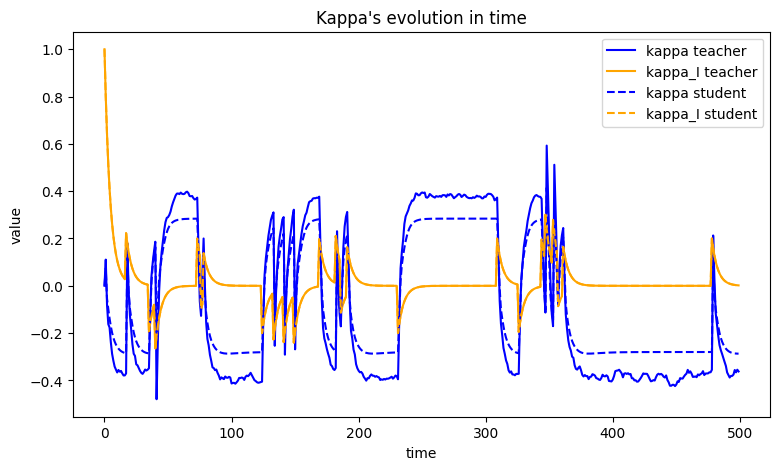

In [ ]:
n_batch = 1
T=500

# nInputs, nTargets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
kappa1,kappaI1 = utils.get_kappa_kappaI(lr_tbrnn1,nInputs,tau = 0.2)
kappa2,kappaI2 = utils.get_kappa_kappaI(lr_tbrnn2,nInputs,tau = 0.2)

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(111)
ax.plot(kappa1[0][1:],color="blue",label="kappa teacher")
ax.plot(kappaI1[0],color="orange",label="kappa_I teacher")
ax.plot(kappa2[0][1:],color="blue",linestyle='dashed',label="kappa student")
ax.plot(kappaI2[0],linestyle='dashed',color="orange",label="kappa_I student")
_=ax.legend()
_=ax.set_xlabel("time")
_=ax.set_ylabel("value")
_=ax.set_title("Kappa's evolution in time")
_=plt.show()

In [ ]:
MpLI_mimic = np.concatenate((Mp_mimic,),axis=1).T
Np_mimic2 = np.stack(utils.project(N_mimic.T,MpLI_mimic)).T

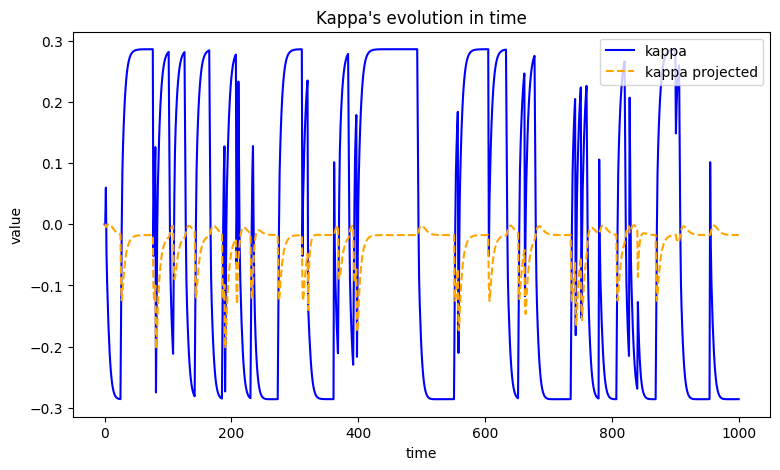

In [ ]:
lr_tbrnn_eff = lr_tbrnn2.clone()
lr_tbrnn_eff.L = nn.Parameter(torch.from_numpy(L_mimic).to(DEVICE).requires_grad_(True))
lr_tbrnn_eff.M = nn.Parameter(torch.from_numpy(Mp_mimic).to(DEVICE).requires_grad_(True))
lr_tbrnn_eff.N = nn.Parameter(torch.from_numpy(Np_mimic).to(DEVICE).requires_grad_(True))

n_batch = 1
T=1000

# nInputs, nTargets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
kappa1,_ = utils.get_kappa_kappaI(lr_tbrnn2,nInputs,tau = 0.2)
kappa2,_ = utils.get_kappa_kappaI(lr_tbrnn_eff,nInputs,tau = 0.2)

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(111)
ax.plot(kappa1[0],color="blue",label="kappa")
ax.plot(kappa2[0],color="orange",linestyle='dashed',label="kappa projected")
_=ax.legend()
_=ax.set_xlabel("time")
_=ax.set_ylabel("value")
_=ax.set_title("Kappa's evolution in time")
_=plt.show()

In [ ]:
utils.corrvecs(Np_mimic2.ravel(),Mp_mimic.ravel())

-1.0

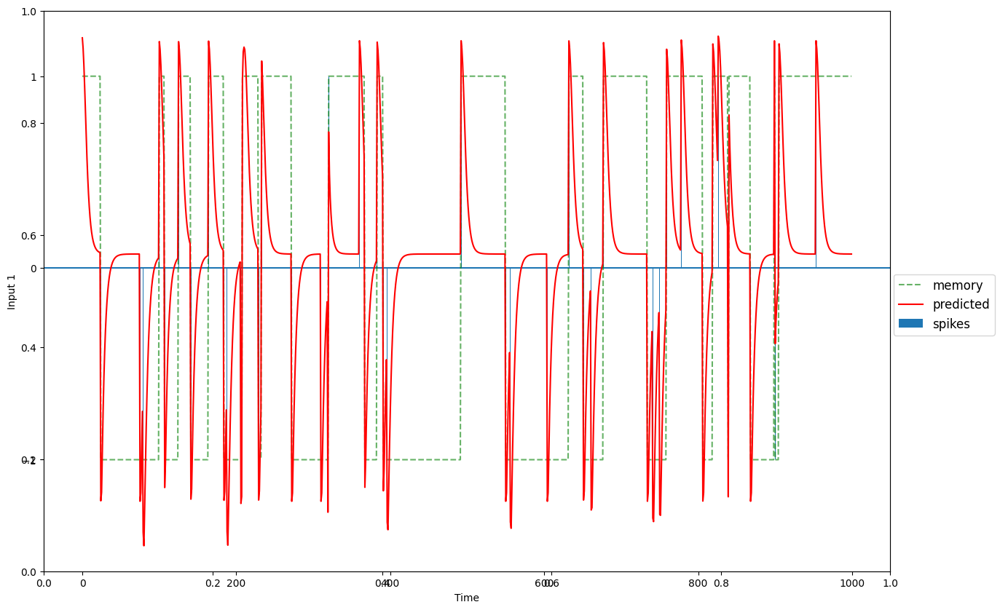

In [ ]:
K_Bit_Flipflop_task.draw_mem_charts(nInputs.cpu(),nTargets.cpu(),lr_tbrnn_eff(nInputs,None)[0].cpu(),idx=0,K=K,T=T)

In [ ]:
import matplotlib as mpl
mpl.rcParams['text.usetex'] = True
mpl.rcParams.update(mpl.rcParamsDefault)

In [ ]:
m1 = lr_tbrnn1.M.detach().numpy()
n1 = lr_tbrnn1.N.detach().numpy()
m2 = lr_tbrnn2.M.detach().numpy()
n2 = lr_tbrnn2.N.detach().numpy()
l1 = lr_tbrnn1.L.detach().numpy()
l2 = lr_tbrnn2.L.detach().numpy()
I1 = lr_tbrnn1.input_fc.weight.detach().numpy()
I2 = lr_tbrnn2.input_fc.weight.detach().numpy()
O1 = lr_tbrnn1.fc.weight.detach().numpy()
O2 = lr_tbrnn2.fc.weight.detach().numpy()

b1 = lr_tbrnn1.bias_tensor.detach().numpy()
b2 = lr_tbrnn2.bias_tensor.detach().numpy()

In [ ]:
traj1 = lr_tbrnn1(nInputs,None)[2].detach().numpy()
traj2 = lr_tbrnn2(nInputs,None)[2].detach().numpy()

In [ ]:
trials = 10000
res1,res2 = [],[]
phi = traj2[0]
res1 = ((phi @ n1) * (phi @ m1)) / hidden_dim**2
res2 = ((phi @ n2) * (phi @ m2)) / hidden_dim**2

In [ ]:
utils.corrvecs(res1.ravel(),res2.ravel())

-0.90403265

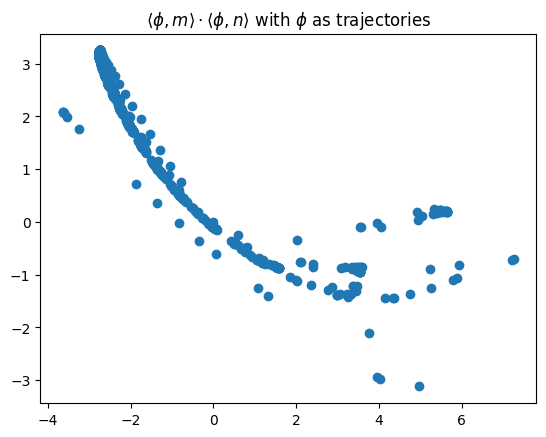

In [ ]:
plt.scatter(res1.ravel(),res2.ravel())
plt.title(r'$\langle\phi,m\rangle\cdot\langle\phi,n\rangle$ with $\phi$ as trajectories')
plt.show()

In [ ]:
trials = 10000
res1,res2 = [],[]
coef = np.random.randn(trials,2)

phi = (coef[:,[0]] @ l2.T + coef[:,[1]] @ I2.T)
res1 = ((phi @ n1) * (phi @ m1)) / hidden_dim**2
res2 = ((phi @ n2) * (phi @ m2)) / hidden_dim**2

In [ ]:
utils.corrvecs(res1.ravel(),res2.ravel())

-0.8818393217780176

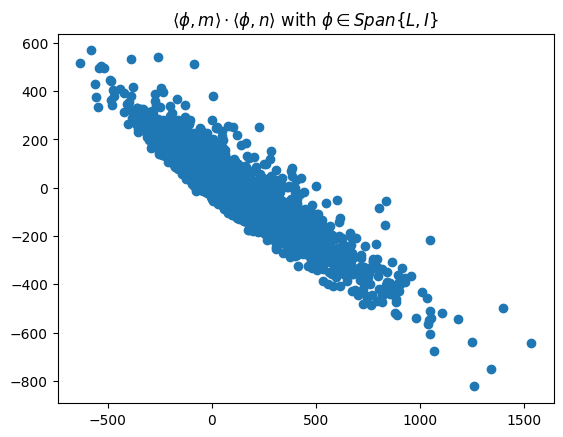

In [ ]:
plt.scatter(res1.ravel(),res2.ravel())
plt.title(r'$\langle\phi,m\rangle\cdot\langle\phi,n\rangle$ with $\phi\in Span\{L,I\}$')
plt.show()

In [ ]:
trials = 10000
res1,res2 = [],[]

phi = np.random.randn(trials,hidden_dim)
res1 = ((phi @ n1) * (phi @ m1)) / hidden_dim**2
res2 = ((phi @ n2) * (phi @ m2)) / hidden_dim**2

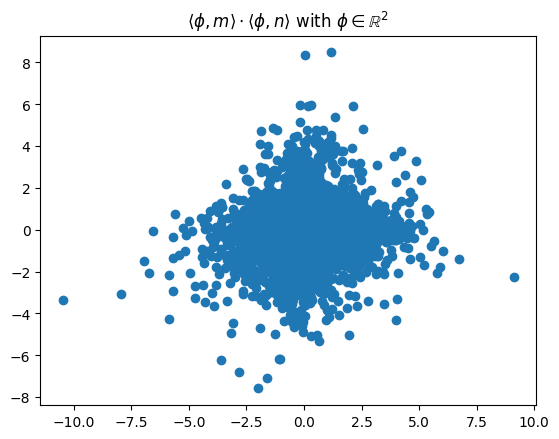

In [ ]:
plt.scatter(res1.ravel(),res2.ravel())
plt.title(r'$\langle\phi,m\rangle\cdot\langle\phi,n\rangle$ with $\phi\in\mathbb{R}^2$')
plt.show()

In [ ]:
utils.corrvecs(res1.ravel(),res2.ravel())

0.07852583100619151

In [ ]:
utils.corrvecs(b1.ravel(),b2.ravel())

-0.20419501

In [ ]:
kappa_dot = (kappa1[0][1:]-kappa1[0][:-1])/0.2

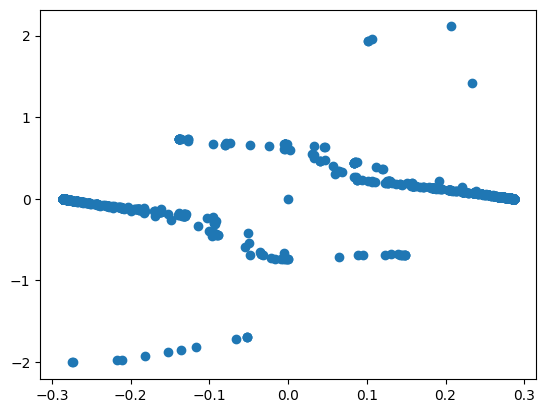

In [ ]:
plt.scatter(kappa1.ravel()[1:],kappa_dot)
plt.show()

In [ ]:
lr_rnn1 = Low_Rank_RNN_Dynamics(input_size,output_size,hidden_dim,K).to(DEVICE)
lr_rnn1.load_state_dict(torch.load("/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_K1_Tanh_withReg",map_location=DEVICE))

lr_rnn2 = Low_Rank_RNN_Dynamics(input_size,output_size,hidden_dim,K,noise_std=0).to(DEVICE)
lr_rnn2.load_state_dict(torch.load("/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_mimic_RNN_Rank_1_K1_Tanh_withReg",map_location=DEVICE))



<All keys matched successfully>

In [ ]:
kappa1_rnn,_ = utils.get_kappa_kappaI(lr_rnn1,nInputs,tau = 0.2)
kappa2_rnn,_ = utils.get_kappa_kappaI(lr_rnn2,nInputs,tau = 0.2)

In [ ]:
kappa_dot_rnn = (kappa1_rnn[0][1:]-kappa1_rnn[0][:-1])/0.2

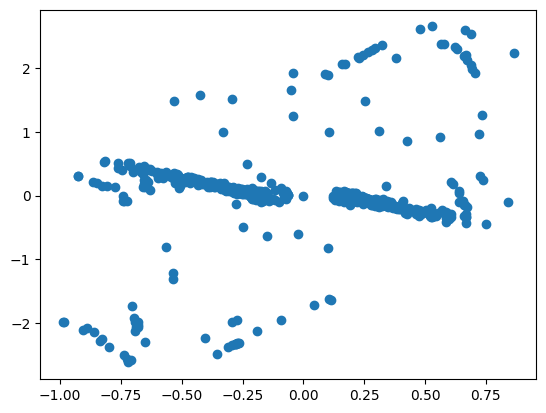

In [ ]:
plt.scatter(kappa1_rnn.ravel()[1:],kappa_dot_rnn)
plt.show()

###1rank lrRNN on 1BitFF

In [ ]:
# k - flip-flop
K = 1
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

lr_rnn = Low_Rank_RNN_Dynamics(input_size,output_size,hidden_dim,K).to(DEVICE)
lr_rnn.load_state_dict(torch.load("/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_K1_Tanh_withReg"))

# MSE loss and Adam optimizer with a learning rate
lr=1e-03
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_rnn.parameters(), lr=lr)

# train parameters
n_steps = 3000
n_batch = 512

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
# losses = lr_rnn.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T,reg=False)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


  0%|          | 0/3000 [00:00<?, ?it/s]

0 /10 --- loss = 0.041761,reg = 0.224119 best = 0.041761


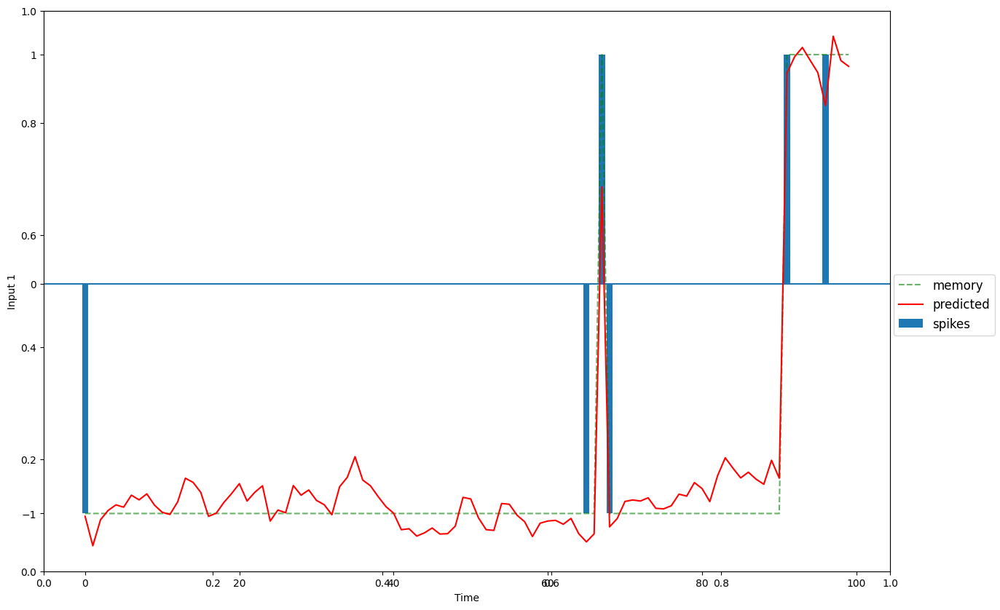

 10%|▉         | 299/3000 [00:30<04:08, 10.87it/s]

1 /10 --- loss = 0.059438,reg = 0.123392 best = 0.034585


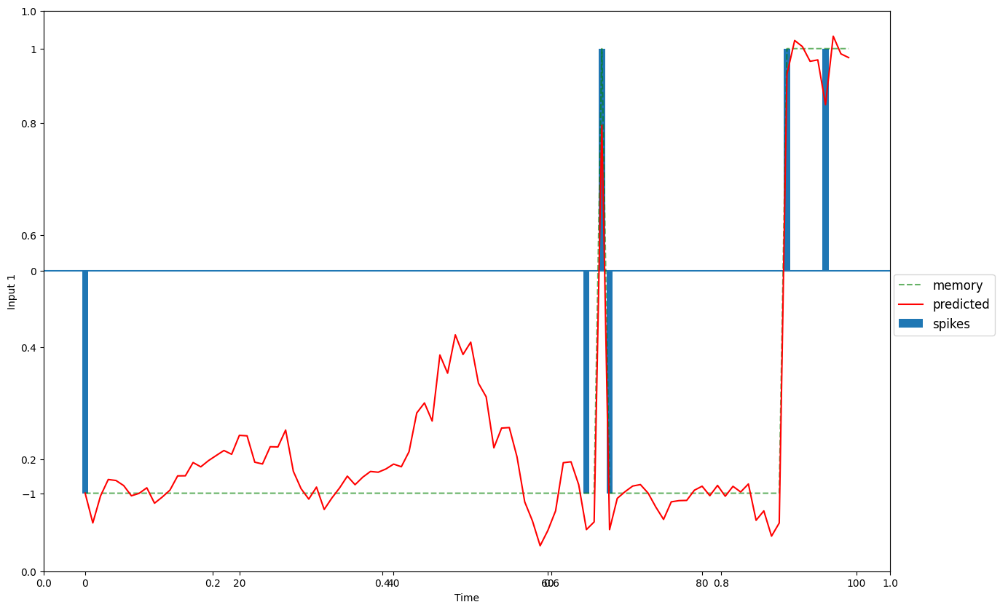

 20%|██        | 600/3000 [00:58<03:47, 10.57it/s]

2 /10 --- loss = 0.047380,reg = 0.028311 best = 0.034585


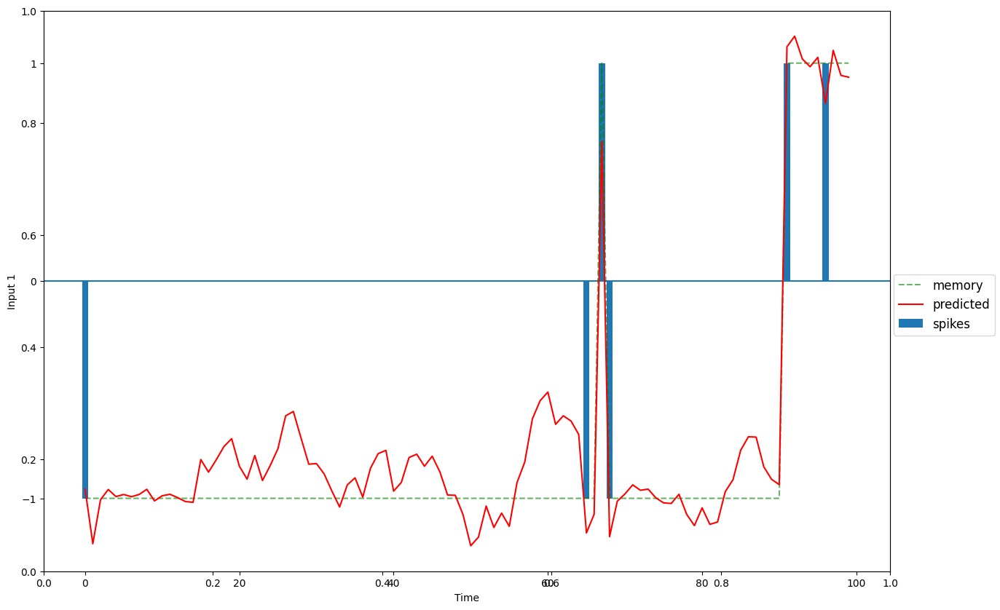

 30%|██▉       | 899/3000 [01:27<03:25, 10.21it/s]

3 /10 --- loss = 0.040032,reg = 0.000063 best = 0.034585


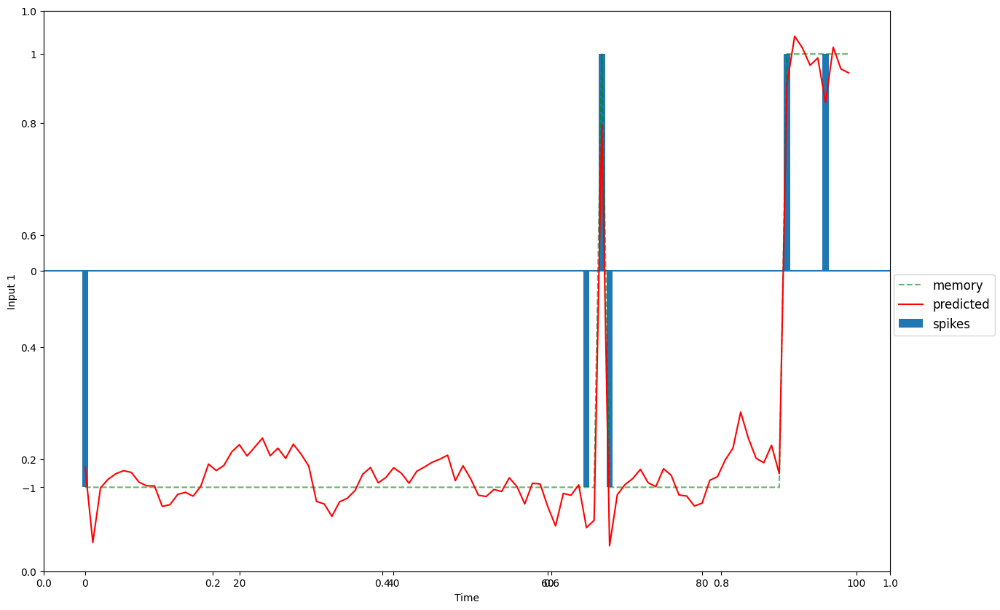

 40%|███▉      | 1199/3000 [01:55<02:43, 11.04it/s]

4 /10 --- loss = 0.041763,reg = 0.000001 best = 0.034585


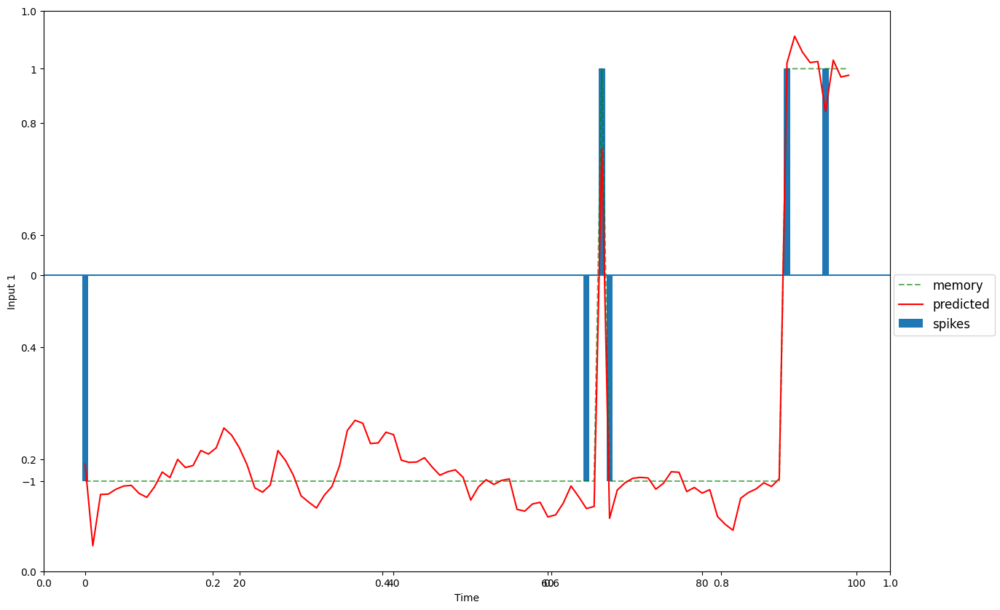

 50%|█████     | 1500/3000 [02:24<02:23, 10.46it/s]

5 /10 --- loss = 0.045814,reg = 0.000042 best = 0.034585


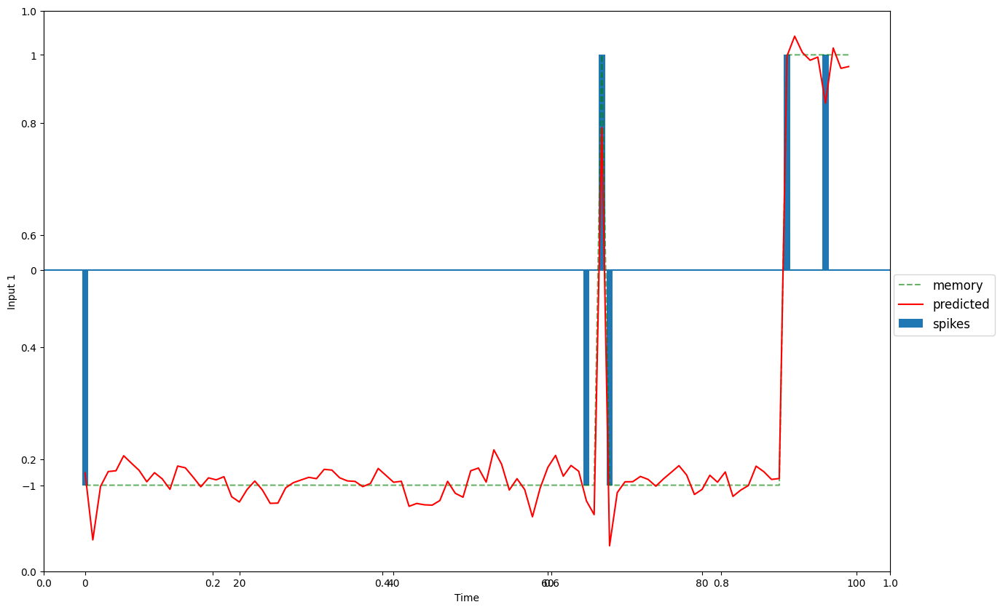

 52%|█████▏    | 1568/3000 [02:31<02:18, 10.36it/s]


KeyboardInterrupt: 

In [ ]:
losses = lr_rnn.train(Inputs,Targets,3000,optimizer,criterion,batch_size=n_batch,T=T,reg=True)

In [ ]:
lr_rnn.normalize_tensor_()

In [ ]:
torch.save(lr_rnn.state_dict(),"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_K1_Tanh_withReg")

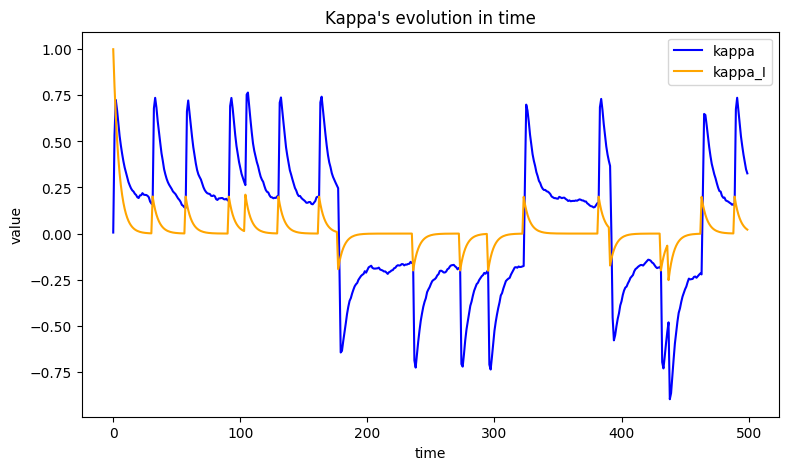

In [ ]:
n_batch = 1
T=500

# nInputs, nTargets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
kappa,kappaI = utils.get_kappa_kappaI(lr_rnn,nInputs,tau = 0.2)

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(111)
ax.plot(kappa[0][1:],color="blue",label="kappa")
ax.plot(kappaI[0],color="orange",label="kappa_I")
_=ax.legend()
_=ax.set_xlabel("time")
_=ax.set_ylabel("value")
_=ax.set_title("Kappa's evolution in time")
_=plt.show()

In [ ]:
lr_tbrnn = Low_Rank_Three_Way_RNN_Dynamics(input_size,output_size,hidden_dim,K).to(DEVICE)
lr_tbrnn.load_state_dict(torch.load("/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/TBRNN_Rank_1_K1_Tanh_withReg"))
tb_kappa,tb_kappaI = utils.get_kappa_kappaI(lr_tbrnn,nInputs,tau = 0.2)

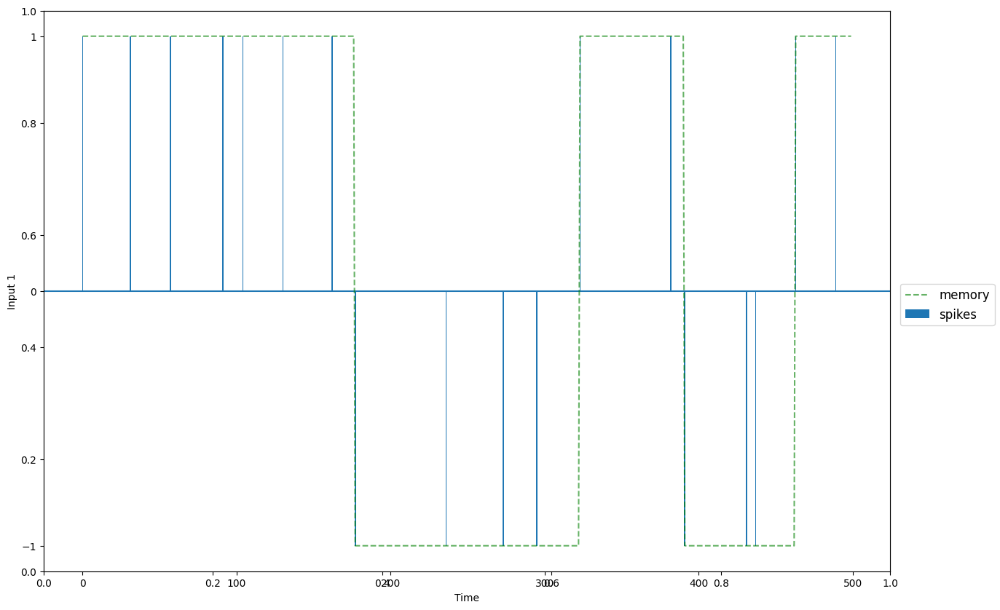

In [ ]:
K_Bit_Flipflop_task.draw_mem_charts(nInputs.cpu(),nTargets.cpu(),idx=0,K=K,T=T)

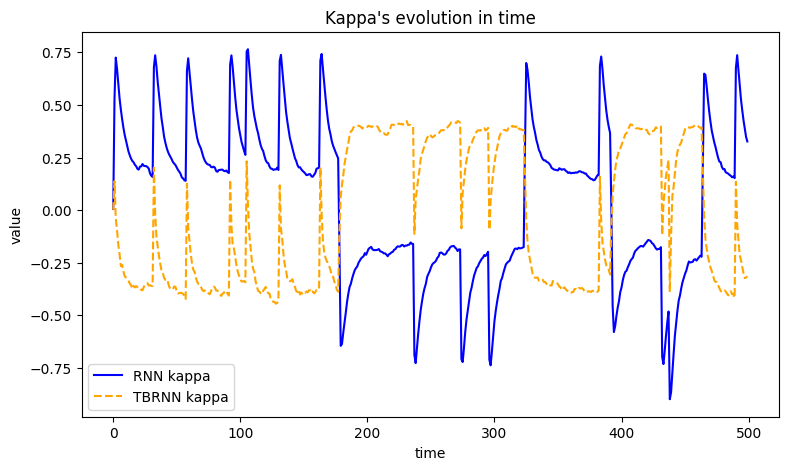

In [ ]:
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(111)
ax.plot(kappa[0][1:],color="blue",label="RNN kappa")
ax.plot(tb_kappa[0][1:],color="orange",linestyle='dashed',label="TBRNN kappa")
_=ax.legend()
_=ax.set_xlabel("time")
_=ax.set_ylabel("value")
_=ax.set_title("Kappa's evolution in time")
_=plt.show()

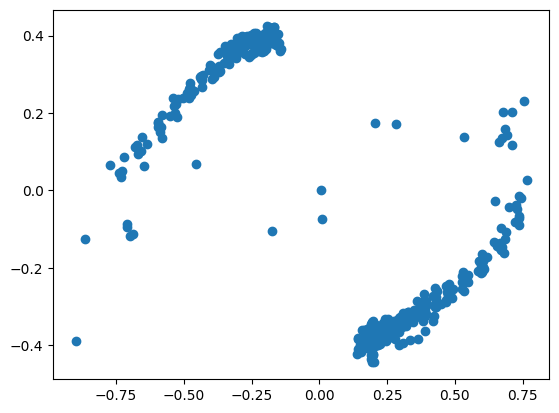

In [ ]:
_=plt.scatter(kappa[0][1:],tb_kappa[0][1:])

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


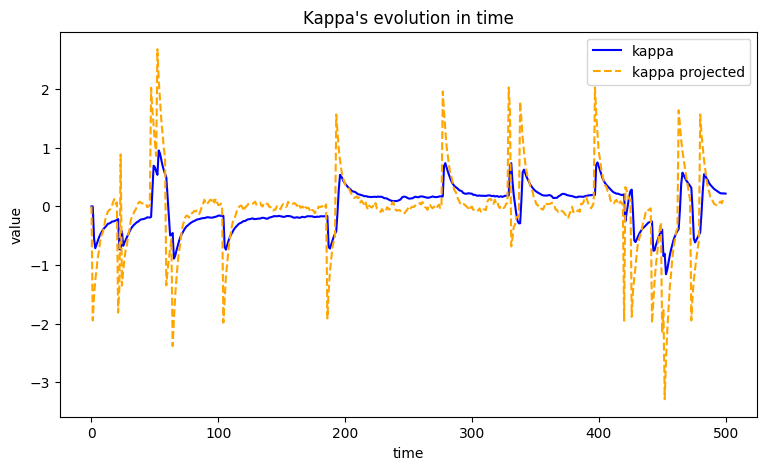

In [ ]:
input_size,output_size,K = 1,1,1
hidden_dim=30
lr_rnn = Low_Rank_RNN_Dynamics(input_size,output_size,hidden_dim,K).to(DEVICE)
lr_rnn.load_state_dict(torch.load("/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_K1_Tanh_withReg"))

## proj
M,N = lr_rnn.M.cpu().detach().numpy(),lr_rnn.N.cpu().detach().numpy()

I = lr_rnn.input_fc.weight.cpu().detach().numpy()

MI = np.concatenate((M,I),axis=1).T

Np = np.stack(utils.project(M.T,MI)).T
###

lr_rnn_eff = lr_rnn.clone()
lr_rnn_eff.N = nn.Parameter(torch.from_numpy(Np).to(DEVICE).requires_grad_(True))

n_batch = 1
T=500

nInputs, nTargets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
kappa1,_ = utils.get_kappa_kappaI(lr_rnn,nInputs,tau = 0.2)
kappa2,_ = utils.get_kappa_kappaI(lr_rnn_eff,nInputs,tau = 0.2)

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(111)
ax.plot(kappa1[0],color="blue",label="kappa")
ax.plot(kappa2[0],color="orange",linestyle='dashed',label="kappa projected")
_=ax.legend()
_=ax.set_xlabel("time")
_=ax.set_ylabel("value")
_=ax.set_title("Kappa's evolution in time")
_=plt.show()

mimic lrRNN 1

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)
  0%|          | 0/9000 [00:00<?, ?it/s]

0 /10 --- loss = 0.417473, best = 0.417473


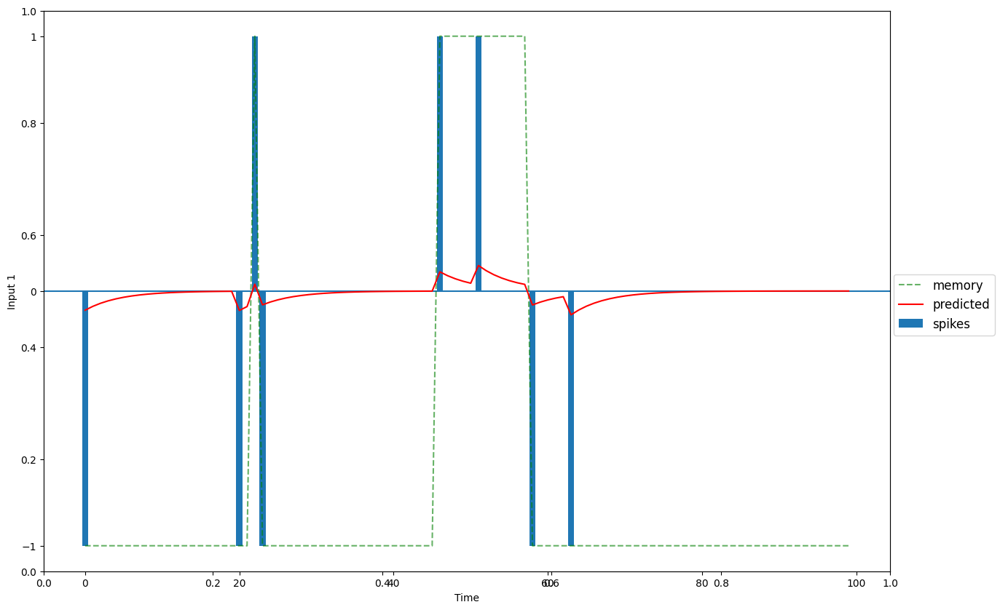

 10%|█         | 900/9000 [01:24<12:38, 10.68it/s]

1 /10 --- loss = 0.224721, best = 0.224721


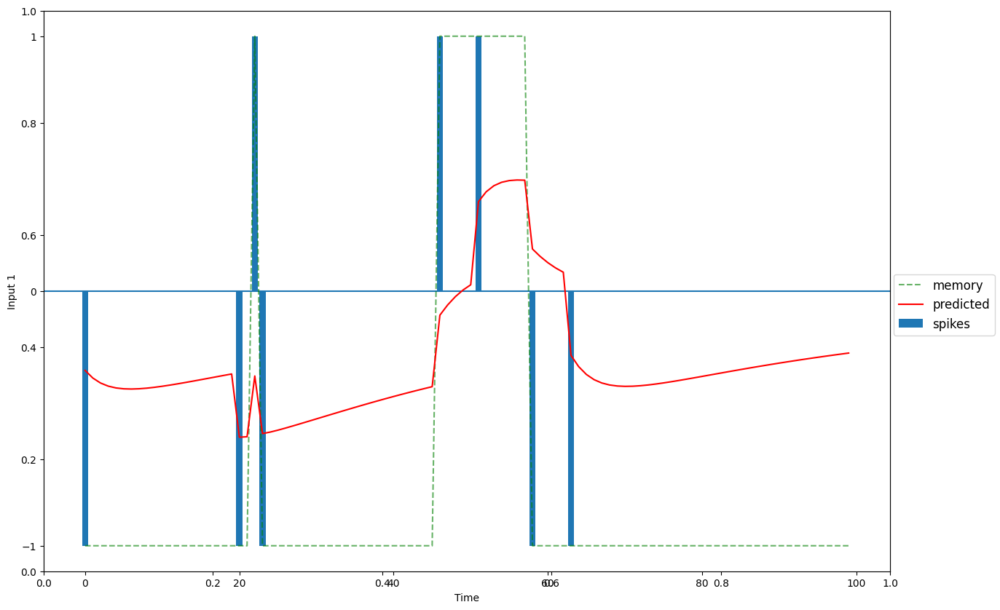

 20%|██        | 1800/9000 [02:48<11:16, 10.64it/s]

2 /10 --- loss = 0.136098, best = 0.136098


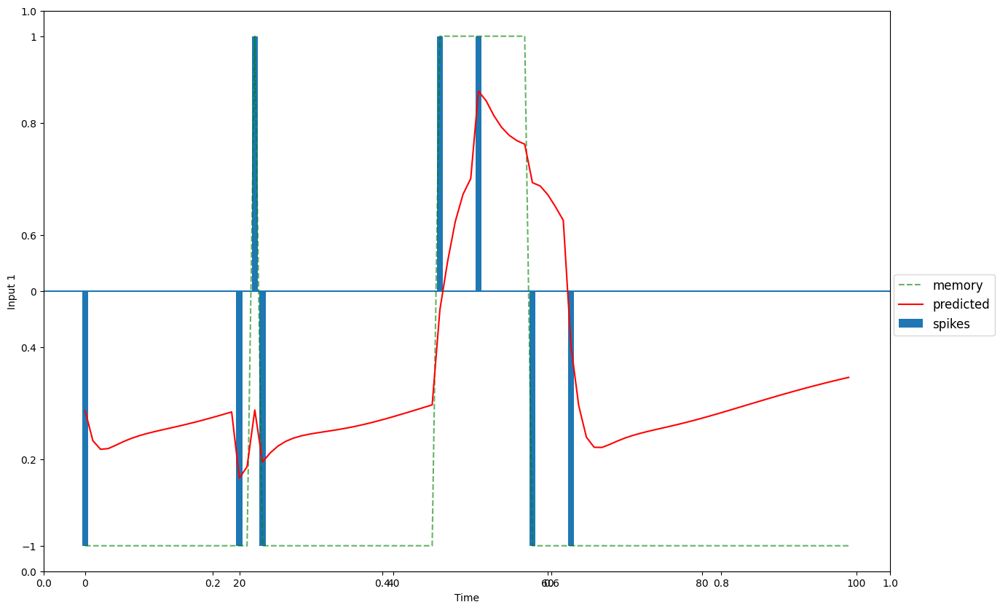

 30%|███       | 2700/9000 [04:12<09:41, 10.83it/s]

3 /10 --- loss = 0.101102, best = 0.101102


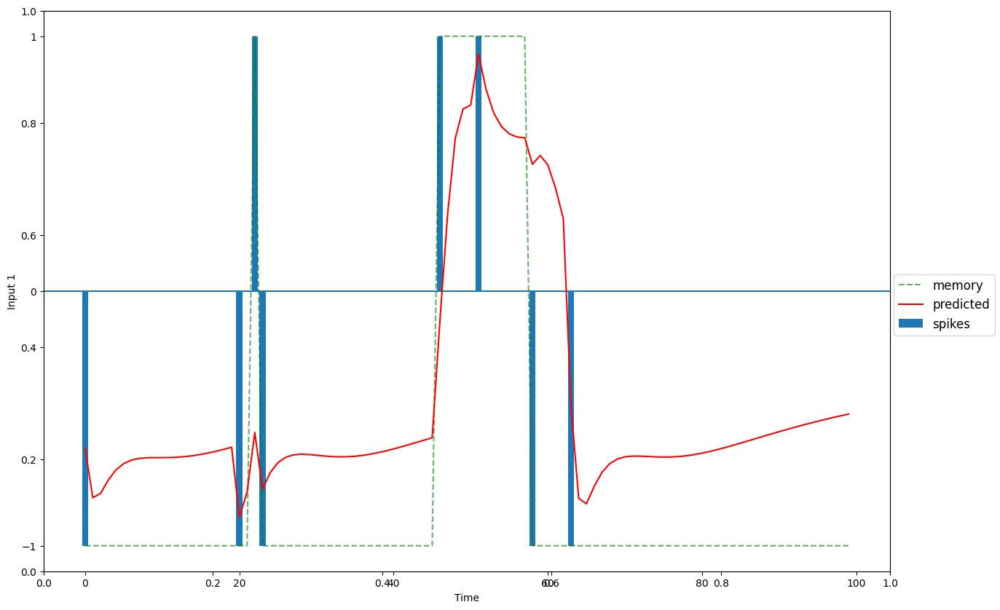

 40%|████      | 3600/9000 [05:36<08:17, 10.86it/s]

4 /10 --- loss = 0.076516, best = 0.076516


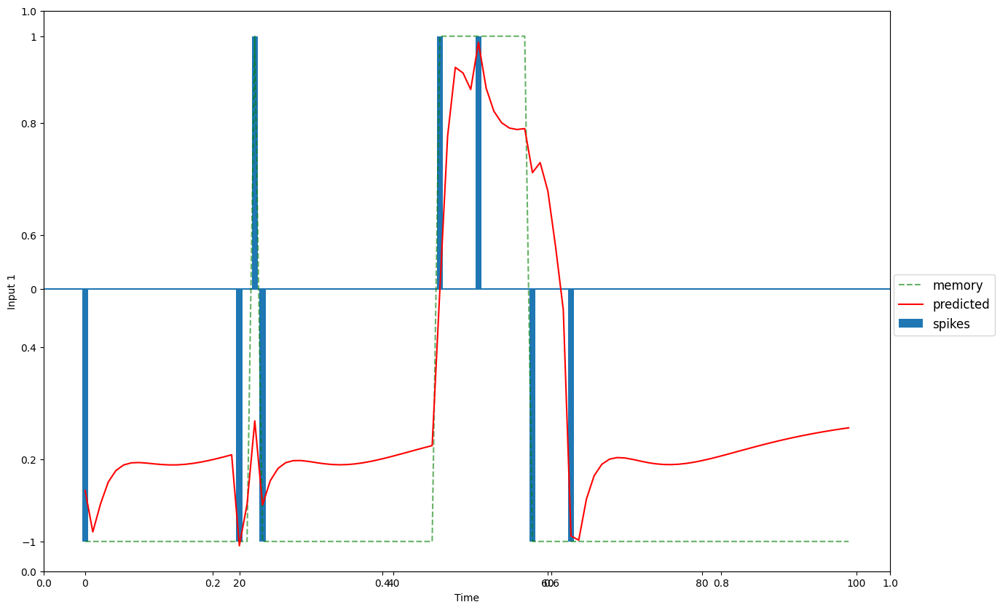

 50%|█████     | 4500/9000 [07:00<06:52, 10.90it/s]

5 /10 --- loss = 0.057313, best = 0.057313


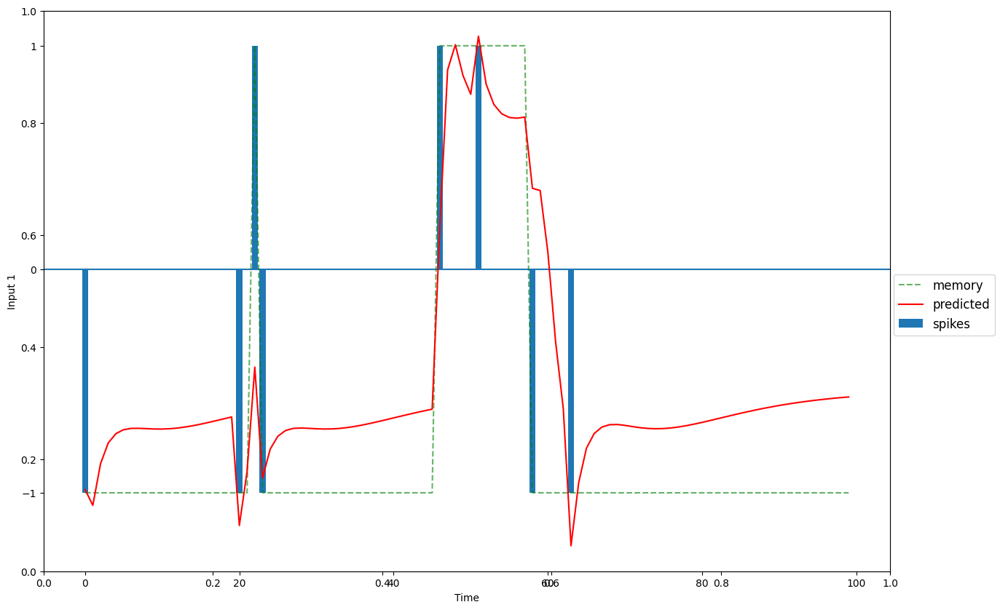

 60%|██████    | 5400/9000 [08:24<05:31, 10.87it/s]

6 /10 --- loss = 0.040454, best = 0.040454


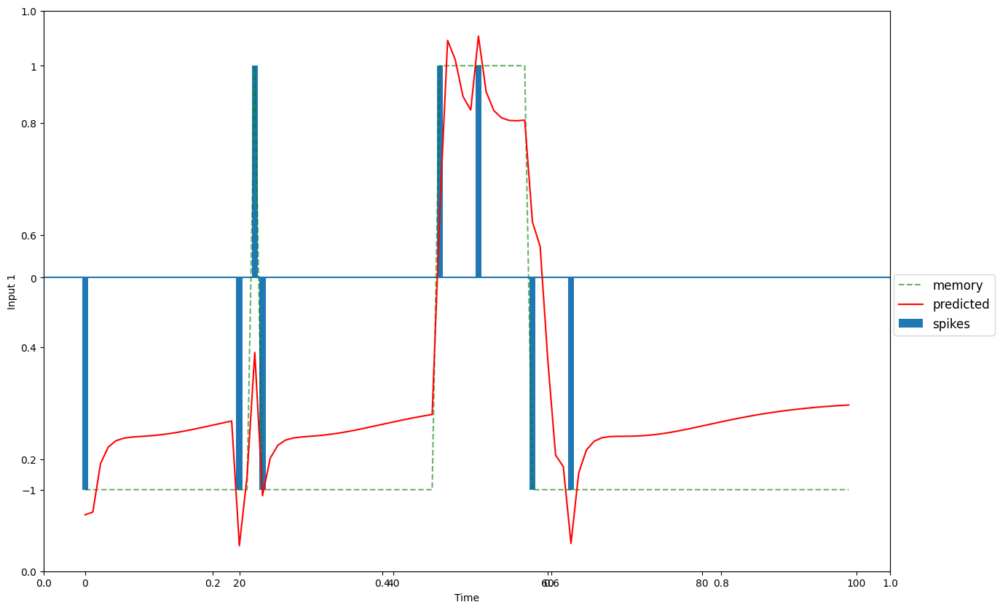

 70%|███████   | 6300/9000 [09:48<04:08, 10.88it/s]

7 /10 --- loss = 0.029083, best = 0.029083


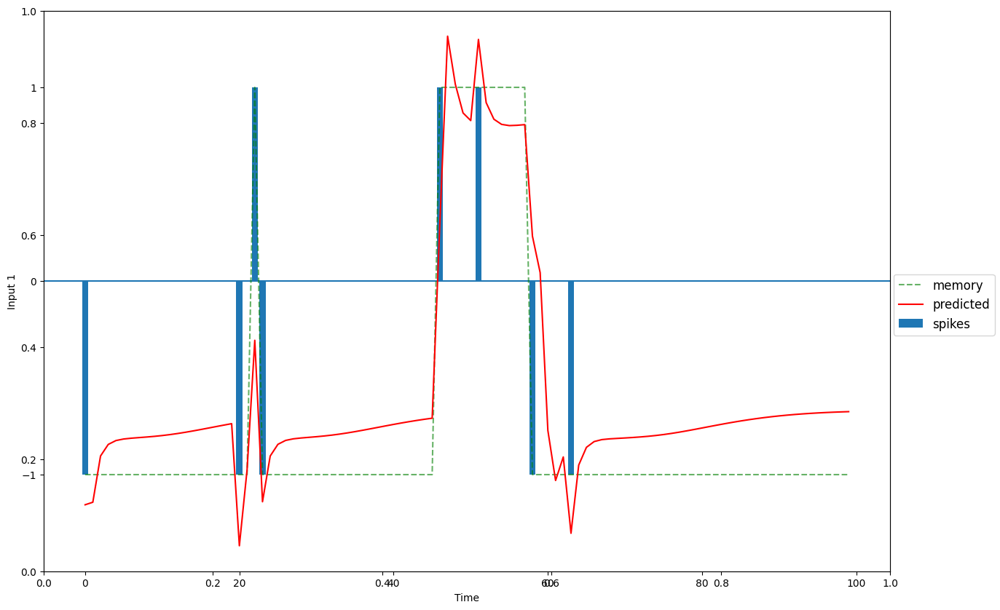

 80%|████████  | 7200/9000 [11:12<02:55, 10.23it/s]

8 /10 --- loss = 0.021586, best = 0.021586


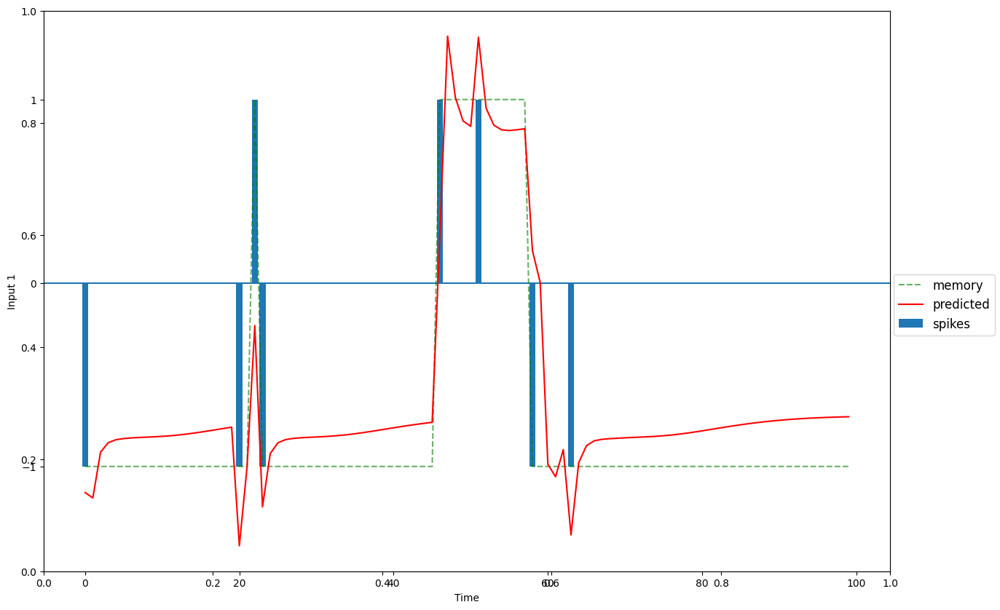

 90%|████████▉ | 8099/9000 [12:35<01:25, 10.56it/s]

9 /10 --- loss = 0.016501, best = 0.016501


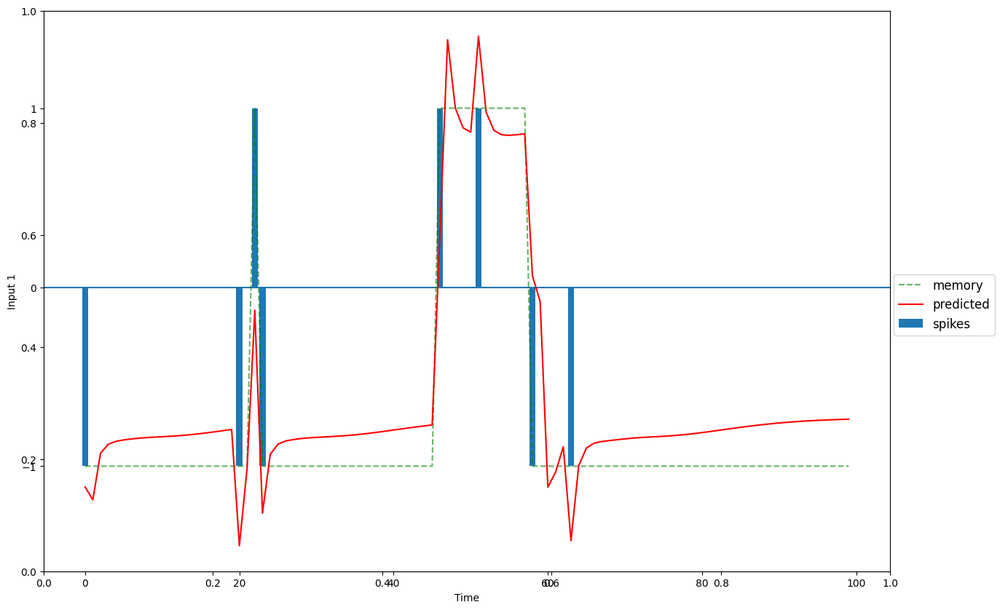

100%|██████████| 9000/9000 [14:00<00:00, 10.71it/s]


Loss:  0.012829340994358063


In [ ]:
# k - flip-flop
K = 1
T = 100

# decide on hyperparameters
input_size=K
output_size=K
hidden_dim=30

lr_rnn = Low_Rank_RNN_Dynamics(input_size,output_size,hidden_dim,K).to(DEVICE)
lr_rnn.load_state_dict(torch.load("/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_K1_Tanh_withReg"))

lr_rnn_mimic = Low_Rank_RNN_Dynamics(input_size,output_size,hidden_dim,K,noise_std=0).to(DEVICE)

# MSE loss and Adam optimizer with a learning rate
lr=1e-03
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_rnn_mimic.parameters(), lr=lr)

# train parameters
n_steps = 9000
n_batch = 512

# generate new data
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
losses = lr_rnn_mimic.lr_train(Inputs,Targets,lr_rnn,n_steps,optimizer,criterion,batch_size=n_batch,T=T,reg=False)

In [ ]:
torch.save(lr_rnn_mimic.state_dict(),"/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_mimic_RNN_Rank_1_K1_Tanh_withReg")

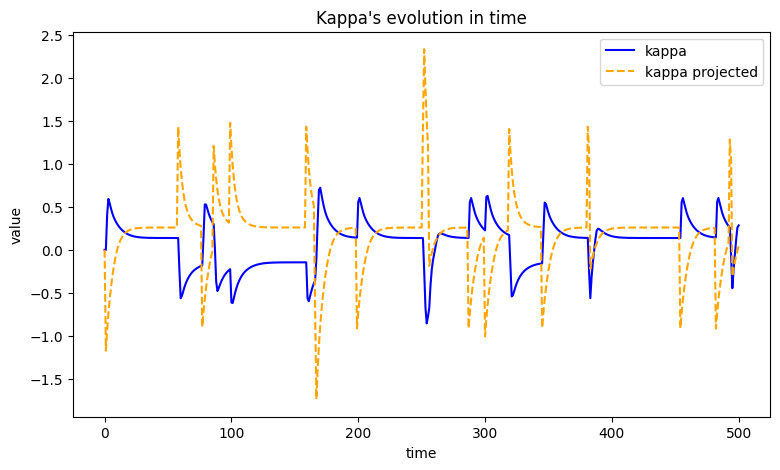

In [ ]:
input_size,output_size,K = 1,1,1
hidden_dim=30

lr_rnn_mimic.normalize_tensor_()
## proj
M,N = lr_rnn_mimic.M.cpu().detach().numpy(),lr_rnn_mimic.N.cpu().detach().numpy()

I = lr_rnn_mimic.input_fc.weight.cpu().detach().numpy()

MI = np.concatenate((M,I),axis=1).T

Np = np.stack(utils.project(M.T,MI)).T
###

lr_rnn_eff = lr_rnn_mimic.clone()
lr_rnn_eff.N = nn.Parameter(torch.from_numpy(Np).to(DEVICE).requires_grad_(True))

n_batch = 1
T=500

# nInputs, nTargets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
kappa1,_ = utils.get_kappa_kappaI(lr_rnn_mimic,nInputs,tau = 0.2)
kappa2,_ = utils.get_kappa_kappaI(lr_rnn_eff,nInputs,tau = 0.2)

fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(111)
ax.plot(kappa1[0],color="blue",label="kappa")
ax.plot(kappa2[0],color="orange",linestyle='dashed',label="kappa projected")
_=ax.legend()
_=ax.set_xlabel("time")
_=ax.set_ylabel("value")
_=ax.set_title("Kappa's evolution in time")
_=plt.show()

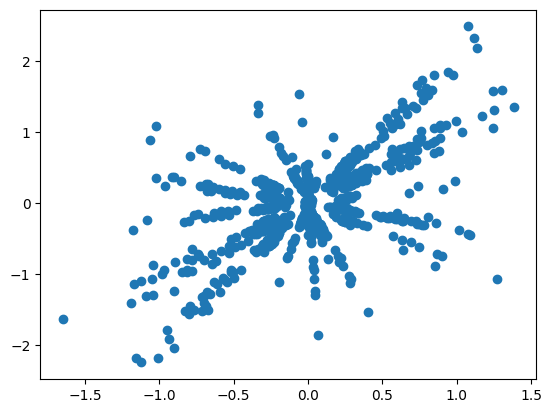

In [ ]:
lr_rnn.normalize_tensor_()
_=plt.scatter(lr_rnn.lr_to_tensor().cpu().detach().numpy().ravel(),lr_rnn_mimic.lr_to_tensor().cpu().detach().numpy().ravel())

In [ ]:
mount_colab()

Mounted at /content/drive


In [ ]:
input_size,output_size,hidden_dim,K = 1,1,30,1
lr_rnn1 = Low_Rank_RNN_Dynamics(input_size,output_size,hidden_dim,K).to(DEVICE)
lr_rnn1.load_state_dict(torch.load("/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_K1_Tanh_withReg",map_location=DEVICE))

lr_rnn2 = Low_Rank_RNN_Dynamics(input_size,output_size,hidden_dim,K,noise_std=0).to(DEVICE)
lr_rnn2.load_state_dict(torch.load("/content/drive/MyDrive/Three_Bodies_Network/dynamicsModels/RNN_Rank_1_mimic_RNN_Rank_1_K1_Tanh_withReg",map_location=DEVICE))

lr_rnn1.normalize_tensor_()
lr_rnn2.normalize_tensor_()

## proj
M1,N1 = lr_rnn1.M.cpu().detach().numpy(),lr_rnn1.N.cpu().detach().numpy()
M2,N2 = lr_rnn2.M.cpu().detach().numpy(),lr_rnn2.N.cpu().detach().numpy()

I1 = lr_rnn1.input_fc.weight.cpu().detach().numpy()
I2 = lr_rnn2.input_fc.weight.cpu().detach().numpy()

MI1 = np.concatenate((M1,I1),axis=1).T
MI2 = np.concatenate((M2,I2),axis=1).T

Np1 = np.stack(utils.project(N1.T,MI1)).T
Np2 = np.stack(utils.project(N2.T,MI2)).T
###

lr_rnn1_eff = lr_rnn1.clone()
lr_rnn1_eff.N = nn.Parameter(torch.from_numpy(Np1).to(DEVICE).requires_grad_(True))

lr_rnn2_eff = lr_rnn2.clone()
lr_rnn2_eff.N = nn.Parameter(torch.from_numpy(Np2).to(DEVICE).requires_grad_(True))

In [ ]:
I2.mean()

-0.4483909

In [ ]:
W1=lr_rnn1_eff.lr_to_tensor().cpu().detach().numpy()
W2=lr_rnn2_eff.lr_to_tensor().cpu().detach().numpy()

0.99196637


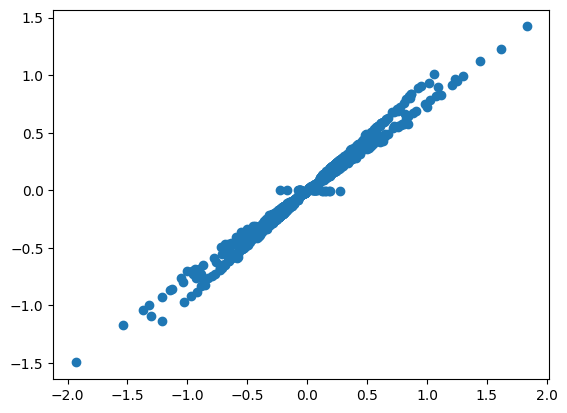

In [ ]:
print(utils.corrvecs(W1.ravel(),W2.ravel()))
_=plt.scatter(W1.ravel(),W2.ravel())

In [ ]:
n_batch = 512
T=100
K=1
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)


/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


tensor(0.8498)

In [ ]:
n_batch = 1
T=1000
K=1
Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)

/content/K_Bit_Flipflop_task.py:37: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  t_in = torch.tensor(t_in,dtype=torch.float32)


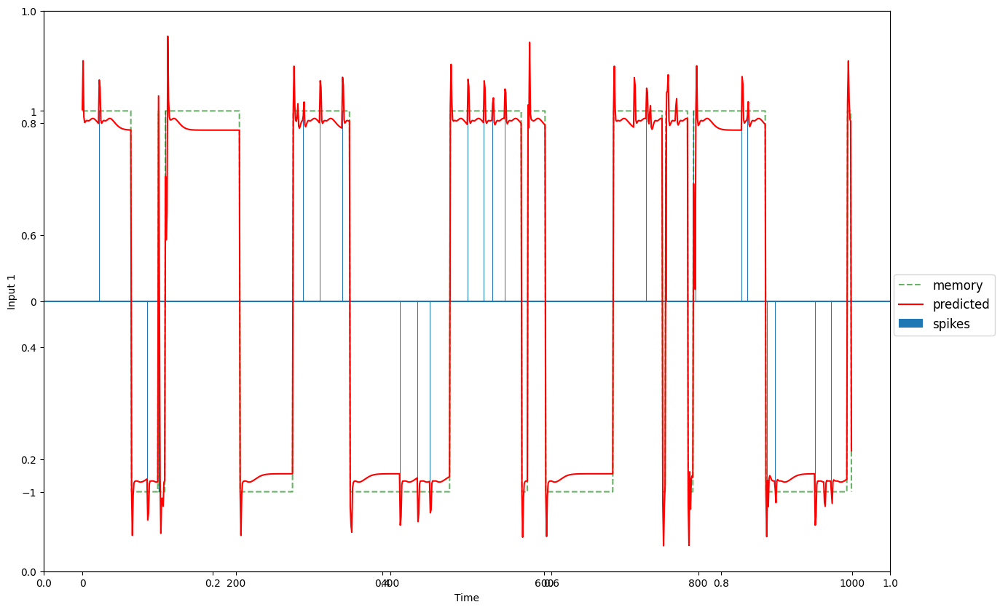

In [ ]:
K_Bit_Flipflop_task.draw_mem_charts(Inputs,Targets,lr_rnn2(Inputs,None)[0],idx=0,K=K,T=T)

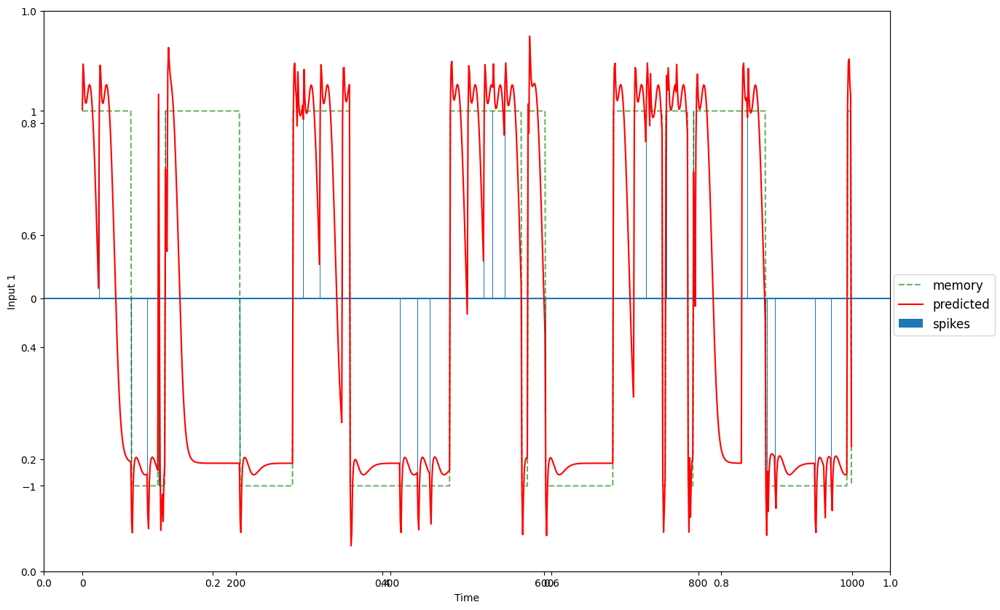

In [ ]:
K_Bit_Flipflop_task.draw_mem_charts(Inputs,Targets,lr_rnn2_eff(Inputs,None)[0],idx=0,K=K,T=T)

  0%|          | 0/3000 [00:00<?, ?it/s]

0 /10 --- loss = 0.057252, best = 0.057252


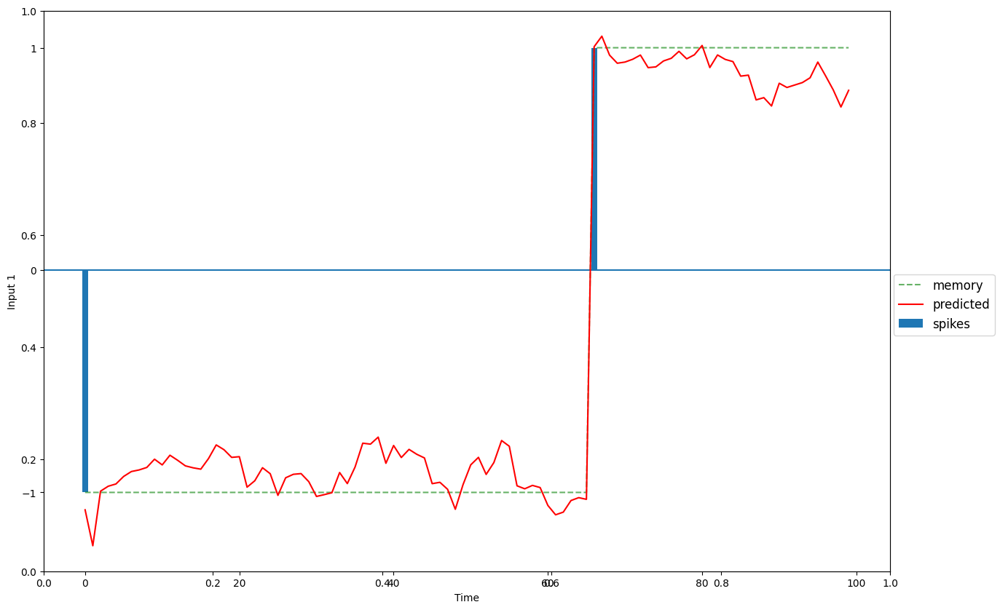

 10%|█         | 300/3000 [01:36<12:17,  3.66it/s]

1 /10 --- loss = 0.049372, best = 0.048611


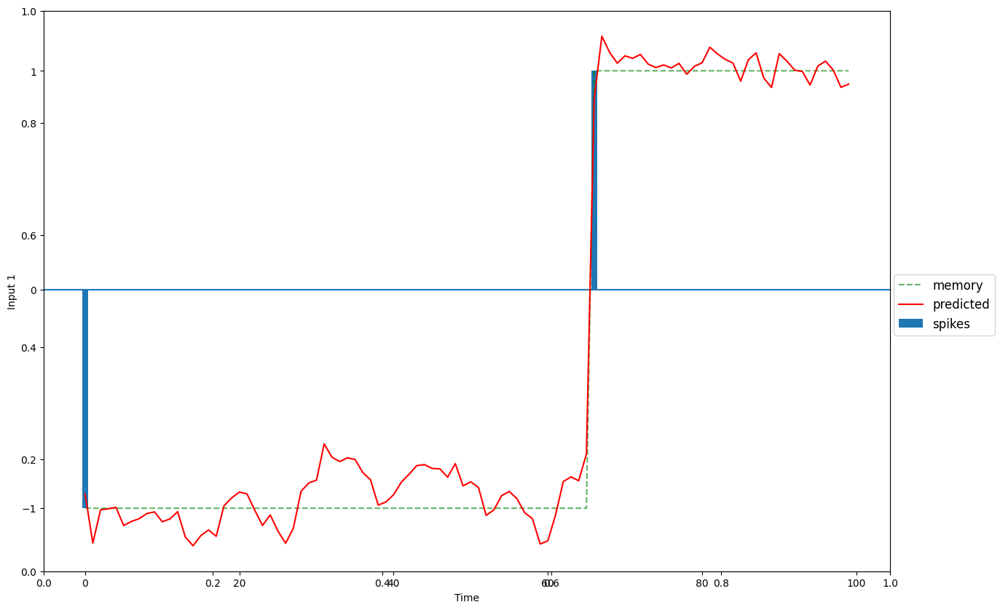

 20%|██        | 600/3000 [03:10<18:02,  2.22it/s]

2 /10 --- loss = 0.054133, best = 0.046714


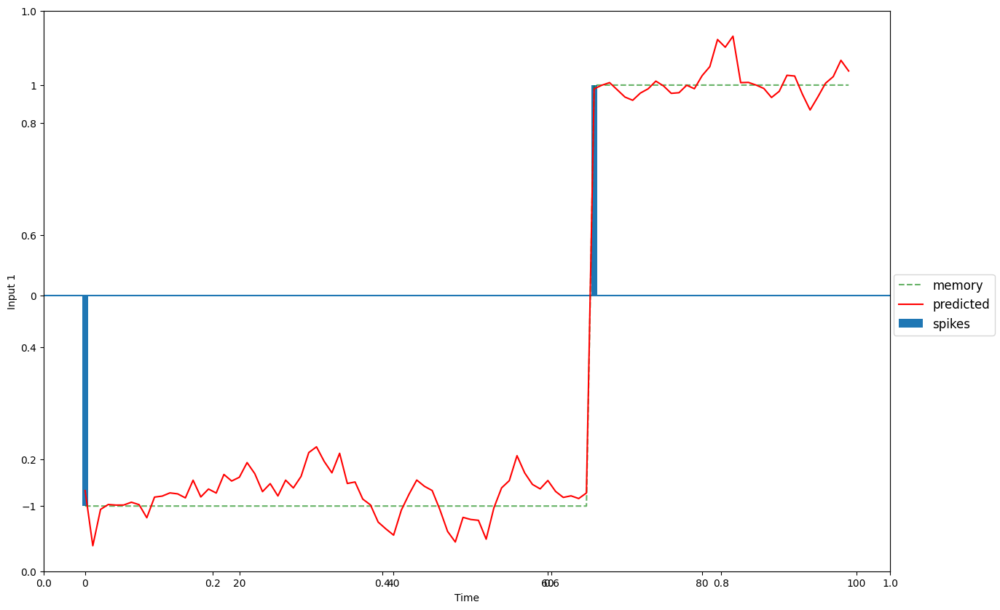

 30%|███       | 900/3000 [04:38<09:09,  3.82it/s]

3 /10 --- loss = 0.052520, best = 0.045857


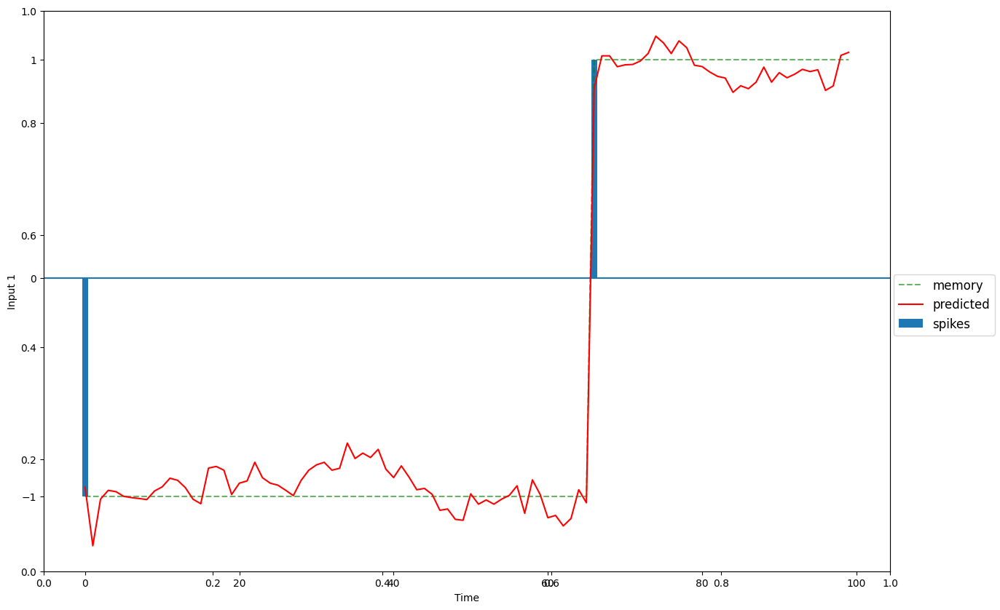

 40%|████      | 1200/3000 [06:08<07:44,  3.88it/s]

4 /10 --- loss = 0.050635, best = 0.044605


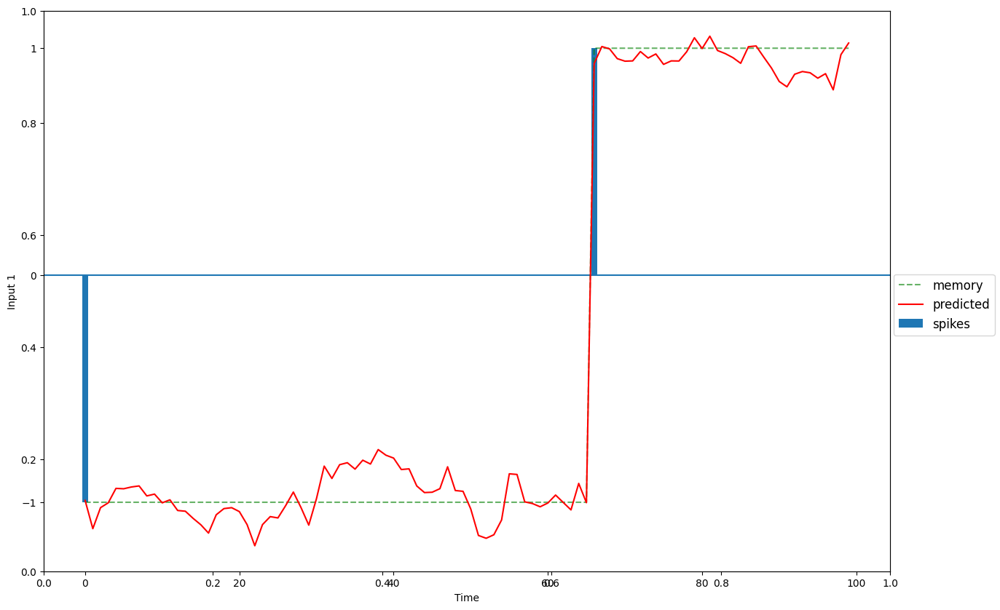

 50%|█████     | 1500/3000 [07:37<06:02,  4.14it/s]

5 /10 --- loss = 0.049151, best = 0.044371


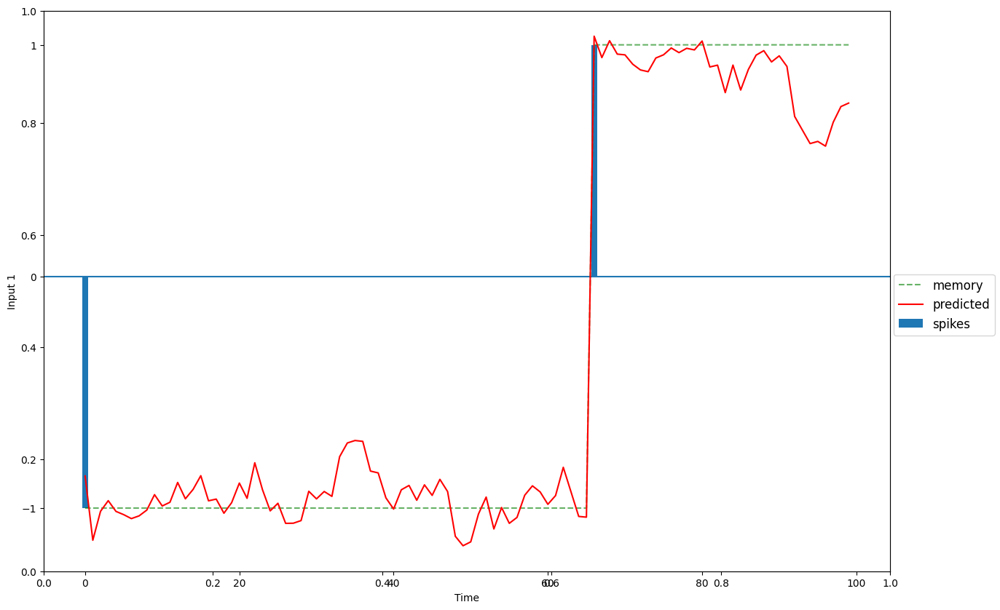

 60%|██████    | 1800/3000 [09:11<05:06,  3.91it/s]

6 /10 --- loss = 0.048154, best = 0.044159


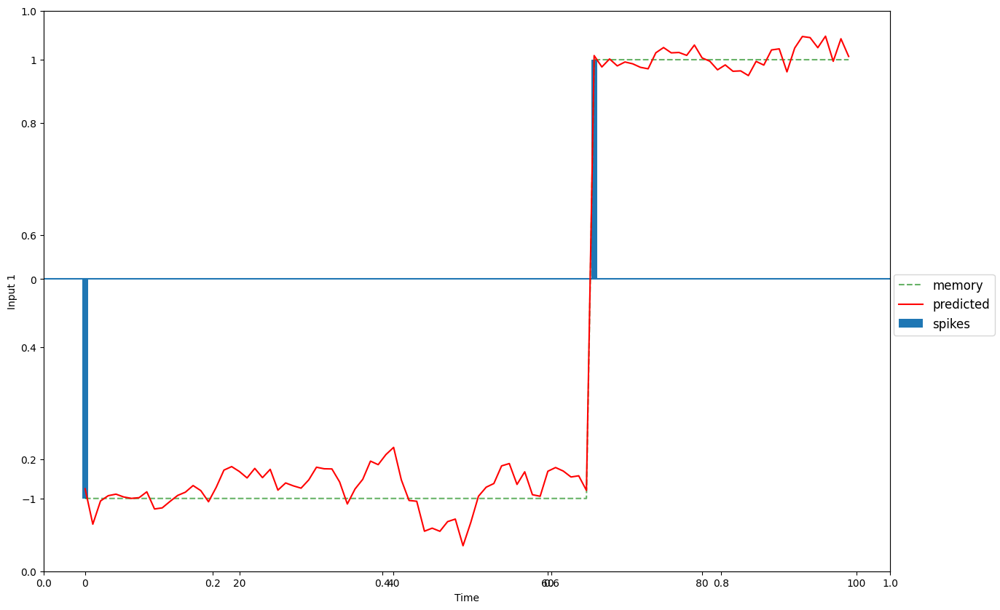

 70%|███████   | 2100/3000 [10:42<04:17,  3.50it/s]

7 /10 --- loss = 0.045093, best = 0.042952


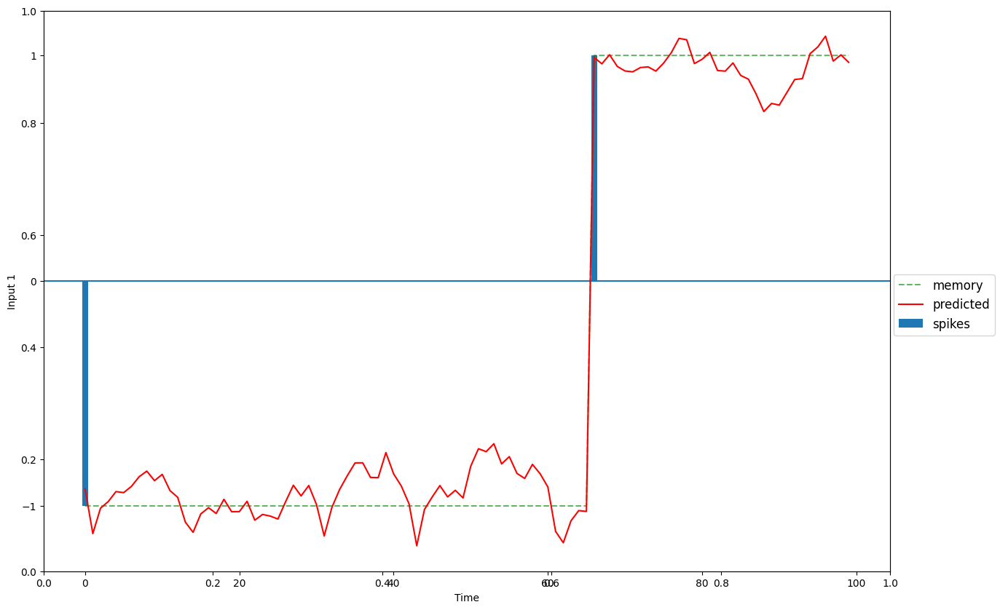

 80%|████████  | 2400/3000 [12:13<04:58,  2.01it/s]

8 /10 --- loss = 0.045250, best = 0.041997


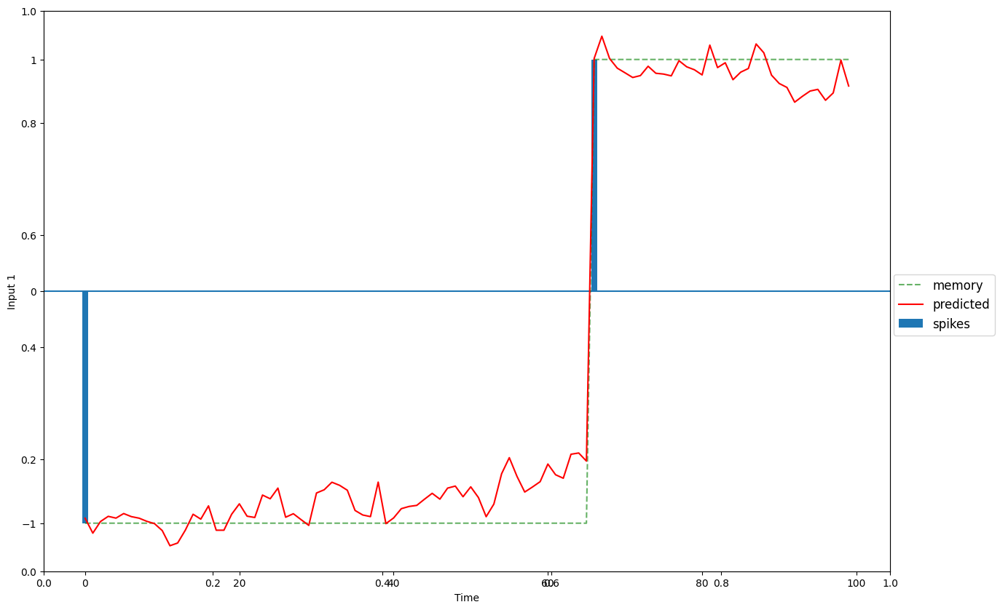

 90%|█████████ | 2700/3000 [13:36<01:39,  3.02it/s]

9 /10 --- loss = 0.043710, best = 0.041679


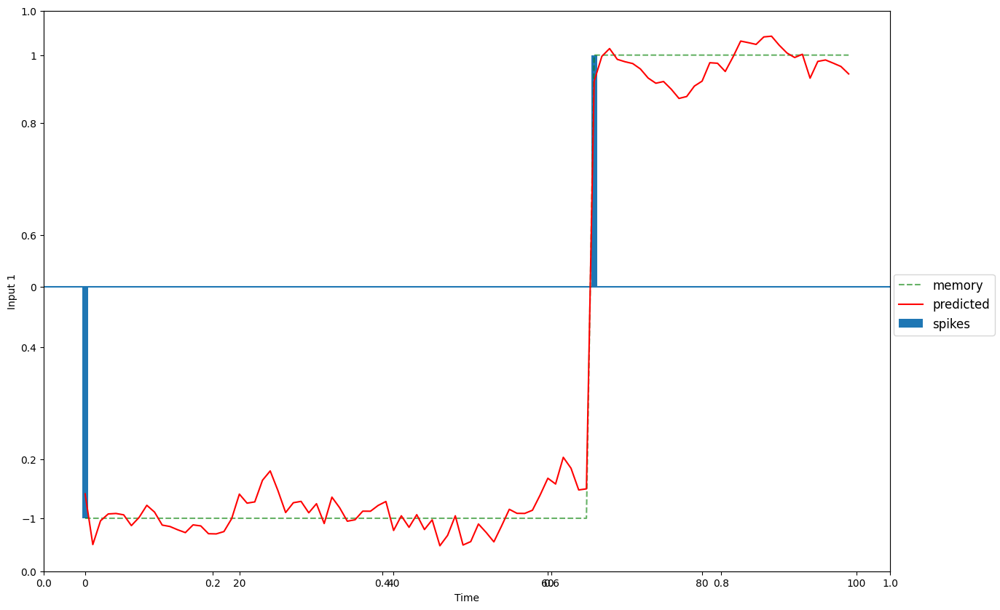

100%|██████████| 3000/3000 [15:01<00:00,  3.33it/s]

Loss:  0.04729866981506348


In [ ]:
# MSE loss and Adam optimizer with a learning rate
lr=1e-03
criterion = nn.MSELoss().to(DEVICE)
optimizer = torch.optim.Adam(lr_rnn1.parameters(), lr=lr)

# train parameters
n_steps = 3000
n_batch = 512

# generate new data
# Inputs, Targets = K_Bit_Flipflop_task.generate_mem_data(n_batch,T,K)
losses = lr_rnn1.train(Inputs,Targets,n_steps,optimizer,criterion,batch_size=n_batch,T=T,reg=False)

  0%|          | 0/1000 [00:00<?, ?it/s]

0 /10 --- loss = 0.047937,reg = 0.075572 best = 0.047937


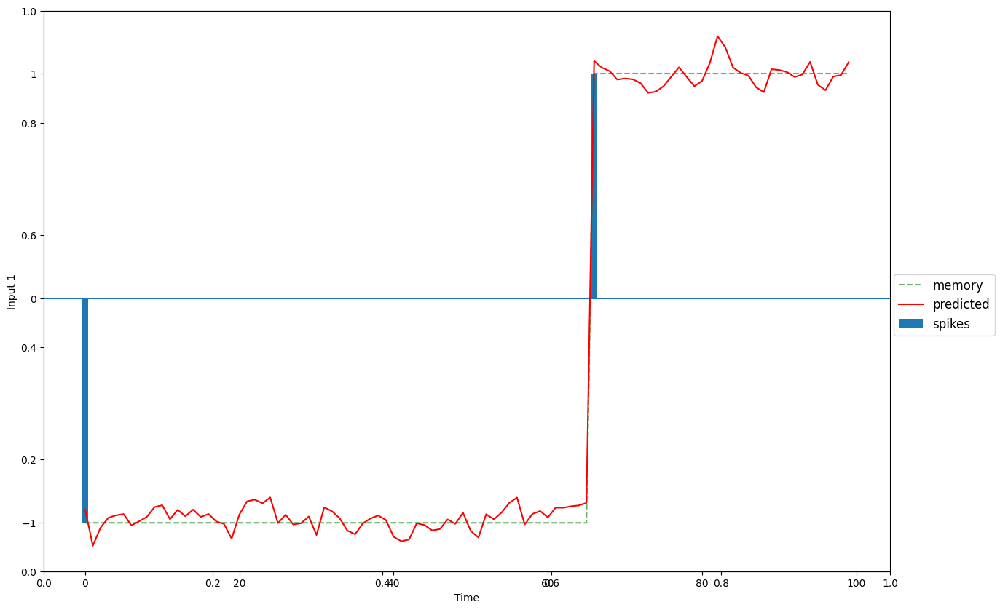

 10%|█         | 100/1000 [00:36<04:28,  3.35it/s]

1 /10 --- loss = 0.051357,reg = 0.001295 best = 0.041671


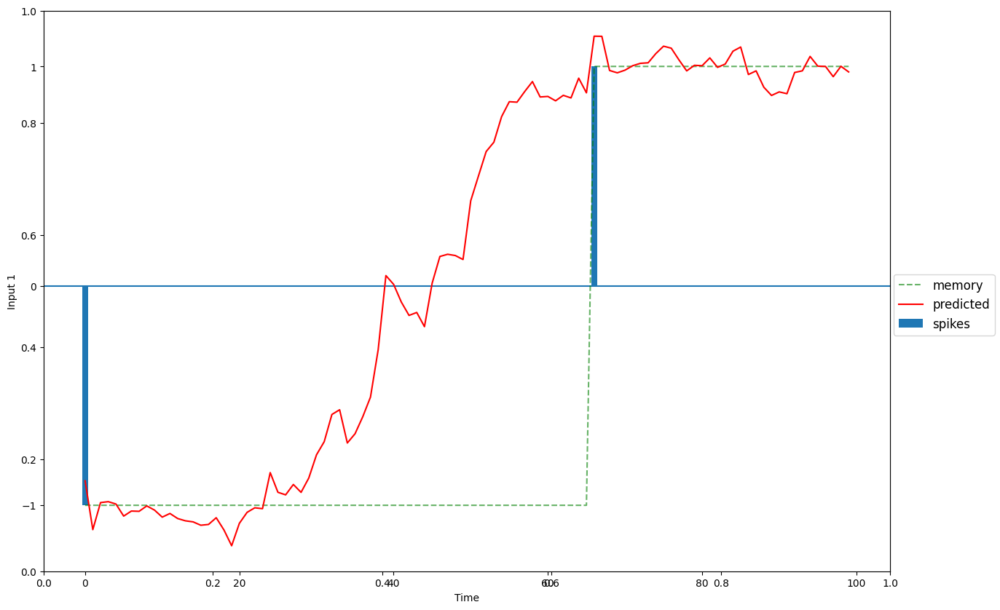

 20%|██        | 200/1000 [01:06<03:19,  4.01it/s]

2 /10 --- loss = 0.046388,reg = 0.000068 best = 0.041485


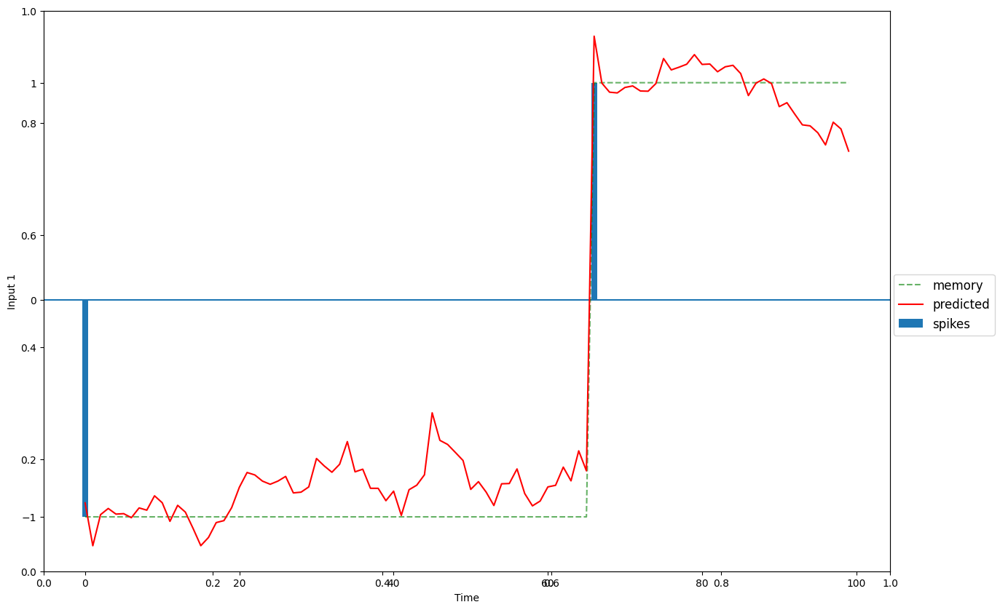

 30%|███       | 300/1000 [01:36<04:02,  2.88it/s]

3 /10 --- loss = 0.045950,reg = 0.000130 best = 0.041207


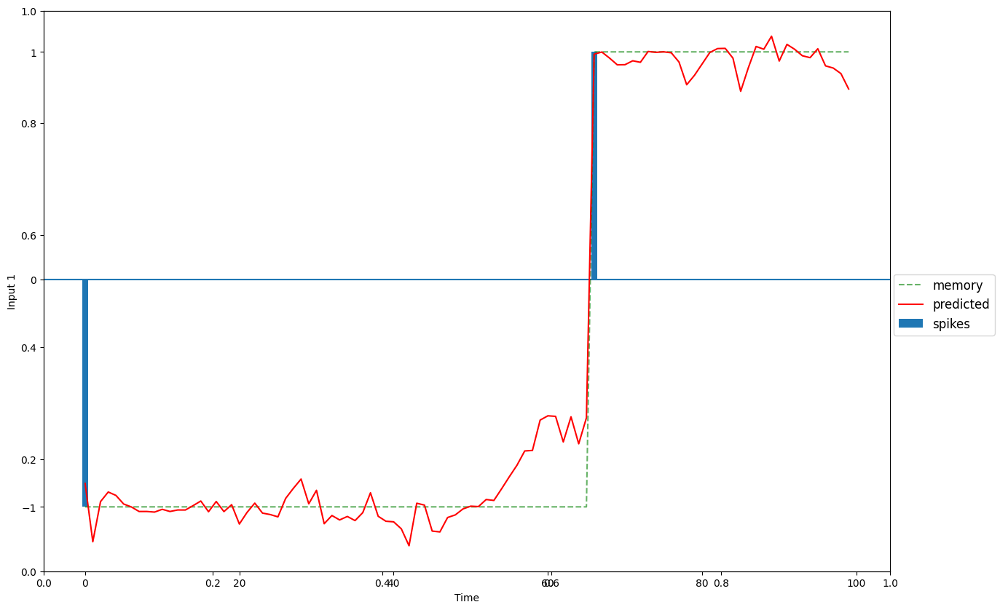

 40%|████      | 400/1000 [02:08<03:05,  3.23it/s]

4 /10 --- loss = 0.045624,reg = 0.000096 best = 0.041207


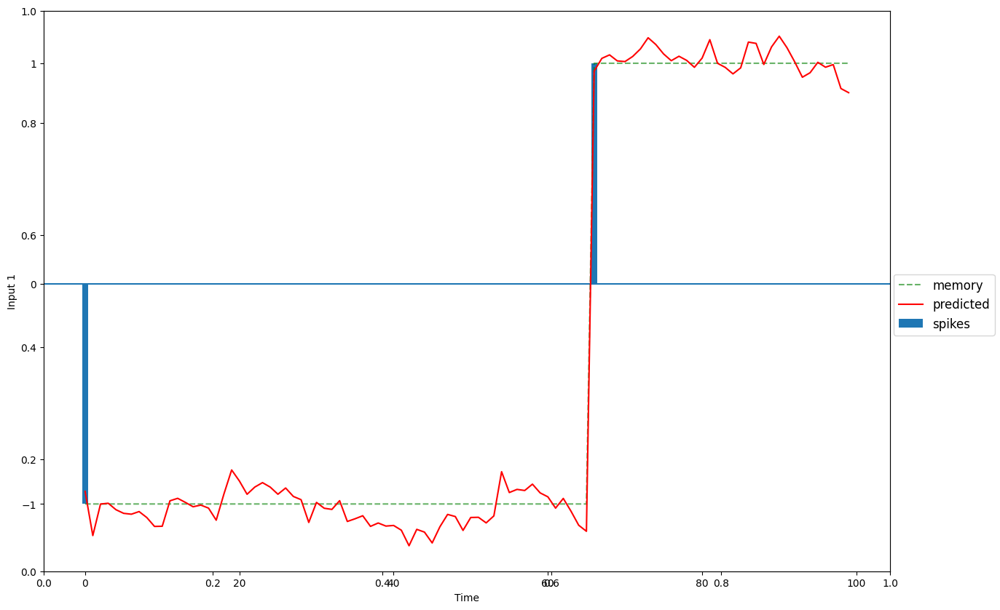

 50%|█████     | 500/1000 [02:39<02:11,  3.81it/s]

5 /10 --- loss = 0.049962,reg = 0.000041 best = 0.041207


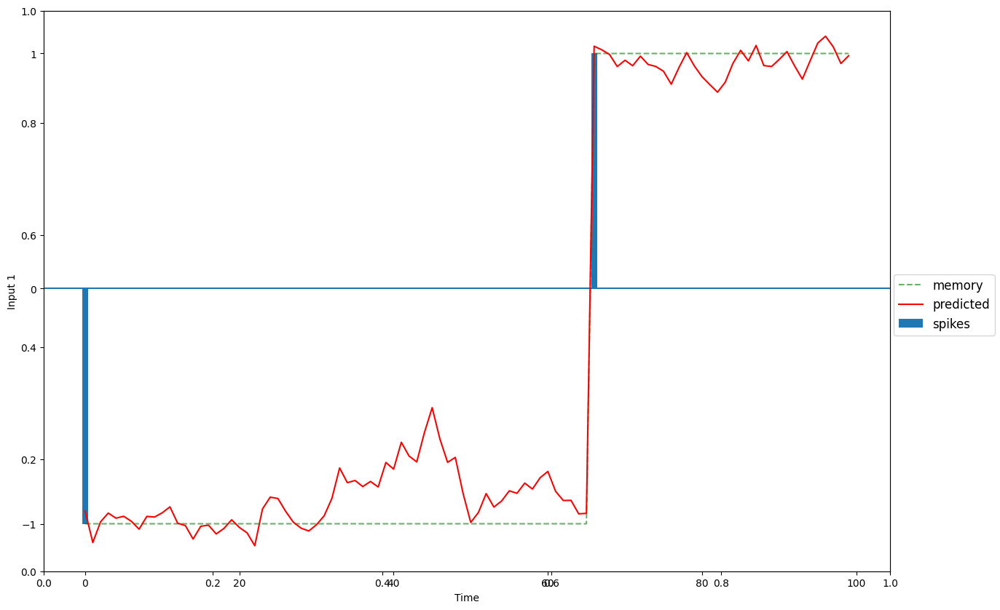

 60%|██████    | 600/1000 [03:08<01:46,  3.77it/s]

6 /10 --- loss = 0.047106,reg = 0.000034 best = 0.040988


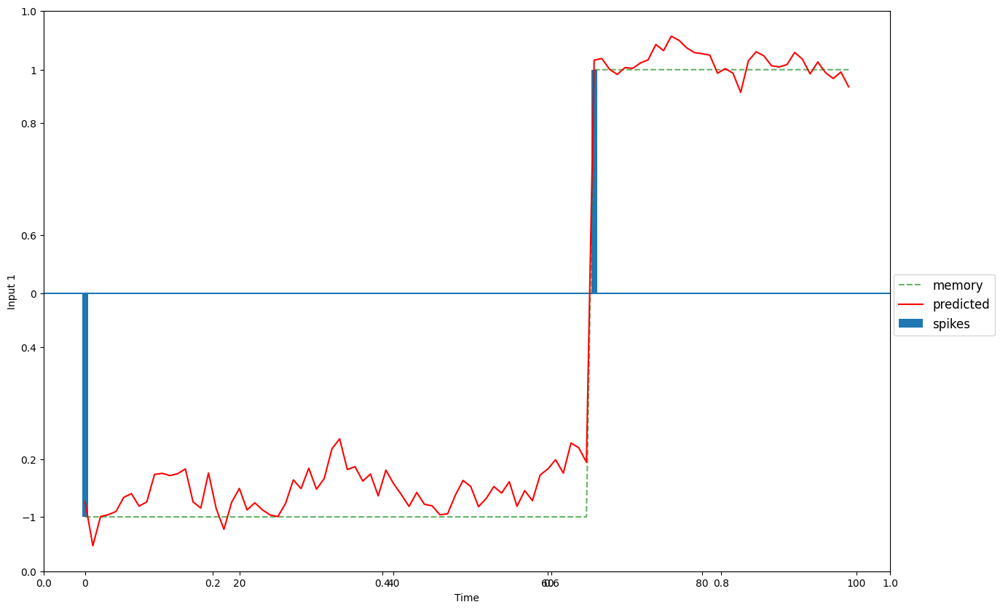

 70%|███████   | 700/1000 [03:38<01:19,  3.79it/s]

7 /10 --- loss = 0.046420,reg = 0.000133 best = 0.040988


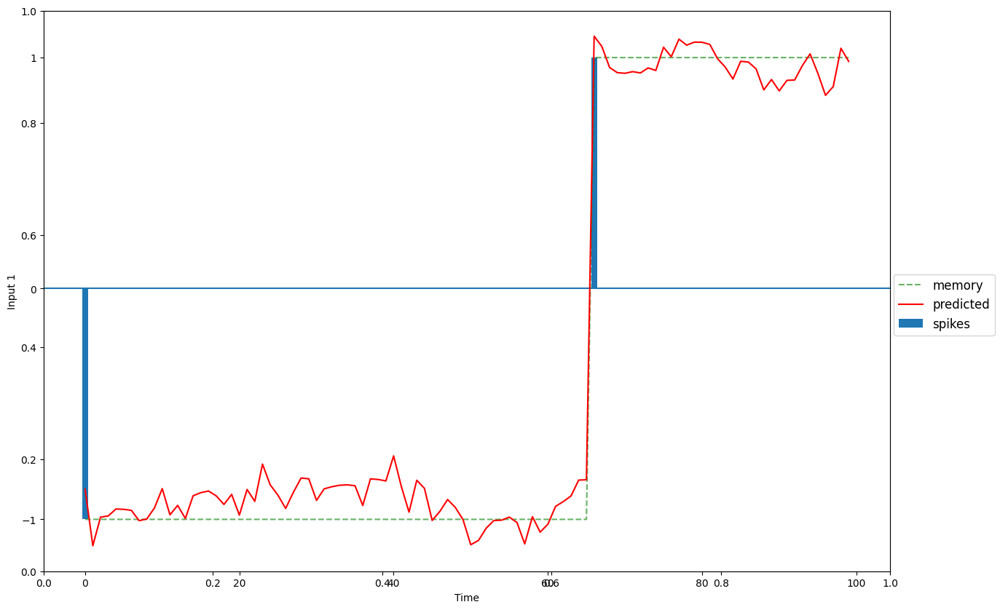

 80%|████████  | 800/1000 [04:11<00:59,  3.37it/s]

8 /10 --- loss = 0.044744,reg = 0.000072 best = 0.040988


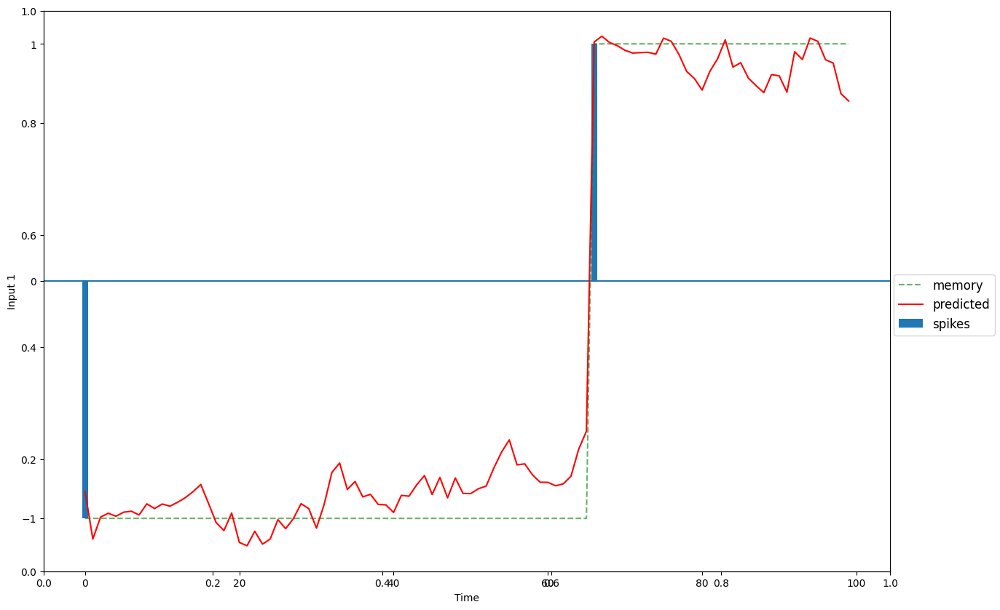

 90%|█████████ | 900/1000 [04:40<00:25,  3.92it/s]

9 /10 --- loss = 0.043193,reg = 0.000018 best = 0.040601


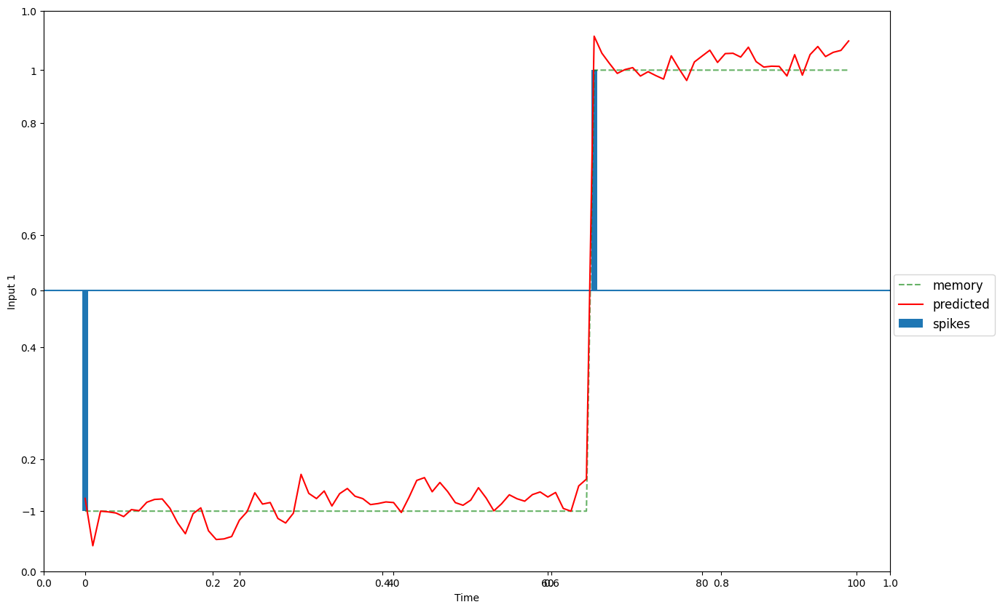

100%|██████████| 1000/1000 [05:09<00:00,  3.23it/s]

Loss:  0.04833720624446869


In [ ]:
losses += lr_rnn1.train(Inputs,Targets,1000,optimizer,criterion,batch_size=n_batch,T=T,reg=True)